### taufit: model and extract the damping timescale in AGN light curves using celerite

Fit DRW and extract $\tau_{\rm DRW}$ using AGN light curves from Kelly et al. (2009).

In [1]:
%matplotlib inline
import sys, os, glob
import numpy as np
import matplotlib.pyplot as plt
from astropy import units as u
import astropy.constants as const
import pandas as pd
from astropy.coordinates import SkyCoord
from astropy.coordinates import concatenate
plt.rcParams['axes.linewidth'] = 1.5
from astropy.io import fits
import matplotlib.ticker as ticker

import matplotlib

In [2]:
from taufit import simulate_drw as simulate_drw
from taufit import fit_drw, fit_carma, fit_celerite, hampel_filter, plot_celerite
import corner

In [3]:
from loaddat import load_everything
# Re-run if you get SIMBAD timeout error
out_all = load_everything()

/home/s1/cburke/taufit/loaddat.py:816: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  return np.array([name, c.ra.deg, c.dec.deg, mass, masserr, z, log_L5100, log_L5100err, band, unit, x, y, yerr, True, LCref, Lref, massref])
/home/s1/cburke/taufit/loaddat.py:323: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  return  np.array([namei, c.ra.deg, c.dec.deg, mass, masserr, z, log_L5100, log_L5100err, band, unit, x, y, yerr, True, LCref, Lref, massref])
/home/s1/cburke/taufit/loaddat.py:388: VisibleDeprecationWarning: Creating an ndarray from ragged nested

data/local_rm/PG1307+085.fits
pg1307+085
PG 1307+085
data/local_rm/PG1247+267.fits
pg1247+267
PG 1247+267
data/local_rm/ngc4253.fits
ngc4253
NGC 4253
data/local_rm/ngc7469.fits
ngc7469
NGC 7469
data/local_rm/mrk382.fits
mrk382
Mrk 382
data/local_rm/mrk290.fits
mrk290
Mrk 290
data/local_rm/PG0844+349.fits
pg0844+349
PG 0844+349
data/local_rm/S5 0836+71.fits
s5 0836+71
S5 0836+71
data/local_rm/PG1229+204.fits
pg1229+204
PG 1229+204
data/local_rm/PG0953+414.fits
pg0953+414
PG 0953+414
data/local_rm/ngc4593.fits
ngc4593
NGC 4593
data/local_rm/3c390.fits
data/local_rm/ngc5273.fits
ngc5273
NGC 5273
data/local_rm/ngc5940.fits
ngc5940
data/local_rm/mrk202.fits
mrk202
Mrk 202
data/local_rm/mrk50.fits
mrk50
Mrk 50
data/local_rm/mrk486.fits
mrk486
Mrk 486
data/local_rm/PG1617+175.fits
pg1617+175
PG 1617+175
data/local_rm/can2020agn.fits
data/local_rm/ngc3227.fits
ngc3227
NGC 3227
data/local_rm/mrk6.fits
mrk6
Mrk 6
data/local_rm/PG1426+015.fits
pg1426+015
PG 1426+015
data/local_rm/PG0052+251.fits


/home/s1/cburke/taufit/loaddat.py:1308: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  out.append(np.array([name, c.ra.deg, c.dec.deg, mass, masserr, z, log_L5100, log_L5100err, band, unit, mjd, Vmag, Vmagerr, True,  LCref, Lref, massref]))
<__array_function__ internals>:5: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.


In [22]:
# DEFINE THE FITTING FUNCTION
from astropy.timeseries import LombScargle
from scipy.stats import binned_statistic
from scipy.optimize import curve_fit
import matplotlib.gridspec as gridspec
from IPython.display import clear_output


def clean_and_fit_drw(dfi, nburn=5, nsamp=5, save=True, load=False, nsamp_psd=100, carma=False):
    #if dfi['name']!='arp151':
    #    return 0, 0, 0, 0, 0, \
    #    0, 0, 0, 0, \
    #    0, 0, 0, 0
        
    print(dfi)
    
    # Load previous samples or fit DRW
    name = str(dfi.name)
    x = dfi.x
    y = dfi.y
    yerr = dfi.yerr
    band = dfi.band
    unit = dfi.unit
    z = float(dfi.z)
    # Use index not name to get repeats!!
    samples_filepath = "/data/des80.a/data/cburke/samples/%s" % name
    
    # Clean data
    mask_pos = (y>0)
    x = np.array(x)[mask_pos]
    y = np.array(y)[mask_pos]
    yerr = np.array(yerr)[mask_pos]

    # Sort data
    ind = np.argsort(x)
    x = x[ind]; y = y[ind]; yerr = yerr[ind]

    # Outlier rejection
    x, y, outlier_mask = hampel_filter(x, y, 150, 3)
    yerr = yerr[~outlier_mask]
    # Fit DRW (always fit a white noise term to capture any excess white noise)

    if band == 'TESS' or band=='kepler':
        y = y

    x = x - np.min(x)

    if load and os.path.exists("%s.npy" % samples_filepath):
        gp, samples, fig_drw = fit_drw(x*u.day, y*u.mag, yerr*u.mag, verbose=False, seed=50, jitter=True, nburn=1, nsamp=1)
        samples = np.load("%s.npy" % samples_filepath)
    else:
        if carma==False:
            gp, samples, fig_drw = fit_drw(x*u.day, y*u.mag, yerr*u.mag, verbose=False, seed=50, jitter=True, nburn=nburn, nsamp=nsamp)
        else:
            init = [-4,-10,-5,-10,-6,-10,-5,-10,-6,-10,-5,-10,-5]
            gp, samples, fig_drw = fit_carma(x*u.day, y*u.mag, yerr*u.mag, p=3, init=init, verbose=False, seed=50, jitter=True, nburn=nburn, nsamp=nsamp)

    baseline = np.max(x)-np.min(x)

    tau_br = 0
    tau_br_lo = 0
    tau_br_hi = 0

    # Corner plot
    fig_corner, axs = plt.subplots(3,3, figsize=(5,5))
    # Corner plot (note these are natural logs)
    # Structure function variables
    # sigma = sqrt(a/2), tau_DRW = 1/c, SFinf = sigma_hat*np.sqrt(tau/250)
    
    # dtau
    #dtau = - np.median(1/np.exp(samples[:,1])) + dfi.tau_rest_mle
    #taupost = np.log10(1/np.exp(samples[:,1]) + dtau)
    
    samples_sf = [np.log10(np.sqrt(np.exp(samples[:,0]/2))), np.log10(1/np.exp(samples[:,1])), np.log10(np.exp(samples[:,2]))]
    samples_sf = np.array(samples_sf).T
    fig_corner = corner.corner(samples_sf, show_titles=False, fig=fig_corner, # quantiles=[0.16,0.84],
    labels = [r"$\log_{10}\ \sigma_{\rm{DRW}}$", r"$\log_{10}\ \tau_{\rm{DRW}}$", r"$\log_{10}\ \sigma_{\rm{n}}$"],
    label_kwargs = dict(fontsize=18), title_kwargs=dict(fontsize=10));
    # Ticks in
    axs = np.array(fig_corner.axes).reshape((3, 3))
    for i in range(3):
        for j in range(3):
            ax = axs[i,j]
            ax.tick_params('both',labelsize=12)
            ax.tick_params(axis='both', which='both', direction='in')
            ax.tick_params(axis='both', which='major', length=6)
            ax.tick_params(axis='both', which='minor', length=3)

    # Draw bad tau region
    axs[1,1].axvspan(np.log10(0.2*baseline), np.log10(10*baseline), color= "red", zorder=-5, alpha=0.2)
    axs[2,1].axvspan(np.log10(0.2*baseline), np.log10(10*baseline), color= "red", zorder=-5, alpha=0.2)
    axs[0,0].annotate("B", fontsize=18, weight='bold', xy=(0.05, 0.85), xycoords="axes fraction")

    if nsamp_psd > 0:
        # Add gridspec to corner figure (HACK!!)

        # PSD
        gs = gridspec.GridSpec(ncols=4, nrows=4, figure=fig_corner)
        ax_psd = fig_corner.add_subplot(gs[:, -1])
        fig_corner.set_size_inches([6,6])
        # Move the subplot over
        box = ax_psd.get_position()
        box.x0 = box.x0 + 0.4
        box.x1 = box.x1 + 1.2
        ax_psd.set_position(box)

        # Light curve
        ax_lc = fig_corner.add_subplot(gs[0, :])
        box = ax_lc.get_position()
        box.x0 = box.x0 + 0.2
        box.x1 = box.x1 + 1.0
        box.y0 = box.y0 + 0.4
        box.y1 = box.y1 + 0.9
        ax_lc.set_position(box)

        s = np.median(samples, axis=0)
        gp.set_parameter_vector(s)
        kernel = gp.kernel

        pad = 0.05*baseline # 5% padding for plot
        t_eval = np.linspace(np.min(x) - pad, np.max(x) + pad, 500)
        mu, var = gp.predict(y, t_eval, return_var=True)
        std = np.sqrt(var)

        # Light curve & prediction
        ax_lc.errorbar(x, y, yerr=yerr, c='k', fmt='.', alpha=0.75, elinewidth=1, label=dfi['name'])
        ax_lc.fill_between(t_eval, mu+std, mu-std, color="#ff7f0e", alpha=0.3, label='DRW prediction')

        ax_lc.set_xlim(np.min(t_eval), np.max(t_eval))
        ax_lc.set_xlabel("Time (days)", fontsize=20)
        if unit == 'mag':
            ax_lc.set_ylabel("$%s$ (%s)" % (band, unit), fontsize=20)
            ax_lc.set_ylim(np.nanmax(mu+std) + 0.2, np.nanmin(mu-std) - 0.2)
        else:
            ax_lc.set_ylabel("Flux (%s)" % unit, fontsize=20)
            #ax_lc.set_ylim(0.8*np.nanmin(mu-std), 1.2*np.nanmax(mu+std))
        handles, labels = plt.gca().get_legend_handles_labels()
        order = [1,0]
        ax_lc.legend([handles[idx] for idx in order],[labels[idx] for idx in order], fontsize=16, loc=1)

        ax_lc.tick_params('both',labelsize=18)

        ax_lc.minorticks_on()
        ax_lc.tick_params(axis='both', which='both', direction='in')
        ax_lc.tick_params(axis='both', which='major', length=6)
        ax_lc.tick_params(axis='both', which='minor', length=3)
        ax_lc.xaxis.set_ticks_position('both')
        ax_lc.yaxis.set_ticks_position('both')
        
        ax_lc.annotate("A", fontsize=18, weight='bold', xy=(0.05, 0.9), xycoords="axes fraction")

        # PSD
        powerLSs = []
        fs = (1./(np.min(np.diff(x)[np.diff(x)>0])))
        fmin = 1/(2*np.pi*baseline)
        fmax = (1./(2*np.pi*np.mean(np.diff(x)[np.diff(x)>0])))
        noise_level = 2.0 * np.mean(np.diff(x)[np.diff(x)>0]) * np.mean(yerr ** 2)

        freqLS, powerLS = LombScargle(x, y, yerr).autopower(normalization='psd')
        #powerLS /= len(x) # Celerite units
        powerLS *= 2/(len(x)*fs) # lightkurve units [flux variance / frequency unit]
        ax_psd.loglog(freqLS, powerLS, c='grey', lw=1, alpha=0.3, label=r'PSD', drawstyle='steps-pre')

        # MC PSD
        for i in range(nsamp_psd):

            y_samp = y + np.random.normal(0, yerr)

            # Lomb-Scargle periodogram with PSD normalization
            freqLS, powerLS = LombScargle(x, y_samp, yerr).autopower(normalization='psd')
            powerLS *= 2/(len(x)*fs) # lightkurve units [flux variance / frequency unit]

            powerLSs.append(powerLS)

        # Compute credibility interval
        draws_credint = np.empty((len(freqLS), 3))
        draws_credint[:, 0] = np.percentile(powerLSs, 16, axis=0)
        draws_credint[:, 2] = np.percentile(powerLSs, 84, axis=0)
        draws_credint[:, 1] = np.median(powerLSs, axis=0)

        # Bin in equal log f
        bins = np.logspace(np.log10(freqLS[0]), np.log10(freqLS[-1])+1, 16)
        f_eval = np.logspace(np.log10(freqLS[0]), np.log10(freqLS[-1]), 150)
        draws_binned = np.empty((len(bins)-1, 3))
        draws_binned[:, 0], bin_edges, binnumber = binned_statistic(freqLS, draws_credint[:, 0], statistic='mean', bins=bins)
        draws_binned[:, 2], bin_edges, binnumber = binned_statistic(freqLS, draws_credint[:, 2], statistic='mean', bins=bins)
        draws_binned[:, 1], bin_edges, binnumber = binned_statistic(freqLS, draws_credint[:, 1], statistic='mean', bins=bins)

        psderr = np.array([draws_binned[:, 1] - draws_binned[:, 0], draws_binned[:, 2] - draws_binned[:, 1]])

        ax_psd.errorbar(bin_edges[:-1], draws_binned[:, 1], yerr=psderr, c='k',
                    lw=2, alpha=1, capsize=3, drawstyle='steps-mid', label=r'binned PSD')

        # Define broken power-law
        def _f(f, A, f_br, alpha, beta):
            return A/((f/f_br)**alpha + (f/f_br)**beta)

        taus_obs = 1/np.exp(samples[:,1])
        if 'tau_rest_mle' in dfi:
            print('MLE')
            f_drw_obs = 1/(2*np.pi*dfi.tau_rest_mle)
            f_drw_obs_lo = np.percentile(1/(2*np.pi*taus_obs), 16)
            f_drw_obs_hi = np.percentile(1/(2*np.pi*taus_obs), 84)
            f_drw_obs_e_sym = np.mean([f_drw_obs - f_drw_obs_lo, f_drw_obs_hi - f_drw_obs])
            f_drw_obs_lo = f_drw_obs - f_drw_obs_e_sym
            f_drw_obs_hi = f_drw_obs + f_drw_obs_e_sym
        else:
            f_drw_obs = np.median(1/(2*np.pi*taus_obs))
            f_drw_obs_lo = np.percentile(1/(2*np.pi*taus_obs), 16)
            f_drw_obs_hi = np.percentile(1/(2*np.pi*taus_obs), 84)

        bounds = np.array([(0.1*np.nanmax(draws_binned[:, 1]), 10*np.nanmax(draws_binned[:, 1])), (2*fmin,fmax), (-3, 0.0), (0.1,5)]).T
        p0 = np.array([np.nanmax(draws_binned[:, 1]), f_drw_obs, 0.0, 2.0])
        # Only fit where bins are finite
        mask_finite = np.isfinite(draws_binned[:, 1])
        # Pass on the last four bins (usually noise)
        mask_finite[-4:] = False
        bin_edges_finite = bin_edges[:-1][mask_finite]
        draws_med_finite = draws_binned[mask_finite, 1]
        psderr_finite = np.nanmean(psderr[:,mask_finite], axis=0)

        # Fit
        # https://stackoverflow.com/questions/14581358/getting-standard-errors-on-fitted-parameters-using-the-optimize-leastsq-method-i
        try:
            pfit, pcov = curve_fit(_f, bin_edges_finite, draws_med_finite, p0=p0,
                                   sigma=psderr_finite, bounds=bounds, maxfev=1000)
        except:
            # Try with no initial conditions
            pfit, pcov = curve_fit(_f, bin_edges_finite, draws_med_finite, 
                                   sigma=psderr_finite, bounds=bounds, maxfev=1000)
        # Error
        perr = [np.abs(pcov[i][i])**0.5 for i in range(len(pfit))]

        tau_br = 1/(2*np.pi*pfit[1])
        tau_br_lo = 1/(2*np.pi*(pfit[1] - perr[1]))
        tau_br_hi = 1/(2*np.pi*(pfit[1] + perr[1]))

        # Boost
        tau_br = tau_br/(1+z)
        tau_br_lo = tau_br_lo/(1+z)
        tau_br_hi = tau_br_hi/(1+z)
        
        if (tau_br-tau_br_lo) < tau_br:

            ax_psd.plot(f_eval, _f(f_eval, *pfit), color="r", lw=2, label='broken PL fit')
            xspan = np.linspace(pfit[1] - perr[1], pfit[1] + perr[1], 2)
            yval = 1.2*np.max(draws_med_finite)
            ax_psd.plot(xspan, [yval]*len(xspan), color='r', lw=2)
            opt = dict(color="r", 
                    arrowstyle = 'simple,head_width=.75,head_length=.75',
                    connectionstyle = 'arc3,rad=0')
            ax_psd.annotate('', xy=(pfit[1], 1.02*yval), xycoords='data', xytext=(pfit[1], 2.0*yval), textcoords='data', arrowprops=opt, size=10)
            order = [0,3,1,2]
        else:
            order = [0,2,1]
            
        xspan = np.linspace(f_drw_obs_lo, f_drw_obs_hi, 2)
        yval = 1.3*np.max(draws_med_finite)
        ax_psd.plot(xspan, [yval]*len(xspan), color="#ff7f0e", lw=2)
        opt = dict(color="#ff7f0e", 
                arrowstyle = 'simple,head_width=.75,head_length=.75',
                connectionstyle = 'arc3,rad=0')
        ax_psd.annotate('', xy=(f_drw_obs, 1.02*yval), xycoords='data', xytext=(f_drw_obs, 2.0*yval), textcoords='data', arrowprops=opt, size=10)

        # Plotting
        ax_psd.set_xlim([np.min(freqLS), np.max(freqLS)])
        ax_psd.set_ylim([0.5*np.nanmin(draws_binned[:, 0]), 10*np.nanmax(draws_binned[:, 2])])

        # The posterior PSD
        # Use the MLE solution if we have it
        if 'tau_rest_mle' in dfi:
            df = f_drw_obs - np.exp(samples[i,1])/(2*np.pi)
            psd_samples = np.empty((len(f_eval), len(samples)))
            psd_samples_old = np.empty((len(f_eval), len(samples)))
            for i, s in enumerate(samples):
                gp.set_parameter_vector(s)
                psd_samples[:, i] = kernel.get_psd(2*np.pi*(f_eval + df))/(2*np.pi)
                psd_samples_old[:, i] = kernel.get_psd(2*np.pi*f_eval)/(2*np.pi)
                
                imax = np.argmax(psd_samples[:,i])
                psd_samples[:imax, i] = np.max(psd_samples[:, i])
                
            # Compute credibility interval
            psd_credint = np.empty((len(f_eval), 3))
            psd_credint[:, 0] = np.percentile(psd_samples, 16, axis=1)
            psd_credint[:, 2] = np.percentile(psd_samples, 84, axis=1)
            psd_credint[:, 1] = np.median(psd_samples, axis=1)
            
            psd_credint_old = np.empty((len(f_eval), 3))
            psd_credint_old[:, 0] = np.percentile(psd_samples_old, 16, axis=1)
            psd_credint_old[:, 2] = np.percentile(psd_samples_old, 84, axis=1)
            psd_credint_old[:, 1] = np.median(psd_samples_old, axis=1)
            # 
            #psd_credint[f_eval < df, 0] = psd_credint_old[0, 0]
            #psd_credint[f_eval < df, 2] = psd_credint_old[0, 2]
            #psd_credint[f_eval < df, 1] = psd_credint_old[0, 1]
        else:
            psd_samples = np.empty((len(f_eval), len(samples)))
            for i, s in enumerate(samples):
                gp.set_parameter_vector(s)
                psd_samples[:, i] = kernel.get_psd(2*np.pi*f_eval)/(2*np.pi)
            # Compute credibility interval
            psd_credint = np.empty((len(f_eval), 3))
            psd_credint[:, 0] = np.percentile(psd_samples, 16, axis=1)
            psd_credint[:, 2] = np.percentile(psd_samples, 84, axis=1)
            psd_credint[:, 1] = np.median(psd_samples, axis=1)

        # Normalize Celerite PSD
        f_eval_norm = bin_edges_finite[len(bin_edges_finite)//3]
        psd_eval_norm = np.interp(f_eval_norm, f_eval, psd_credint[:, 1])
        f_norm = _f(f_eval_norm, *pfit)/psd_eval_norm
        psd_credint[:, 0] = psd_credint[:, 0]*f_norm
        psd_credint[:, 2] = psd_credint[:, 2]*f_norm
        psd_credint[:, 1] = psd_credint[:, 1]*f_norm
        
        psd_credint_old[:, 0] = psd_credint_old[:, 0]*f_norm
        psd_credint_old[:, 2] = psd_credint_old[:, 2]*f_norm
        psd_credint_old[:, 1] = psd_credint_old[:, 1]*f_norm

        # Plot Celerite PSD
        ax_psd.fill_between(f_eval, psd_credint[:, 2], psd_credint[:, 0], alpha=0.3, label='DRW PSD', color="#ff7f0e")
        #ax_psd.plot(f_eval, psd_credint[:, 1], alpha=0.3, label='DRW PSD', color="#ff7f0e")
        #ax_psd.fill_between(f_eval, psd_credint_old[:, 2], psd_credint_old[:, 0], alpha=0.3, label='DRW PSD OLD', color="grey")
        #ax_psd.plot(f_eval, psd_credint_old[:, 1], alpha=0.3, label='DRW PSD', color="grey")

        # Danger zone
        ax_psd.axvspan(np.min(freqLS), 1/(2*np.pi*0.2*baseline), color='red', zorder=-1, alpha=0.2)
        ax_psd.axvspan(fmax, np.max(freqLS), color='red', zorder=-1, alpha=0.2)

        # Plotting
        ax_psd.set_xlabel(r'Frequency (days$^{-1}$)', fontsize=20)
        ax_psd.set_ylabel(r'Power [(%s)$^2$ days]' % unit, fontsize=20)
        ax_psd.tick_params('both',labelsize=18)
        handles, labels = ax_psd.get_legend_handles_labels()

        ax_psd.legend([handles[idx] for idx in order],[labels[idx] for idx in order], fontsize=16, loc=1)
        ax_psd.minorticks_on()
        ax_psd.tick_params(axis='both', which='both', direction='in')
        ax_psd.tick_params(axis='both', which='major', length=6)
        ax_psd.tick_params(axis='both', which='minor', length=3)
        ax_psd.xaxis.set_ticks_position('both')
        ax_psd.yaxis.set_ticks_position('both')
        ax_psd.tick_params(axis='x', which='major', pad=7)
        ax_psd.annotate("C", fontsize=18, weight='bold', xy=(0.05, 0.9), xycoords="axes fraction")

        fig_timing = plt.gcf()

    # Save samples?
    if save:
        np.save(samples_filepath, samples)

    # 
    taus_obs = np.median(1/np.exp(samples[:,1]))

    # Get ACF
    fig_acf, ax = plt.subplots(1, 1, figsize=(10,5))
    wnoise_amp = 1.9/np.sqrt(len(x))
    lags, c, l, b = ax.acorr(y - np.mean(y), maxlags=None, lw=1, color='k')
    maxlag = (len(lags)-2)/2
    ax.fill_between([0, maxlag], 3*wnoise_amp, -3*wnoise_amp, facecolor='lightgrey')
    ax.set_ylabel(r'ACF', fontsize=18)
    ax.set_xlabel(r'Time Lag (days)', fontsize=18)
    ax.set_xlim(0, maxlag)
    ax.tick_params('both', labelsize=16)
    plt.show()

    acf = False
    if np.any(np.abs(c[lags>0]) > 3*wnoise_amp): # Use lags > 1 to be more robust
        acf = True
        
    # tau_rest = (1 + z)^(-1) * tau_obs
    taus_obs = 1/np.exp(samples[:,1])
    if carma:
        taus_obs = 1/np.exp(samples[:,2])
    taus_rest = (1 + z)**(-1)*taus_obs
    tau_rest = np.median(taus_rest)
    tau_obs = np.median(taus_obs)
    tau_rest_lo = np.percentile(taus_rest, 16)
    tau_rest_hi = np.percentile(taus_rest, 84)
    # Get cadence and baseline
    baseline = np.max(x)-np.min(x)
    cadence  = np.mean(np.diff(x))
    # Symmetrize error
    tauerr_rest_sym = np.mean([(tau_rest - tau_rest_lo), (tau_rest_hi - tau_rest)], axis=0)
    # d log10 y = 0.434 dy/y
    tauerr_rest_hi = tau_rest_hi - tau_rest
    tauerr_rest_lo = tau_rest - tau_rest_lo
    
    # Return sigma_DRW and sigma_jitter amplitudes
    # sigma = sqrt(a/2)
    sigma_drw = np.median(np.sqrt(np.exp(samples[:,0])/2))
    sigma_drw_lo = np.percentile(np.sqrt(np.exp(samples[:,0])/2), 16)
    sigma_drw_hi = np.percentile(np.sqrt(np.exp(samples[:,0])/2), 84)
    sigma_drw_err_sym = np.mean([(sigma_drw - sigma_drw_lo), (sigma_drw_hi - sigma_drw)], axis=0)
    # White noise
    sigma_wn = np.sqrt(np.mean(yerr)**2 + np.median(np.exp(samples[:,2]))**2)
    # possible problem is sigma_drw does not include the white noise part
    
    snr = sigma_drw/sigma_wn
    # Asymptotic variability amplitude SFinf = sigma sqrt(tau)
    SFinf = sigma_drw*np.sqrt(tau_obs)
    # Length
    if tau_obs < 1/(10)*baseline:
        len_good = True
    else:
        len_good = False
    # Cadence
    if tau_obs > 1*cadence:
        cadence_good = True
    else:
        cadence_good = False
        
    # Save timing figures
    if nsamp_psd > 0 and 'tau_rest_mle' in dfi:
        if dfi.valid:
            fig_timing.savefig('/data/des80.a/data/cburke/timing_hq_pdfs_rev/%s.pdf' % (name), dpi=300, bbox_inches='tight')
        else:
            # May need to prune the duplicates
            fig_timing.savefig('/data/des80.a/data/cburke/timing_pdfs_rev/%s.pdf' % (name), dpi=300, bbox_inches='tight')

    #return
    clear_output(wait=True)
    
    return baseline, cadence, tau_rest, tau_obs, tauerr_rest_sym, \
        tauerr_rest_hi, tauerr_rest_lo, sigma_drw, sigma_drw_err_sym, \
        snr, acf, len_good, cadence_good, tau_br, tau_br_lo, tau_br_hi


name                                                   Zw229-015
ra                                                       286.358
dec                                                      42.4612
z                                                         0.0279
log_M_BH                                                   6.913
log_M_BH_e                                                 0.097
log_L5100                                               39.00308
log_L5100_e                                            38.033043
band                                                           V
unit                                                         mag
x              [5625.073, 5650.036, 5656.032, 5666.99, 5674.0...
y              [16.109, 16.135, 16.122, 16.131, 16.154, 16.08...
yerr           [0.05, 0.031, 0.027, 0.012, 0.048, 0.004, 0.00...
RM                                                          True
LC_ref                                    Pancoast et al. (2019)
L_ref                    

/data/des90.a/data/cburke/conda/myenv/lib/python3.9/site-packages/emcee/moves/red_blue.py:99: RuntimeWarning: invalid value encountered in double_scalars
  lnpdiff = f + nlp - state.log_prob[j]


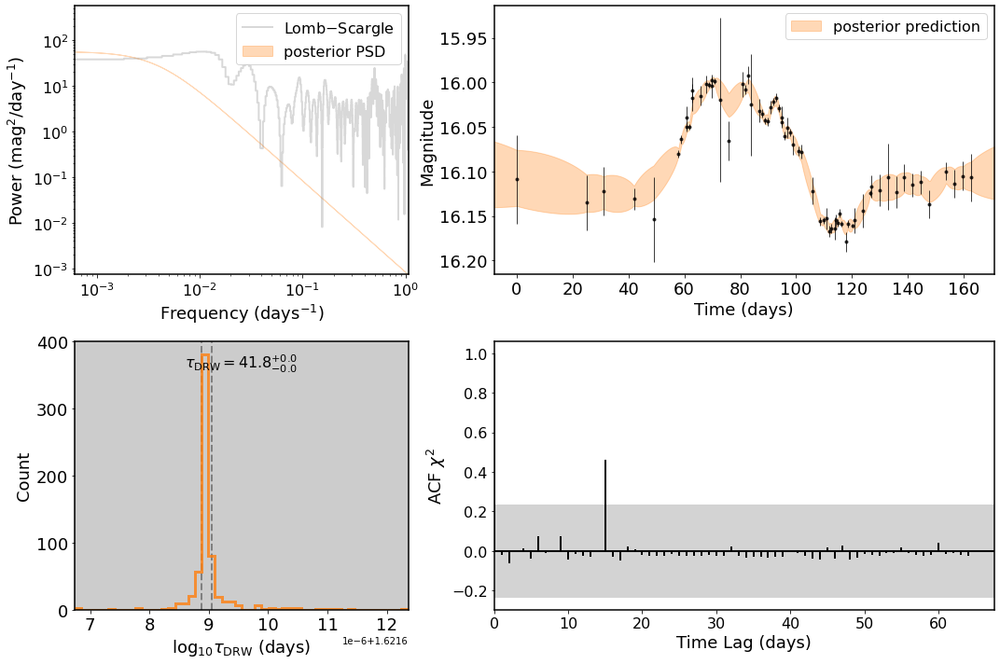

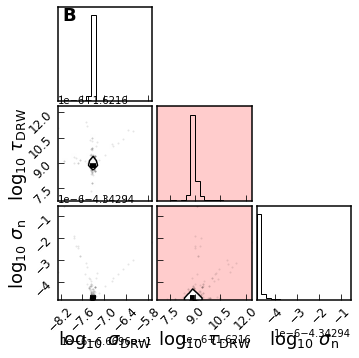

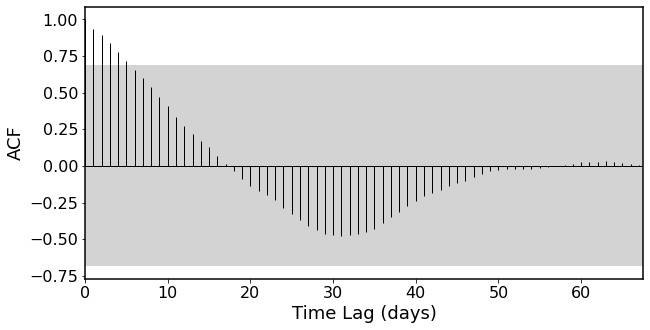

In [10]:
# FIND THE MLE SOLUTION
name, ra, dec, mass, mass_err, z, log_L5100, log_L5100err, band, unit, x, y, yerr, rm, LCref, Lref, massref = zip(*out_all)
# Create and save pandas dataframe
df_mle = pd.DataFrame(data={'name':name, 'ra':ra, 'dec':dec, 'z':z, 'log_M_BH':mass, 'log_M_BH_e':mass_err,
                            'log_L5100':log_L5100, 'log_L5100_e':log_L5100err, 'band':band, 'unit':unit, 'x':x, 'y':y,
                            'yerr':yerr, 'RM':rm, 'LC_ref': LCref, 'L_ref': Lref,'M_BH_ref': massref})
# Fit MLE
df_mle['baseline'], df_mle['cadence'], df_mle['tau_rest'], df_mle['tau_obs'], df_mle['tau_e_rest_sym'], \
df_mle['tau_e_rest_hi'], df_mle['tau_e_rest_lo'], df_mle['sigma_drw'], df_mle['sigma_drw_e_sym'], \
df_mle['SNR'], df_mle['ACF_good'], df_mle['length_good'], df_mle['cadence_good'], df_mle['tau_br'], df_mle['tau_br_lo'], df_mle['tau_br_hi'] \
= zip(*df_mle.apply(clean_and_fit_drw, nburn=5, nsamp=20, axis=1, nsamp_psd=0, load=False, save=False)) # MLE

# PICKLE FOR FUTURE USE
df_mle.to_pickle('df_mle_revision.pkl')

In [15]:
#df_mle = pd.read_pickle('df_mle.pkl') # tau_rest is the "MLE" solution
df_mle = pd.read_pickle('df_mle_revision.pkl') # tau_rest is the "MLE" solution
df_mle

,name,ra,dec,z,log_M_BH,log_M_BH_e,log_L5100,log_L5100_e,band,unit,...,tau_e_rest_lo,sigma_drw,sigma_drw_e_sym,SNR,ACF_good,length_good,cadence_good,tau_br,tau_br_lo,tau_br_hi
0,2.5873.82,79.119930,-68.617328,0.460000,8.410000,0.450000,45.190000,0.000000,V,mag,...,0.000940,0.059273,9.294159e-08,2.582839,True,False,True,0,0,0
1,NGC 4395,186.453600,33.546860,0.001064,3.959041,0.073923,39.760000,0.030000,TESS,$e^{-}$ s$^{-1}$,...,0.000006,3.257500,5.107876e-06,1.614728,True,True,True,0,0,0
2,25.3469.117,75.444510,-67.544948,0.380000,8.150000,0.450000,44.700000,0.000000,V,mag,...,0.000854,0.077137,1.209529e-07,3.139070,True,False,True,0,0,0
3,25.3712.72,75.723550,-67.429567,2.170000,9.040000,0.380000,45.830000,0.000000,V,mag,...,0.000080,0.066077,3.811814e-09,1.706882,True,False,True,0,0,0
4,30.11301.499,87.423470,-69.737740,0.460000,8.140000,0.560000,44.340000,0.000000,V,mag,...,0.000022,0.076229,4.397488e-09,0.708846,True,True,True,0,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
409,Mrk 40,171.400644,54.382536,0.021100,6.670000,0.049500,42.480000,0.110000,V,mag,...,0.000022,0.076700,4.424622e-09,4.585830,True,False,True,0,0,0
410,Mrk 50,185.850570,2.679015,0.023400,7.422000,0.062500,39.178540,38.400389,V,mag,...,0.000194,0.080548,1.263023e-07,3.421787,True,False,True,0,0,0
411,NGC 4593,189.914348,-5.344176,0.009000,6.882000,0.094000,42.870000,0.180000,V,mag,...,0.000073,0.088832,1.392912e-07,4.651742,True,False,True,0,0,0
412,PG 1310-108,198.274088,-11.128435,0.034300,6.480000,0.195000,39.658844,38.669185,V,mag,...,0.000360,0.046956,7.362893e-08,4.922013,True,False,True,0,0,0


In [30]:
df_mle[df_mle.LC_ref=='Burke et al. (2020)']

,name,ra,dec,z,log_M_BH,log_M_BH_e,log_L5100,log_L5100_e,band,unit,...,sigma_drw_e_sym,SNR,ACF_good,length_good,cadence_good,tau_br,tau_br_lo,tau_br_hi,valid,tau_rest_mle
1,NGC 4395,186.4536,33.54686,0.001064,3.959041,0.073923,39.76,0.03,TESS,$e^{-}$ s$^{-1}$,...,1.078347,1.614728,True,True,True,2,3,1,True,2.175117


In [13]:
len(out_all)

414

### Generate MLE Solution and Figures

In [23]:
df_mle.columns

Index(['name', 'ra', 'dec', 'z', 'log_M_BH', 'log_M_BH_e', 'log_L5100',
       'log_L5100_e', 'band', 'unit', 'x', 'y', 'yerr', 'RM', 'LC_ref',
       'L_ref', 'M_BH_ref', 'baseline', 'cadence', 'tau_rest', 'tau_obs',
       'tau_e_rest_sym', 'tau_e_rest_hi', 'tau_e_rest_lo', 'sigma_drw',
       'sigma_drw_e_sym', 'SNR', 'ACF_good', 'length_good', 'cadence_good',
       'tau_br', 'tau_br_lo', 'tau_br_hi', 'valid'],
      dtype='object')

name                                                       Zw229-015
ra                                                           286.358
dec                                                          42.4612
z                                                             0.0279
log_M_BH                                                       6.913
log_M_BH_e                                                     0.097
log_L5100                                                   39.00308
log_L5100_e                                                38.033043
band                                                               V
unit                                                             mag
x                  [5625.073, 5650.036, 5656.032, 5666.99, 5674.0...
y                  [16.109, 16.135, 16.122, 16.131, 16.154, 16.08...
yerr               [0.05, 0.031, 0.027, 0.012, 0.048, 0.004, 0.00...
RM                                                              True
LC_ref                            

/data/des90.a/data/cburke/conda/myenv/lib/python3.9/site-packages/emcee/moves/red_blue.py:99: RuntimeWarning: invalid value encountered in double_scalars
  lnpdiff = f + nlp - state.log_prob[j]


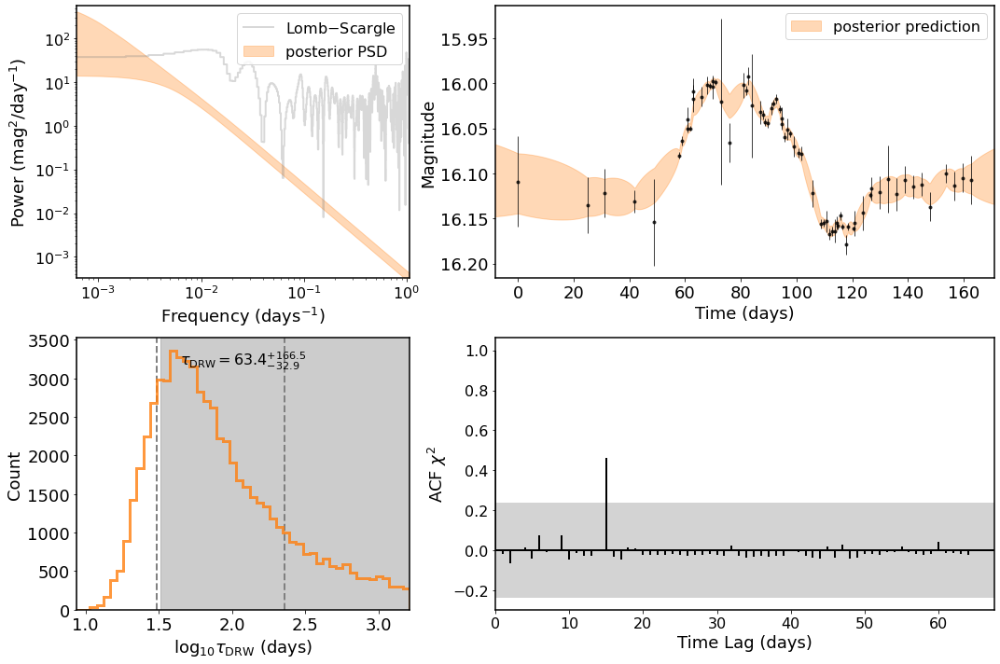

MLE


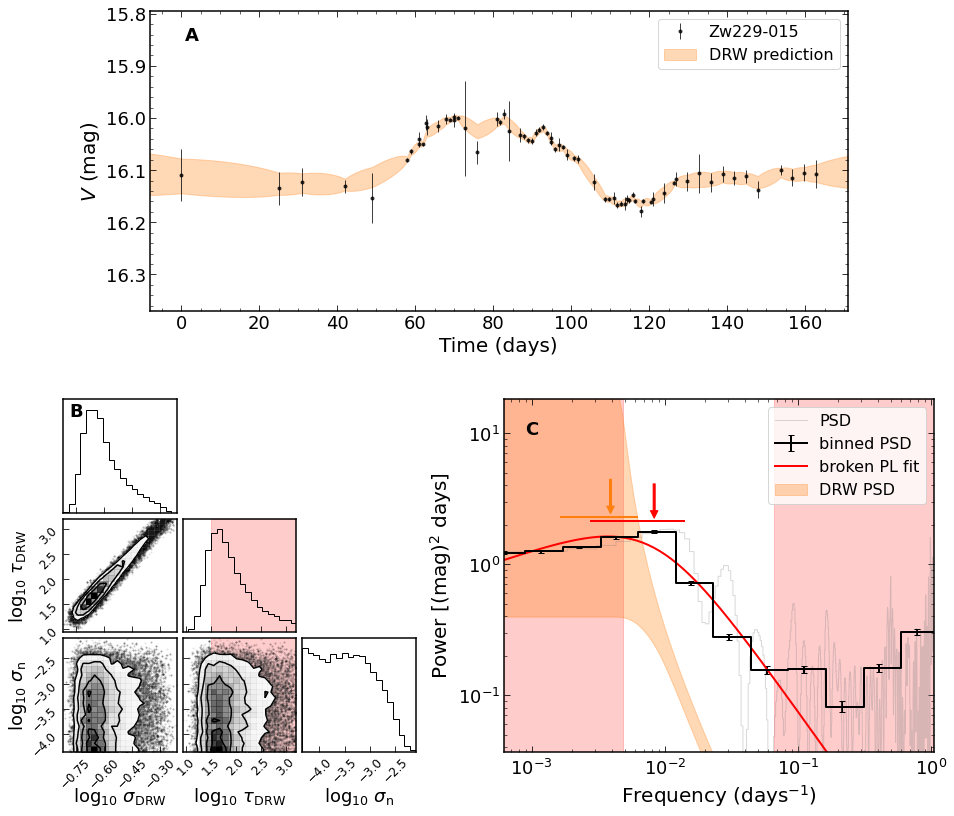

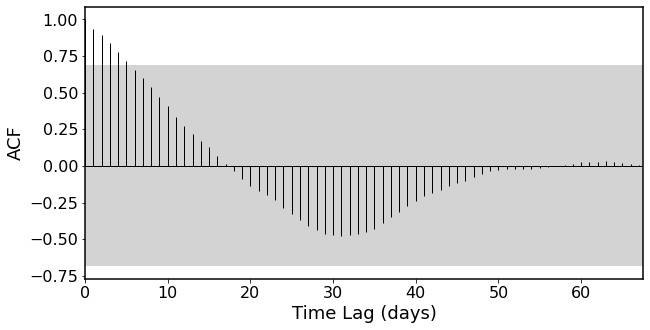

In [24]:
# Generate figures with MLE solution
name, ra, dec, mass, mass_err, z, log_L5100, log_L5100err, band, unit, x, y, yerr, rm, LCref, Lref, massref = zip(*out_all)

tau_rest_mle = df_mle['tau_rest'] # This is the MLE from the pickled df

mask_valid = (df_mle['tau_obs'] < 1/(10)*df_mle['baseline']) & (df_mle['tau_obs'] > 1*df_mle['cadence']) & \
             (df_mle['ACF_good']) & ~df_mle['log_M_BH'].isna() & (df_mle['SNR']>1)

df_mle['valid'] = mask_valid

# Keep the MLE solution
df_mle['tau_rest_mle'] = tau_rest_mle

# Fit MLE
baseline, cadence, tau_rest, tau_obs, tauerr_rest_sym, tauerr_rest_hi, \
tauerr_rest_lo, sigma_drw, sigma_drw_err_sym, snr, acf, length_good, cadence_good,\
tau_br, tau_br_lo, tau_br_hi = \
zip(*df_mle.apply(clean_and_fit_drw, nburn=500, nsamp=2000, axis=1, nsamp_psd=100, load=False, save=True)) # FULL MCMC (for figures and errors)

# Update the MLE data with new posteriors (to get error estimate)
for i_valid, i in enumerate(df_mle.index):
    df_mle.at[i, 'tau_obs'] = tau_obs[i_valid]
    df_mle.at[i, 'tau_rest'] = tau_rest[i_valid]
    df_mle.at[i, 'tau_e_rest_sym'] = tauerr_rest_sym[i_valid]
    df_mle.at[i, 'tau_e_rest_lo'] = tauerr_rest_lo[i_valid]
    df_mle.at[i, 'tau_e_rest_hi'] = tauerr_rest_hi[i_valid]
    df_mle.at[i, 'sigma_drw'] = sigma_drw[i_valid]
    df_mle.at[i, 'sigma_drw_e_sym'] = sigma_drw_err_sym[i_valid]
    df_mle.at[i, 'tau_br'] = tau_br[i_valid]
    df_mle.at[i, 'tau_br_lo'] = tau_br_lo[i_valid]
    df_mle.at[i, 'tau_br_hi'] = tau_br_hi[i_valid]
    
# Save DF minus light curves
df_csv = df_mle[mask_valid].copy()
df_csv.to_pickle('df_csv_revision.pkl')

#df_csv.drop(['x','y','yerr'], axis=1).to_csv('Burke+20_revision.csv')

df_mle.drop(['x','y','yerr'], axis=1).to_csv('Burke+20_all_revision.csv')


# scp -r cburke@des71.fnal.gov:/data/des80.a/data/cburke/timing_hq_pdfs .
# scp -r cburke@des71.fnal.gov:/data/des80.a/data/cburke/timing_pdfs .

# The command to merge them is:
# pdfunite $(ls -v *.pdf) output_hq.pdf
# pdfunite $(ls -v *.pdf) output_nonhq.pdf
# pdfunite timing_hq_pdfs_rev/output_hq.pdf timing_pdfs_rev/output_nonhq.pdf output_all.pdf
# scp cburke@des71.fnal.gov:/data/des80.a/data/cburke/output_all.pdf output_all.pdf 

In [25]:
# TODO: Save pickle of the new df_mle. df_csv_all_revision
df_mle.to_pickle('df_csv_all_revision.pkl')

In [77]:
df_csv_ordered = pd.concat([df_mle[mask_valid], df_mle[~mask_valid]]).reset_index()
df_out(df_csv_ordered,'Burke+20_all_revision')

<ipython-input-76-acb79dcafc1b>:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_tex.log_L5100_e[df_tex.log_L5100_e==0] = df_tex.log_L5100_e[df_tex.log_L5100_e==0]*0.2
<ipython-input-76-acb79dcafc1b>:58: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_tex.RM[df_tex.RM==True] = 'RM'


df_csv -> mle
['index', 'log_M_BH_e', 'log_L5100_e', 'tau_e_rest_sym', 'tau_e_rest_lo', 'tau_e_rest_hi', 'tau_rest_mle']
Index(['name', 'ra', 'dec', 'z', 'log_M_BH', 'log_L5100', 'band', 'RM',
       'LC_ref', 'L_ref', 'M_BH_ref', 'baseline', 'cadence', 'tau_rest', 'SNR',
       'ACF_good', 'valid'],
      dtype='object')
name            UGC 06728
ra               176.3164
dec               79.6815
z                  0.0065
log_M_BH      5.85 ± 0.24
log_L5100    41.86 ± 0.08
band                    g
RM                     RM
LC_ref               (50)
L_ref                (50)
M_BH_ref             (50)
baseline               44
cadence              1.83
tau_rest        0.7 ± 0.9
SNR                  6.21
ACF_good            False
valid               False
Name: 311, dtype: object
name         MCG-06-30-15
ra               203.9740
dec              -34.2956
z                  0.0077
log_M_BH      6.20 ± 0.11
log_L5100    41.65 ± 0.25
band                    V
RM                     RM
L

In [76]:
def df_out(df, name):
    
    df_tex = df.copy().drop(columns=['x','y','yerr','tau_obs','unit','length_good','cadence_good','tau_br','tau_br_lo','tau_br_hi','sigma_drw','sigma_drw_e_sym'])
    z = []
    for i in range(len(df_tex.z.to_numpy())):
        z.append('{:0.4f}'.format(np.round(df_tex.z.to_numpy()[i], 4)))
    df_tex.z = z
    r = []
    for i in range(len(df_tex.ra.to_numpy())):
        r.append('{:0.4f}'.format(np.round(df_tex.ra.to_numpy()[i], 4)))
    df_tex.ra = r
    d = []
    for i in range(len(df_tex.dec.to_numpy())):
        d.append('{:0.4f}'.format(np.round(df_tex.dec.to_numpy()[i], 4)))
    df_tex.dec = d

    m = []
    for i in range(len(df_tex.log_M_BH.to_numpy())):
        m.append('{:0.2f}'.format(np.round(df_tex.log_M_BH.to_numpy()[i], 2)) + ' ± {:0.2f}'.format(np.round(df_tex.log_M_BH_e.to_numpy()[i], 2)))
    df_tex.log_M_BH = m

    df_tex.log_L5100_e[df_tex.log_L5100_e==0] = df_tex.log_L5100_e[df_tex.log_L5100_e==0]*0.2
    Lfmt = []
    for i in range(len(df_tex.log_L5100.to_numpy())):
        Lfmt.append('{:0.2f}'.format(np.round(df_tex.log_L5100.to_numpy()[i], 2)) + ' ± {:0.2f}'.format(np.round(df_tex.log_L5100_e.to_numpy()[i], 2)))
    df_tex.log_L5100 = Lfmt

    tau_e = np.array([df_tex.tau_e_rest_lo.to_numpy(), df_tex.tau_e_rest_hi.to_numpy()])
    if 'tau_rest_mle' in df_tex:
        print('df_csv -> mle')
        tau = df_tex.tau_rest_mle.to_numpy()
    else: # Already the MLE solution
        print('df_mle')
        tau = df_tex.tau_rest.to_numpy()
    log_tau = np.log10(tau)
    log_tau_e = 0.434*np.mean(tau_e, axis=0)/tau

    t = []
    for i in range(len(df_tex.tau_rest.to_numpy())):
        t.append('{:0.1f}'.format(np.round(log_tau[i], 2)) + ' ± {:0.1f}'.format(np.round(log_tau_e[i], 2)))
    df_tex.tau_rest = t

    b = []
    for i in range(len(df_tex.baseline.to_numpy())):
        b.append('{:d}'.format(int(np.round(df_tex.baseline.to_numpy()[i], 0))))
    df_tex.baseline = b

    df_tex.cadence = np.round(df_tex.cadence, 2)
    df_tex.SNR = np.round(df_tex.SNR, 2)
    
    
    columns=['index','log_M_BH_e','log_L5100_e','tau_e_rest_sym','tau_e_rest_lo','tau_e_rest_hi']
    if 'tau_rest_mle' in df_tex:
        columns += ['tau_rest_mle']
    print(columns)
    df_tex = df_tex.drop(columns=columns)

    df_tex.RM[df_tex.RM==True] = 'RM'
    df_tex.RM[df_tex.RM==False] = 'SE'
    
    ref_dict = {'':'','Burke et al. (2020)':46,'Geha et al. (2003)':36,'AGNWatch':64,
            'ZTF':67,'Yang et al. (2020)':37,'Guo et al. (2020)':42,'Barth et al. (2011)':52,
           'Fausnaugh et al. (2017)':56,'Hu et al. (2020)':55,'Kapsi et al. (1999)':58,
           'Crackett et al. (2020)':59,'De Rosa et al. (2018)':61,'Shen et al. (2011)':25,
           'Kelly et al. (2008)':12,'Cho et al. (2020)':91,'Le et al. (2020)':71,
            'Bentz et al. (2013)':35,'Kapsi 2000':58,
            'RGG (2015)':40,'Woo et al. (2019)':44,'Bentz database':35,'Du et al. (2015)':62,
               'Giveon et al. (1999)':38,'Walsh et al. (2009)':39,'Du et al. (2018)':47, ##
                'Bentz et al. (2014)':48,'Pie et al. (2014)':51,'Bentz et al. (2016)':-1, ##
                'Peterson et al. (2014)':52,'Lu et al. (2016)':54,'Denney et al. (2010)':60,
               'Pancoast et al. (2019)':63,'Du et al. (2019)':72,'Barth et al. (2018)':65,
               'Bentz et al. (2009)':57,'Cann (2020)':43,'Williams et al. (2018)':65} ## Need to add
    
    df_tex.LC_ref = ['(%s)'%str(ref_dict[k]) for k in df_tex.LC_ref]
    df_tex.L_ref = ['(%s)'%str(ref_dict[k]) for k in df_tex.L_ref]
    df_tex.M_BH_ref = ['(%s)'%str(ref_dict[k]) for k in df_tex.M_BH_ref]
    print(df_tex.columns)
    # Fix up Bentz 2016
    df_tex.loc[311,"L_ref"] = "(50)"
    df_tex.loc[311,"LC_ref"] = "(50)"
    df_tex.loc[311,"M_BH_ref"] = "(50)"
    df_tex.loc[312,"L_ref"] = "(49)"
    df_tex.loc[312,"LC_ref"] = "(49)"
    df_tex.loc[312,"M_BH_ref"] = "(49)"
    #
    print(df_tex.iloc[311])
    print(df_tex.iloc[312])
    df_tex.to_latex(buf='%s.txt' % name, index=False, escape=False)
    df_tex.to_csv('%s.csv' % name, index=False)

In [6]:
df_mle.band.unique()

array(['V', 'TESS', 'R', 'g', 'r', '5100 AA', 'B'], dtype=object)

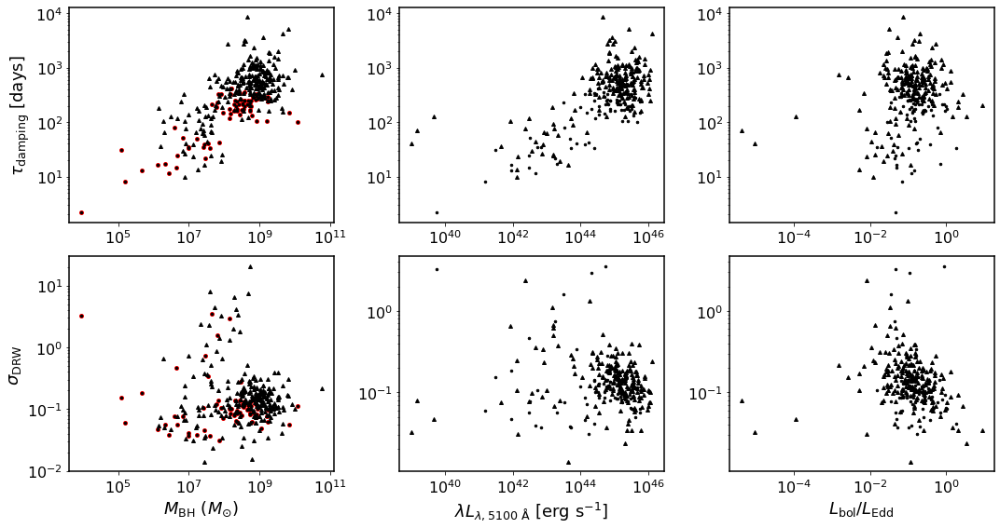

In [17]:
# GET RID OF THE BAD LIGHT CURVES
mask_valid = (df_mle['tau_obs'] < 1/(10)*df_mle['baseline']) & (df_mle['tau_obs'] > 1*df_mle['cadence']) & \
             (df_mle['ACF_good']) & ~df_mle['log_M_BH'].isna() & (df_mle['SNR']>1)
df_mle['valid'] = mask_valid

mask_invalid = (df_mle['tau_obs'] > 1/(10)*df_mle['baseline']) & (df_mle['tau_obs'] > 1*df_mle['cadence']) & \
             (df_mle['ACF_good']) & ~df_mle['log_M_BH'].isna() & (df_mle['SNR']>1)

tt = df_mle.tau_rest[df_mle.ACF_good & (df_mle.length_good & df_mle.cadence_good & (df_mle.SNR>1))]
mm = df_mle.log_M_BH[df_mle.ACF_good & (df_mle.length_good & df_mle.cadence_good & (df_mle.SNR>1))]
ss = df_mle.sigma_drw[df_mle.ACF_good & (df_mle.length_good & df_mle.cadence_good & (df_mle.SNR>1))]

# TIMESCALE
tau_plt = df_mle['tau_rest'][mask_valid].to_numpy()
sigma_plt = df_mle['sigma_drw'][mask_valid].to_numpy()
log_M_plt = df_mle['log_M_BH'][mask_valid].to_numpy()
log_L_plt = df_mle['log_L5100'][mask_valid].to_numpy()

# Lower-limits
tau_plt_ll = df_mle['tau_rest'][mask_invalid].to_numpy()
sigma_plt_ll = df_mle['sigma_drw'][mask_invalid].to_numpy()
log_M_plt_ll = df_mle['log_M_BH'][mask_invalid].to_numpy()
log_L_plt_ll = df_mle['log_L5100'][mask_invalid].to_numpy()

mask_L = (log_L_plt>0) & np.isfinite(log_L_plt)
mask_L_ll = (log_L_plt_ll>0) & np.isfinite(log_L_plt_ll)

fig,axs = plt.subplots(2,3, figsize=(15,8))

ax = axs[0,0]
m,c,b = ax.errorbar(10**mm, tt, linestyle='', marker='.', ms=8, c='r', capsize=3)
m,c,b = ax.errorbar(10**log_M_plt, tau_plt, linestyle='', marker='.', ms=5, c='k', capsize=3)
m,c,b = ax.errorbar(10**log_M_plt_ll, tau_plt_ll, linestyle='', marker='^', ms=4, c='k', capsize=3)

ax.tick_params('both',labelsize=16)
ax.set_ylabel(r'$\tau_{\rm{damping}}$ [days]',fontsize=18)

ax.set_xscale('log')
ax.set_yscale('log')

ax = axs[0,1]

m,c,b = ax.errorbar(10**log_L_plt[mask_L], tau_plt[mask_L], linestyle='', marker='.', ms=5, c='k', capsize=3)
m,c,b = ax.errorbar(10**log_L_plt_ll[mask_L_ll], tau_plt_ll[mask_L_ll], linestyle='', marker='^', ms=4, c='k', capsize=3)
ax.tick_params('both',labelsize=16)

ax.set_xscale('log')
ax.set_yscale('log')

ax = axs[0,2]
    
Lratio_plt = [ 9.26 * 10**xi / (1.26e38 * 10**log_M_plt[mask_L][i])  for i, xi in enumerate(log_L_plt[mask_L])]
Lratio_plt_ll = [ 9.26 * 10**xi / (1.26e38 * 10**log_M_plt_ll[mask_L_ll][i])  for i, xi in enumerate(log_L_plt_ll[mask_L_ll])]

m,c,b = ax.errorbar(Lratio_plt, tau_plt[mask_L], linestyle='', marker='.', ms=5, c='k', capsize=3)
m,c,b = ax.errorbar(Lratio_plt_ll, tau_plt_ll[mask_L_ll], linestyle='', marker='^', ms=4, c='k', capsize=3)
ax.tick_params('both',labelsize=16)

ax.set_xscale('log')
ax.set_yscale('log')

# AMPLITUDE
ax = axs[1,0]

m,c,b = ax.errorbar(10**mm, ss, linestyle='', marker='.', ms=8, c='r', capsize=3)
m,c,b = ax.errorbar(10**log_M_plt, sigma_plt, linestyle='', marker='.', ms=5, c='k', capsize=3)
m,c,b = ax.errorbar(10**log_M_plt_ll, sigma_plt_ll, linestyle='', marker='^', ms=4, c='k', capsize=3)
ax.tick_params('both',labelsize=16)
ax.set_xlabel(r'$M_{\rm{BH}}\ (M_{\odot})$',fontsize=18)
ax.set_ylabel(r'$\sigma_{\rm{DRW}}$',fontsize=18)

ax.set_xscale('log')
ax.set_yscale('log')

ax = axs[1,1]

m,c,b = ax.errorbar(10**log_L_plt[mask_L], sigma_plt[mask_L], linestyle='', marker='.', ms=5, c='k', capsize=3)
m,c,b = ax.errorbar(10**log_L_plt_ll[mask_L_ll], sigma_plt_ll[mask_L_ll], linestyle='', marker='^', ms=4, c='k', capsize=3)
ax.tick_params('both',labelsize=16)
ax.set_xlabel(r'$\lambda L_{\lambda, \rm{5100\ \AA}}$ [erg s$^{-1}$]',fontsize=18)

ax.set_xscale('log')
ax.set_yscale('log')

ax = axs[1,2]

m,c,b = ax.errorbar(Lratio_plt, sigma_plt[mask_L], linestyle='', marker='.', ms=5, c='k', capsize=3)
m,c,b = ax.errorbar(Lratio_plt_ll, sigma_plt_ll[mask_L_ll], linestyle='', marker='^', ms=4, c='k', capsize=3)
ax.tick_params('both',labelsize=16)
ax.set_xlabel(r'$L_{\rm{bol}}/L_{\rm{Edd}}$',fontsize=18)

ax.set_xscale('log')
ax.set_yscale('log')

fig.tight_layout()

In [27]:
df_mle.columns

Index(['name', 'ra', 'dec', 'z', 'log_M_BH', 'log_M_BH_e', 'log_L5100',
       'log_L5100_e', 'band', 'unit', 'x', 'y', 'yerr', 'RM', 'LC_ref',
       'L_ref', 'M_BH_ref', 'baseline', 'cadence', 'tau_rest', 'tau_obs',
       'tau_e_rest_sym', 'tau_e_rest_hi', 'tau_e_rest_lo', 'sigma_drw',
       'sigma_drw_e_sym', 'SNR', 'ACF_good', 'length_good', 'cadence_good',
       'tau_br', 'tau_br_lo', 'tau_br_hi', 'valid'],
      dtype='object')

name                                                    NGC 4395
ra                                                      186.4536
dec                                                     33.54686
z                                                       0.001064
log_M_BH                                                3.959041
log_M_BH_e                                              0.073923
log_L5100                                                  39.76
log_L5100_e                                                 0.03
band                                                        TESS
unit                                            $e^{-}$ s$^{-1}$
x              [1899.327623455907, 1899.348457374554, 1899.36...
y              [1590.7554931640625, 1591.3857421875, 1594.143...
yerr           [2.868915319442749, 2.806187391281128, 2.73403...
RM                                                          True
LC_ref                                       Burke et al. (2020)
L_ref                    

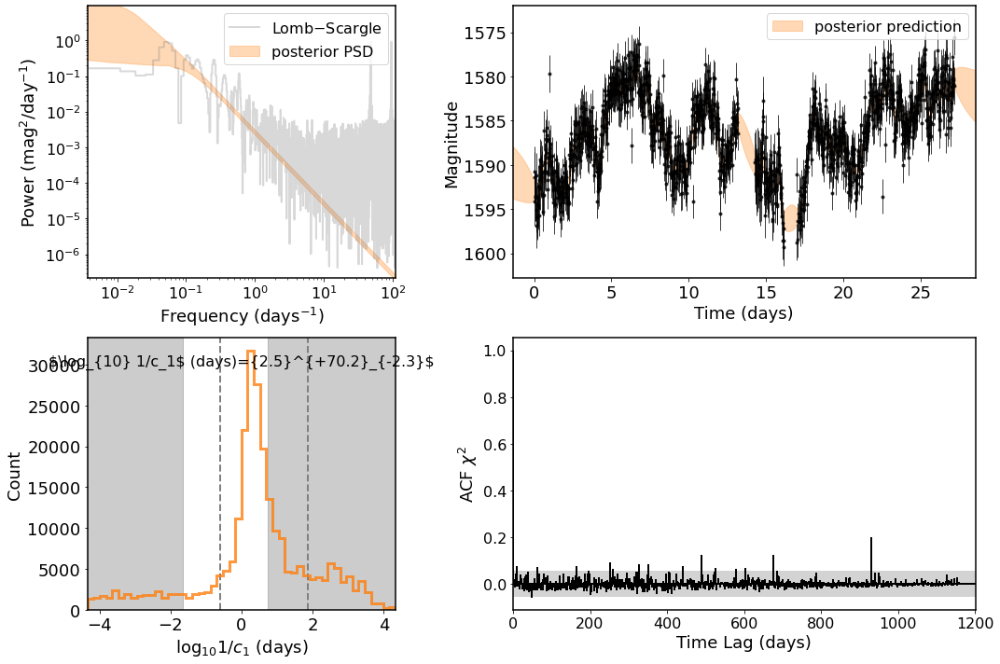

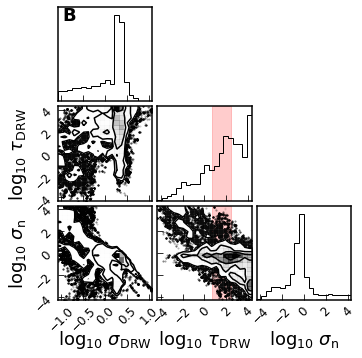

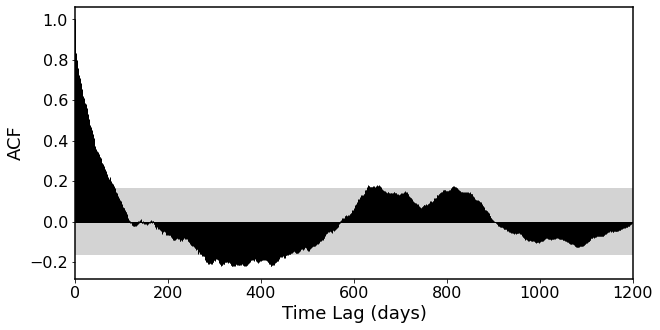

name                                                48.2620.2719
ra                                                      74.05914
dec                                                   -67.653003
z                                                           0.26
log_M_BH                                                    7.79
log_M_BH_e                                                  0.48
log_L5100                                                  44.01
log_L5100_e                                                  0.0
band                                                           V
unit                                                         mag
x              [304.75, 377.59, 419.57, 422.67, 445.62, 472.5...
y              [18.95, 19.023, 18.843, 18.808, 18.859, 18.958...
yerr           [0.045, 0.1, 0.022, 0.062, 0.048, 0.03, -99.0,...
RM                                                         False
LC_ref                                        Geha et al. (2003)
L_ref                    

/data/des90.a/data/cburke/conda/myenv/lib/python3.9/site-packages/emcee/moves/red_blue.py:99: RuntimeWarning: invalid value encountered in double_scalars
  lnpdiff = f + nlp - state.log_prob[j]


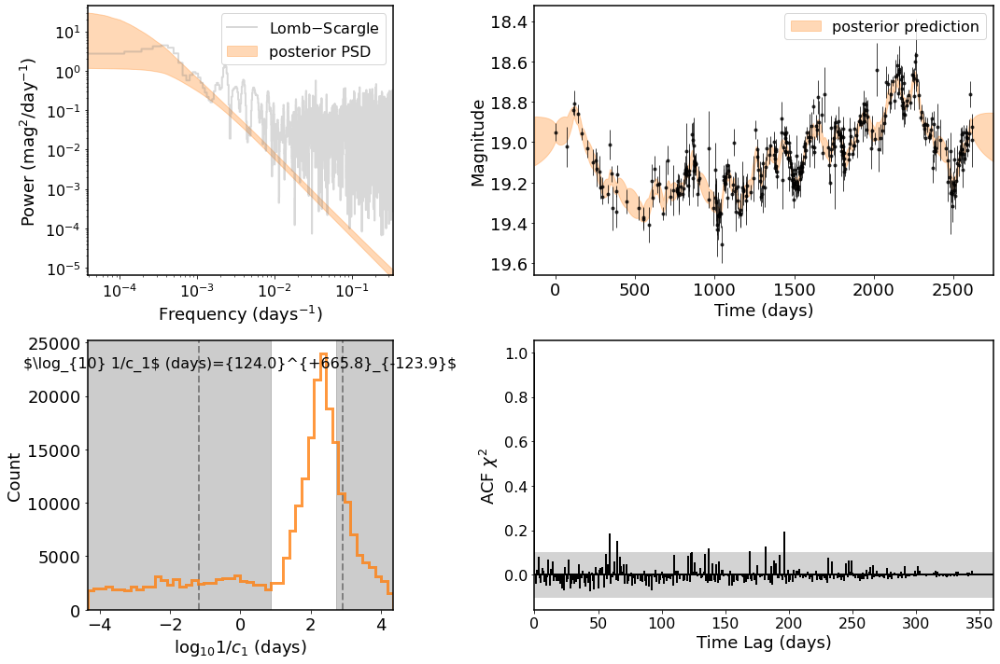

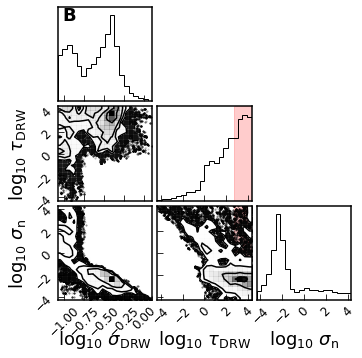

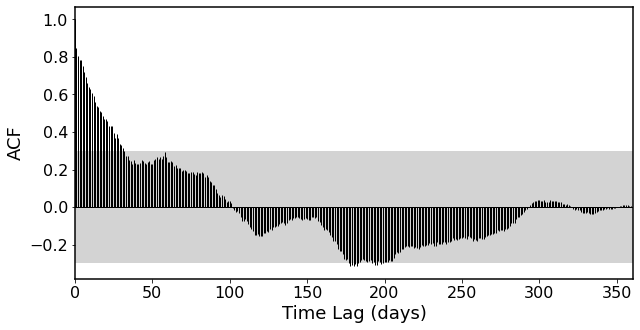

name                                                     Mrk 279
ra                                                    208.264315
dec                                                     69.30817
z                                                           0.03
log_M_BH                                                    7.54
log_M_BH_e                                                  0.11
log_L5100                                                  43.88
log_L5100_e                                                  0.0
band                                                           R
unit                  $10^{-15}$ erg s$^{-1}$ cm$^{-2} \AA^{-1}$
x              [50095.102, 50096.0, 50097.0, 50098.102, 50104...
y              [9.385, 9.671, 8.593, 9.091, 7.959, 7.84, 7.36...
yerr           [0.4, 0.409, 0.374, 0.391, 0.354, 0.35, 0.334,...
RM                                                          True
LC_ref                                                  AGNWatch
L_ref                    

/data/des90.a/data/cburke/conda/myenv/lib/python3.9/site-packages/emcee/moves/red_blue.py:99: RuntimeWarning: invalid value encountered in double_scalars
  lnpdiff = f + nlp - state.log_prob[j]


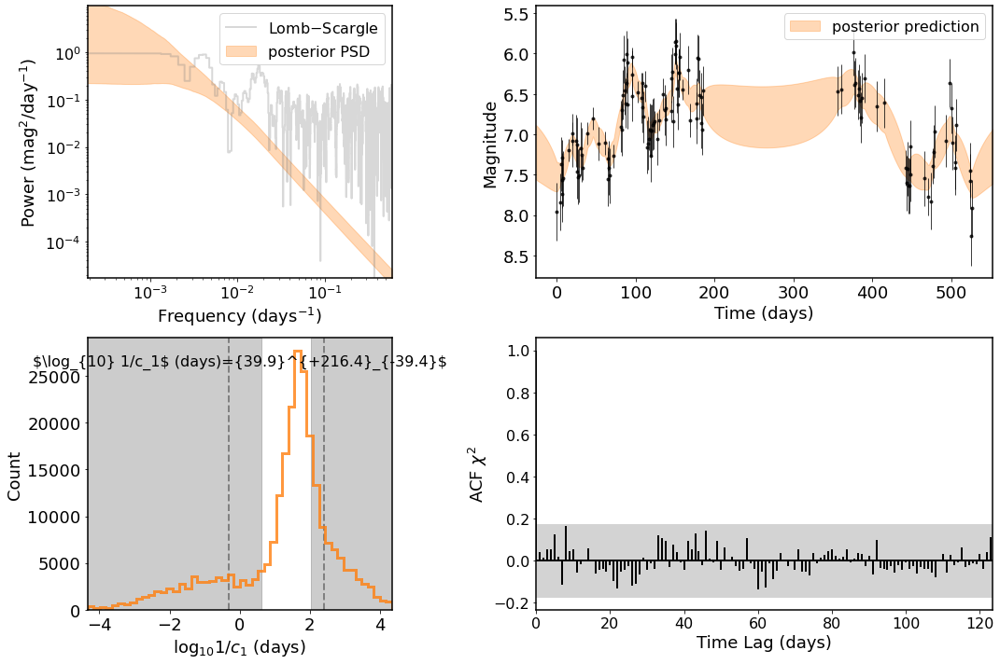

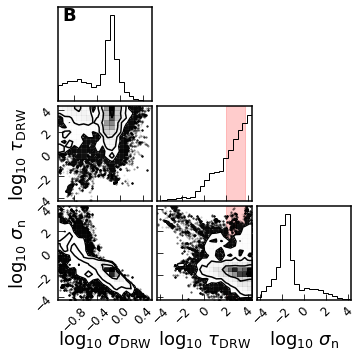

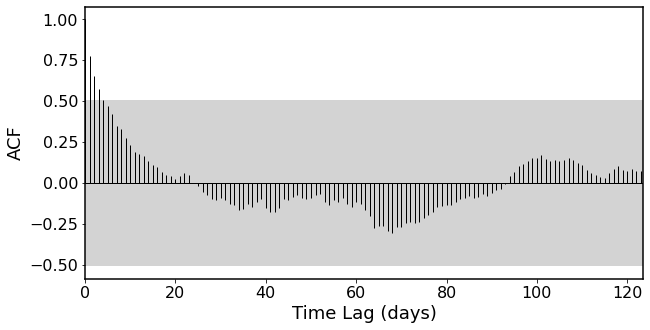

name                                                    NGC 5548
ra                                                    214.498084
dec                                                    25.136833
z                                                          0.017
log_M_BH                                                    7.82
log_M_BH_e                                                  0.01
log_L5100                                                  43.51
log_L5100_e                                                  0.0
band                                                           R
unit                  $10^{-15}$ erg s$^{-1}$ cm$^{-2} \AA^{-1}$
x              [47509.0, 47512.0, 47517.0, 47524.0, 47525.0, ...
y              [8.98, 9.73, 9.71, 9.79, 10.11, 10.56, 10.14, ...
yerr           [0.36, 0.73, 0.39, 0.39, 0.4, 0.42, 0.41, 0.42...
RM                                                          True
LC_ref                                                  AGNWatch
L_ref                    

/data/des90.a/data/cburke/conda/myenv/lib/python3.9/site-packages/emcee/moves/red_blue.py:99: RuntimeWarning: invalid value encountered in double_scalars
  lnpdiff = f + nlp - state.log_prob[j]


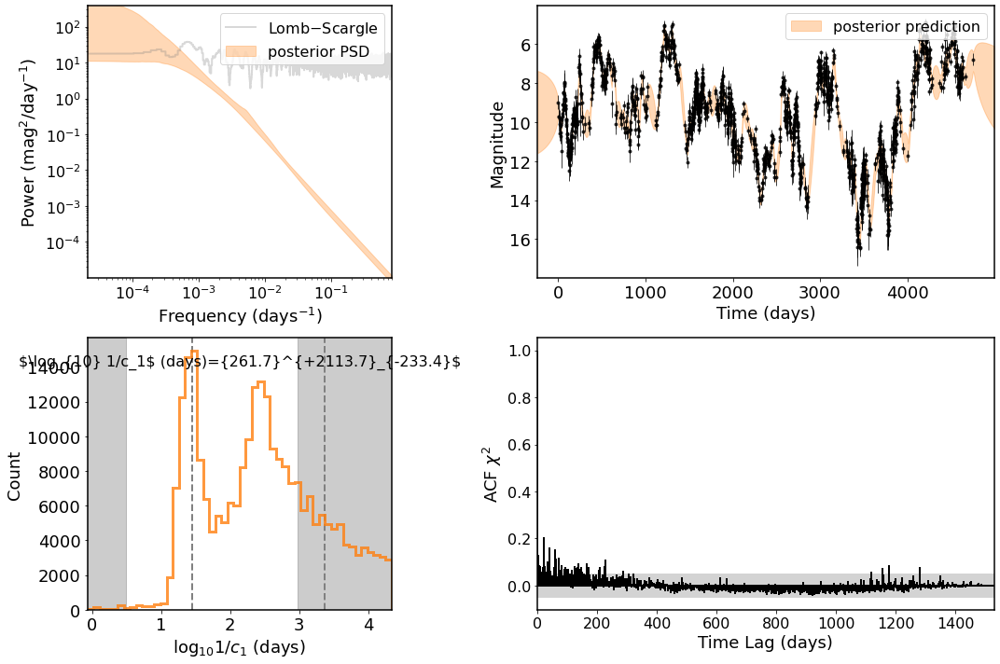

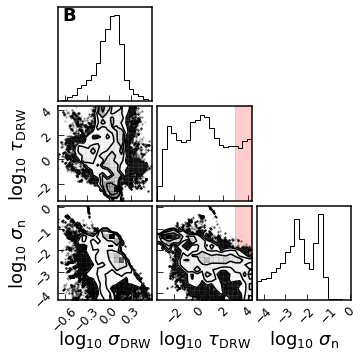

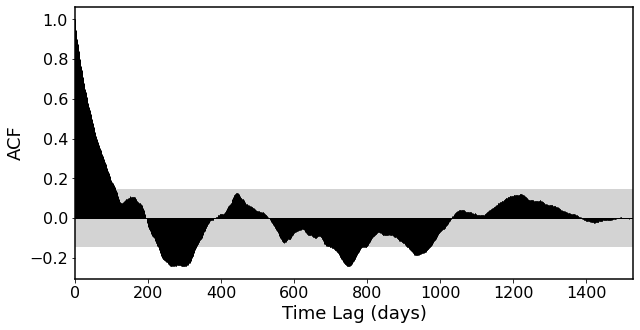

name                                                    NGC 3783
ra                                                    174.757123
dec                                                   -37.738613
z                                                          0.009
log_M_BH                                                    7.47
log_M_BH_e                                                  0.07
log_L5100                                                  43.26
log_L5100_e                                                  0.0
band                                                           R
unit                  $10^{-15}$ erg s$^{-1}$ cm$^{-2} \AA^{-1}$
x              [8607.83, 8610.56, 8622.55, 8623.83, 8627.83, ...
y              [13.02, 14.19, 12.57, 12.9, 12.35, 12.57, 12.3...
yerr           [0.26, 0.63, 0.62, 0.26, 0.25, 0.62, 0.25, 0.6...
RM                                                          True
LC_ref                                                  AGNWatch
L_ref                    

/data/des90.a/data/cburke/conda/myenv/lib/python3.9/site-packages/emcee/moves/red_blue.py:99: RuntimeWarning: invalid value encountered in double_scalars
  lnpdiff = f + nlp - state.log_prob[j]


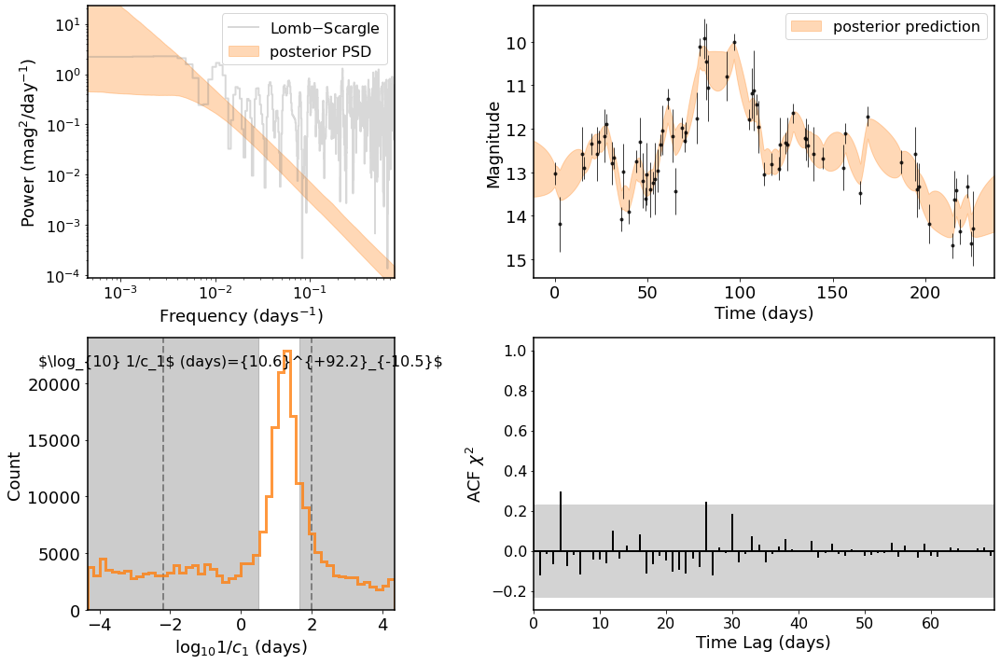

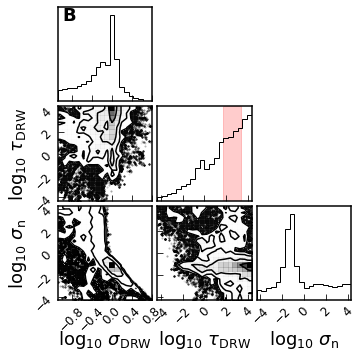

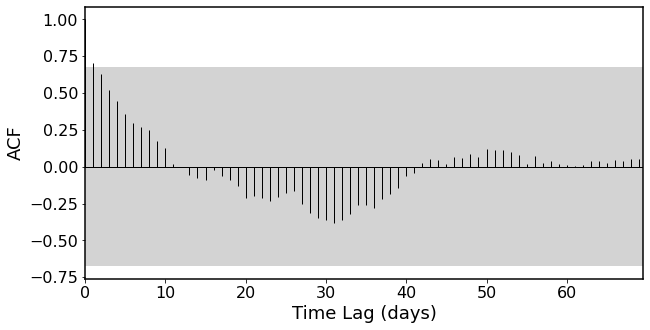

name                                              DES J0218-0430
ra                                                      34.59384
dec                                                    -4.509967
z                                                          0.823
log_M_BH                                                6.598769
log_M_BH_e                                              0.139747
log_L5100                                                  43.52
log_L5100_e                                                  0.0
band                                                           g
unit                                                         mag
x              [56245.107667, 56245.110416, 56264.079171, 562...
y              [21.93744, 21.823732, 21.872335, 21.809312, 21...
yerr           [0.048138, 0.044123, 0.019228, 0.041524, 0.018...
RM                                                         False
LC_ref                                         Guo et al. (2020)
L_ref                    

/data/des90.a/data/cburke/conda/myenv/lib/python3.9/site-packages/emcee/moves/red_blue.py:99: RuntimeWarning: invalid value encountered in double_scalars
  lnpdiff = f + nlp - state.log_prob[j]


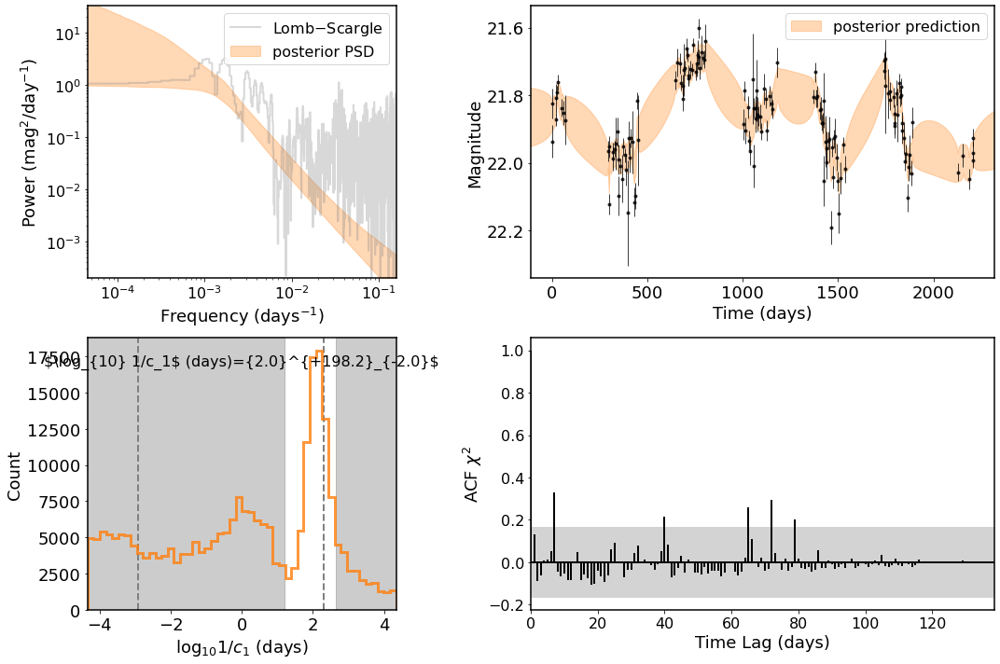

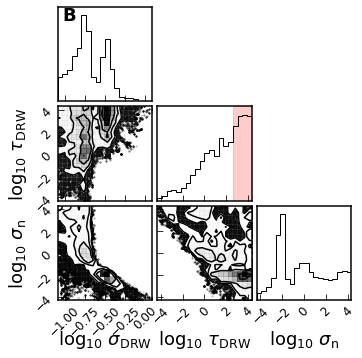

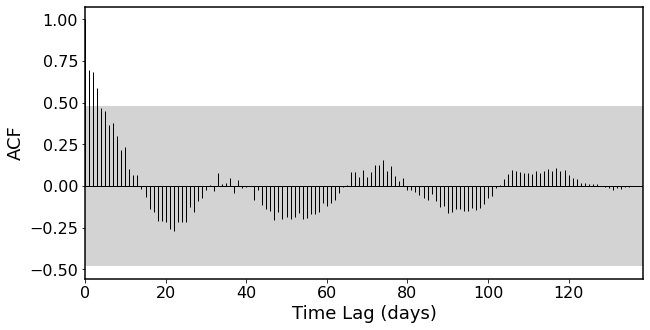

name                                                     2551748
ra                                                     41.803753
dec                                                     -1.18507
z                                                         0.4863
log_M_BH                                                8.180364
log_M_BH_e                                              0.300708
log_L5100                                               44.12374
log_L5100_e                                             0.014742
band                                                           g
unit                                                         mag
x              [52971.25, 53643.4375, 54020.40625, 54047.3945...
y              [20.562068897120227, 20.467069583765735, 20.70...
yerr           [0.0430000014603138, 0.03799999877810478, 0.06...
RM                                                         False
LC_ref                                        Yang et al. (2020)
L_ref                    

/data/des90.a/data/cburke/conda/myenv/lib/python3.9/site-packages/emcee/moves/red_blue.py:99: RuntimeWarning: invalid value encountered in double_scalars
  lnpdiff = f + nlp - state.log_prob[j]


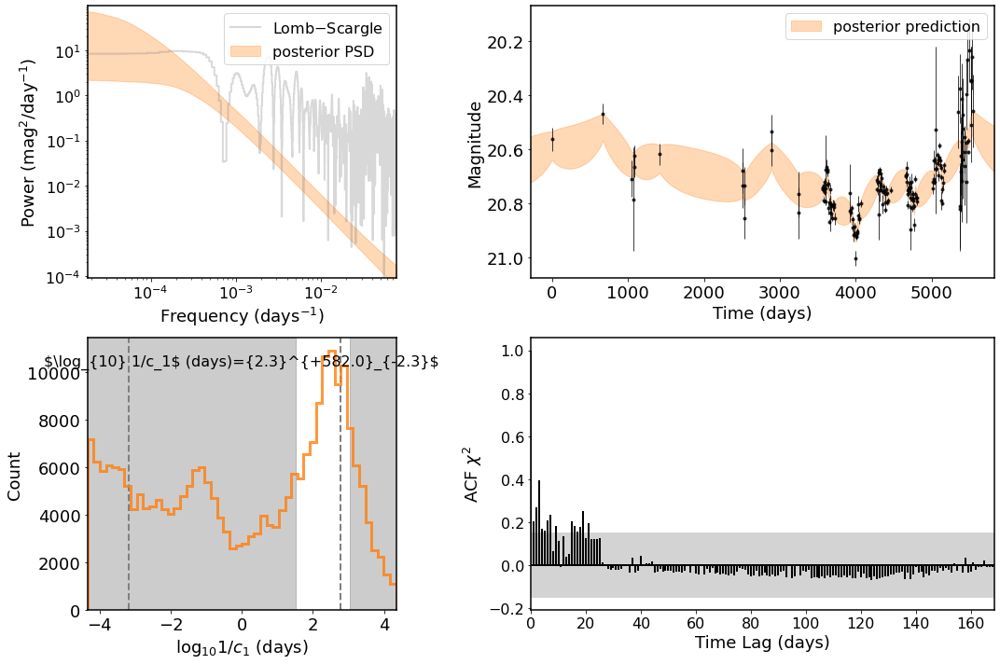

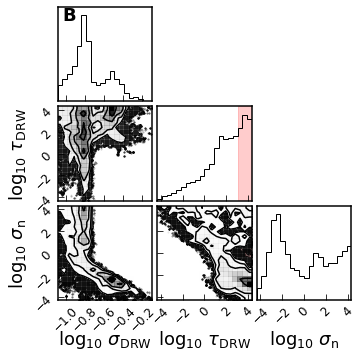

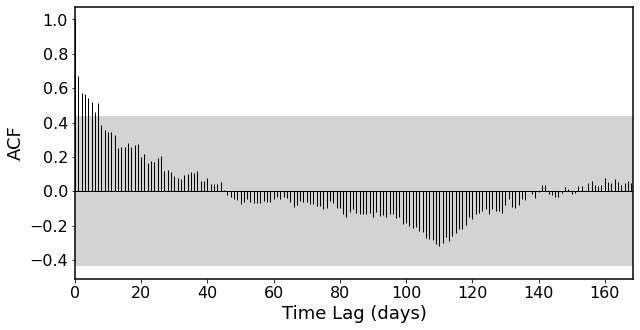

name                                                     2570941
ra                                                     41.092514
dec                                                     -1.21313
z                                                         1.6494
log_M_BH                                                 8.48365
log_M_BH_e                                              0.545629
log_L5100                                              45.214835
log_L5100_e                                             0.007862
band                                                           g
unit                                                         mag
x              [51081.3984375, 51819.46875, 51875.21484375, 5...
y              [19.888619577495803, 20.159619485943068, 20.07...
yerr           [0.02199999988079071, 0.02800000086426735, 0.0...
RM                                                         False
LC_ref                                        Yang et al. (2020)
L_ref                    

/data/des90.a/data/cburke/conda/myenv/lib/python3.9/site-packages/emcee/moves/red_blue.py:99: RuntimeWarning: invalid value encountered in double_scalars
  lnpdiff = f + nlp - state.log_prob[j]


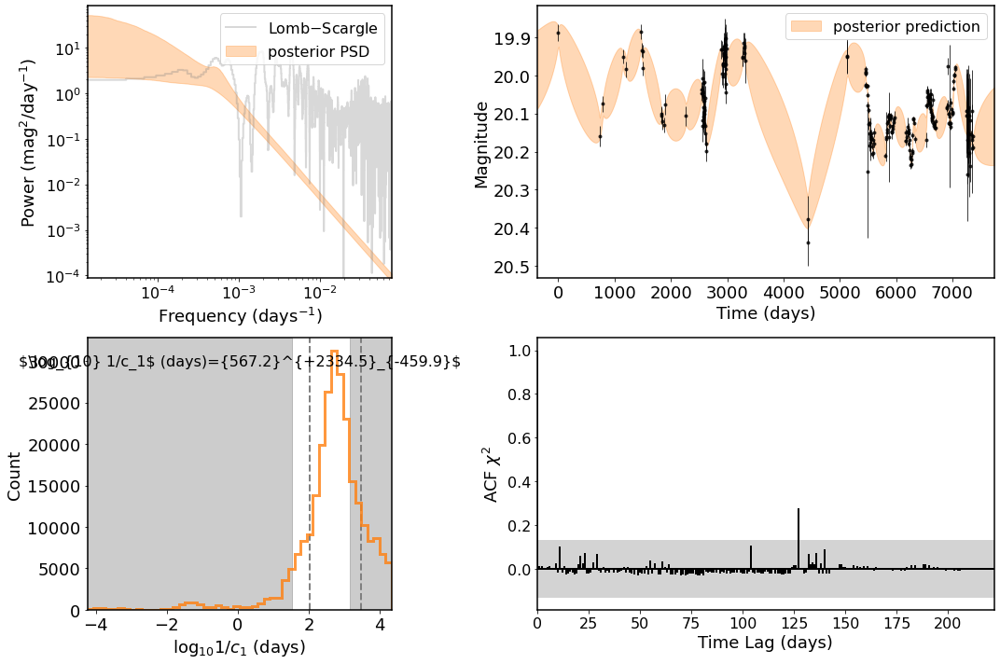

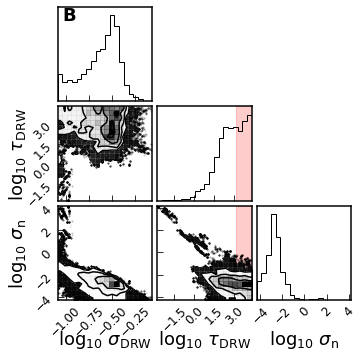

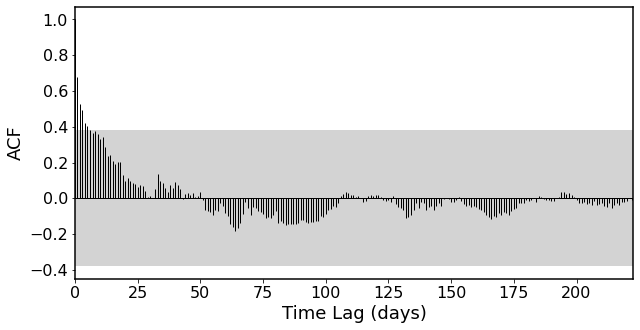

name                                                     2531595
ra                                                     40.552731
dec                                                    -1.060995
z                                                         1.4368
log_M_BH                                                8.566206
log_M_BH_e                                              0.141283
log_L5100                                              44.758171
log_L5100_e                                             0.026722
band                                                           g
unit                                                         mag
x              [51081.3984375, 51875.2109375, 52225.29296875,...
y              [20.429955161278244, 20.627955115501877, 20.59...
yerr           [0.03099999949336052, 0.032999999821186066, 0....
RM                                                         False
LC_ref                                        Yang et al. (2020)
L_ref                    

/data/des90.a/data/cburke/conda/myenv/lib/python3.9/site-packages/emcee/moves/red_blue.py:99: RuntimeWarning: invalid value encountered in double_scalars
  lnpdiff = f + nlp - state.log_prob[j]


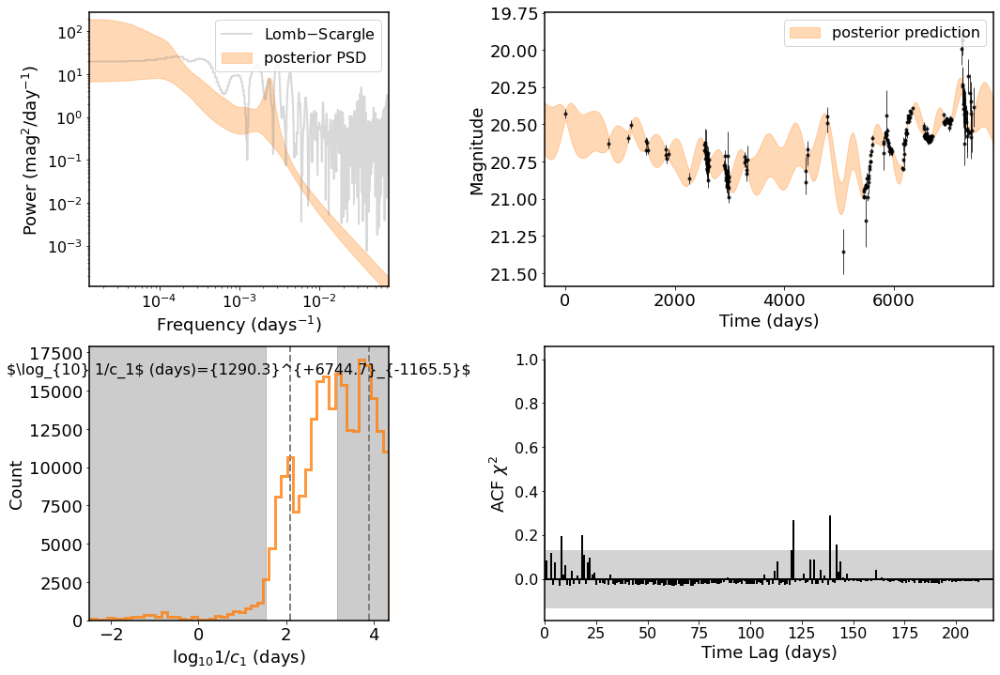

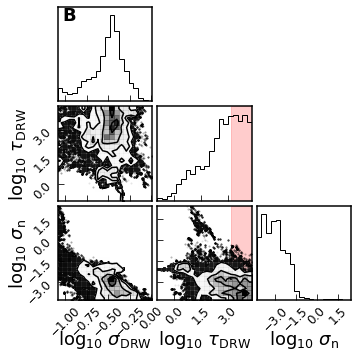

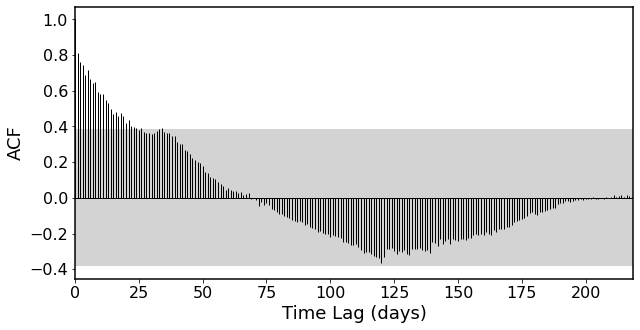

name                                                     2562971
ra                                                     40.745869
dec                                                    -0.177312
z                                                         0.7327
log_M_BH                                                 7.90677
log_M_BH_e                                              0.133784
log_L5100                                              44.469269
log_L5100_e                                             0.053764
band                                                           g
unit                                                         mag
x              [51075.4140625, 51818.3828125, 52170.43359375,...
y              [20.42768086721567, 20.24368085195688, 20.1826...
yerr           [0.024000000208616257, 0.02199999988079071, 0....
RM                                                         False
LC_ref                                        Yang et al. (2020)
L_ref                    

/data/des90.a/data/cburke/conda/myenv/lib/python3.9/site-packages/emcee/moves/red_blue.py:99: RuntimeWarning: invalid value encountered in double_scalars
  lnpdiff = f + nlp - state.log_prob[j]


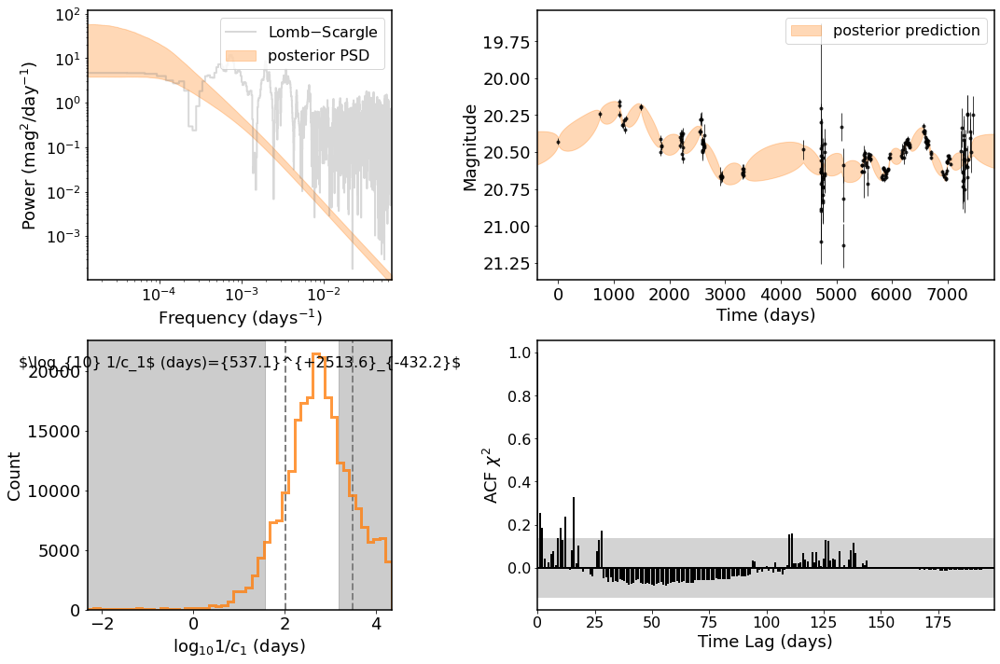

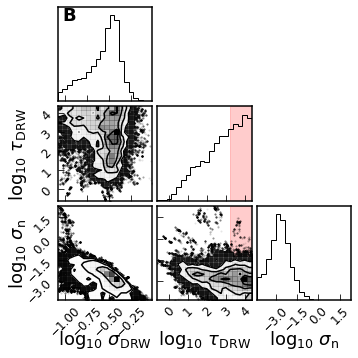

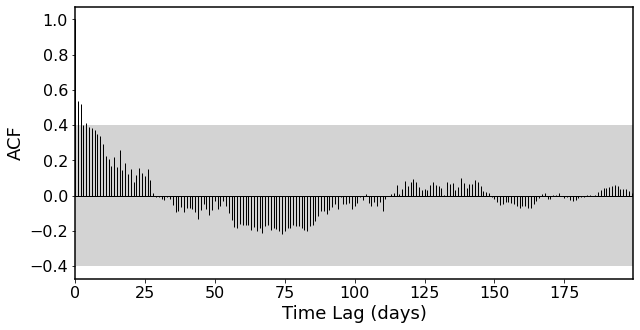

name                                                     2568243
ra                                                     43.225033
dec                                                     0.975563
z                                                         1.2979
log_M_BH                                                8.471841
log_M_BH_e                                              0.085887
log_L5100                                               44.80969
log_L5100_e                                             0.013323
band                                                           g
unit                                                         mag
x              [51081.40625, 51819.4765625, 51875.21875, 5222...
y              [20.66702011209189, 20.343020707184664, 20.459...
yerr           [0.03500000014901161, 0.02500000037252903, 0.0...
RM                                                         False
LC_ref                                        Yang et al. (2020)
L_ref                    

/data/des90.a/data/cburke/conda/myenv/lib/python3.9/site-packages/emcee/moves/red_blue.py:99: RuntimeWarning: invalid value encountered in double_scalars
  lnpdiff = f + nlp - state.log_prob[j]


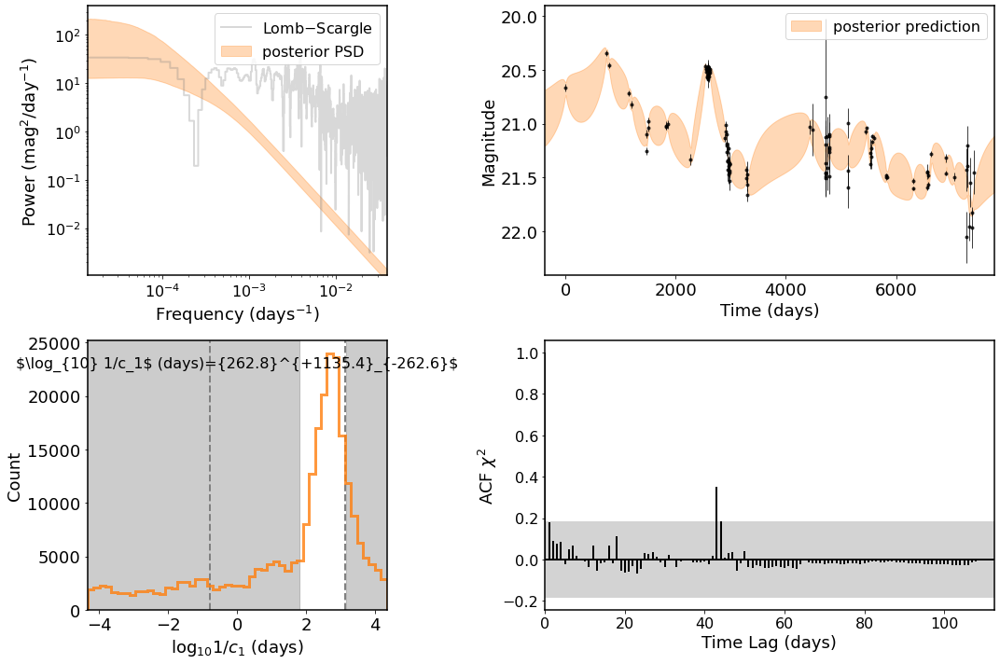

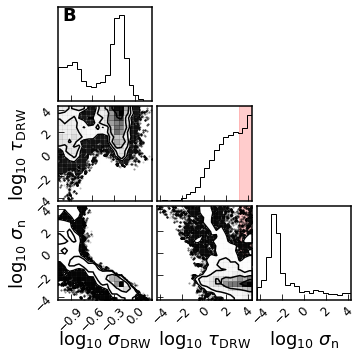

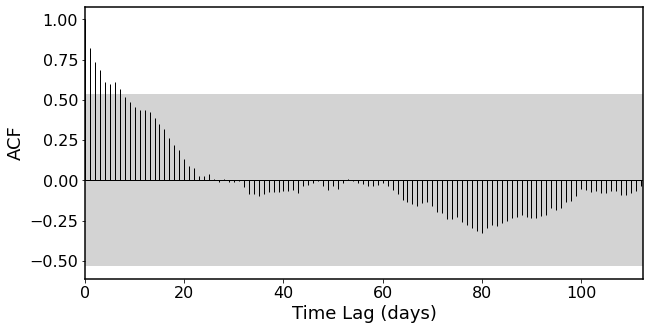

name                                                     2601455
ra                                                     41.112026
dec                                                    -0.507913
z                                                         2.0831
log_M_BH                                                9.194581
log_M_BH_e                                              0.128434
log_L5100                                              45.403187
log_L5100_e                                             0.035202
band                                                           g
unit                                                         mag
x              [51818.38671875, 52170.4375, 52171.375, 52173....
y              [20.13678246133159, 20.389782720731006, 20.393...
yerr           [0.019999999552965164, 0.023000000044703484, 0...
RM                                                         False
LC_ref                                        Yang et al. (2020)
L_ref                    

/data/des90.a/data/cburke/conda/myenv/lib/python3.9/site-packages/emcee/moves/red_blue.py:99: RuntimeWarning: invalid value encountered in double_scalars
  lnpdiff = f + nlp - state.log_prob[j]


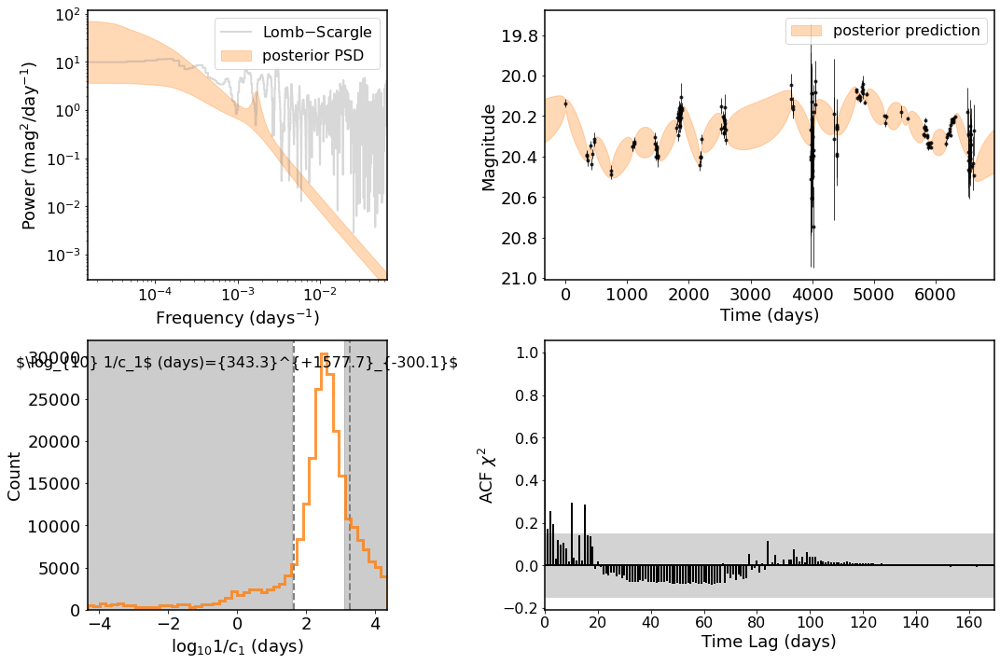

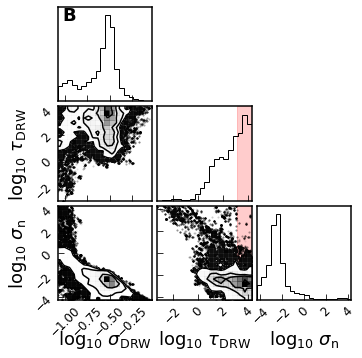

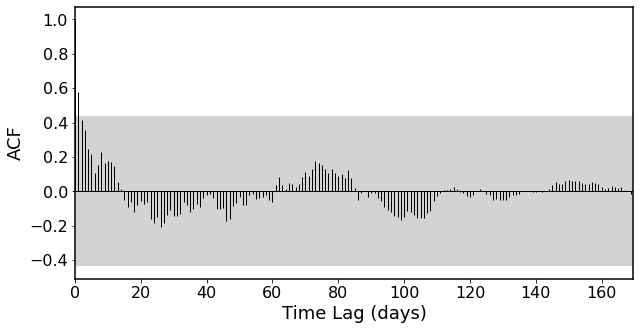

name                                                     2590102
ra                                                     42.529282
dec                                                     0.423722
z                                                         0.1978
log_M_BH                                                7.963192
log_M_BH_e                                              0.057809
log_L5100                                              44.203022
log_L5100_e                                             0.002667
band                                                           g
unit                                                         mag
x              [51075.41796875, 51818.390625, 51819.47265625,...
y              [17.798849673307586, 17.72984942916696, 17.719...
yerr           [0.006000000052154064, 0.006000000052154064, 0...
RM                                                         False
LC_ref                                        Yang et al. (2020)
L_ref                    

/data/des90.a/data/cburke/conda/myenv/lib/python3.9/site-packages/emcee/moves/red_blue.py:99: RuntimeWarning: invalid value encountered in double_scalars
  lnpdiff = f + nlp - state.log_prob[j]


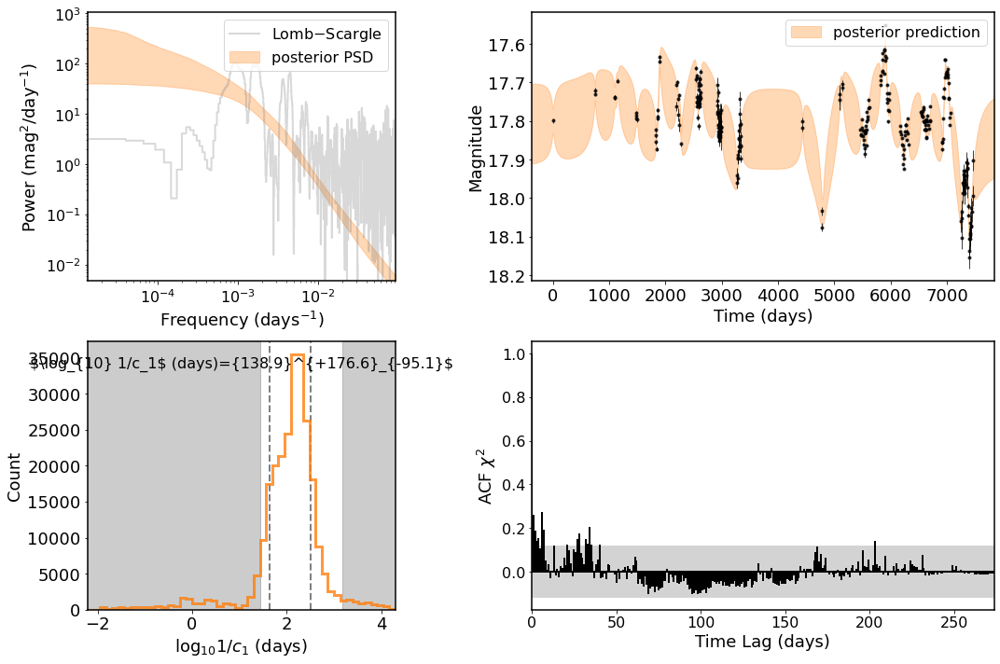

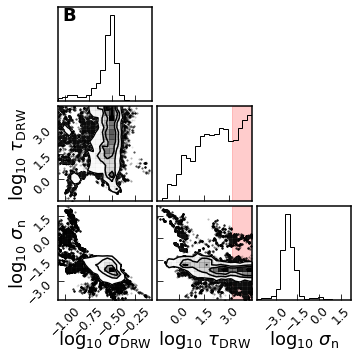

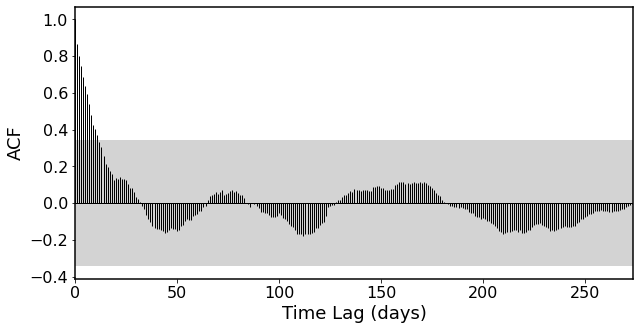

name                                                     2479049
ra                                                     43.506512
dec                                                      0.05477
z                                                         1.8317
log_M_BH                                                8.910388
log_M_BH_e                                              0.275275
log_L5100                                              45.238607
log_L5100_e                                             0.015652
band                                                           g
unit                                                         mag
x              [51081.40625, 51819.4765625, 51875.21875, 5217...
y              [20.393891385676213, 20.55989175188715, 20.570...
yerr           [0.026000000536441803, 0.028999999165534973, 0...
RM                                                         False
LC_ref                                        Yang et al. (2020)
L_ref                    

/data/des90.a/data/cburke/conda/myenv/lib/python3.9/site-packages/emcee/moves/red_blue.py:99: RuntimeWarning: invalid value encountered in double_scalars
  lnpdiff = f + nlp - state.log_prob[j]


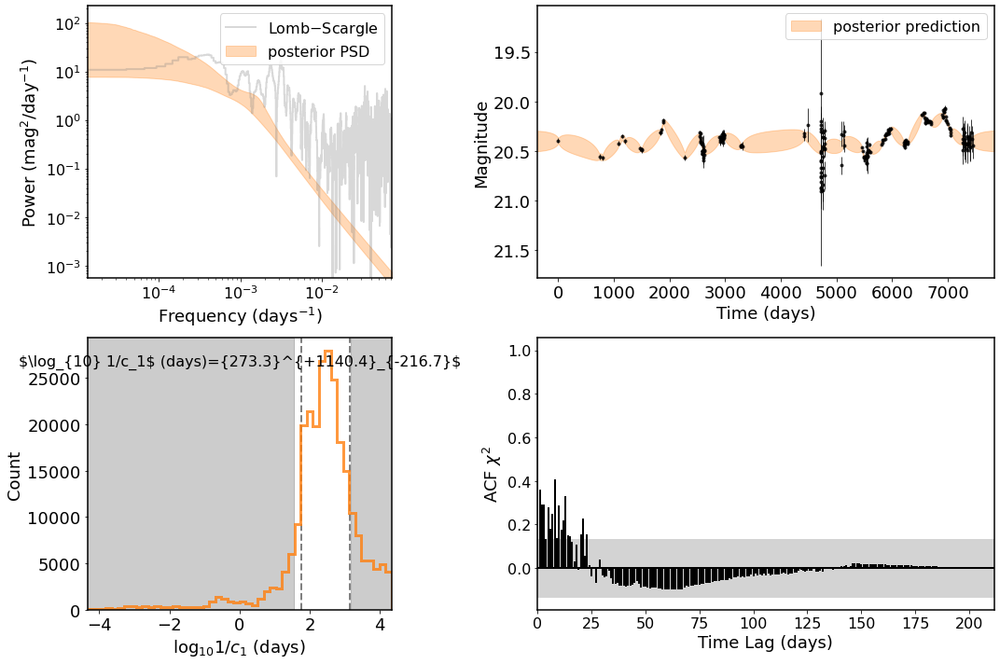

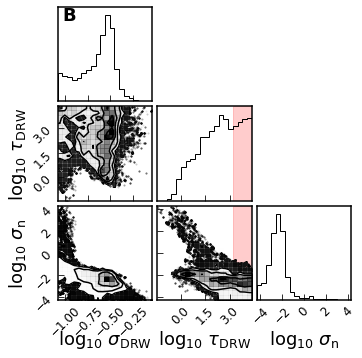

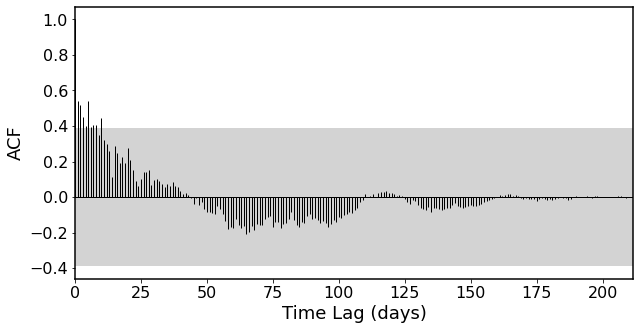

name                                                     7910366
ra                                                     42.499062
dec                                                    -0.017835
z                                                         1.5088
log_M_BH                                                8.658678
log_M_BH_e                                              0.120284
log_L5100                                              45.088748
log_L5100_e                                             0.008884
band                                                           g
unit                                                         mag
x              [51075.41796875, 51818.390625, 51819.47265625,...
y              [20.26655653646911, 20.0495555751654, 20.08655...
yerr           [0.020999999716877937, 0.01899999938905239, 0....
RM                                                         False
LC_ref                                        Yang et al. (2020)
L_ref                    

/data/des90.a/data/cburke/conda/myenv/lib/python3.9/site-packages/emcee/moves/red_blue.py:99: RuntimeWarning: invalid value encountered in double_scalars
  lnpdiff = f + nlp - state.log_prob[j]


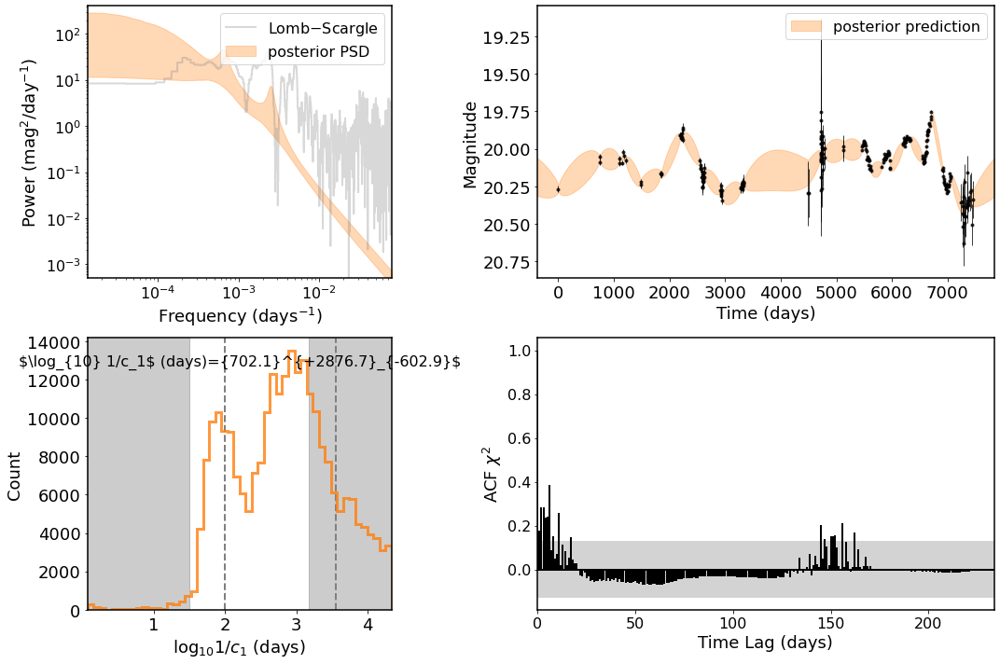

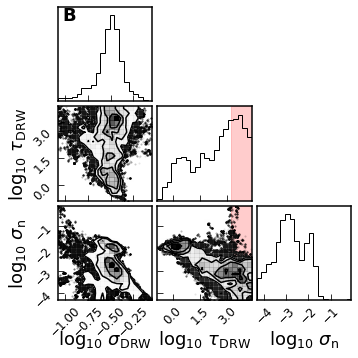

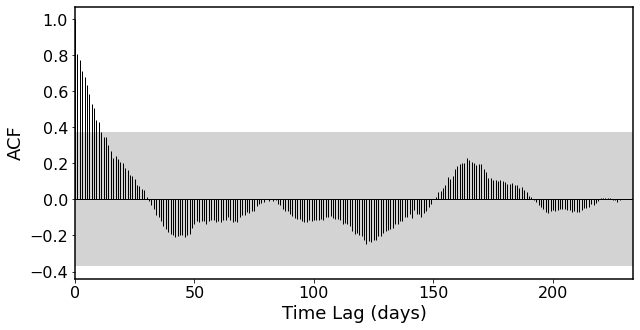

name                                                     2590128
ra                                                     42.397781
dec                                                     0.695684
z                                                         1.9586
log_M_BH                                                8.744101
log_M_BH_e                                              0.281562
log_L5100                                              45.019193
log_L5100_e                                             0.058295
band                                                           g
unit                                                         mag
x              [51075.41796875, 51818.38671875, 52171.375, 52...
y              [20.62705714474633, 20.437056610688714, 20.488...
yerr           [0.027000000700354576, 0.024000000208616257, 0...
RM                                                         False
LC_ref                                        Yang et al. (2020)
L_ref                    

/data/des90.a/data/cburke/conda/myenv/lib/python3.9/site-packages/emcee/moves/red_blue.py:99: RuntimeWarning: invalid value encountered in double_scalars
  lnpdiff = f + nlp - state.log_prob[j]


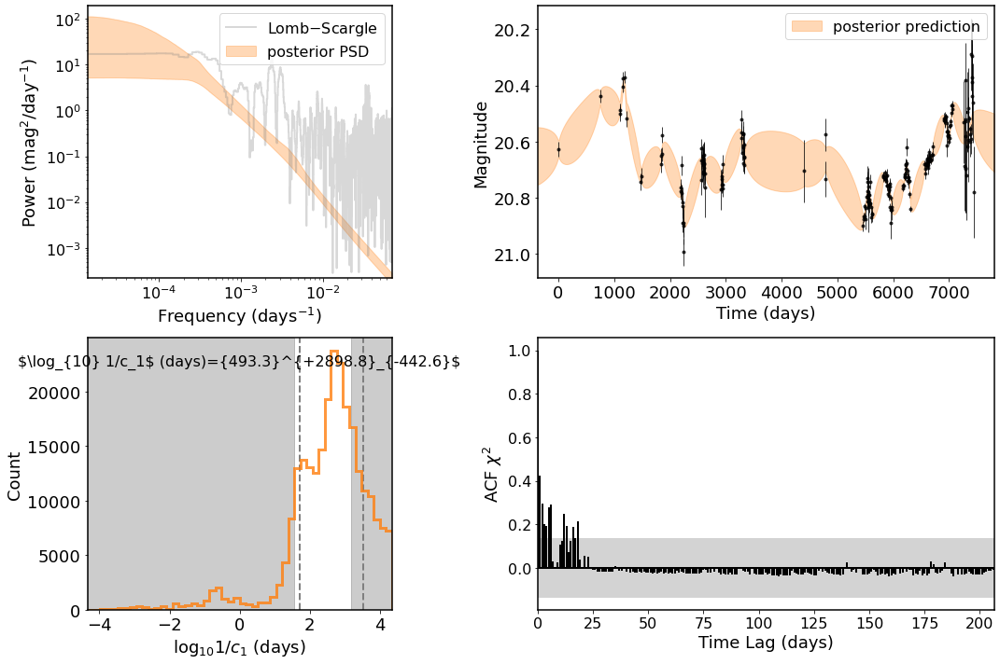

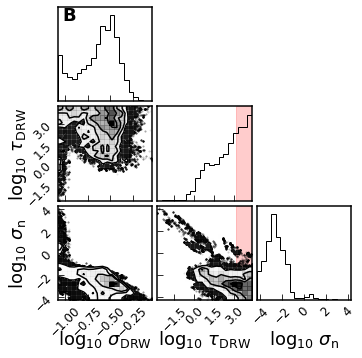

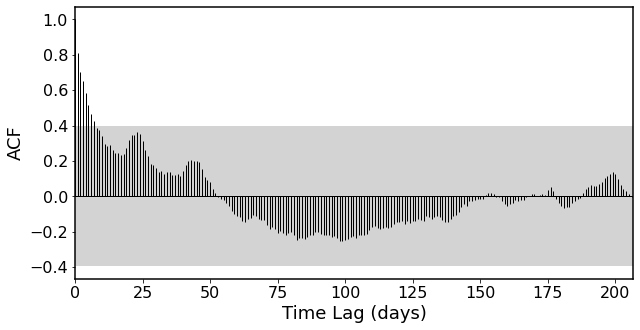

name                                                     2585077
ra                                                     41.436611
dec                                                    -0.737587
z                                                          1.225
log_M_BH                                                8.685469
log_M_BH_e                                              0.531089
log_L5100                                              45.168012
log_L5100_e                                             0.002978
band                                                           g
unit                                                         mag
x              [51081.3984375, 51819.47265625, 51875.21484375...
y              [19.797822540425926, 19.786822860860497, 19.87...
yerr           [0.017000000923871994, 0.017999999225139618, 0...
RM                                                         False
LC_ref                                        Yang et al. (2020)
L_ref                    

/data/des90.a/data/cburke/conda/myenv/lib/python3.9/site-packages/emcee/moves/red_blue.py:99: RuntimeWarning: invalid value encountered in double_scalars
  lnpdiff = f + nlp - state.log_prob[j]


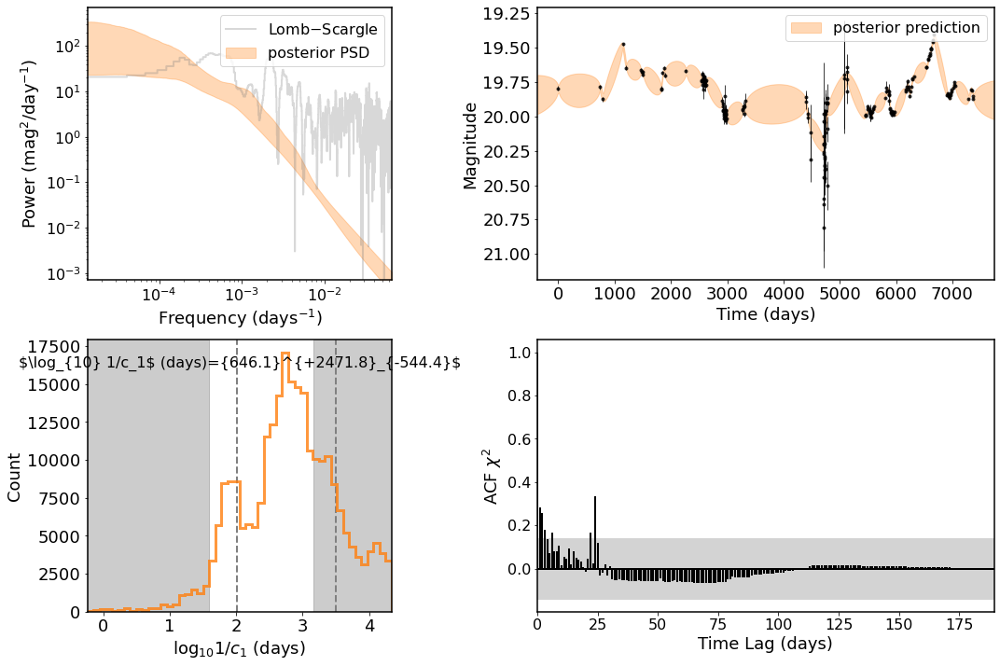

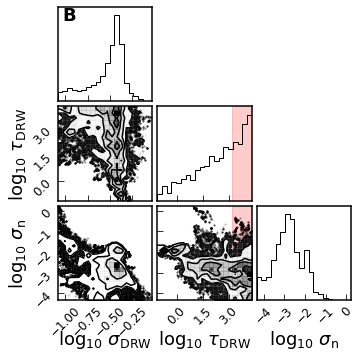

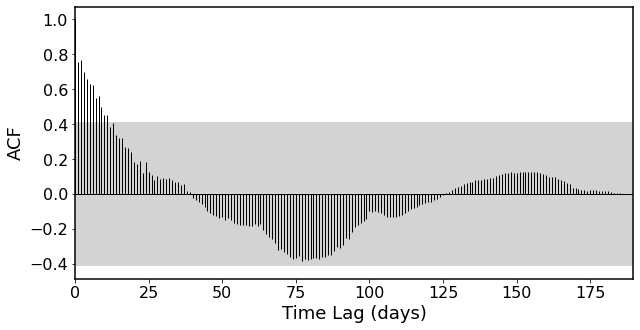

name                                                     2585096
ra                                                     41.448292
dec                                                    -0.137336
z                                                         1.6026
log_M_BH                                                8.889876
log_M_BH_e                                               0.15305
log_L5100                                              45.075087
log_L5100_e                                             0.016883
band                                                           g
unit                                                         mag
x              [51075.41796875, 51818.38671875, 52171.375, 52...
y              [20.307261290148872, 20.36626130540766, 20.346...
yerr           [0.02199999988079071, 0.02199999988079071, 0.0...
RM                                                         False
LC_ref                                        Yang et al. (2020)
L_ref                    

/data/des90.a/data/cburke/conda/myenv/lib/python3.9/site-packages/emcee/moves/red_blue.py:99: RuntimeWarning: invalid value encountered in double_scalars
  lnpdiff = f + nlp - state.log_prob[j]


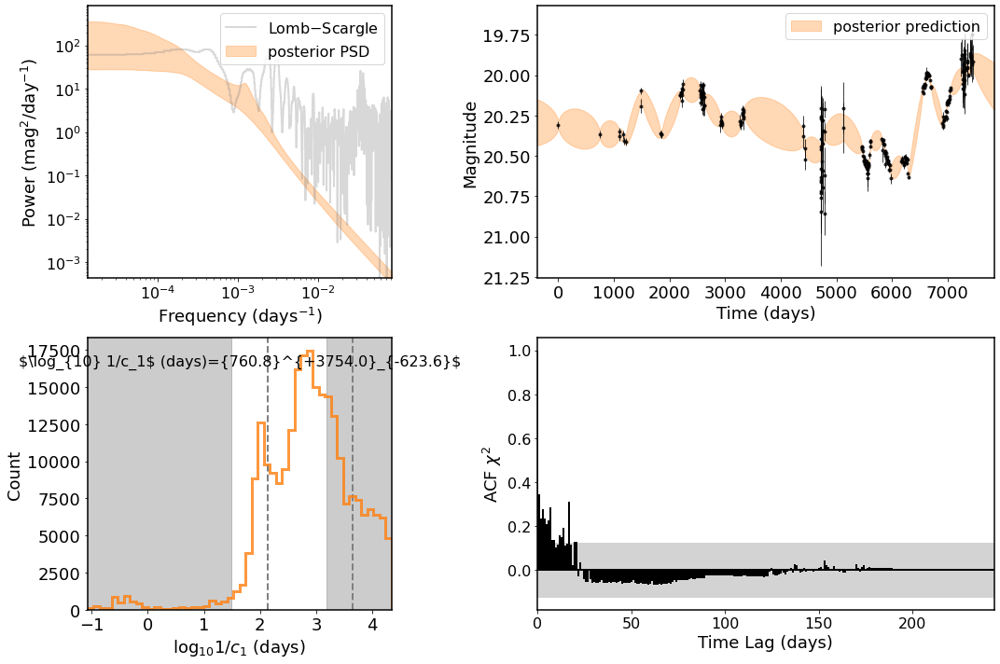

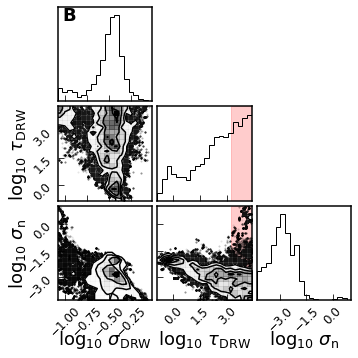

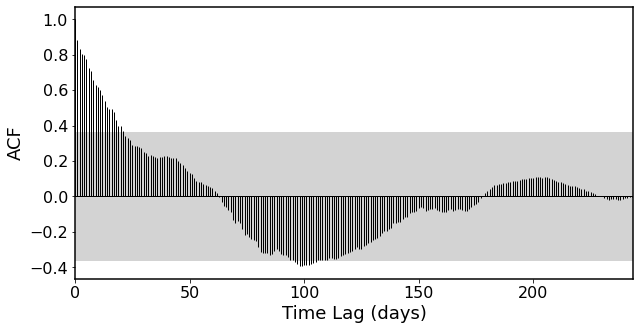

name                                                     2485925
ra                                                     41.945835
dec                                                    -1.226247
z                                                         1.3853
log_M_BH                                                8.763294
log_M_BH_e                                              0.139764
log_L5100                                              44.892844
log_L5100_e                                             0.010278
band                                                           g
unit                                                         mag
x              [51081.40234375, 51819.47265625, 51875.2148437...
y              [20.414242506134656, 20.348242521393445, 20.34...
yerr           [0.029999999329447746, 0.03200000151991844, 0....
RM                                                         False
LC_ref                                        Yang et al. (2020)
L_ref                    

/data/des90.a/data/cburke/conda/myenv/lib/python3.9/site-packages/emcee/moves/red_blue.py:99: RuntimeWarning: invalid value encountered in double_scalars
  lnpdiff = f + nlp - state.log_prob[j]


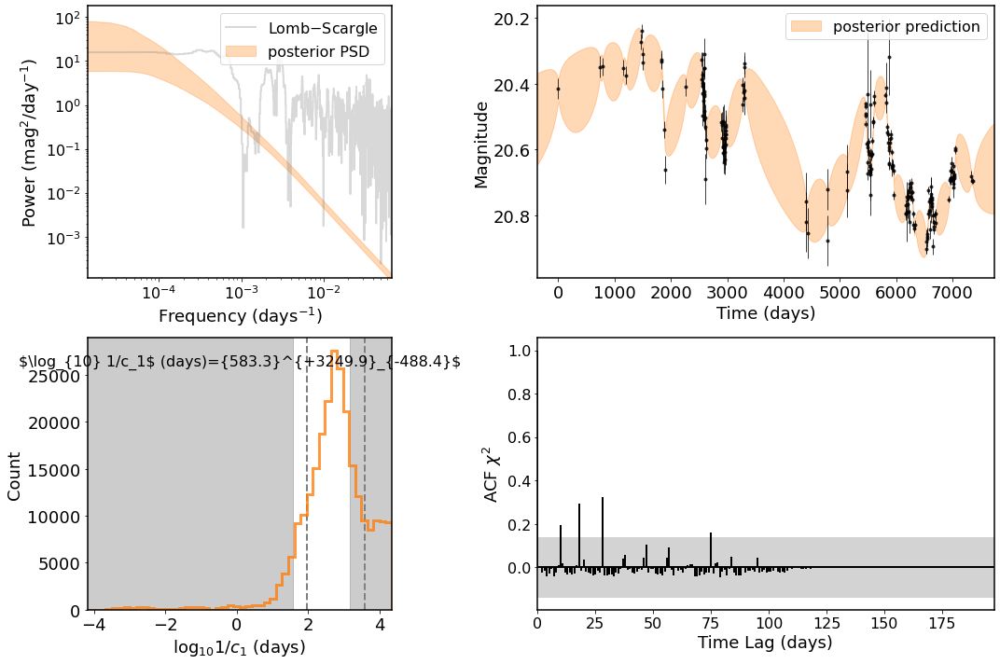

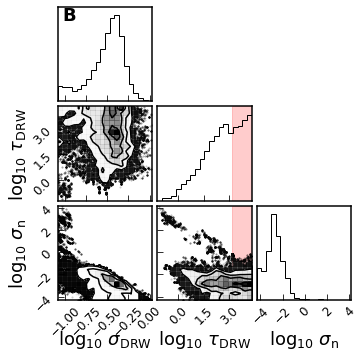

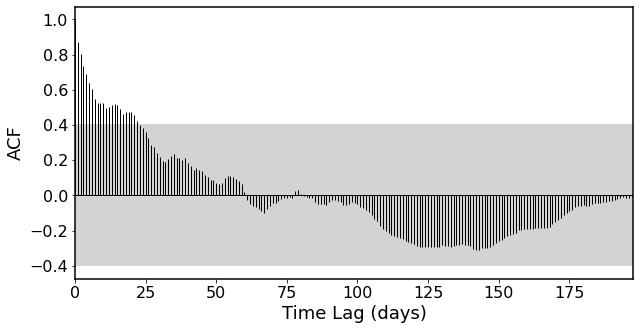

name                                                     2498197
ra                                                     40.519119
dec                                                    -0.643275
z                                                         2.2888
log_M_BH                                                8.779027
log_M_BH_e                                              0.074199
log_L5100                                              45.555778
log_L5100_e                                              0.02061
band                                                           g
unit                                                         mag
x              [51081.3984375, 52288.12890625, 52578.3046875,...
y              [19.857017441389743, 20.00301734983701, 19.895...
yerr           [0.017999999225139618, 0.01899999938905239, 0....
RM                                                         False
LC_ref                                        Yang et al. (2020)
L_ref                    

/data/des90.a/data/cburke/conda/myenv/lib/python3.9/site-packages/emcee/moves/red_blue.py:99: RuntimeWarning: invalid value encountered in double_scalars
  lnpdiff = f + nlp - state.log_prob[j]


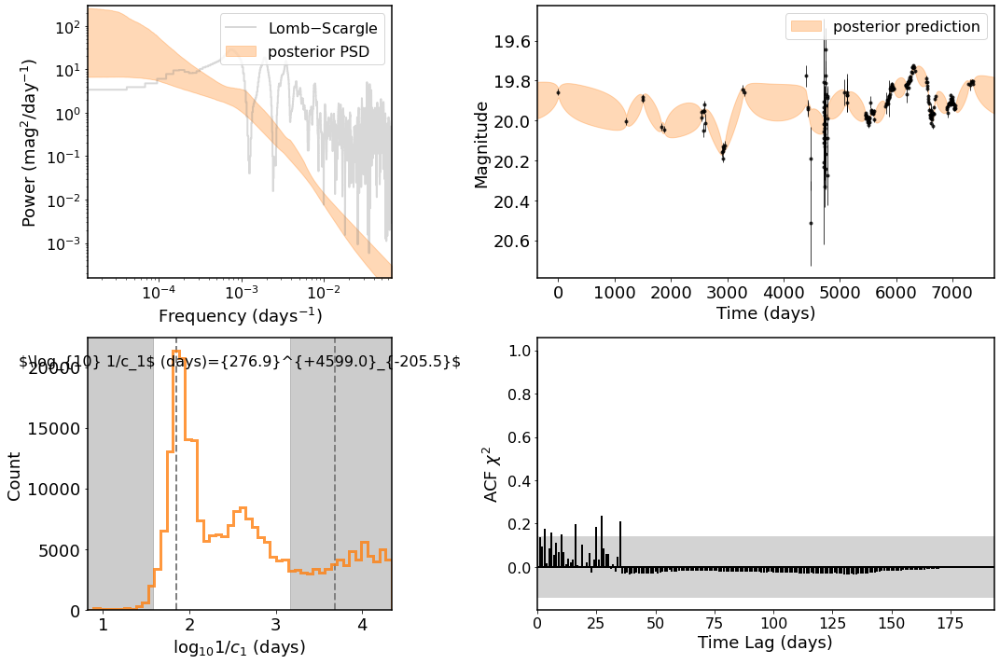

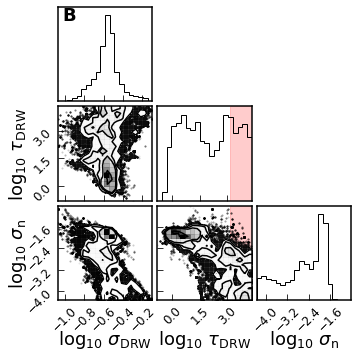

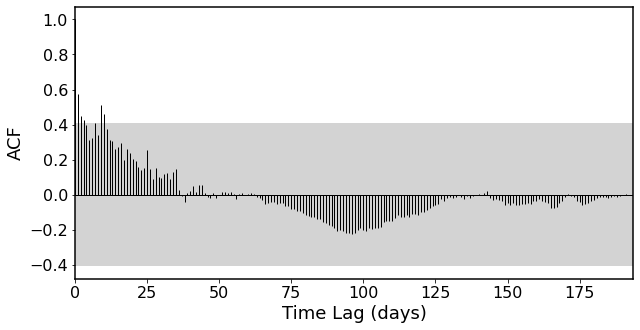

name                                                     2534406
ra                                                     40.815132
dec                                                    -0.342304
z                                                         0.8059
log_M_BH                                                8.564795
log_M_BH_e                                              0.082723
log_L5100                                              44.557769
log_L5100_e                                             0.103632
band                                                           g
unit                                                         mag
x              [51081.3984375, 51819.46875, 51875.21484375, 5...
y              [20.388055248375068, 20.773055477256904, 20.83...
yerr           [0.027000000700354576, 0.03999999910593033, 0....
RM                                                         False
LC_ref                                        Yang et al. (2020)
L_ref                    

/data/des90.a/data/cburke/conda/myenv/lib/python3.9/site-packages/emcee/moves/red_blue.py:99: RuntimeWarning: invalid value encountered in double_scalars
  lnpdiff = f + nlp - state.log_prob[j]


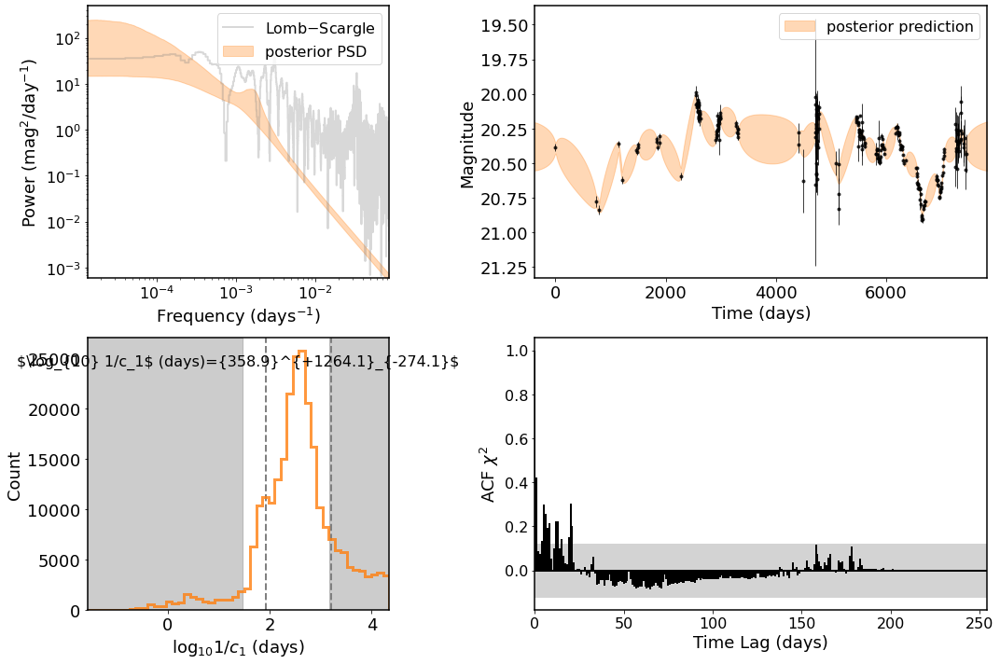

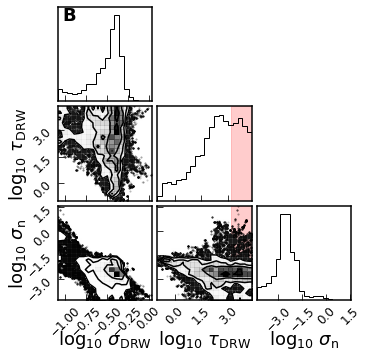

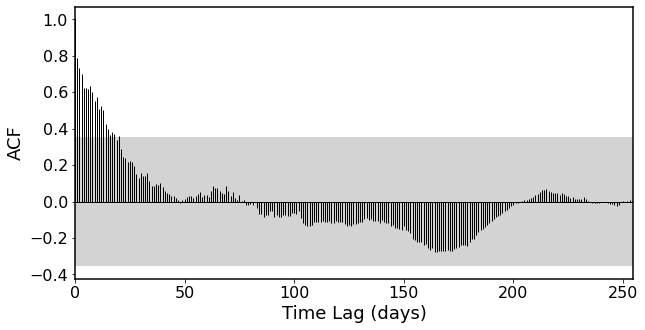

name                                                     2593261
ra                                                     43.091015
dec                                                     -0.56628
z                                                         2.0156
log_M_BH                                                8.410329
log_M_BH_e                                              0.187288
log_L5100                                              45.181544
log_L5100_e                                             0.033028
band                                                           g
unit                                                         mag
x              [51075.421875, 51818.390625, 52171.37890625, 5...
y              [20.39662989736064, 20.407631484274702, 20.544...
yerr           [0.024000000208616257, 0.024000000208616257, 0...
RM                                                         False
LC_ref                                        Yang et al. (2020)
L_ref                    

/data/des90.a/data/cburke/conda/myenv/lib/python3.9/site-packages/emcee/moves/red_blue.py:99: RuntimeWarning: invalid value encountered in double_scalars
  lnpdiff = f + nlp - state.log_prob[j]


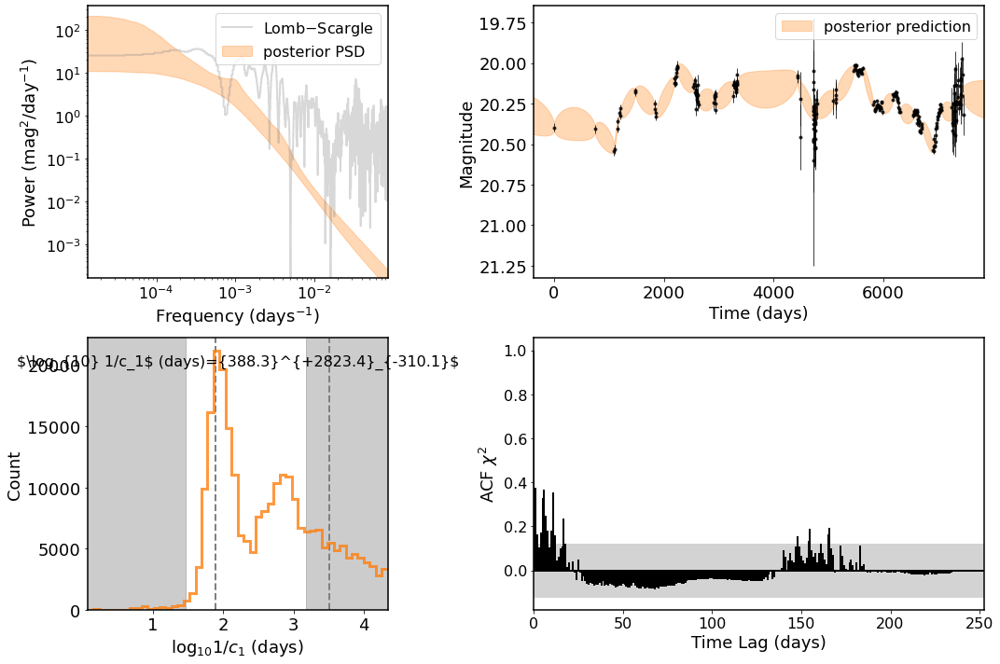

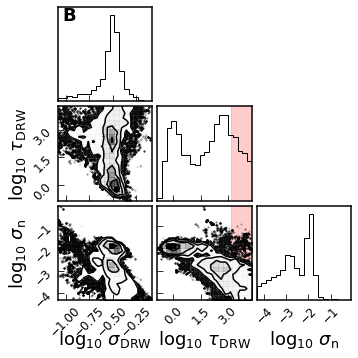

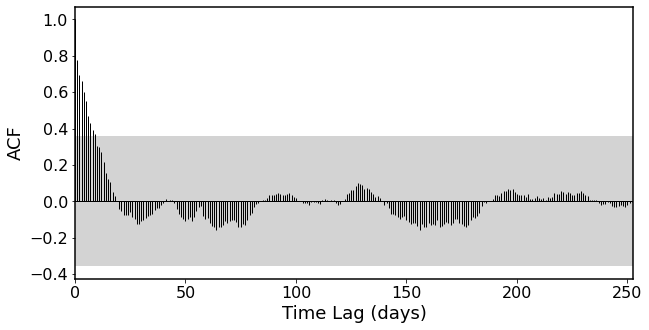

name                                                     2616632
ra                                                     42.628242
dec                                                    -0.133843
z                                                         1.4602
log_M_BH                                                9.233047
log_M_BH_e                                              0.043976
log_L5100                                              45.755783
log_L5100_e                                             0.002715
band                                                           g
unit                                                         mag
x              [51075.41796875, 51818.390625, 52171.37890625,...
y              [18.153965513891336, 18.28796629208958, 18.257...
yerr           [0.006000000052154064, 0.007000000216066837, 0...
RM                                                         False
LC_ref                                        Yang et al. (2020)
L_ref                    

/data/des90.a/data/cburke/conda/myenv/lib/python3.9/site-packages/emcee/moves/red_blue.py:99: RuntimeWarning: invalid value encountered in double_scalars
  lnpdiff = f + nlp - state.log_prob[j]


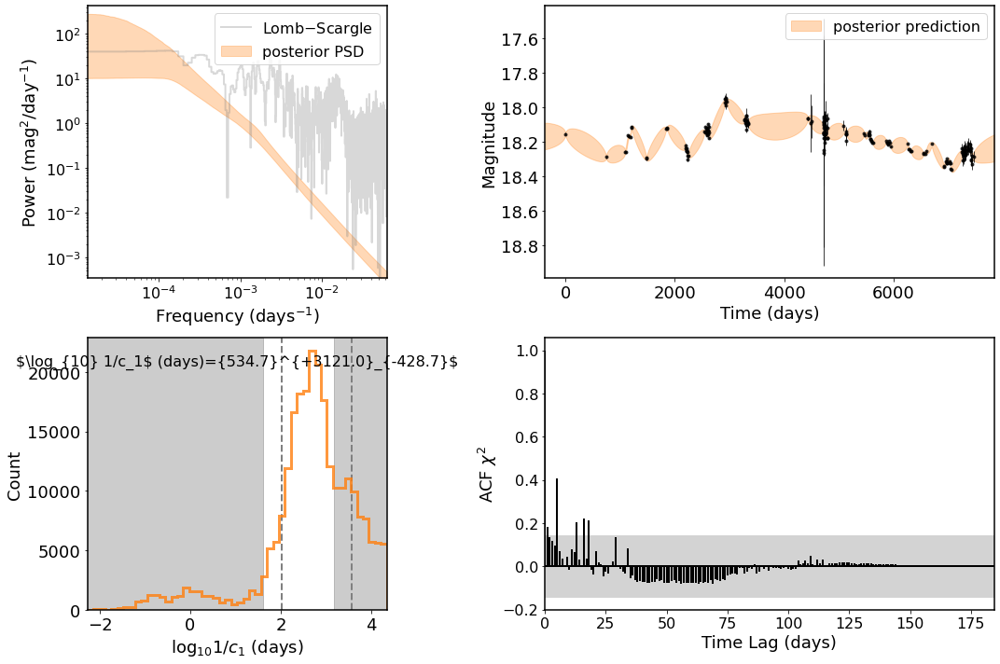

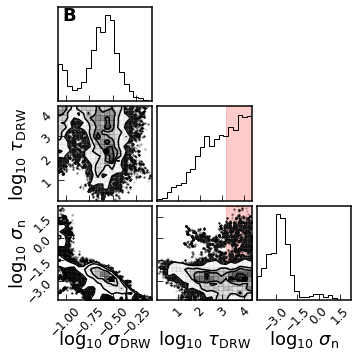

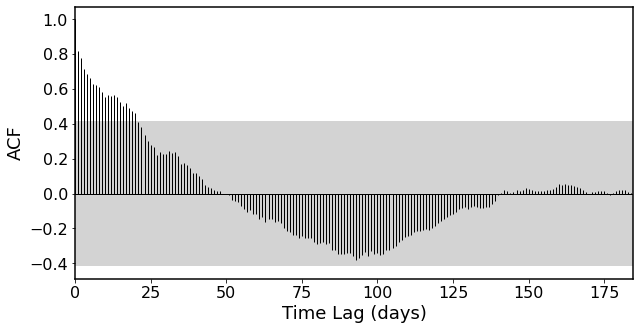

name                                                     2580699
ra                                                     42.881927
dec                                                     0.547727
z                                                         2.9191
log_M_BH                                                8.736966
log_M_BH_e                                               0.20836
log_L5100                                              45.298646
log_L5100_e                                             0.032807
band                                                           g
unit                                                         mag
x              [51081.40234375, 51819.4765625, 51875.21875, 5...
y              [20.6480259117738, 20.76502458425915, 20.74002...
yerr           [0.035999998450279236, 0.03799999877810478, 0....
RM                                                         False
LC_ref                                        Yang et al. (2020)
L_ref                    

/data/des90.a/data/cburke/conda/myenv/lib/python3.9/site-packages/emcee/moves/red_blue.py:99: RuntimeWarning: invalid value encountered in double_scalars
  lnpdiff = f + nlp - state.log_prob[j]


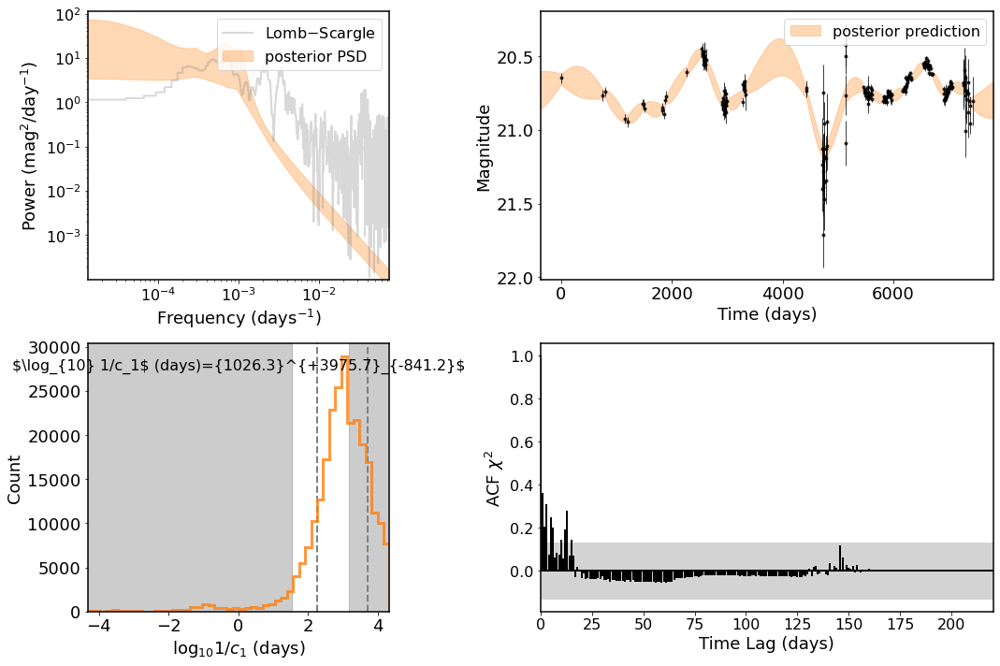

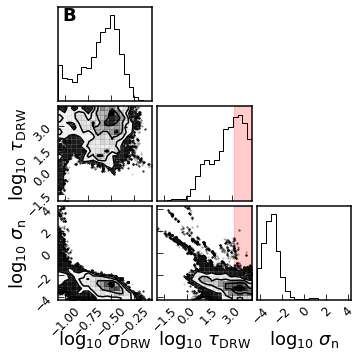

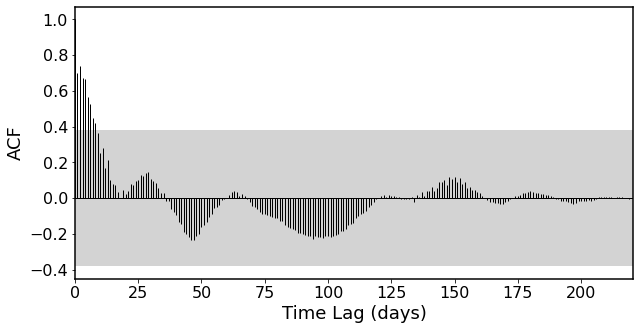

name                                                     2567584
ra                                                     41.299732
dec                                                    -1.221547
z                                                         2.4622
log_M_BH                                                8.754358
log_M_BH_e                                              0.179676
log_L5100                                              45.429832
log_L5100_e                                             0.047002
band                                                           g
unit                                                         mag
x              [51081.3984375, 51819.47265625, 51875.21484375...
y              [20.61230047526115, 20.32929952921623, 20.2683...
yerr           [0.035999998450279236, 0.03200000151991844, 0....
RM                                                         False
LC_ref                                        Yang et al. (2020)
L_ref                    

/data/des90.a/data/cburke/conda/myenv/lib/python3.9/site-packages/emcee/moves/red_blue.py:99: RuntimeWarning: invalid value encountered in double_scalars
  lnpdiff = f + nlp - state.log_prob[j]
/data/des90.a/data/cburke/conda/myenv/lib/python3.9/site-packages/numpy/core/_asarray.py:102: UserWarning: Warning: converting a masked element to nan.
  return array(a, dtype, copy=False, order=order)


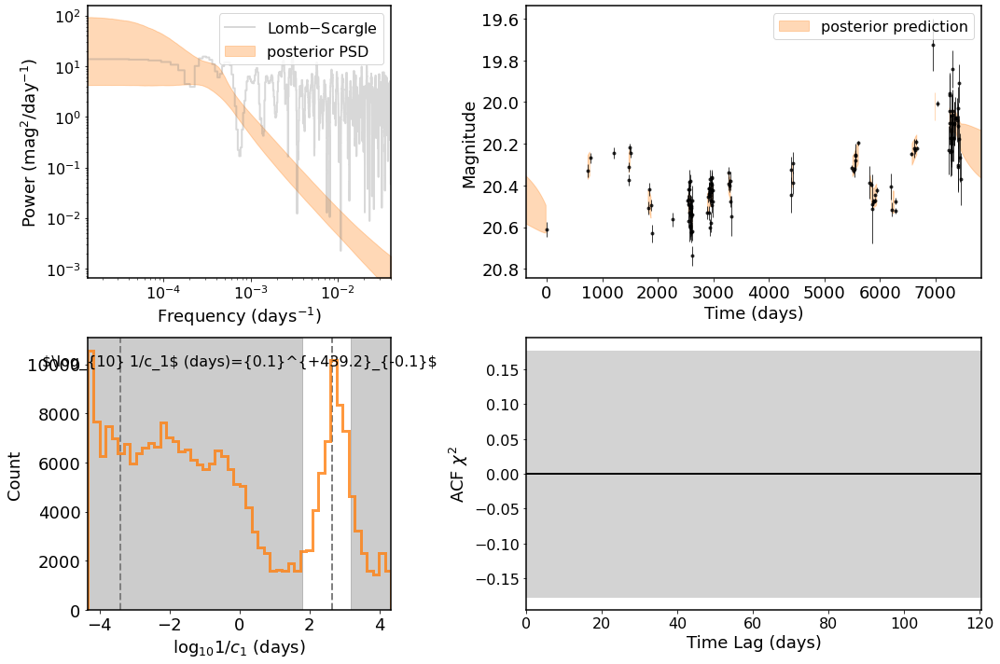

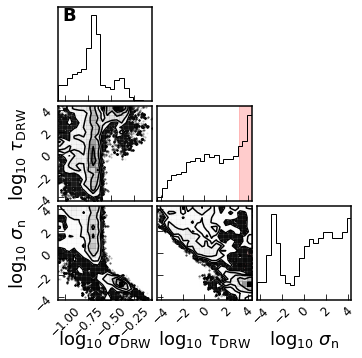

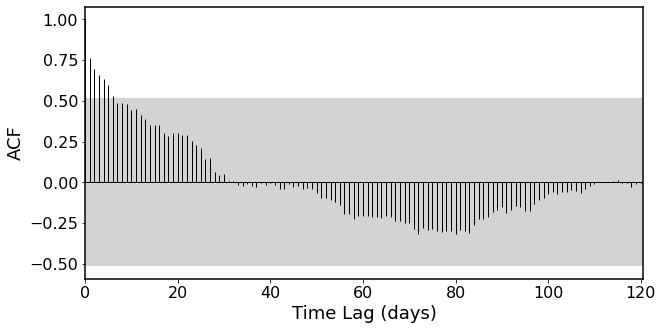

name                                                     2507583
ra                                                     43.072838
dec                                                    -0.880386
z                                                         0.9113
log_M_BH                                                8.577871
log_M_BH_e                                              0.120958
log_L5100                                              44.687139
log_L5100_e                                             0.006251
band                                                           g
unit                                                         mag
x              [51818.390625, 52171.37890625, 52173.35546875,...
y              [20.045621144735662, 20.07862018343195, 20.032...
yerr           [0.020999999716877937, 0.020999999716877937, 0...
RM                                                         False
LC_ref                                        Yang et al. (2020)
L_ref                    

/data/des90.a/data/cburke/conda/myenv/lib/python3.9/site-packages/emcee/moves/red_blue.py:99: RuntimeWarning: invalid value encountered in double_scalars
  lnpdiff = f + nlp - state.log_prob[j]


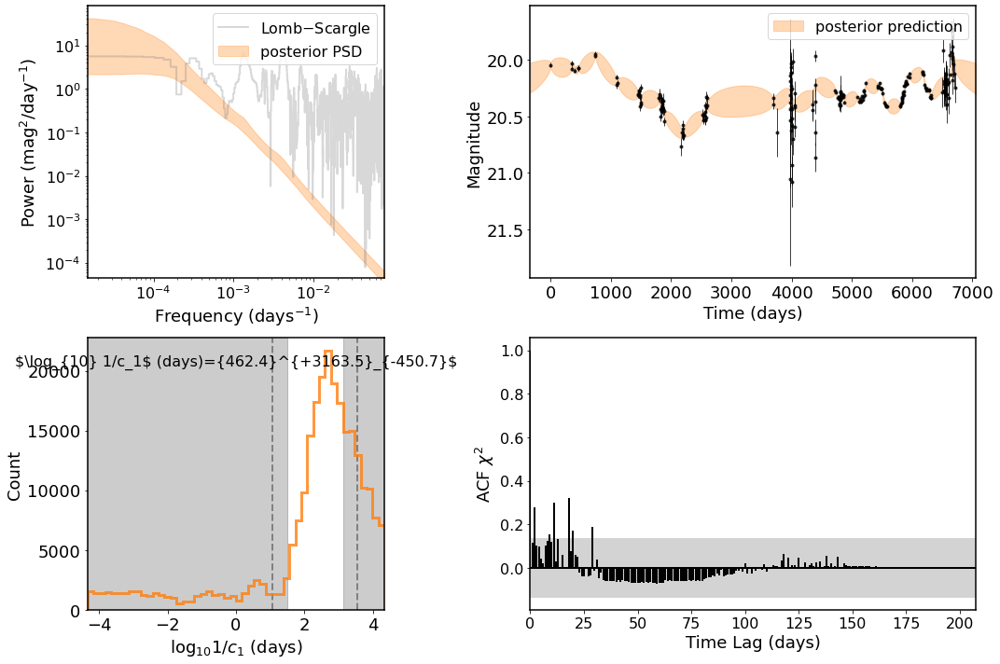

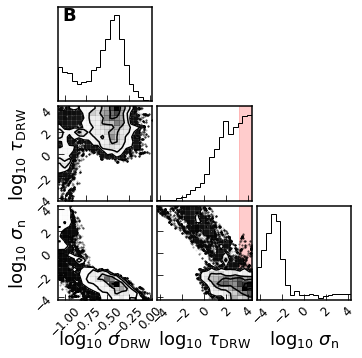

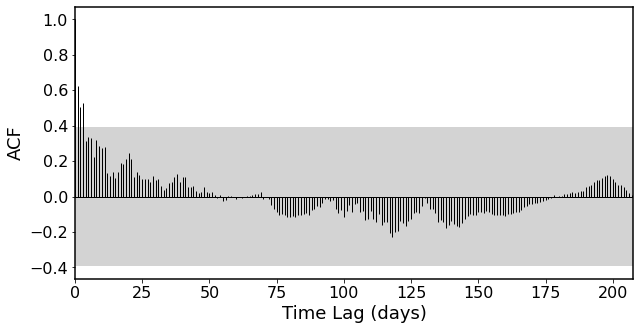

name                                                     2598355
ra                                                     41.178242
dec                                                    -0.706448
z                                                         0.6279
log_M_BH                                                8.193726
log_M_BH_e                                              0.179218
log_L5100                                              44.515948
log_L5100_e                                             0.014724
band                                                           g
unit                                                         mag
x              [51081.3984375, 51819.46875, 51875.21484375, 5...
y              [19.58849707583832, 19.611495885652772, 19.559...
yerr           [0.014999999664723873, 0.01899999938905239, 0....
RM                                                         False
LC_ref                                        Yang et al. (2020)
L_ref                    

/data/des90.a/data/cburke/conda/myenv/lib/python3.9/site-packages/emcee/moves/red_blue.py:99: RuntimeWarning: invalid value encountered in double_scalars
  lnpdiff = f + nlp - state.log_prob[j]


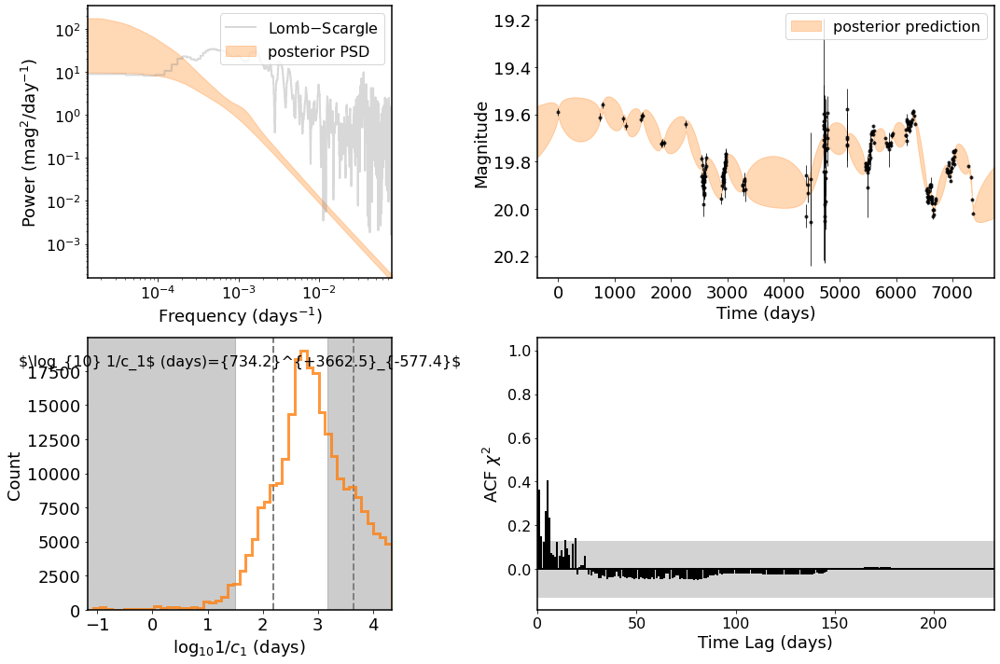

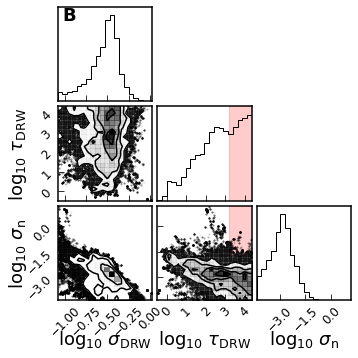

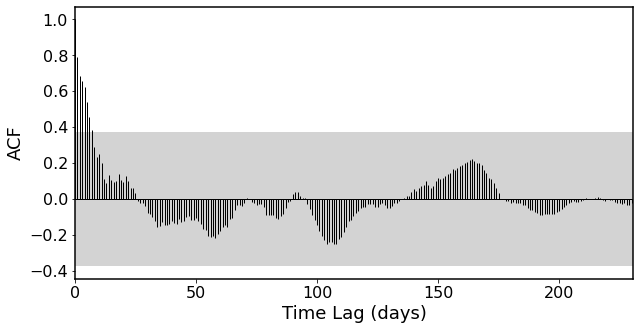

name                                                     2615997
ra                                                      42.11124
dec                                                    -0.695674
z                                                         3.0023
log_M_BH                                                9.828844
log_M_BH_e                                              0.197236
log_L5100                                              45.750272
log_L5100_e                                             0.024638
band                                                           g
unit                                                         mag
x              [51081.40234375, 51819.47265625, 51875.21875, ...
y              [19.769063780133607, 19.803064176862122, 19.82...
yerr           [0.017999999225139618, 0.01899999938905239, 0....
RM                                                         False
LC_ref                                        Yang et al. (2020)
L_ref                    

/data/des90.a/data/cburke/conda/myenv/lib/python3.9/site-packages/emcee/moves/red_blue.py:99: RuntimeWarning: invalid value encountered in double_scalars
  lnpdiff = f + nlp - state.log_prob[j]


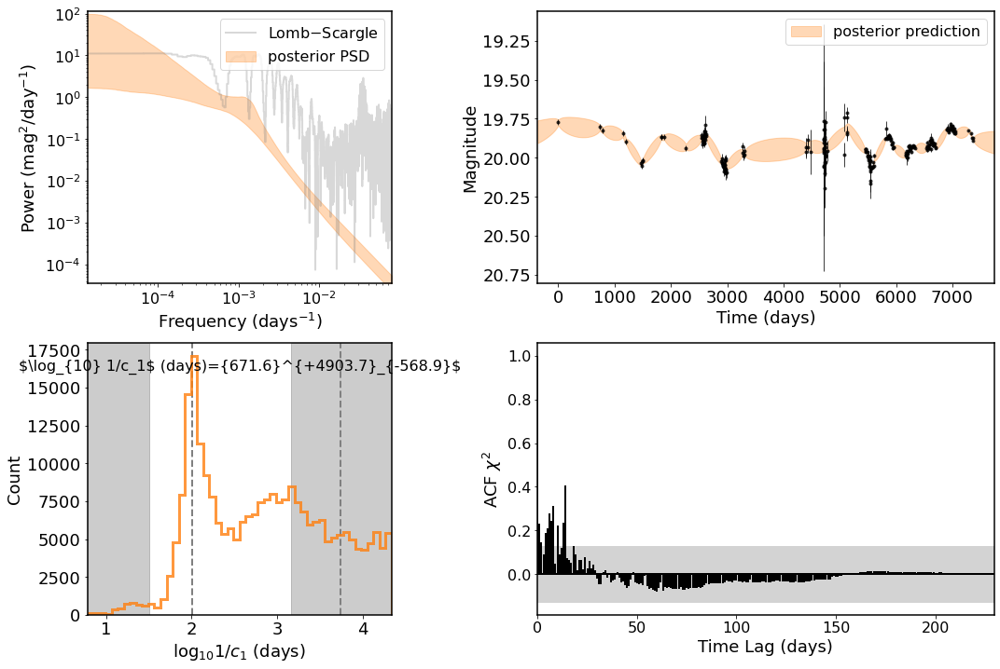

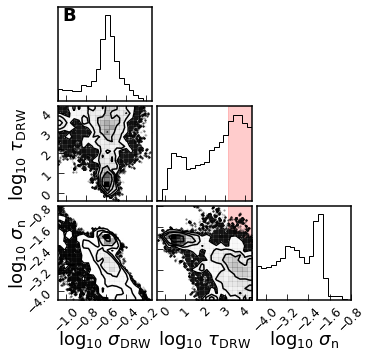

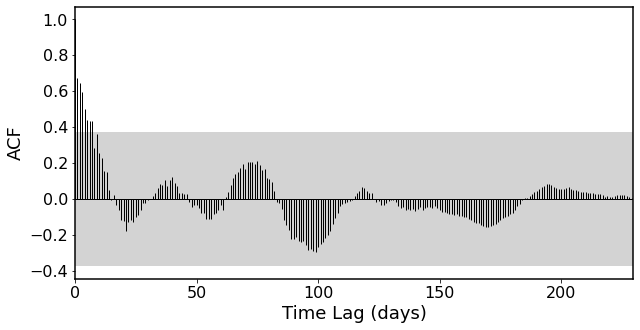

name                                                     2509117
ra                                                     43.298771
dec                                                    -0.711612
z                                                         1.5378
log_M_BH                                                8.368841
log_M_BH_e                                              0.341652
log_L5100                                              45.108438
log_L5100_e                                             0.014405
band                                                           g
unit                                                         mag
x              [51081.40625, 51819.4765625, 51875.21875, 5222...
y              [20.012414249898953, 19.958413395406765, 20.08...
yerr           [0.02199999988079071, 0.020999999716877937, 0....
RM                                                         False
LC_ref                                        Yang et al. (2020)
L_ref                    

/data/des90.a/data/cburke/conda/myenv/lib/python3.9/site-packages/emcee/moves/red_blue.py:99: RuntimeWarning: invalid value encountered in double_scalars
  lnpdiff = f + nlp - state.log_prob[j]


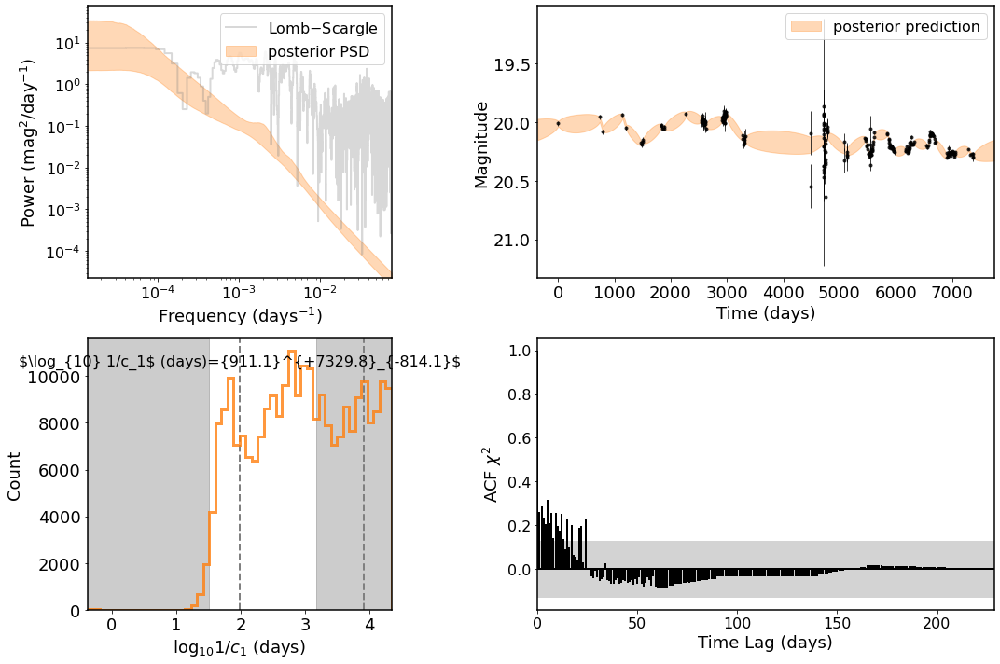

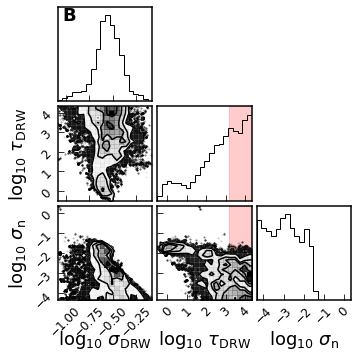

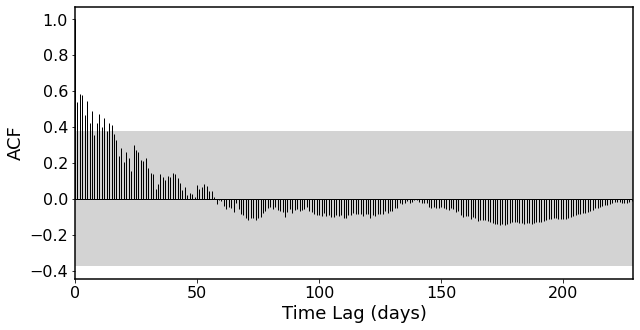

name                                                     2549476
ra                                                     42.523727
dec                                                    -0.681942
z                                                          1.317
log_M_BH                                                8.527071
log_M_BH_e                                               0.13385
log_L5100                                               44.83714
log_L5100_e                                             0.010515
band                                                           g
unit                                                         mag
x              [51819.47265625, 51875.21875, 52288.1328125, 5...
y              [20.20060350185375, 20.30660249477367, 20.5046...
yerr           [0.02500000037252903, 0.024000000208616257, 0....
RM                                                         False
LC_ref                                        Yang et al. (2020)
L_ref                    

/data/des90.a/data/cburke/conda/myenv/lib/python3.9/site-packages/emcee/moves/red_blue.py:99: RuntimeWarning: invalid value encountered in double_scalars
  lnpdiff = f + nlp - state.log_prob[j]


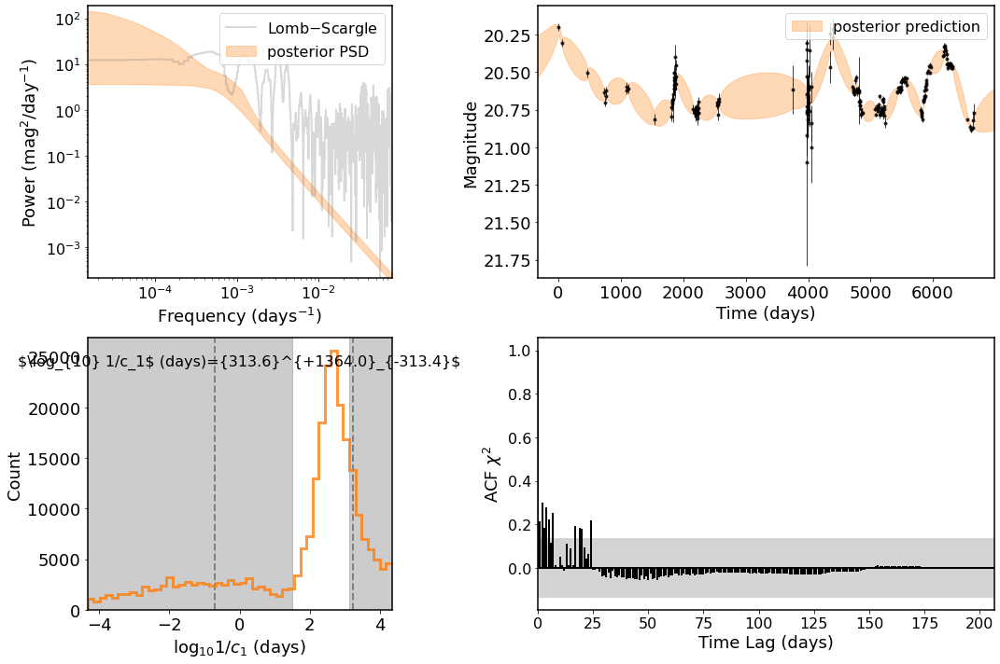

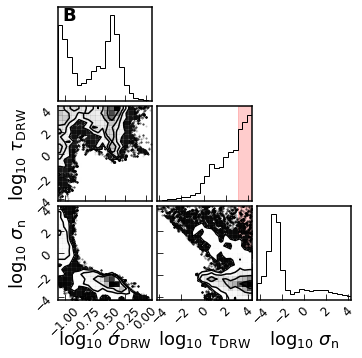

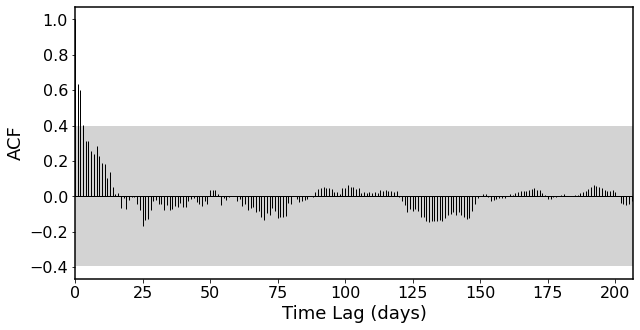

name                                                     2579128
ra                                                     42.098003
dec                                                     0.597979
z                                                         1.0149
log_M_BH                                                8.287412
log_M_BH_e                                              0.214559
log_L5100                                              44.869282
log_L5100_e                                             0.007509
band                                                           g
unit                                                         mag
x              [51081.40234375, 51819.47265625, 51875.2148437...
y              [19.65235775011, 19.76435726182875, 19.6893564...
yerr           [0.01600000075995922, 0.01899999938905239, 0.0...
RM                                                         False
LC_ref                                        Yang et al. (2020)
L_ref                    

/data/des90.a/data/cburke/conda/myenv/lib/python3.9/site-packages/emcee/moves/red_blue.py:99: RuntimeWarning: invalid value encountered in double_scalars
  lnpdiff = f + nlp - state.log_prob[j]


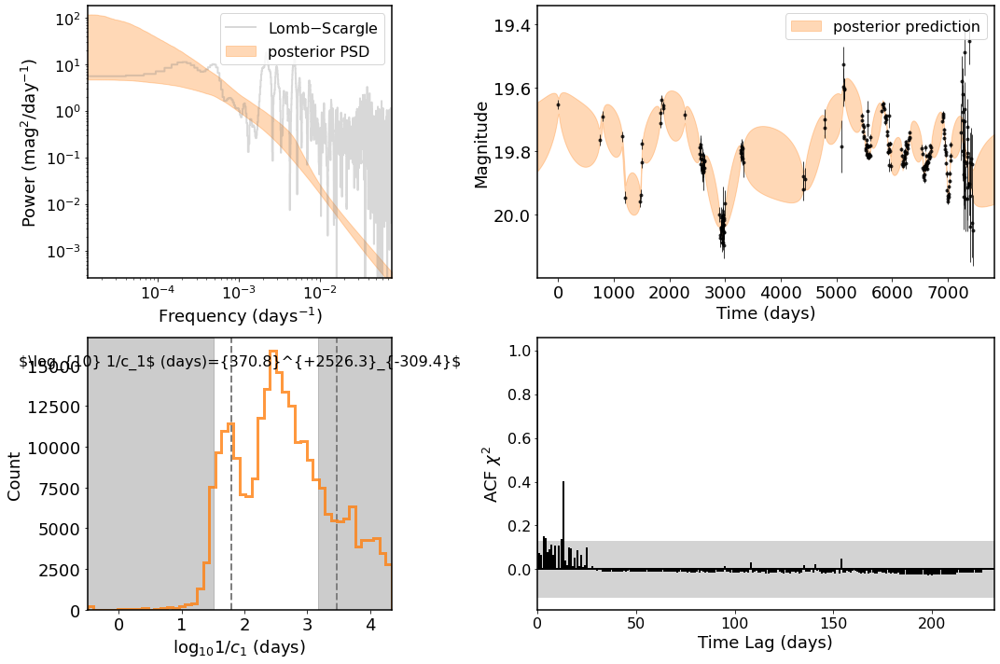

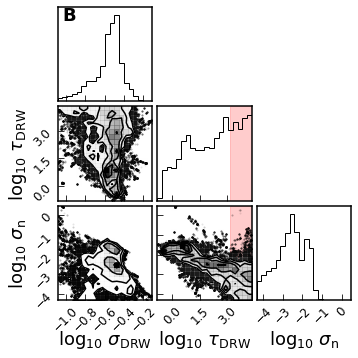

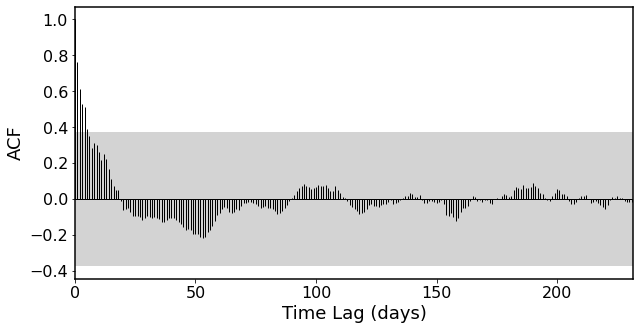

name                                                     2593550
ra                                                     41.300503
dec                                                    -1.220551
z                                                           2.46
log_M_BH                                                8.368686
log_M_BH_e                                              1.430798
log_L5100                                              45.525299
log_L5100_e                                             0.032137
band                                                           g
unit                                                         mag
x              [51081.3984375, 51819.47265625, 51875.21484375...
y              [20.001235284366942, 20.04223565057788, 19.968...
yerr           [0.02199999988079071, 0.02500000037252903, 0.0...
RM                                                         False
LC_ref                                        Yang et al. (2020)
L_ref                    

/data/des90.a/data/cburke/conda/myenv/lib/python3.9/site-packages/emcee/moves/red_blue.py:99: RuntimeWarning: invalid value encountered in double_scalars
  lnpdiff = f + nlp - state.log_prob[j]


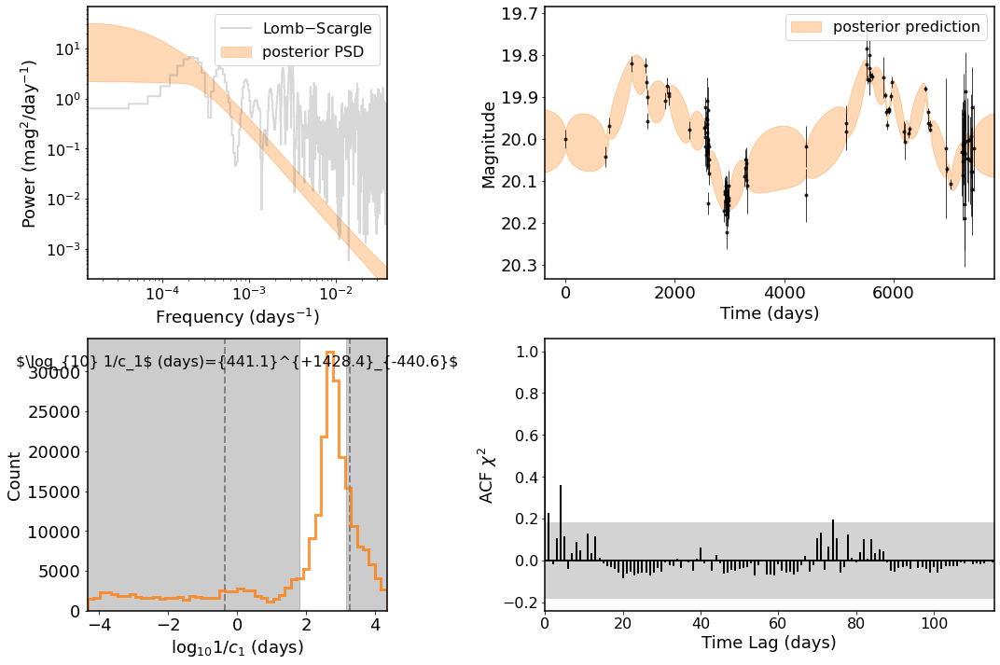

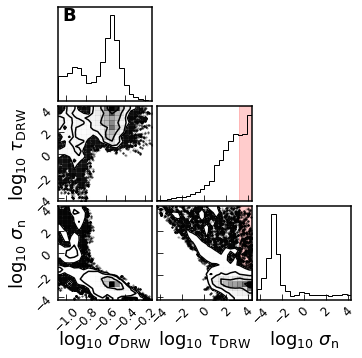

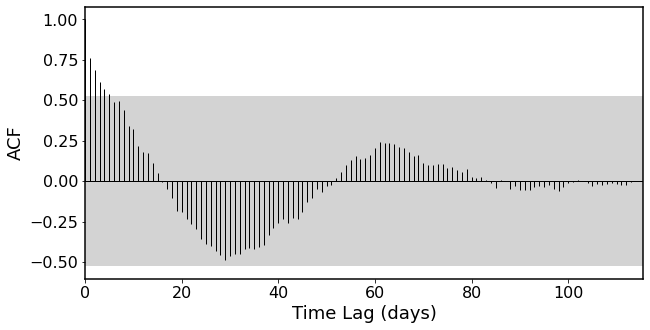

name                                                     2564901
ra                                                     43.303944
dec                                                    -0.624882
z                                                         0.9821
log_M_BH                                                8.450513
log_M_BH_e                                              0.122227
log_L5100                                              44.398366
log_L5100_e                                             0.008985
band                                                           g
unit                                                         mag
x              [51081.40625, 51818.390625, 52171.37890625, 52...
y              [20.405085424589018, 20.828085760282377, 20.88...
yerr           [0.029999999329447746, 0.03099999949336052, 0....
RM                                                         False
LC_ref                                        Yang et al. (2020)
L_ref                    

/data/des90.a/data/cburke/conda/myenv/lib/python3.9/site-packages/emcee/moves/red_blue.py:99: RuntimeWarning: invalid value encountered in double_scalars
  lnpdiff = f + nlp - state.log_prob[j]


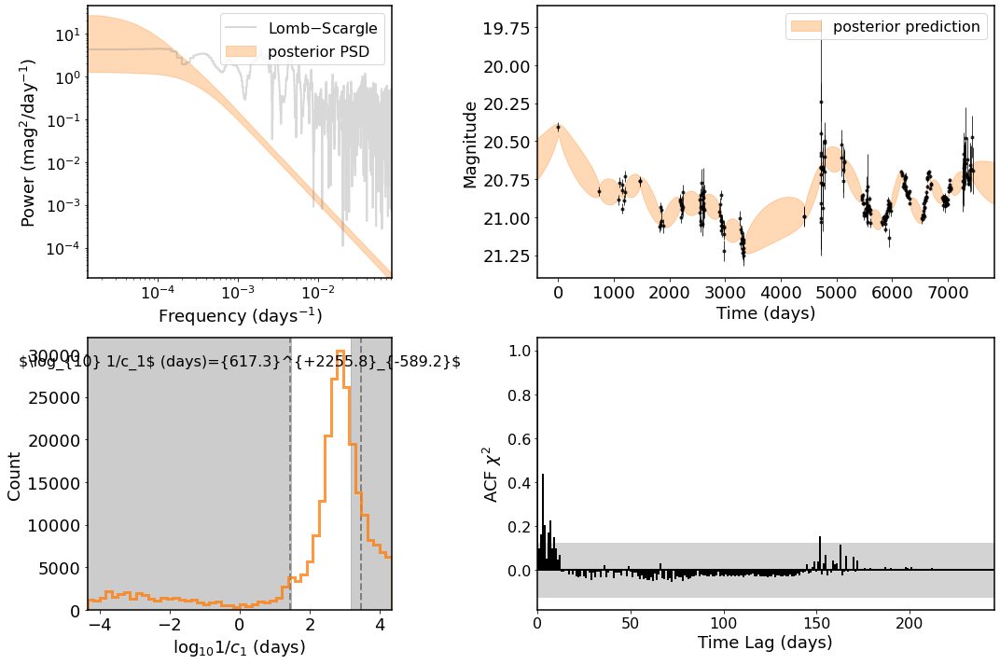

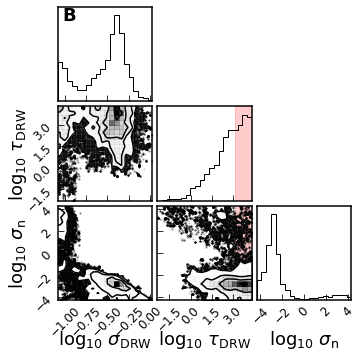

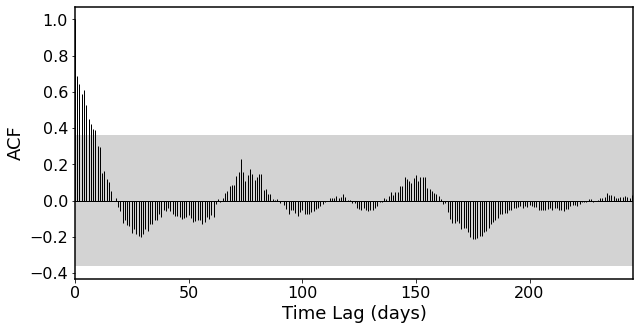

name                                                     2605412
ra                                                     40.738354
dec                                                    -0.763748
z                                                         1.7737
log_M_BH                                                8.564161
log_M_BH_e                                              0.360584
log_L5100                                              44.880655
log_L5100_e                                             0.047324
band                                                           g
unit                                                         mag
x              [51081.3984375, 51819.46875, 51875.21484375, 5...
y              [20.852651891493196, 20.75965147950589, 20.570...
yerr           [0.03799999877810478, 0.039000000804662704, 0....
RM                                                         False
LC_ref                                        Yang et al. (2020)
L_ref                    

/data/des90.a/data/cburke/conda/myenv/lib/python3.9/site-packages/emcee/moves/red_blue.py:99: RuntimeWarning: invalid value encountered in double_scalars
  lnpdiff = f + nlp - state.log_prob[j]


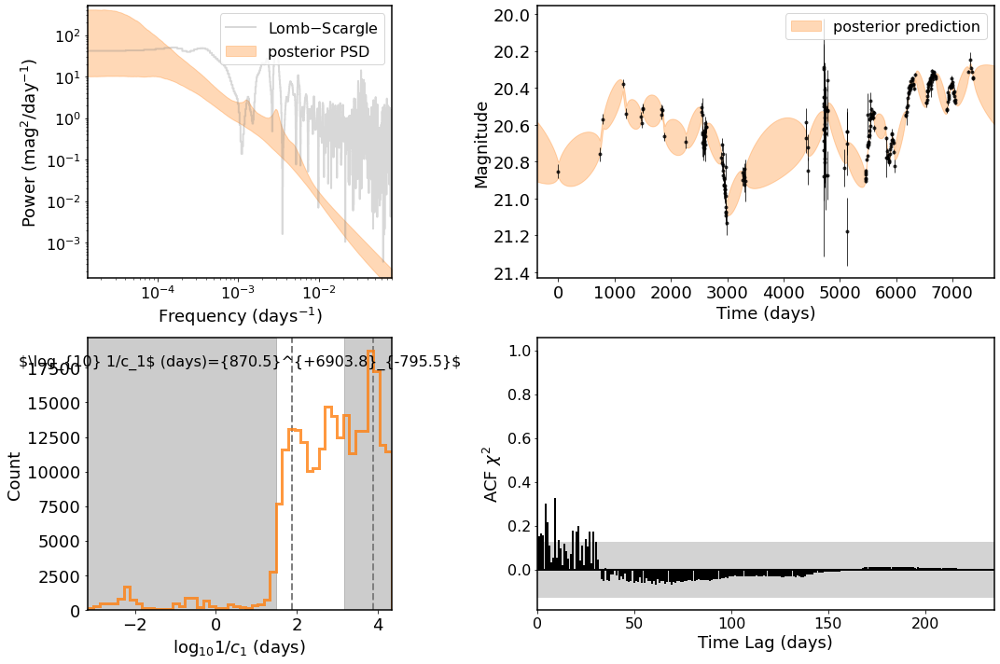

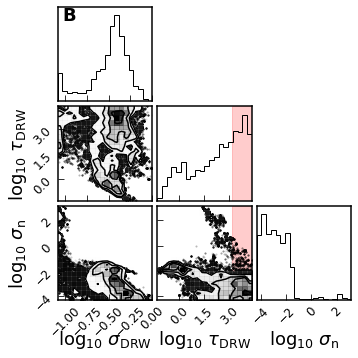

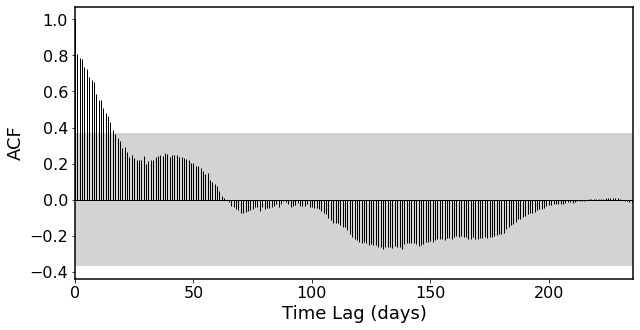

name                                                     2608769
ra                                                     41.763538
dec                                                    -1.008888
z                                                         2.5314
log_M_BH                                                8.350258
log_M_BH_e                                              0.139493
log_L5100                                               45.45868
log_L5100_e                                             0.032279
band                                                           g
unit                                                         mag
x              [51075.41796875, 51818.38671875, 52171.375, 52...
y              [20.50750733526573, 20.667507182677838, 20.914...
yerr           [0.02800000086426735, 0.03200000151991844, 0.0...
RM                                                         False
LC_ref                                        Yang et al. (2020)
L_ref                    

/data/des90.a/data/cburke/conda/myenv/lib/python3.9/site-packages/emcee/moves/red_blue.py:99: RuntimeWarning: invalid value encountered in double_scalars
  lnpdiff = f + nlp - state.log_prob[j]


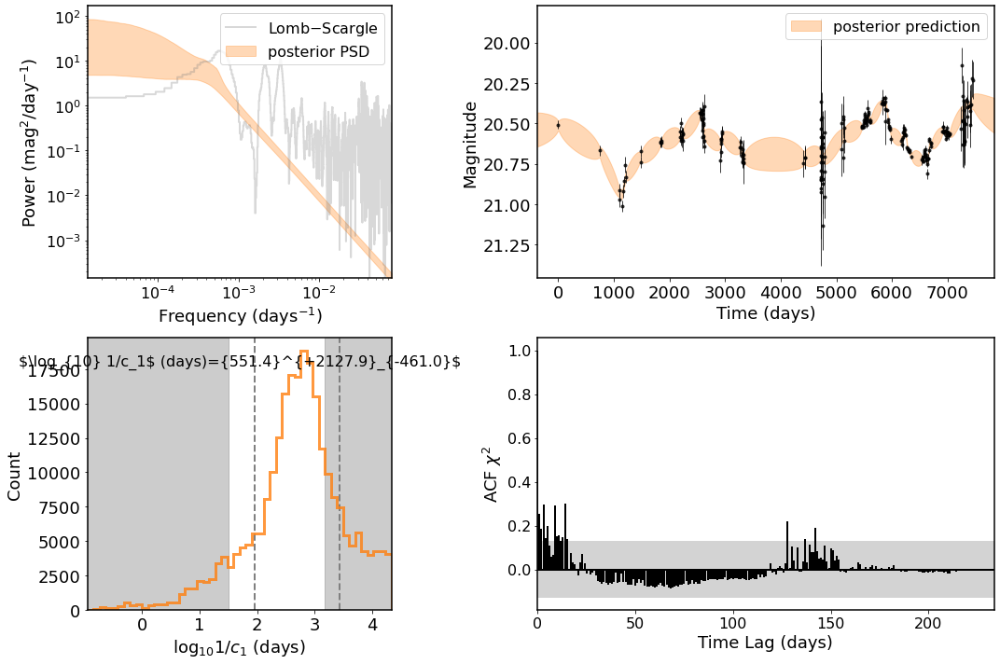

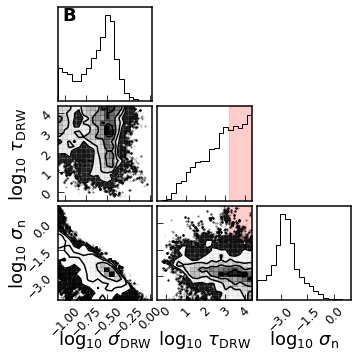

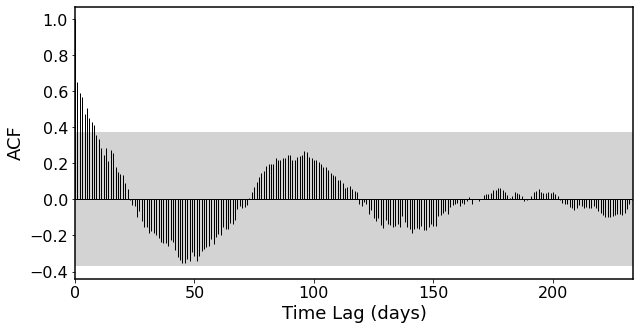

name                                                     2555319
ra                                                     41.381393
dec                                                    -0.436744
z                                                         2.0858
log_M_BH                                                8.296897
log_M_BH_e                                              0.323744
log_L5100                                              45.324107
log_L5100_e                                             0.028735
band                                                           g
unit                                                         mag
x              [51075.41796875, 51818.38671875, 51819.4726562...
y              [20.629079440987795, 20.394078830636232, 20.40...
yerr           [0.02800000086426735, 0.024000000208616257, 0....
RM                                                         False
LC_ref                                        Yang et al. (2020)
L_ref                    

/data/des90.a/data/cburke/conda/myenv/lib/python3.9/site-packages/emcee/moves/red_blue.py:99: RuntimeWarning: invalid value encountered in double_scalars
  lnpdiff = f + nlp - state.log_prob[j]


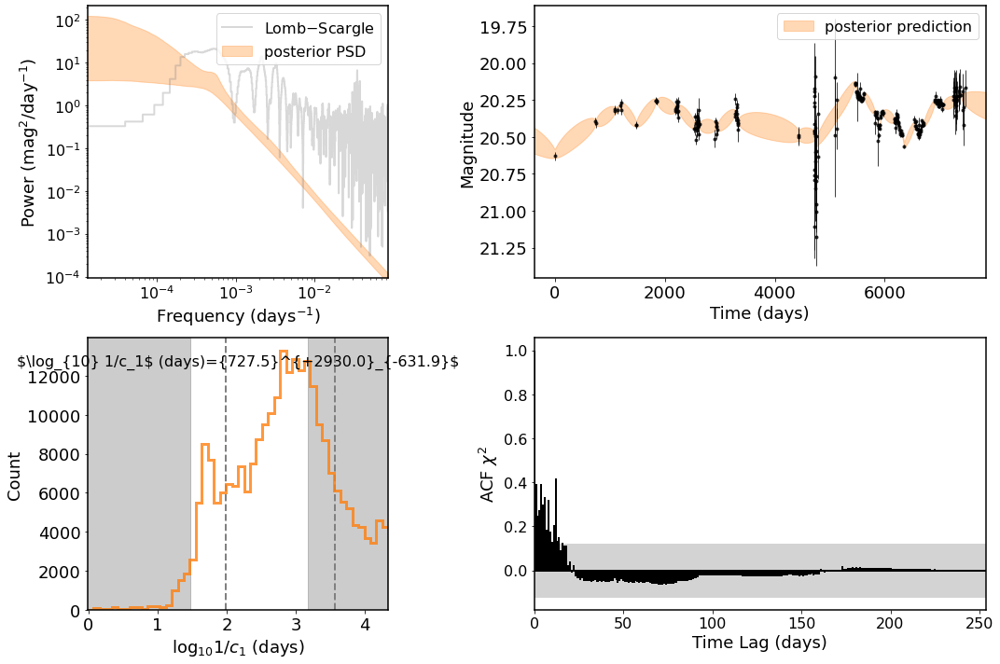

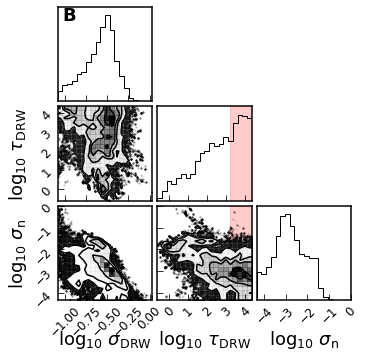

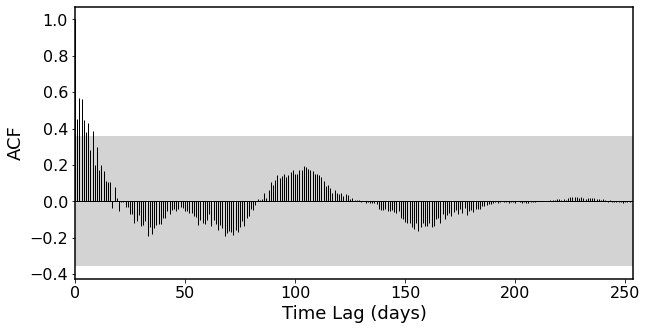

name                                                     2490551
ra                                                     42.476624
dec                                                     0.615079
z                                                         1.7215
log_M_BH                                                8.934392
log_M_BH_e                                              0.107232
log_L5100                                              45.247054
log_L5100_e                                             0.011453
band                                                           g
unit                                                         mag
x              [51081.40234375, 51875.21875, 52225.296875, 52...
y              [20.50617423866869, 20.103174360739004, 20.063...
yerr           [0.029999999329447746, 0.019999999552965164, 0...
RM                                                         False
LC_ref                                        Yang et al. (2020)
L_ref                    

/data/des90.a/data/cburke/conda/myenv/lib/python3.9/site-packages/emcee/moves/red_blue.py:99: RuntimeWarning: invalid value encountered in double_scalars
  lnpdiff = f + nlp - state.log_prob[j]


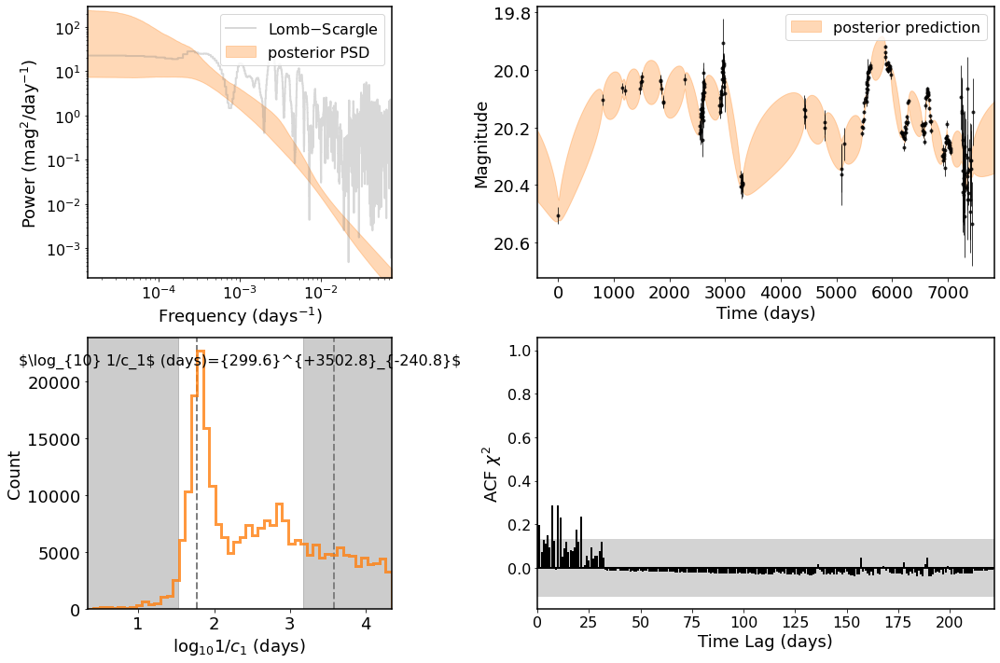

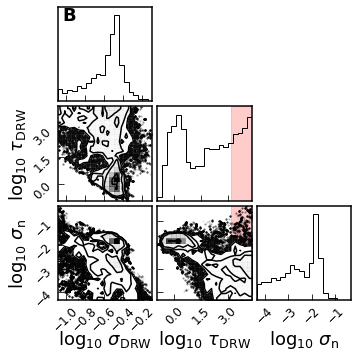

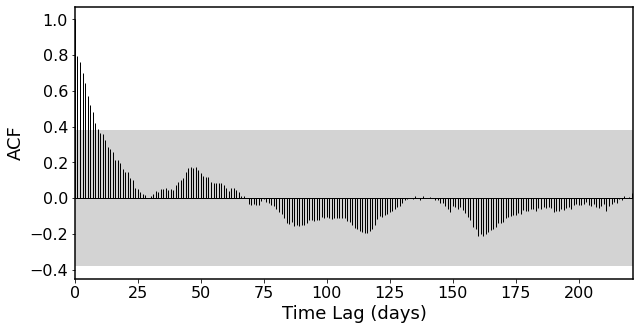

name                                                     2491276
ra                                                     43.089779
dec                                                     0.475709
z                                                         1.2508
log_M_BH                                                8.727748
log_M_BH_e                                              0.137391
log_L5100                                              45.085907
log_L5100_e                                             0.016904
band                                                           g
unit                                                         mag
x              [51819.4765625, 51875.21875, 52225.30078125, 5...
y              [19.845209970760493, 19.806208505916743, 20.15...
yerr           [0.01899999938905239, 0.01600000075995922, 0.0...
RM                                                         False
LC_ref                                        Yang et al. (2020)
L_ref                    

/data/des90.a/data/cburke/conda/myenv/lib/python3.9/site-packages/emcee/moves/red_blue.py:99: RuntimeWarning: invalid value encountered in double_scalars
  lnpdiff = f + nlp - state.log_prob[j]


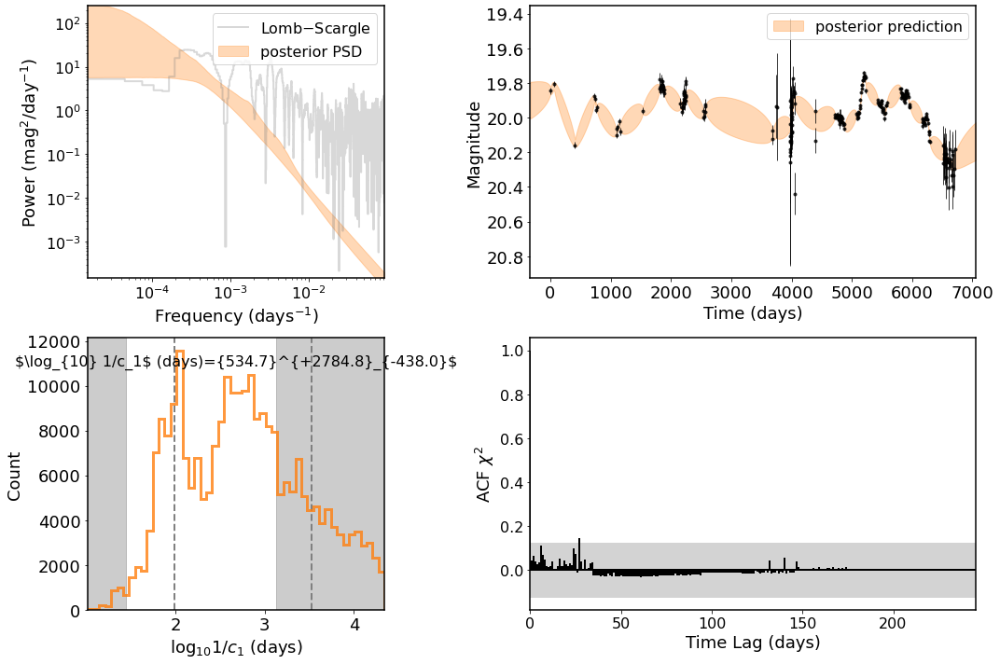

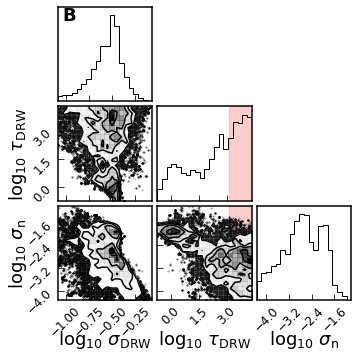

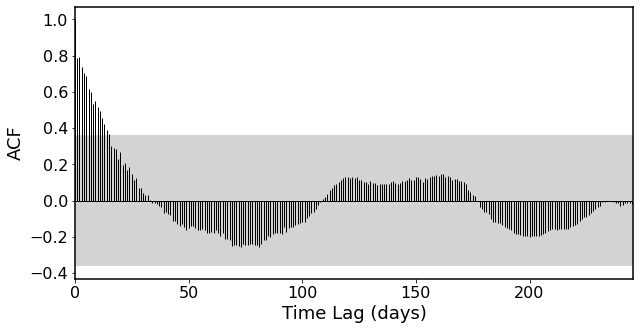

name                                                     2521752
ra                                                     41.229939
dec                                                    -0.417082
z                                                         1.2998
log_M_BH                                                9.241466
log_M_BH_e                                              0.192742
log_L5100                                              45.197359
log_L5100_e                                             0.010148
band                                                           g
unit                                                         mag
x              [51818.38671875, 51819.46875, 51875.21484375, ...
y              [19.52420582233856, 19.516206402172543, 19.679...
yerr           [0.013000000268220901, 0.01600000075995922, 0....
RM                                                         False
LC_ref                                        Yang et al. (2020)
L_ref                    

/data/des90.a/data/cburke/conda/myenv/lib/python3.9/site-packages/emcee/moves/red_blue.py:99: RuntimeWarning: invalid value encountered in double_scalars
  lnpdiff = f + nlp - state.log_prob[j]


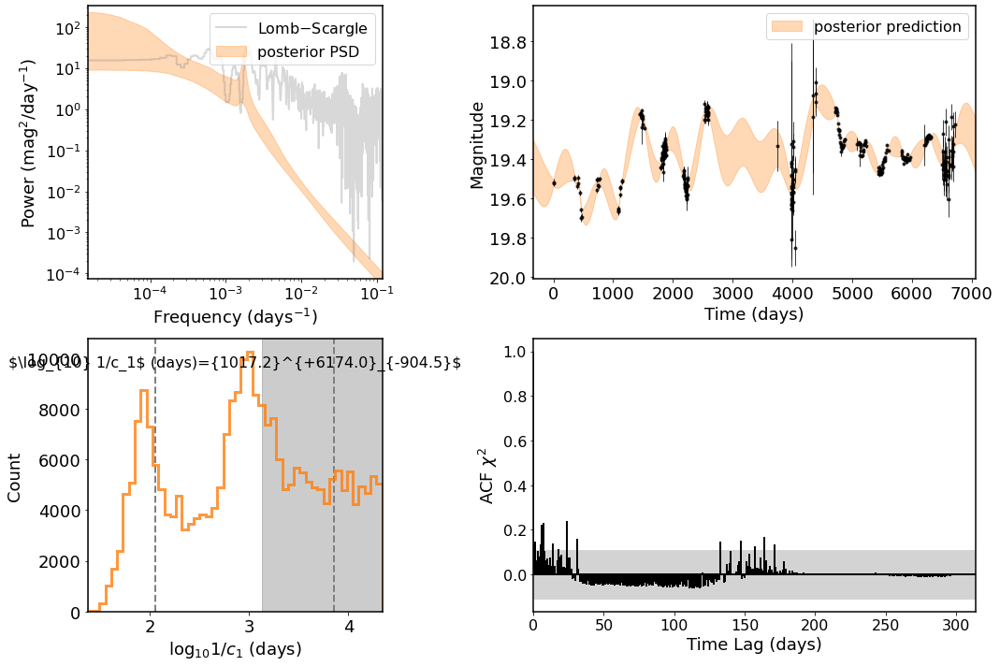

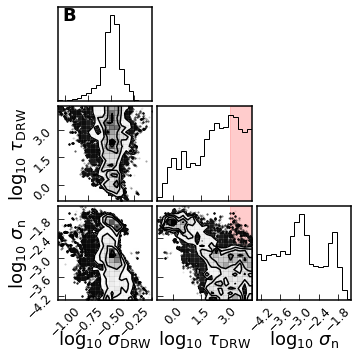

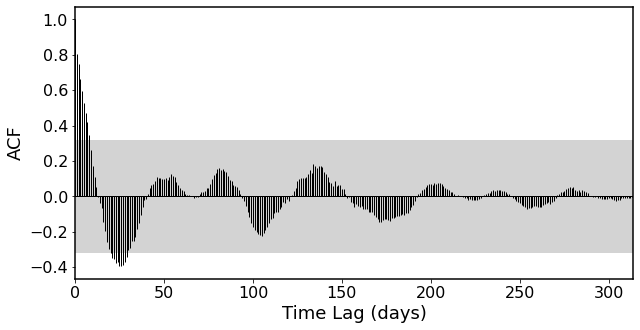

name                                                     2495465
ra                                                     43.372341
dec                                                     0.464943
z                                                         0.9552
log_M_BH                                                8.814842
log_M_BH_e                                              0.129377
log_L5100                                               44.72396
log_L5100_e                                             0.006828
band                                                           g
unit                                                         mag
x              [51081.40625, 51819.4765625, 51875.21875, 5222...
y              [20.343229807357886, 19.92523053977976, 20.062...
yerr           [0.027000000700354576, 0.020999999716877937, 0...
RM                                                         False
LC_ref                                        Yang et al. (2020)
L_ref                    

/data/des90.a/data/cburke/conda/myenv/lib/python3.9/site-packages/emcee/moves/red_blue.py:99: RuntimeWarning: invalid value encountered in double_scalars
  lnpdiff = f + nlp - state.log_prob[j]


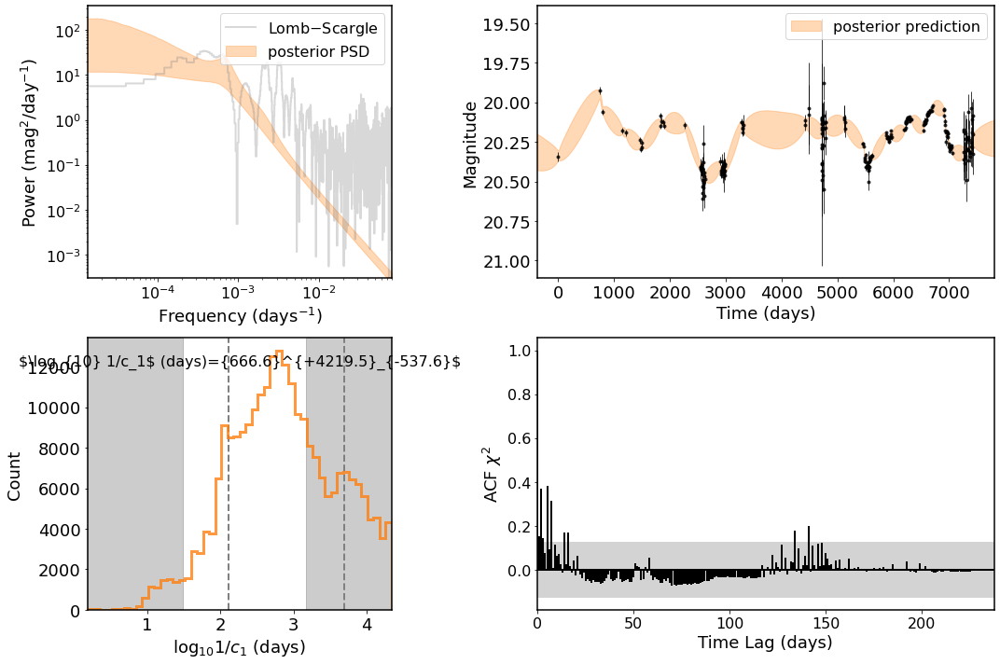

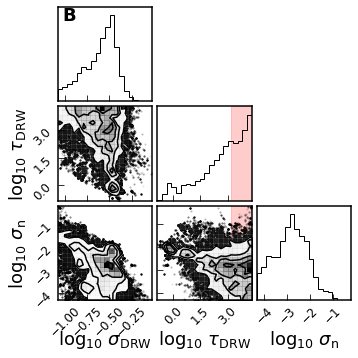

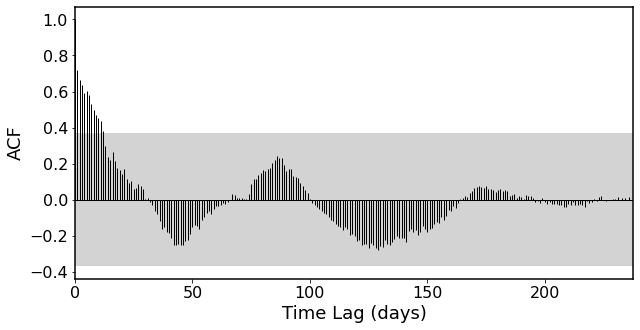

name                                                     2500072
ra                                                     42.964676
dec                                                    -0.068666
z                                                         2.0876
log_M_BH                                                8.675186
log_M_BH_e                                              0.772466
log_L5100                                              45.156966
log_L5100_e                                             0.038182
band                                                           g
unit                                                         mag
x              [51075.421875, 51818.390625, 52171.37890625, 5...
y              [20.514027093518095, 20.583025430310087, 20.37...
yerr           [0.02500000037252903, 0.026000000536441803, 0....
RM                                                         False
LC_ref                                        Yang et al. (2020)
L_ref                    

/data/des90.a/data/cburke/conda/myenv/lib/python3.9/site-packages/emcee/moves/red_blue.py:99: RuntimeWarning: invalid value encountered in double_scalars
  lnpdiff = f + nlp - state.log_prob[j]


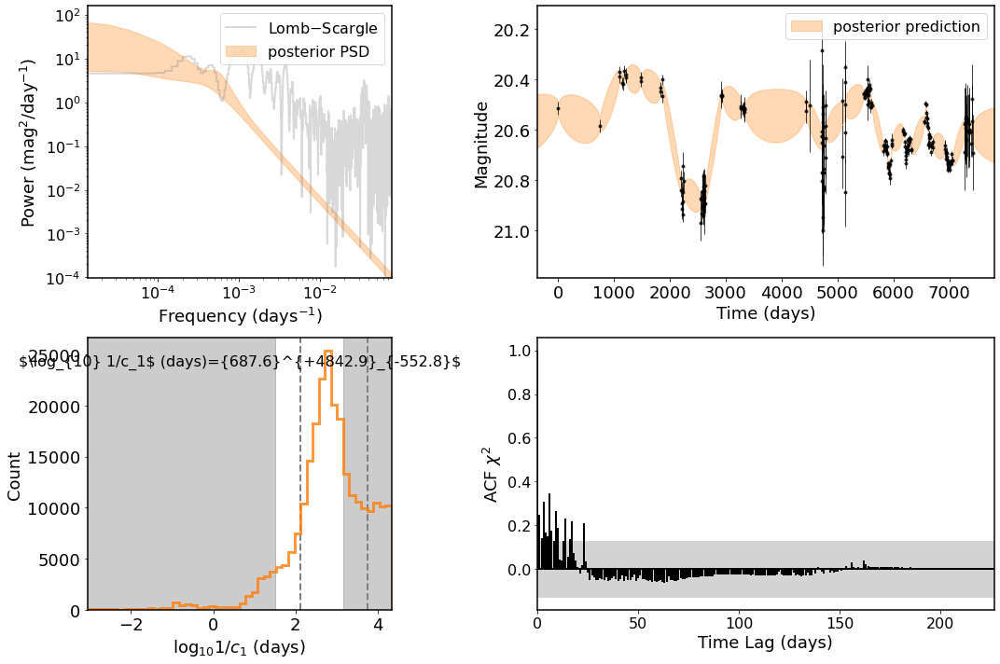

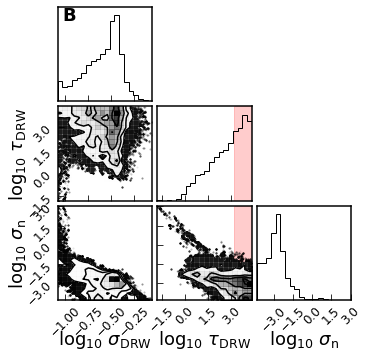

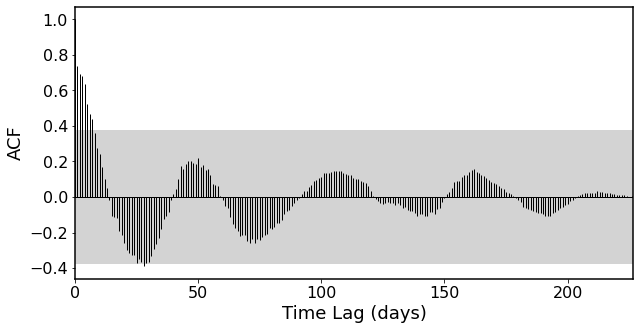

name                                                     2577933
ra                                                      42.71096
dec                                                      0.75093
z                                                         2.0529
log_M_BH                                                 8.34456
log_M_BH_e                                              0.766735
log_L5100                                              45.480513
log_L5100_e                                             0.033394
band                                                           g
unit                                                         mag
x              [51075.41796875, 51818.390625, 52171.37890625,...
y              [20.08877626232882, 19.92677560620089, 20.0407...
yerr           [0.019999999552965164, 0.017000000923871994, 0...
RM                                                         False
LC_ref                                        Yang et al. (2020)
L_ref                    

/data/des90.a/data/cburke/conda/myenv/lib/python3.9/site-packages/emcee/moves/red_blue.py:99: RuntimeWarning: invalid value encountered in double_scalars
  lnpdiff = f + nlp - state.log_prob[j]


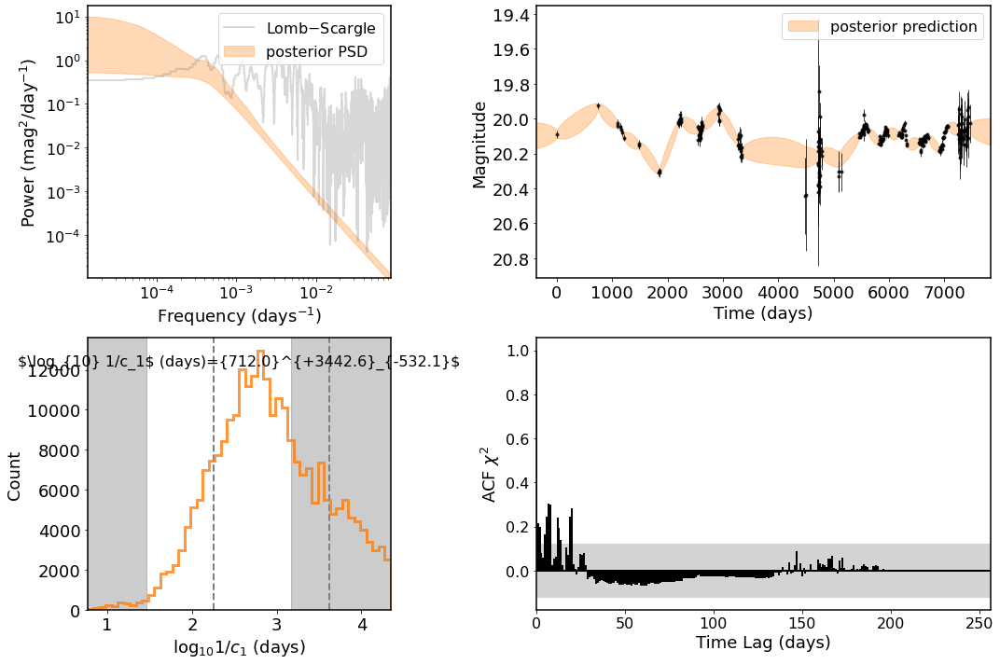

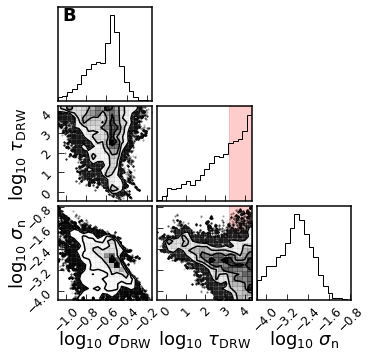

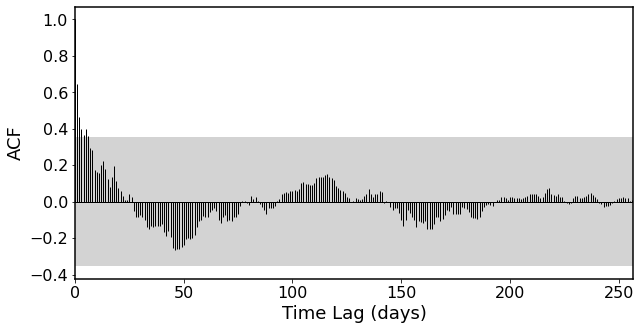

name                                                     2559705
ra                                                      42.33744
dec                                                     0.701762
z                                                         1.5221
log_M_BH                                                8.551624
log_M_BH_e                                              0.132117
log_L5100                                              44.880891
log_L5100_e                                             0.011303
band                                                           g
unit                                                         mag
x              [51075.41796875, 51818.38671875, 52171.375, 52...
y              [20.17155754162495, 20.459557648436473, 20.471...
yerr           [0.019999999552965164, 0.024000000208616257, 0...
RM                                                         False
LC_ref                                        Yang et al. (2020)
L_ref                    

/data/des90.a/data/cburke/conda/myenv/lib/python3.9/site-packages/emcee/moves/red_blue.py:99: RuntimeWarning: invalid value encountered in double_scalars
  lnpdiff = f + nlp - state.log_prob[j]


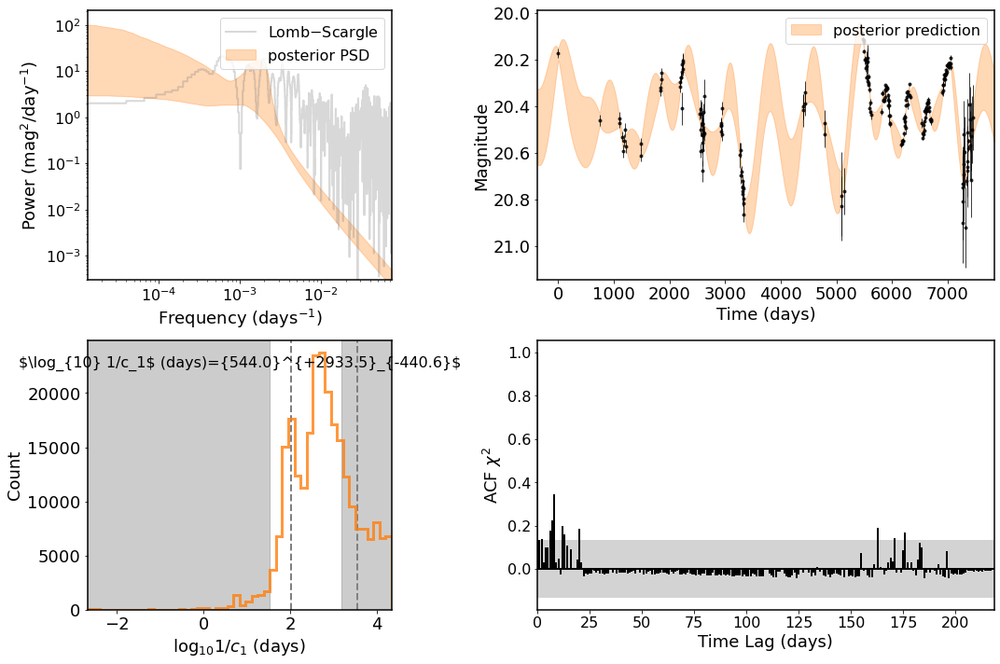

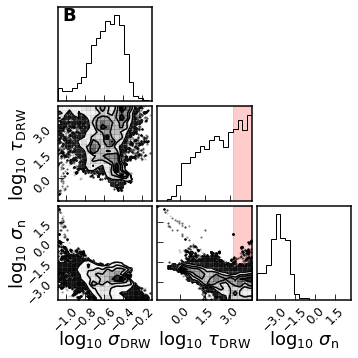

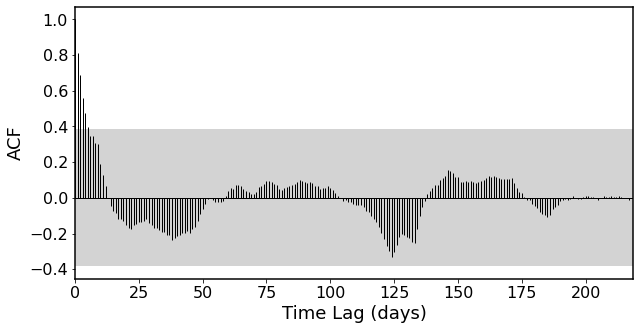

name                                                     2613947
ra                                                     41.716118
dec                                                    -1.125746
z                                                         0.6218
log_M_BH                                                8.140377
log_M_BH_e                                              0.099901
log_L5100                                              44.425165
log_L5100_e                                             0.017881
band                                                           g
unit                                                         mag
x              [51081.40234375, 51819.47265625, 51875.2148437...
y              [20.096689463790852, 19.795690776046712, 20.05...
yerr           [0.02500000037252903, 0.02199999988079071, 0.0...
RM                                                         False
LC_ref                                        Yang et al. (2020)
L_ref                    

/data/des90.a/data/cburke/conda/myenv/lib/python3.9/site-packages/emcee/moves/red_blue.py:99: RuntimeWarning: invalid value encountered in double_scalars
  lnpdiff = f + nlp - state.log_prob[j]


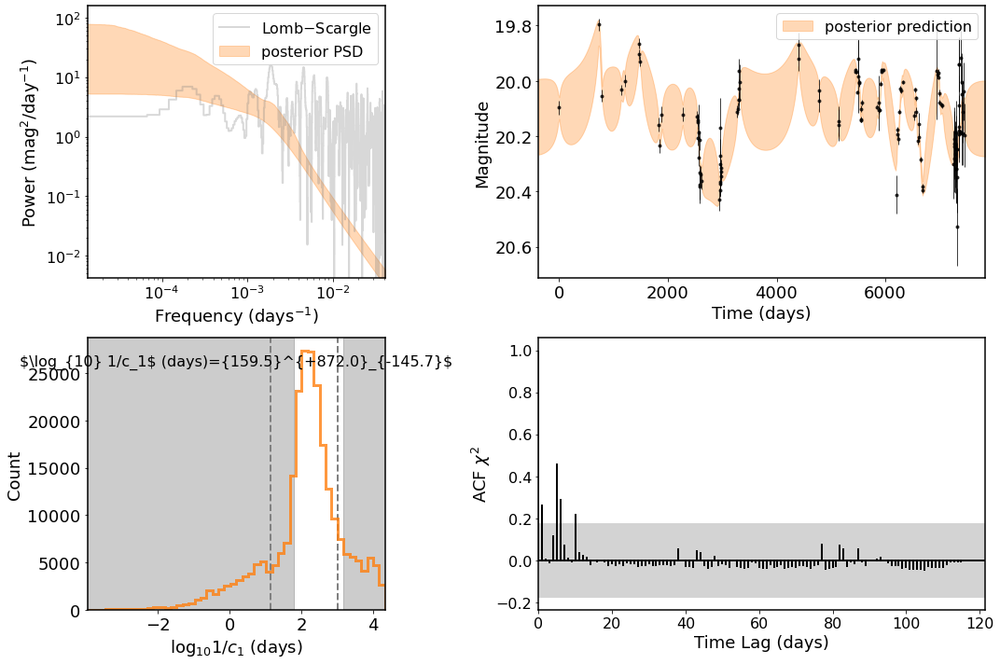

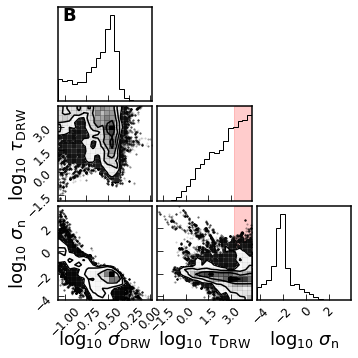

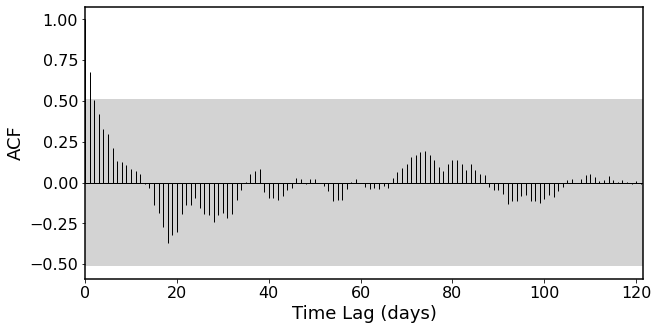

name                                                     2607635
ra                                                     40.947395
dec                                                    -1.103271
z                                                         3.9277
log_M_BH                                                10.07844
log_M_BH_e                                              0.267666
log_L5100                                              45.666207
log_L5100_e                                             0.040695
band                                                           g
unit                                                         mag
x              [51081.3984375, 51819.46875, 51875.21484375, 5...
y              [21.911123644963794, 21.446125399724536, 21.53...
yerr           [0.11800000071525574, 0.09799999743700027, 0.0...
RM                                                         False
LC_ref                                        Yang et al. (2020)
L_ref                    

/data/des90.a/data/cburke/conda/myenv/lib/python3.9/site-packages/emcee/moves/red_blue.py:99: RuntimeWarning: invalid value encountered in double_scalars
  lnpdiff = f + nlp - state.log_prob[j]


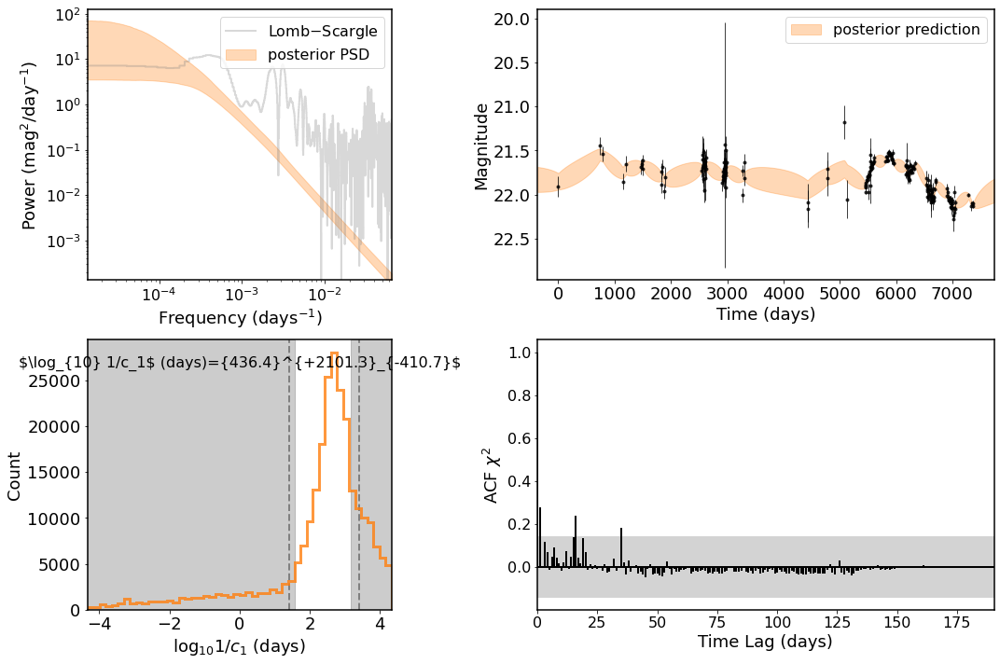

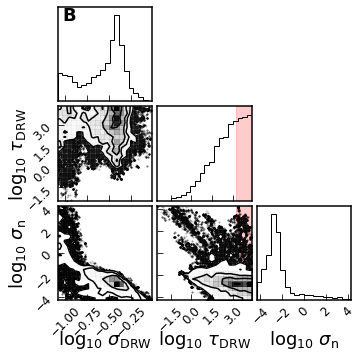

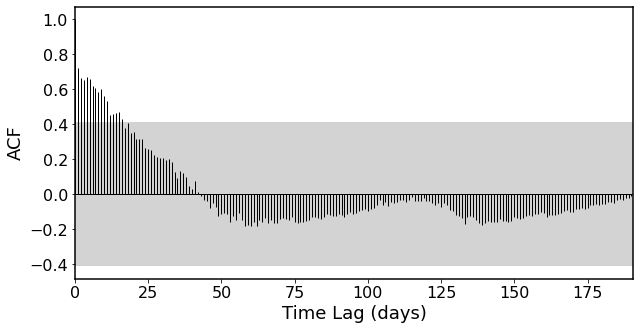

name                                                     2597127
ra                                                     43.104073
dec                                                     0.218938
z                                                          1.295
log_M_BH                                                7.834609
log_M_BH_e                                              0.295893
log_L5100                                              44.796451
log_L5100_e                                             0.014842
band                                                           g
unit                                                         mag
x              [51075.421875, 51081.40625, 51818.390625, 5217...
y              [20.34687390405901, 20.46087422449358, 20.3418...
yerr           [0.023000000044703484, 0.02800000086426735, 0....
RM                                                         False
LC_ref                                        Yang et al. (2020)
L_ref                    

/data/des90.a/data/cburke/conda/myenv/lib/python3.9/site-packages/emcee/moves/red_blue.py:99: RuntimeWarning: invalid value encountered in double_scalars
  lnpdiff = f + nlp - state.log_prob[j]


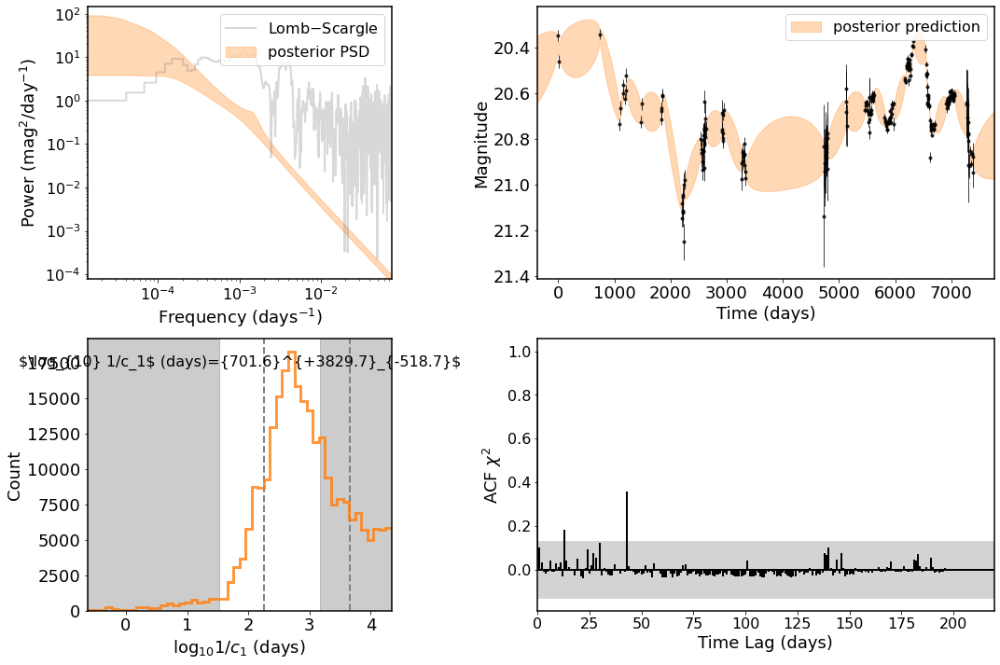

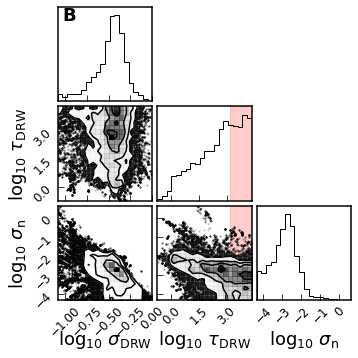

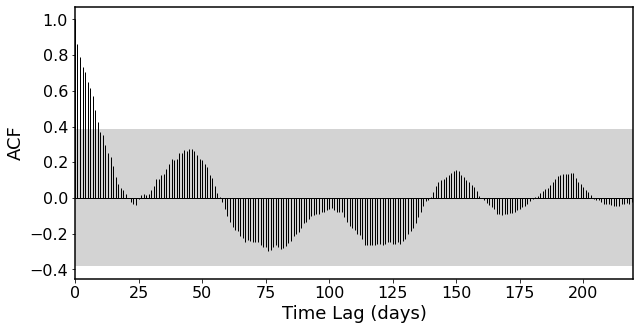

name                                                     2481079
ra                                                     40.991272
dec                                                    -1.225165
z                                                         0.9037
log_M_BH                                                8.448724
log_M_BH_e                                              0.208443
log_L5100                                               44.55819
log_L5100_e                                             0.007159
band                                                           g
unit                                                         mag
x              [51081.3984375, 51819.46875, 51875.21484375, 5...
y              [19.933671853348457, 20.057672402664863, 19.92...
yerr           [0.023000000044703484, 0.027000000700354576, 0...
RM                                                         False
LC_ref                                        Yang et al. (2020)
L_ref                    

/data/des90.a/data/cburke/conda/myenv/lib/python3.9/site-packages/emcee/moves/red_blue.py:99: RuntimeWarning: invalid value encountered in double_scalars
  lnpdiff = f + nlp - state.log_prob[j]


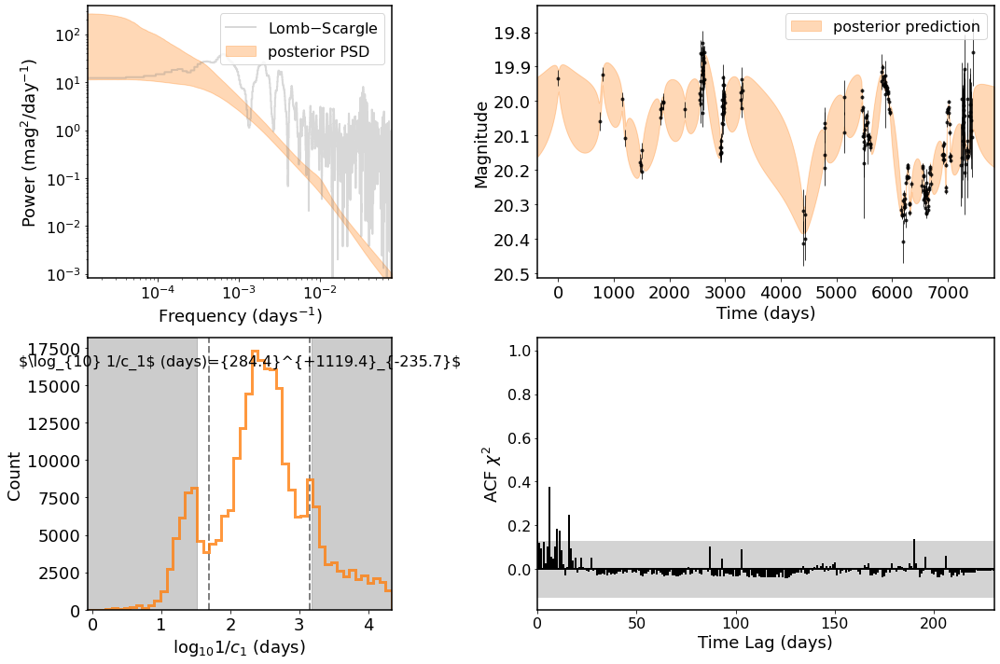

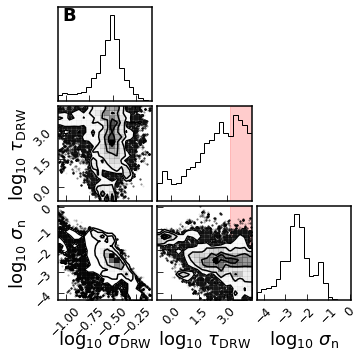

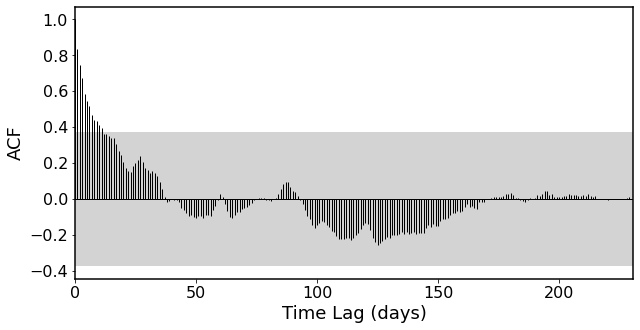

name                                                     2549421
ra                                                      42.37162
dec                                                    -0.351185
z                                                         1.4302
log_M_BH                                                9.059765
log_M_BH_e                                              0.107156
log_L5100                                              45.612381
log_L5100_e                                             0.004587
band                                                           g
unit                                                         mag
x              [51081.40234375, 51819.47265625, 52225.296875,...
y              [19.242269855056605, 19.178270679031215, 19.19...
yerr           [0.013000000268220901, 0.013000000268220901, 0...
RM                                                         False
LC_ref                                        Yang et al. (2020)
L_ref                    

/data/des90.a/data/cburke/conda/myenv/lib/python3.9/site-packages/emcee/moves/red_blue.py:99: RuntimeWarning: invalid value encountered in double_scalars
  lnpdiff = f + nlp - state.log_prob[j]


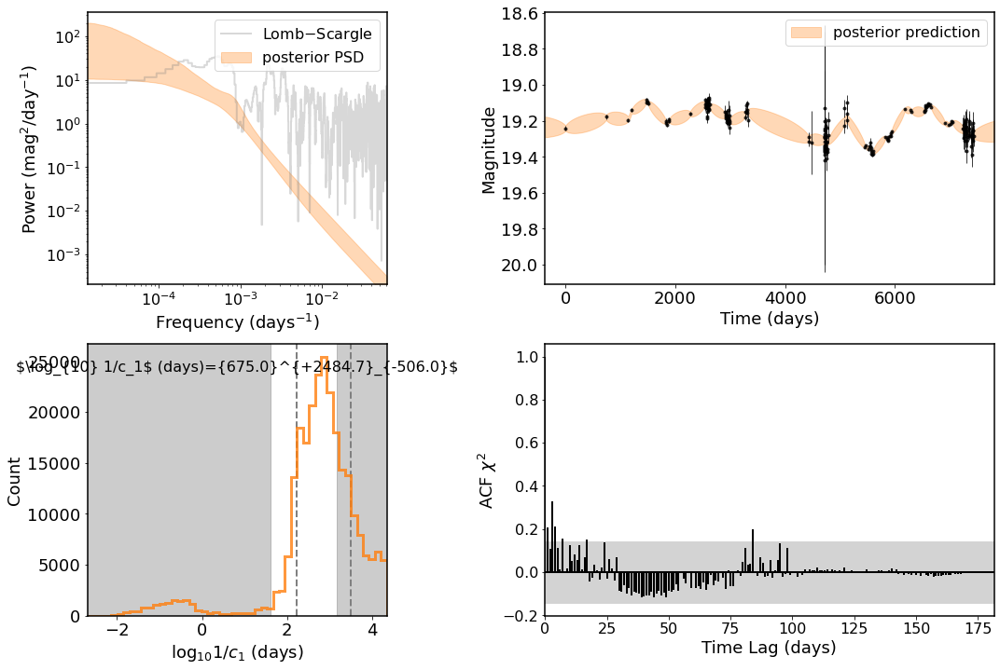

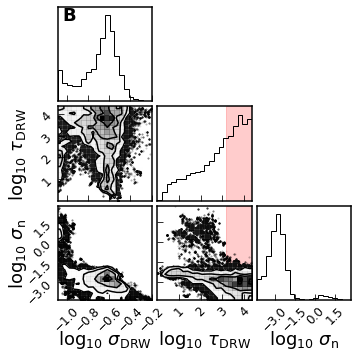

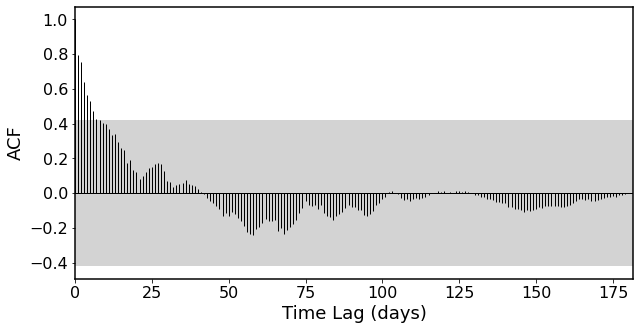

name                                                     2567252
ra                                                     43.389767
dec                                                     0.276192
z                                                         1.4643
log_M_BH                                                8.533852
log_M_BH_e                                              0.348541
log_L5100                                              44.805549
log_L5100_e                                             0.012621
band                                                           g
unit                                                         mag
x              [51075.421875, 51818.390625, 52171.37890625, 5...
y              [20.65360555175863, 20.69660672668539, 20.7506...
yerr           [0.028999999165534973, 0.027000000700354576, 0...
RM                                                         False
LC_ref                                        Yang et al. (2020)
L_ref                    

/data/des90.a/data/cburke/conda/myenv/lib/python3.9/site-packages/emcee/moves/red_blue.py:99: RuntimeWarning: invalid value encountered in double_scalars
  lnpdiff = f + nlp - state.log_prob[j]


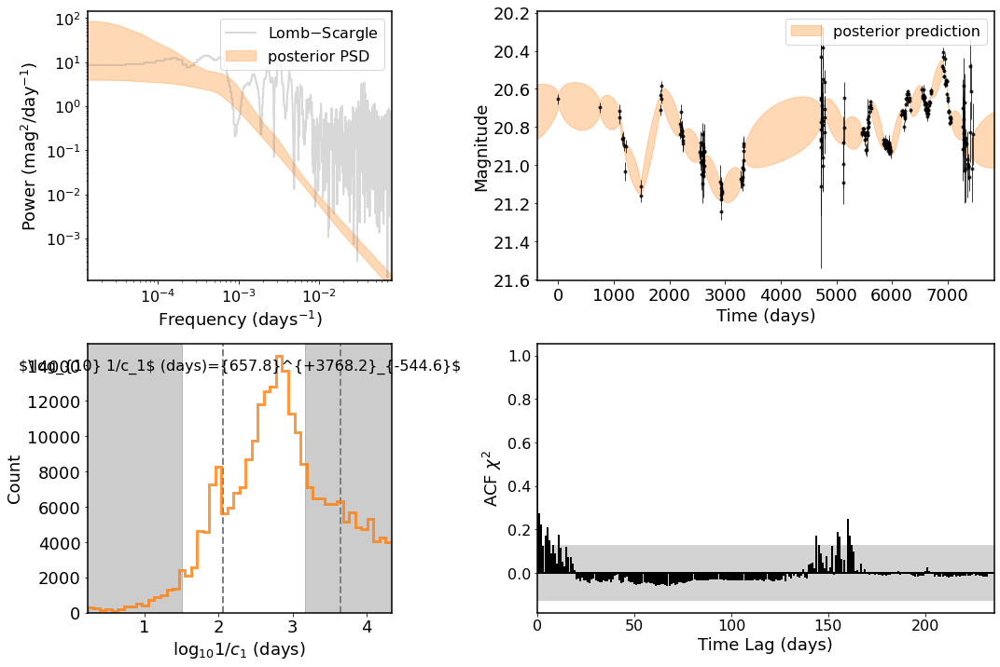

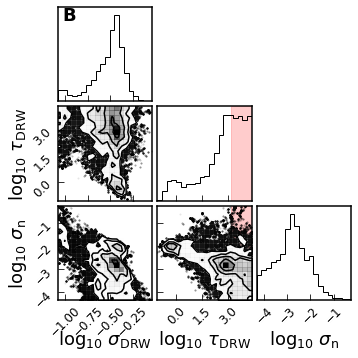

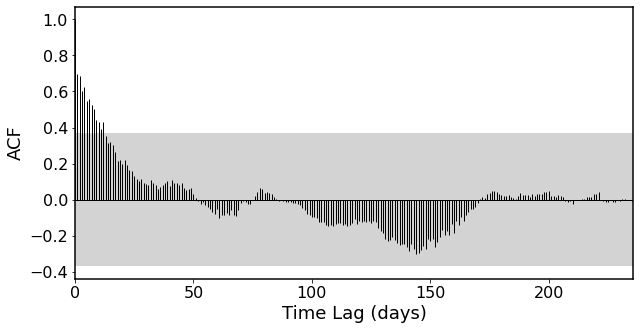

name                                                     2527604
ra                                                     41.694778
dec                                                    -0.205747
z                                                         0.5636
log_M_BH                                                8.307409
log_M_BH_e                                              0.065152
log_L5100                                               44.42099
log_L5100_e                                             0.049179
band                                                           g
unit                                                         mag
x              [51081.40234375, 51818.38671875, 52171.375, 52...
y              [19.65971693532049, 20.0017178966242, 19.50471...
yerr           [0.014999999664723873, 0.017999999225139618, 0...
RM                                                         False
LC_ref                                        Yang et al. (2020)
L_ref                    

/data/des90.a/data/cburke/conda/myenv/lib/python3.9/site-packages/emcee/moves/red_blue.py:99: RuntimeWarning: invalid value encountered in double_scalars
  lnpdiff = f + nlp - state.log_prob[j]


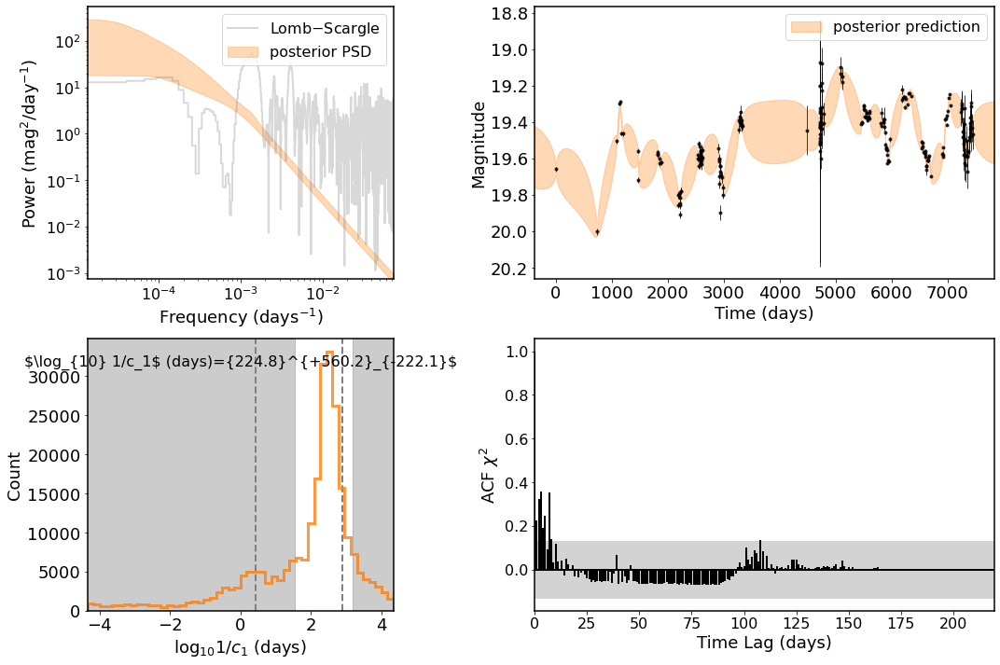

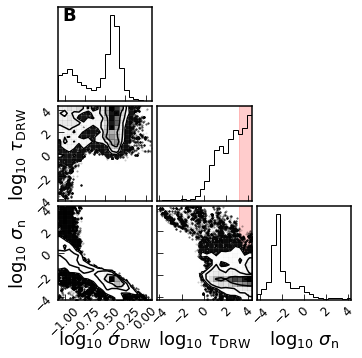

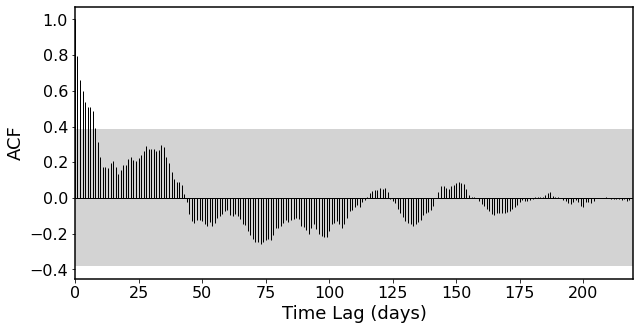

name                                                     2591352
ra                                                     40.117149
dec                                                    -0.934969
z                                                         1.0303
log_M_BH                                                8.174906
log_M_BH_e                                              0.411932
log_L5100                                              44.704035
log_L5100_e                                             0.009479
band                                                           g
unit                                                         mag
x              [51075.4140625, 51818.3828125, 52170.43359375,...
y              [20.199075785540487, 20.68707474794283, 20.790...
yerr           [0.023000000044703484, 0.032999999821186066, 0...
RM                                                         False
LC_ref                                        Yang et al. (2020)
L_ref                    

/data/des90.a/data/cburke/conda/myenv/lib/python3.9/site-packages/emcee/moves/red_blue.py:99: RuntimeWarning: invalid value encountered in double_scalars
  lnpdiff = f + nlp - state.log_prob[j]


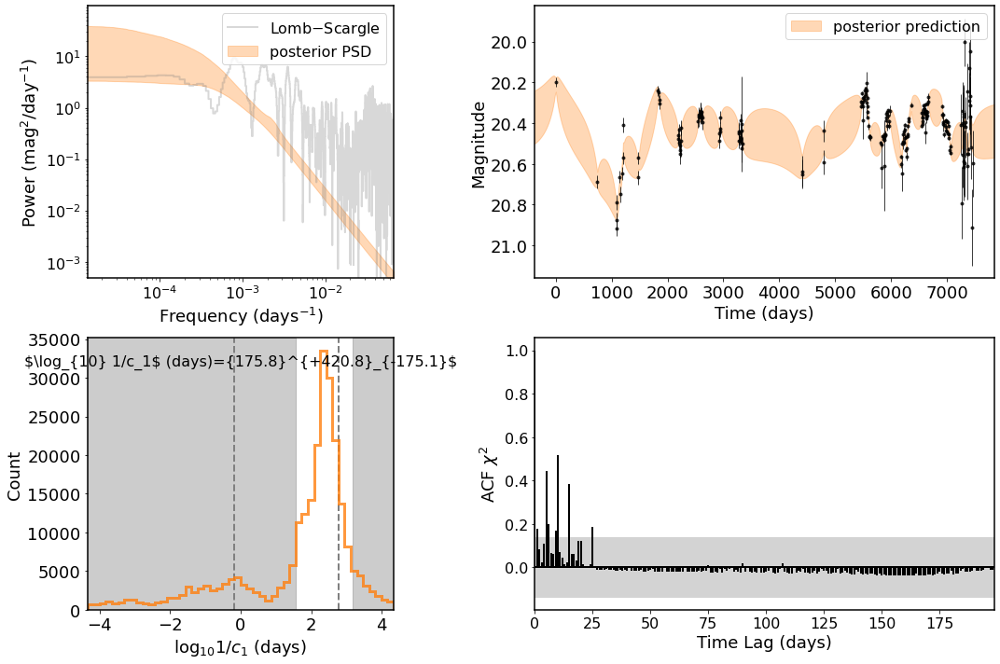

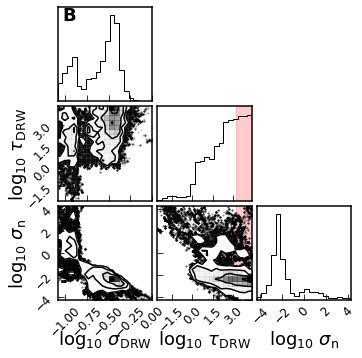

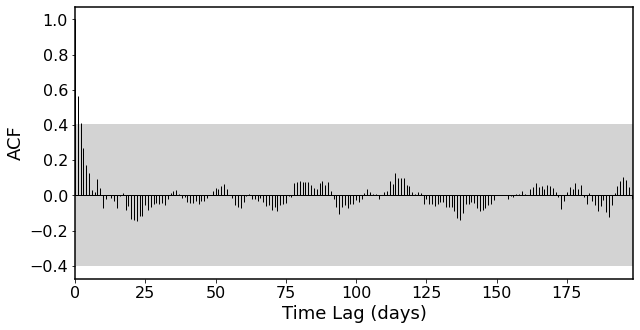

name                                                     2556507
ra                                                     42.170776
dec                                                     -0.20805
z                                                         1.1992
log_M_BH                                                8.905706
log_M_BH_e                                              0.091286
log_L5100                                              45.484085
log_L5100_e                                             0.002908
band                                                           g
unit                                                         mag
x              [51081.40234375, 51818.38671875, 51875.21875, ...
y              [19.00548353463931, 18.743482497041654, 18.747...
yerr           [0.010999999940395355, 0.008999999612569809, 0...
RM                                                         False
LC_ref                                        Yang et al. (2020)
L_ref                    

/data/des90.a/data/cburke/conda/myenv/lib/python3.9/site-packages/emcee/moves/red_blue.py:99: RuntimeWarning: invalid value encountered in double_scalars
  lnpdiff = f + nlp - state.log_prob[j]


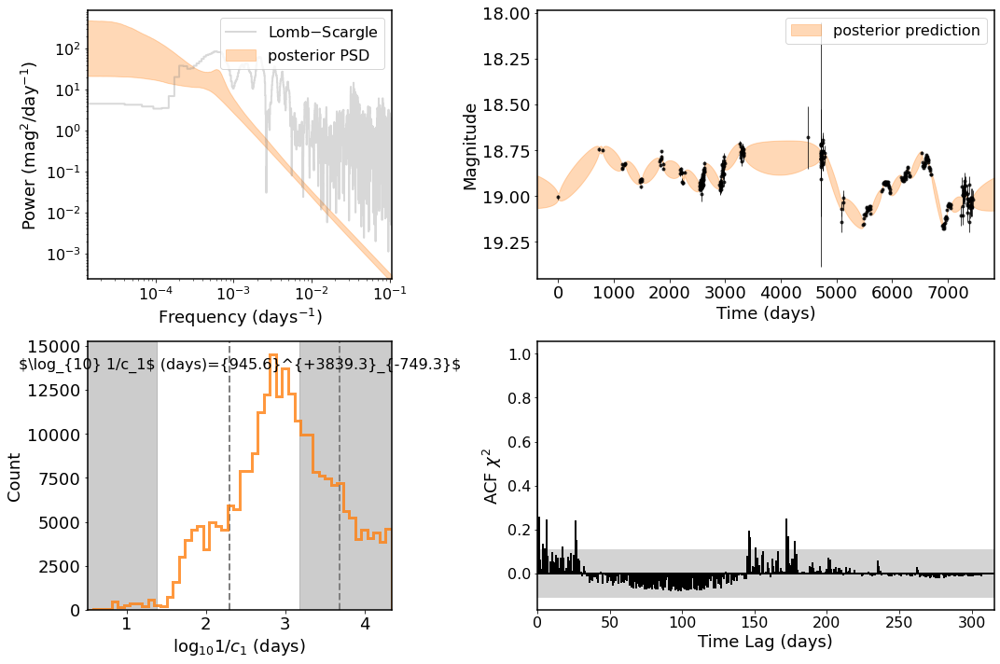

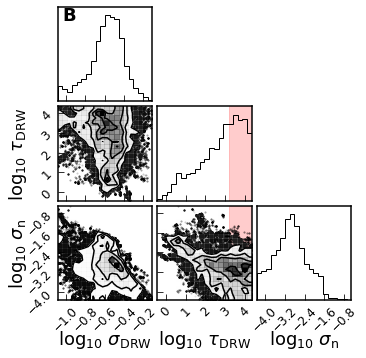

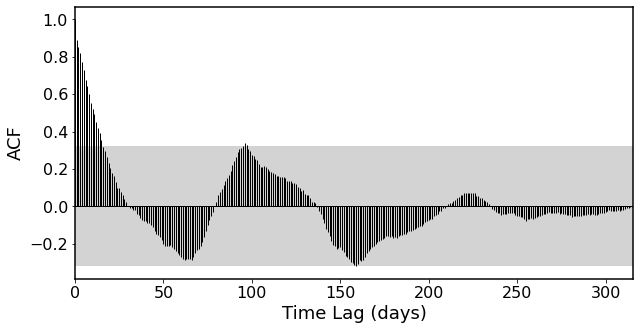

name                                                  Zw 229-015
ra                                                    286.358077
dec                                                    42.461045
z                                                         0.0273
log_M_BH                                                     7.0
log_M_BH_e                                              0.132849
log_L5100                                              42.851258
log_L5100_e                                                  0.0
band                                                           V
unit                                                         mag
x              [5351.9785, 5352.8036, 5352.9688, 5353.9834, 5...
y              [15.989, 15.98, 15.976, 15.976, 15.957, 15.979...
yerr           [0.008, 0.003, 0.007, 0.009, 0.008, 0.007, 0.0...
RM                                                          True
LC_ref                                       Barth et al. (2011)
L_ref                    

/data/des90.a/data/cburke/conda/myenv/lib/python3.9/site-packages/emcee/moves/red_blue.py:99: RuntimeWarning: invalid value encountered in double_scalars
  lnpdiff = f + nlp - state.log_prob[j]


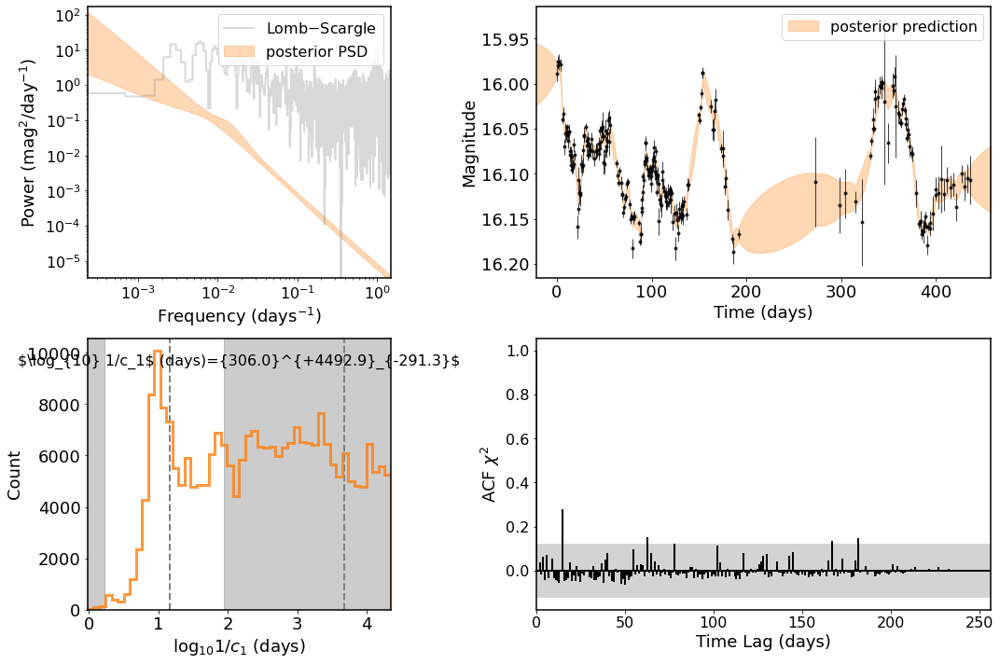

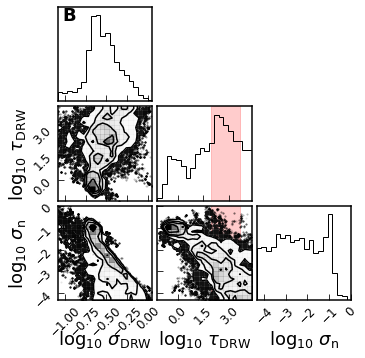

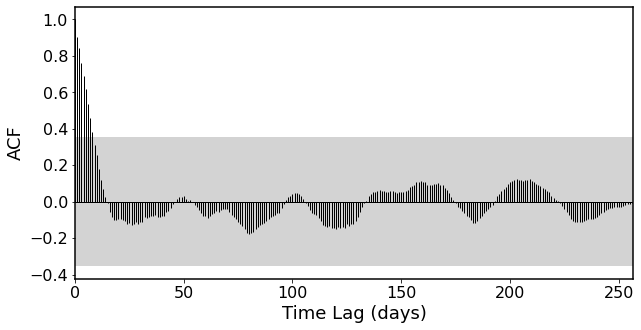

name                                                    NGC 4051
ra                                                    180.790041
dec                                                    44.531304
z                                                         0.0023
log_M_BH                                                    5.67
log_M_BH_e                                                  0.47
log_L5100                                                  41.96
log_L5100_e                                                 0.19
band                                                           V
unit                  $10^{-15}$ erg s$^{-1}$ cm$^{-2} \AA^{-1}$
x              [6645.6113, 6646.6098, 6647.6275, 6648.5919, 6...
y              [12.7318, 12.8314, 13.0803, 12.9598, 12.8375, ...
yerr           [0.0624, 0.0668, 0.0683, 0.0499, 0.055, 0.0956...
RM                                                          True
LC_ref                                   Fausnaugh et al. (2017)
L_ref                    

/data/des90.a/data/cburke/conda/myenv/lib/python3.9/site-packages/emcee/moves/red_blue.py:99: RuntimeWarning: invalid value encountered in double_scalars
  lnpdiff = f + nlp - state.log_prob[j]


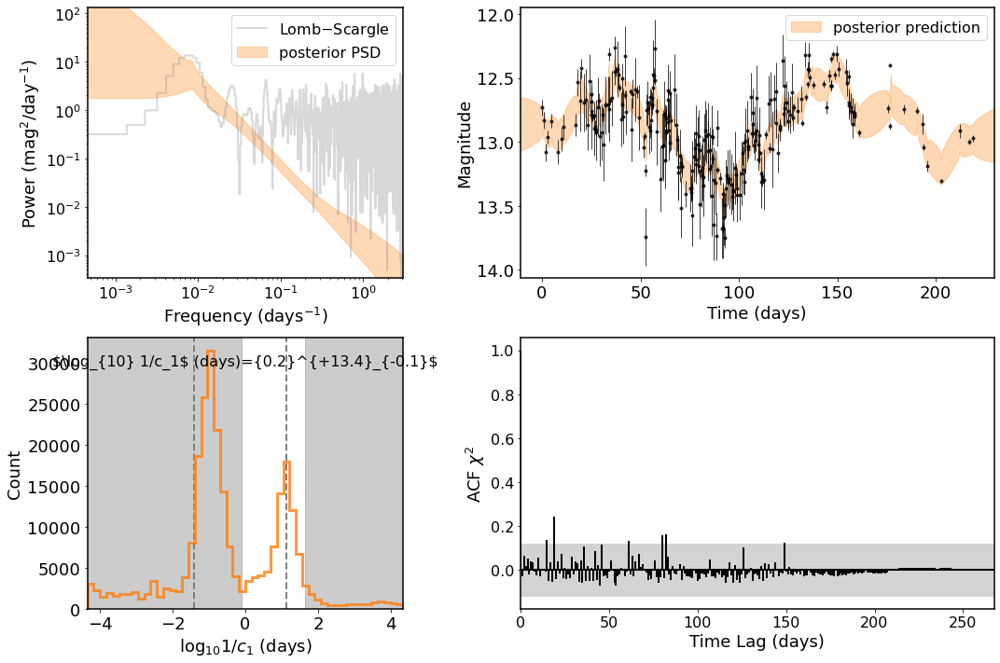

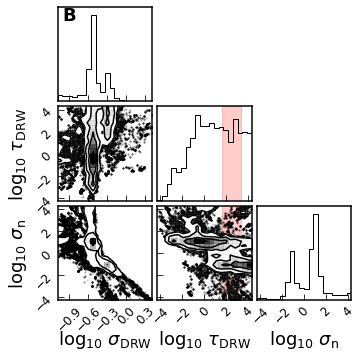

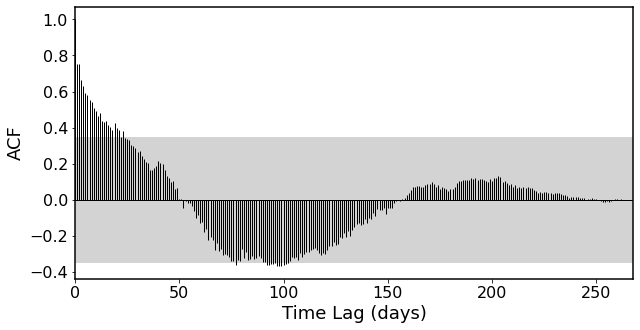

name                                                 PG 2130+099
ra                                                    323.115901
dec                                                    10.138681
z                                                          0.063
log_M_BH                                                6.986772
log_M_BH_e                                              0.104834
log_L5100                                               44.39794
log_L5100_e                                                  0.0
band                                                           V
unit                  $10^{-15}$ erg s$^{-1}$ cm$^{-2} \AA^{-1}$
x              [2457927.63716435, 2457931.59331597, 2457935.5...
y              [1.0222668559753438, 1.0192887072756867, 0.997...
yerr           [0.003272616038138773, 0.007108887118929714, 0...
RM                                                          True
LC_ref                                          Hu et al. (2020)
L_ref                    

/data/des90.a/data/cburke/conda/myenv/lib/python3.9/site-packages/emcee/moves/red_blue.py:99: RuntimeWarning: invalid value encountered in double_scalars
  lnpdiff = f + nlp - state.log_prob[j]


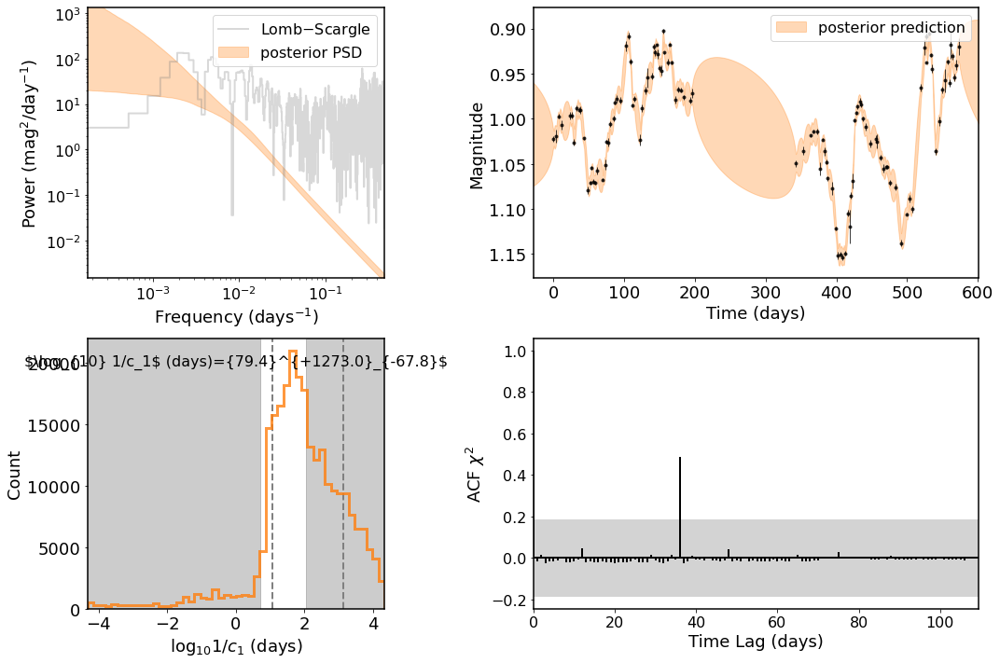

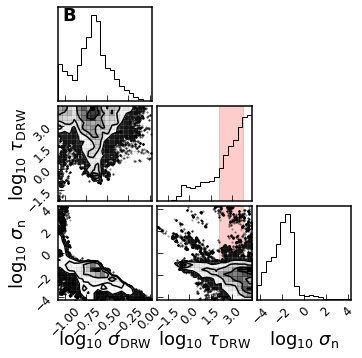

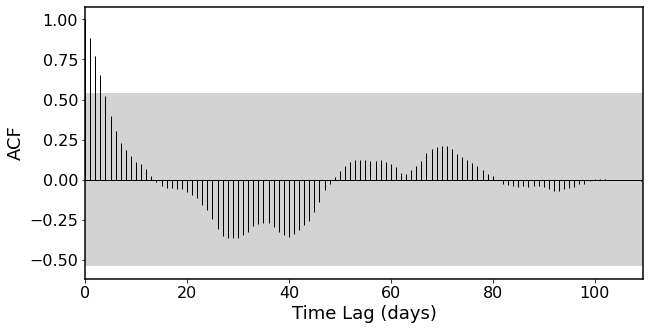

name                                                 PG 2130+099
ra                                                    323.115901
dec                                                    10.138681
z                                                          0.061
log_M_BH                                                8.158362
log_M_BH_e                                              0.162023
log_L5100                                              44.334454
log_L5100_e                                             0.040185
band                                                           B
unit                  $10^{-16}$ erg s$^{-1}$ cm$^{-2} \AA^{-1}$
x              [2448382.5, 2448399.0, 2448412.5, 2448413.5, 2...
y              [44.53, 45.74, 48.38, 49.08, 49.78, 49.34, 48....
yerr           [0.64, 0.39, 0.69, 0.96, 0.31, 0.69, 0.77, 0.6...
RM                                                          True
LC_ref                                       Kapsi et al. (1999)
L_ref                    

/data/des90.a/data/cburke/conda/myenv/lib/python3.9/site-packages/emcee/moves/red_blue.py:99: RuntimeWarning: invalid value encountered in double_scalars
  lnpdiff = f + nlp - state.log_prob[j]
/data/des90.a/data/cburke/conda/myenv/lib/python3.9/site-packages/numpy/core/_asarray.py:102: UserWarning: Warning: converting a masked element to nan.
  return array(a, dtype, copy=False, order=order)


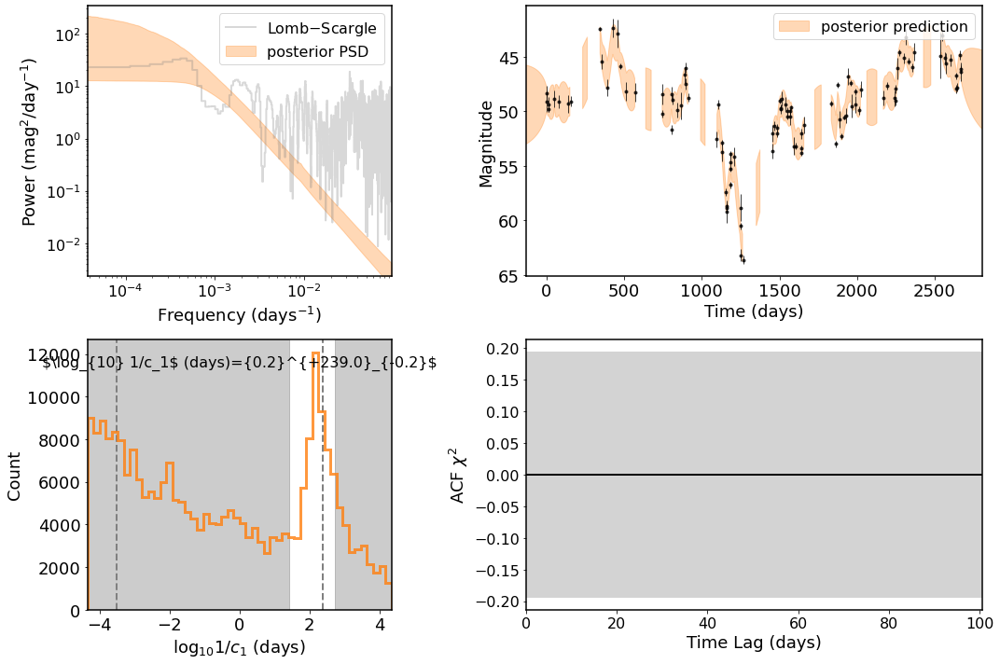

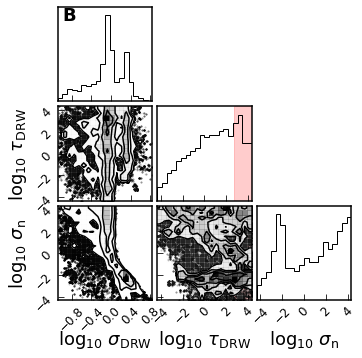

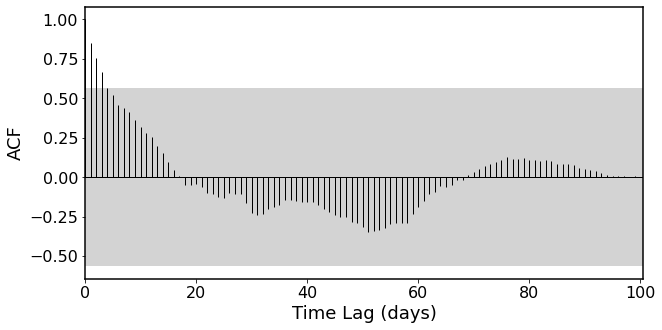

name                                                 PG 1351+640
ra                                                    208.315963
dec                                                     63.76269
z                                                          0.087
log_M_BH                                                7.662758
log_M_BH_e                                              0.351121
log_L5100                                              44.740363
log_L5100_e                                             0.038665
band                                                           B
unit                  $10^{-16}$ erg s$^{-1}$ cm$^{-2} \AA^{-1}$
x              [2448319.6, 2448397.8, 2448413.4, 2448426.3, 2...
y              [64.03, 56.0, 56.36, 54.41, 55.45, 58.64, 62.3...
yerr           [0.85, 0.42, 0.67, 0.43, 0.72, 1.02, 0.43, 1.0...
RM                                                          True
LC_ref                                       Kapsi et al. (1999)
L_ref                    

/data/des90.a/data/cburke/conda/myenv/lib/python3.9/site-packages/emcee/moves/red_blue.py:99: RuntimeWarning: invalid value encountered in double_scalars
  lnpdiff = f + nlp - state.log_prob[j]
/data/des90.a/data/cburke/conda/myenv/lib/python3.9/site-packages/numpy/core/_asarray.py:102: UserWarning: Warning: converting a masked element to nan.
  return array(a, dtype, copy=False, order=order)


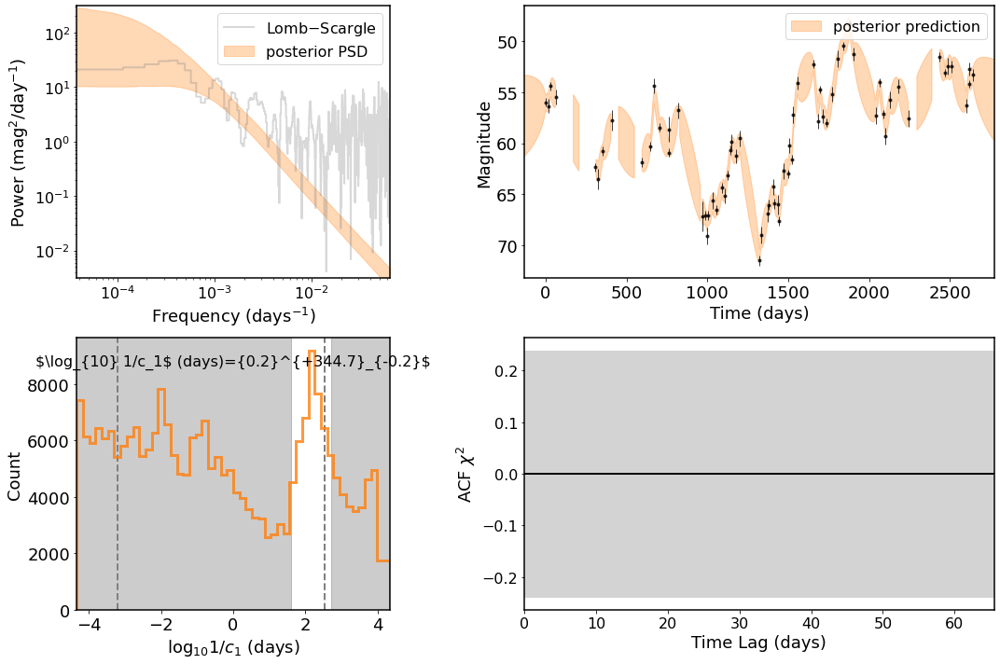

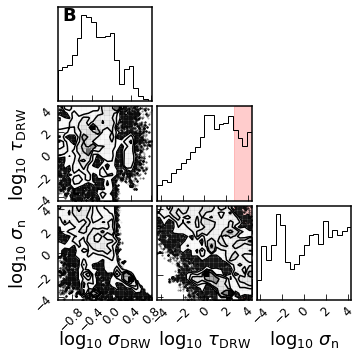

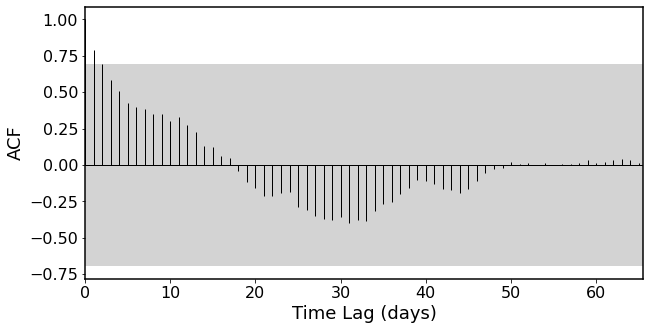

name                                                     Mrk 142
ra                                                    156.380329
dec                                                    51.676352
z                                                          0.045
log_M_BH                                                 6.33646
log_M_BH_e                                              0.226433
log_L5100                                              43.313109
log_L5100_e                                                  0.0
band                                                           g
unit                                              arbitrary unit
x              [58422.474, 58424.488, 58425.463, 58426.473, 5...
y              [1.894, 1.861, 1.843, 1.867, 1.817, 1.782, 1.7...
yerr           [0.049, 0.02, 0.02, 0.02, 0.02, 0.018, 0.018, ...
RM                                                          True
LC_ref                                    Crackett et al. (2020)
L_ref                    

/data/des90.a/data/cburke/conda/myenv/lib/python3.9/site-packages/emcee/moves/red_blue.py:99: RuntimeWarning: invalid value encountered in double_scalars
  lnpdiff = f + nlp - state.log_prob[j]


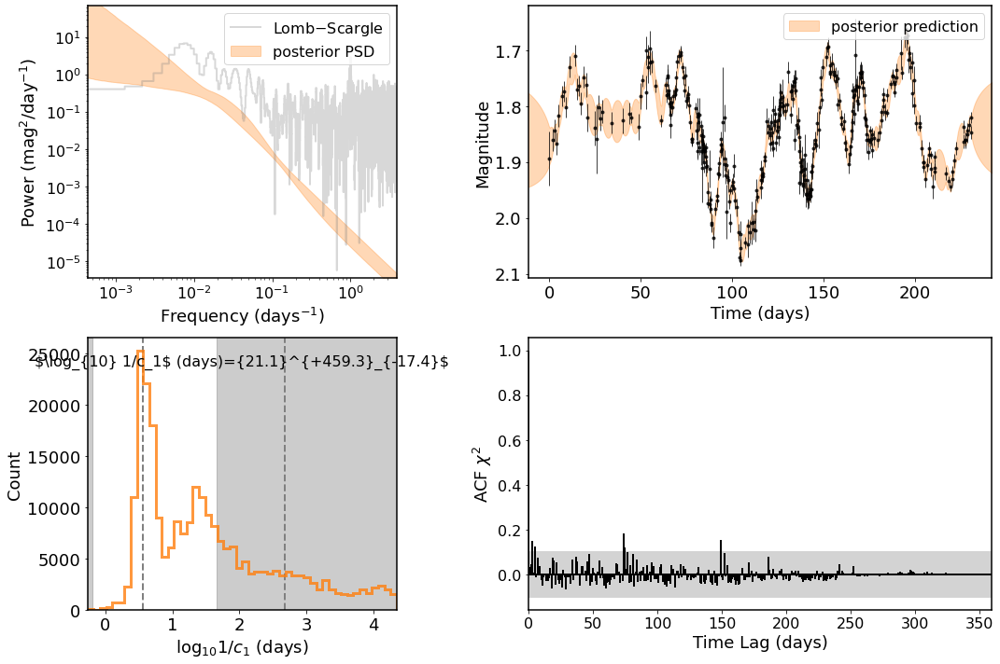

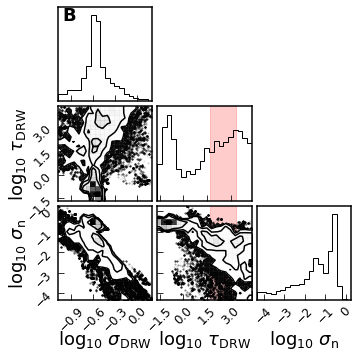

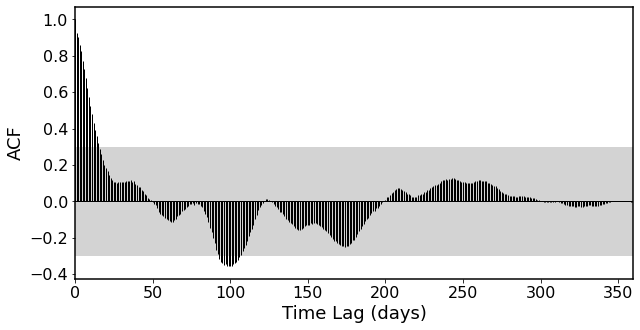

name                                                    NGC 3227
ra                                                    155.877375
dec                                                    19.865083
z                                                         0.0038
log_M_BH                                                    6.66
log_M_BH_e                                                  0.24
log_L5100                                                  42.48
log_L5100_e                                                  0.0
band                                                           V
unit                  $10^{-15}$ erg s$^{-1}$ cm$^{-2} \AA^{-1}$
x              [6645.61, 6646.6, 6647.62, 6648.59, 6650.51, 6...
y              [10.81, 10.89, 11.16, 10.98, 11.06, 12.52, 13....
yerr           [0.22, 0.23, 0.2, 0.14, 0.16, 0.34, 0.37, 0.37...
RM                                                          True
LC_ref                                     De Rosa et al. (2018)
L_ref                    

/data/des90.a/data/cburke/conda/myenv/lib/python3.9/site-packages/emcee/moves/red_blue.py:99: RuntimeWarning: invalid value encountered in double_scalars
  lnpdiff = f + nlp - state.log_prob[j]


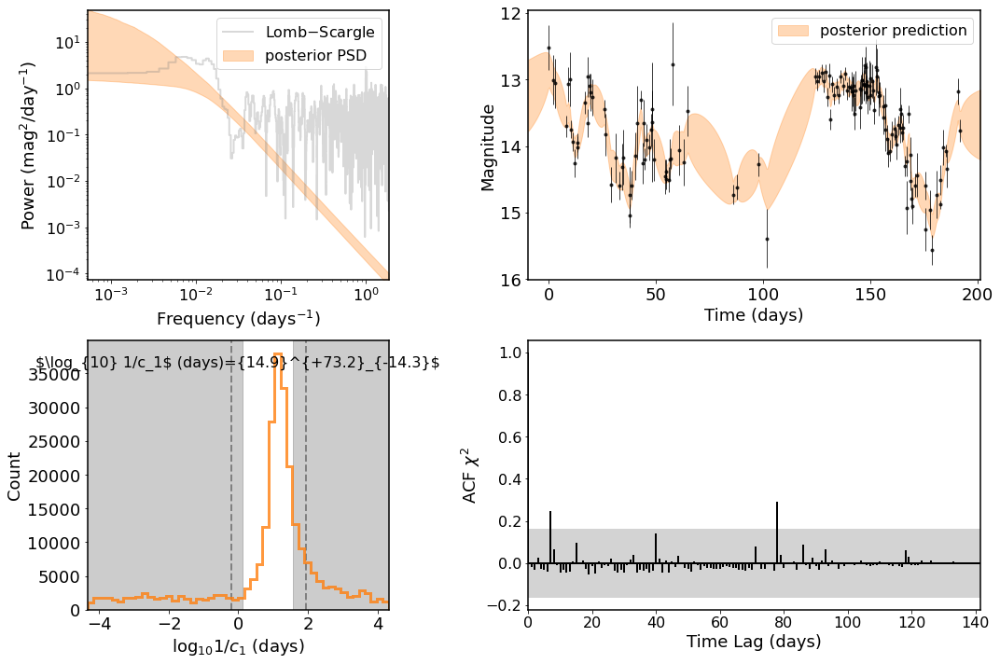

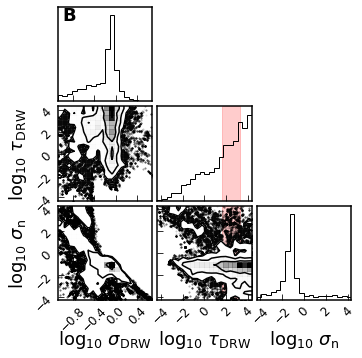

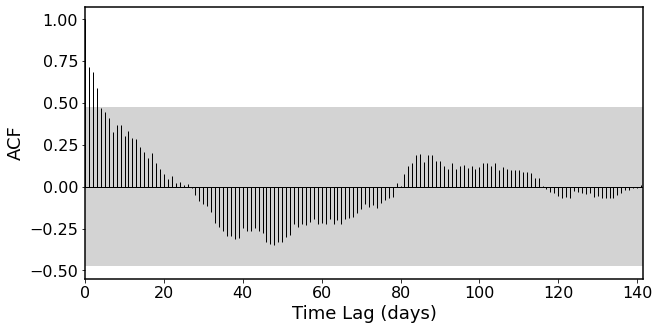

name                                                     RGG 123
ra                                                     233.60659
dec                                                      4.13517
z                                                         0.0395
log_M_BH                                                     5.1
log_M_BH_e                                                   0.3
log_L5100                                              41.493381
log_L5100_e                                                  0.0
band                                                           r
unit                                                         mag
x              [58198.4149306, 58198.4375347, 58216.3667361, ...
y              [18.862614, 18.922636, 18.646313, 18.767662, 1...
yerr           [0.06541746, 0.068585135, 0.05523544, 0.060718...
RM                                                         False
LC_ref                                                       ZTF
L_ref                    

/data/des90.a/data/cburke/conda/myenv/lib/python3.9/site-packages/emcee/moves/red_blue.py:99: RuntimeWarning: invalid value encountered in double_scalars
  lnpdiff = f + nlp - state.log_prob[j]


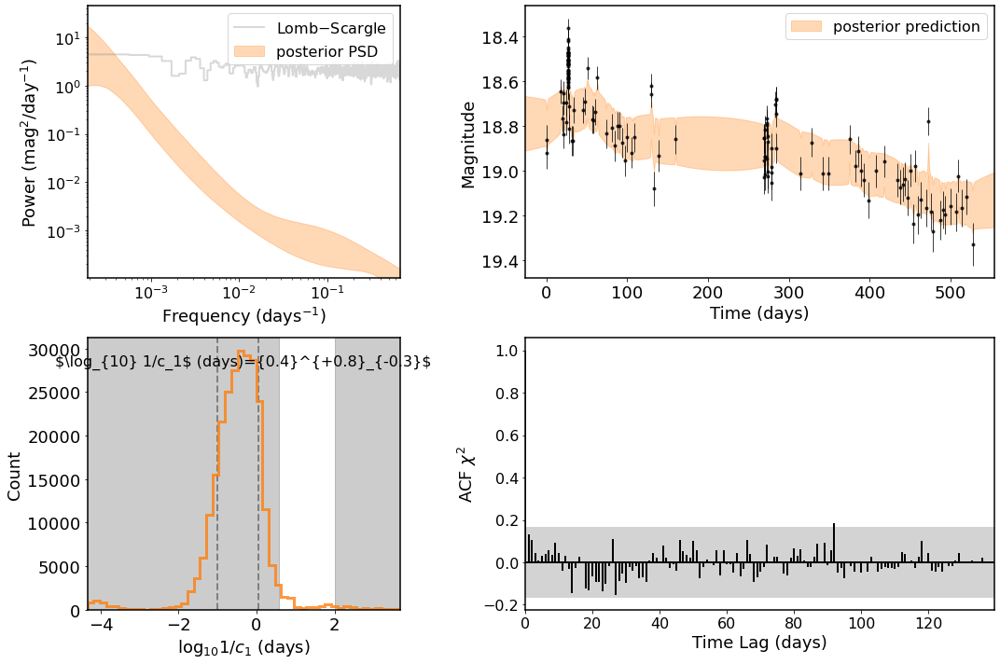

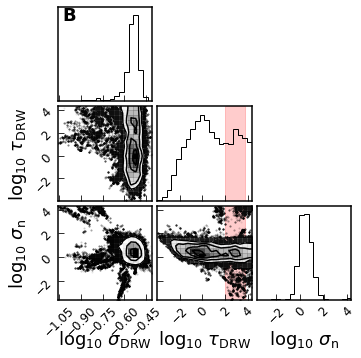

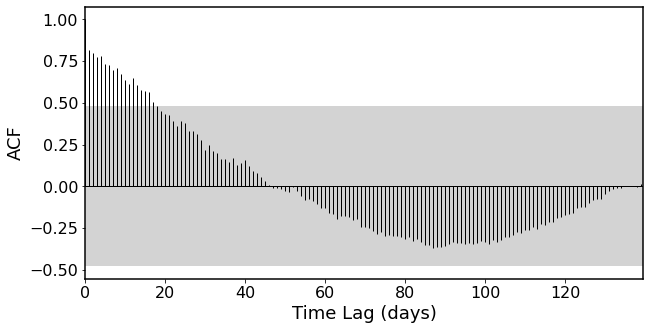

name                                                     RGG 127
ra                                                     241.38268
dec                                                     17.80726
z                                                         0.0317
log_M_BH                                                     5.2
log_M_BH_e                                                   0.3
log_L5100                                              41.173588
log_L5100_e                                                  0.0
band                                                           r
unit                                                         mag
x              [58216.3797569, 58218.4276273, 58219.3608449, ...
y              [18.23893, 18.33501, 18.289213, 18.398308, 18....
yerr           [0.042130888, 0.045132574, 0.04367125, 0.04724...
RM                                                         False
LC_ref                                                       ZTF
L_ref                    

/data/des90.a/data/cburke/conda/myenv/lib/python3.9/site-packages/emcee/moves/red_blue.py:99: RuntimeWarning: invalid value encountered in double_scalars
  lnpdiff = f + nlp - state.log_prob[j]


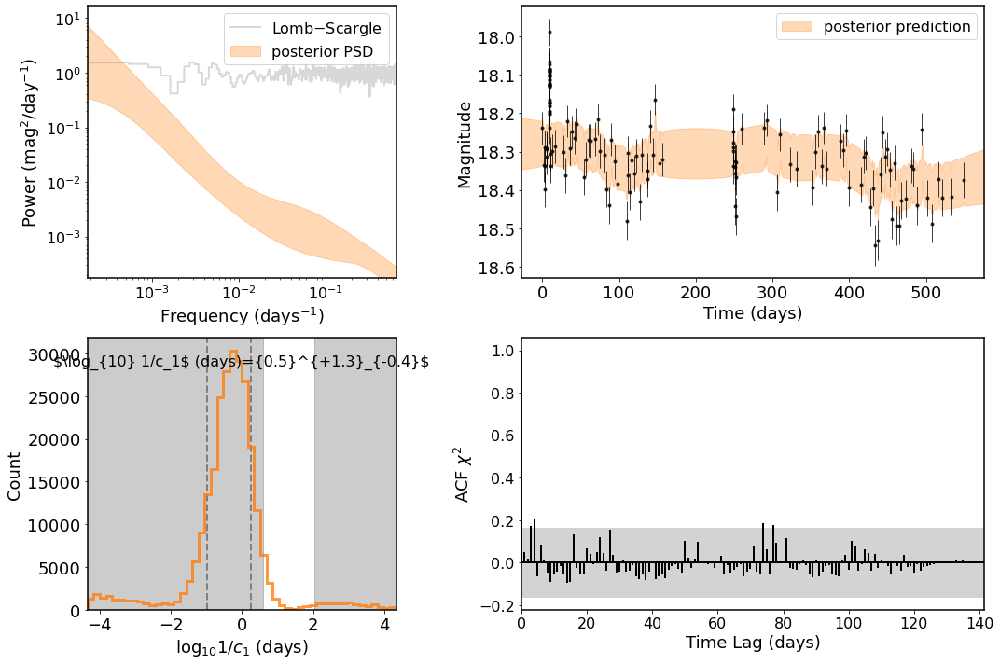

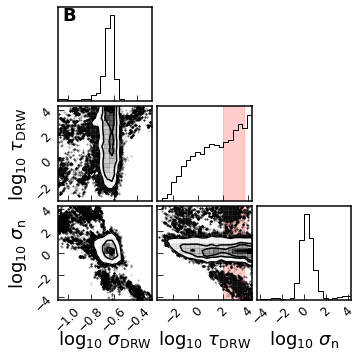

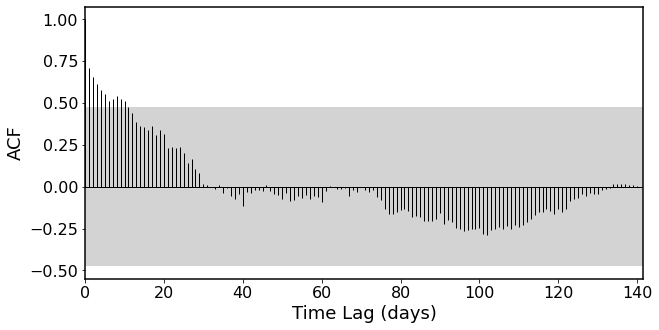

name                                                    NGC 4253
ra                                                    184.610481
dec                                                    29.812922
z                                                        0.01293
log_M_BH                                                6.822312
log_M_BH_e                                               0.05353
log_L5100                                                  42.51
log_L5100_e                                                 0.13
band                                                           r
unit                                                         mag
x              [58214.2377546, 58214.2438426, 58215.2401389, ...
y              [14.421909, 14.436987, 14.351452, 14.438213, 1...
yerr           [0.016468717, 0.016440082, 0.016605783, 0.0164...
RM                                                          True
LC_ref                                                       ZTF
L_ref                    

/data/des90.a/data/cburke/conda/myenv/lib/python3.9/site-packages/emcee/moves/red_blue.py:99: RuntimeWarning: invalid value encountered in double_scalars
  lnpdiff = f + nlp - state.log_prob[j]


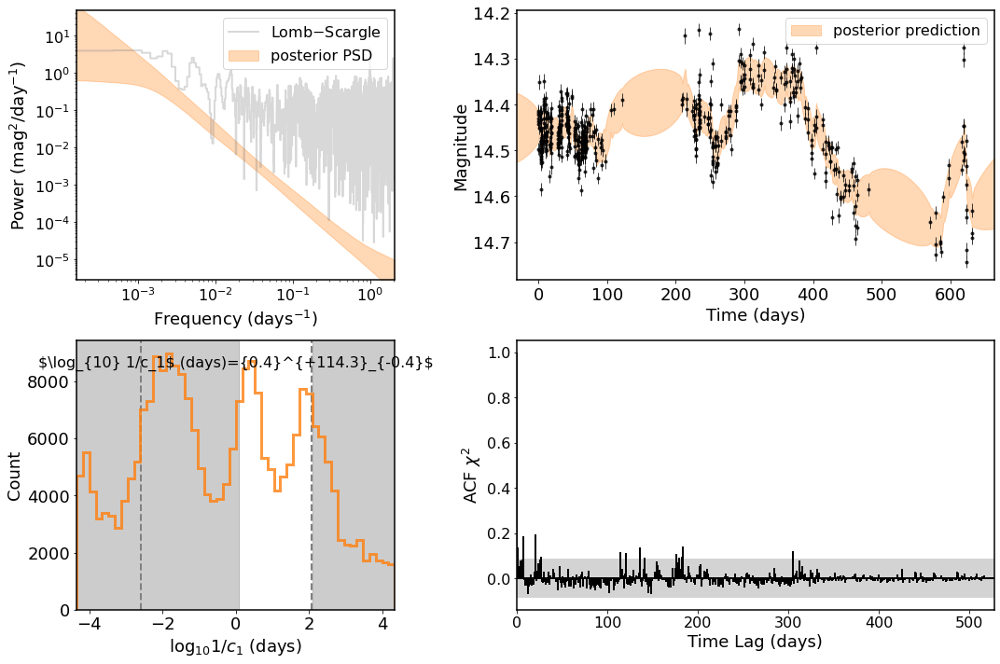

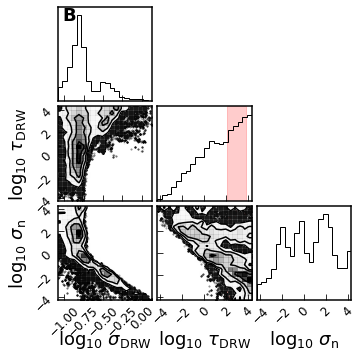

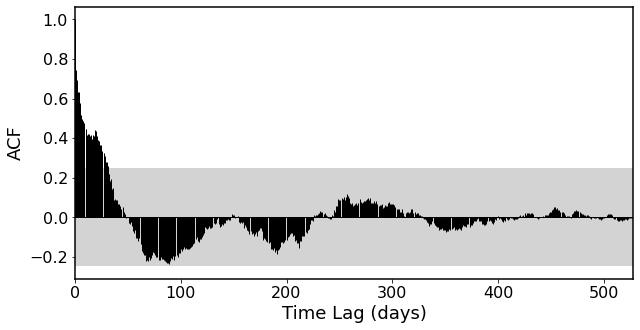

name                                                 PG 0844+349
ra                                                     131.92687
dec                                                    34.751245
z                                                          0.064
log_M_BH                                                7.858309
log_M_BH_e                                              0.192066
log_L5100                                                  44.24
log_L5100_e                                                 0.04
band                                                           r
unit                                                         mag
x              [58214.175463, 58214.1903704, 58217.1932292, 5...
y              [14.030883, 14.098541, 14.096419, 14.06353, 14...
yerr           [0.010844853, 0.010836005, 0.01083625, 0.01084...
RM                                                          True
LC_ref                                                       ZTF
L_ref                    

/data/des90.a/data/cburke/conda/myenv/lib/python3.9/site-packages/emcee/moves/red_blue.py:99: RuntimeWarning: invalid value encountered in double_scalars
  lnpdiff = f + nlp - state.log_prob[j]


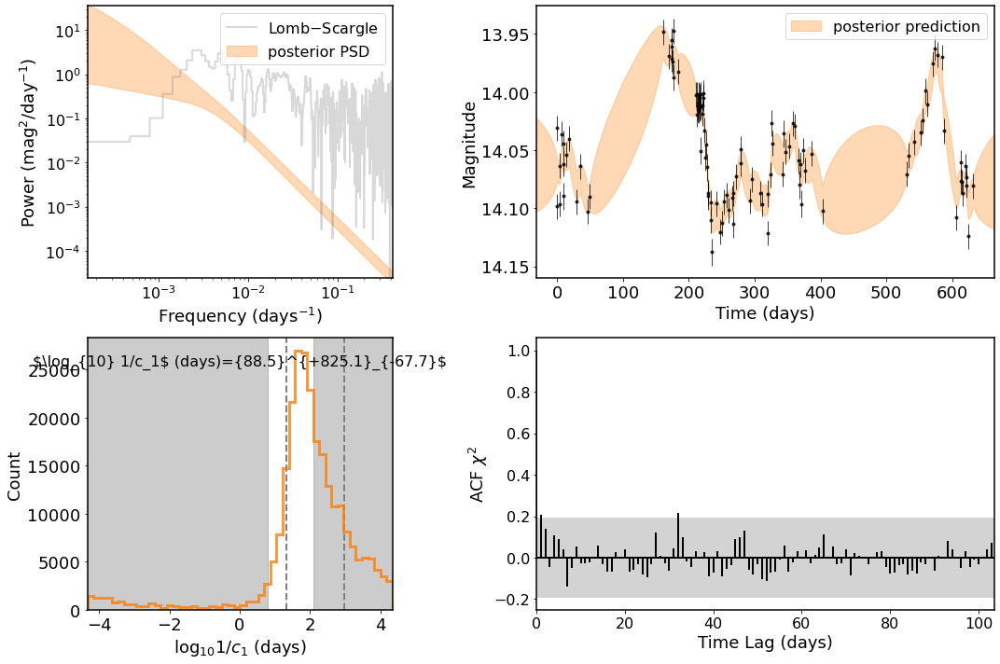

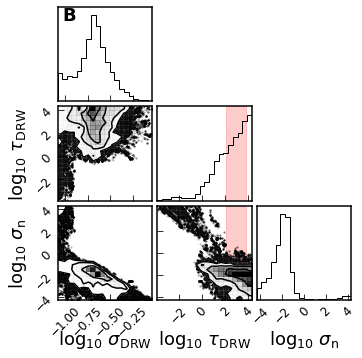

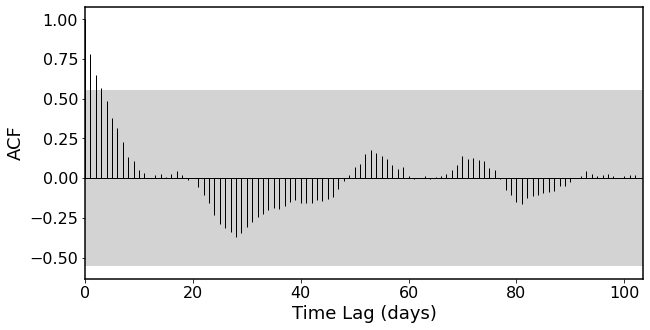

name                                                      Mrk 50
ra                                                     185.85057
dec                                                     2.679015
z                                                        0.02343
log_M_BH                                                7.421858
log_M_BH_e                                              0.062424
log_L5100                                                 42.731
log_L5100_e                                                0.005
band                                                           r
unit                                                         mag
x              [58199.3034259, 58214.2387037, 58214.2424306, ...
y              [15.137331, 15.039155, 15.076684, 15.084205, 1...
yerr           [0.011773055, 0.011731701, 0.011745823, 0.0117...
RM                                                          True
LC_ref                                                       ZTF
L_ref                    

/data/des90.a/data/cburke/conda/myenv/lib/python3.9/site-packages/emcee/moves/red_blue.py:99: RuntimeWarning: invalid value encountered in double_scalars
  lnpdiff = f + nlp - state.log_prob[j]


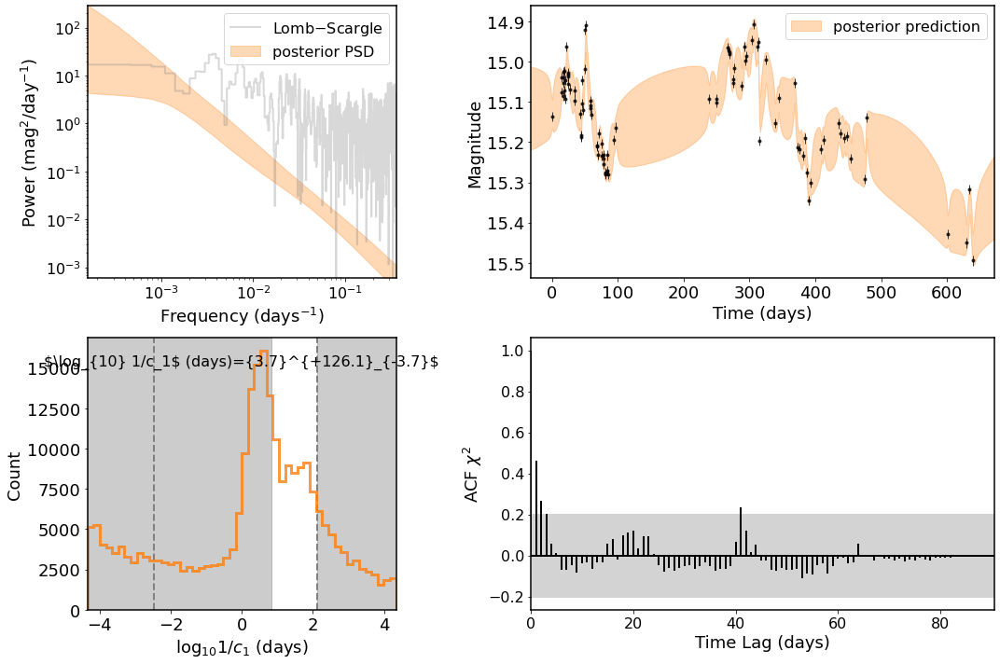

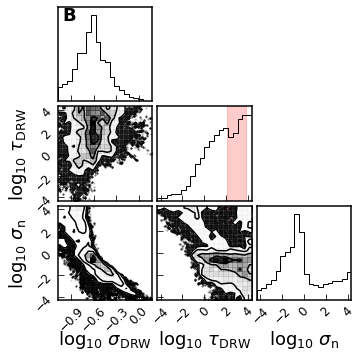

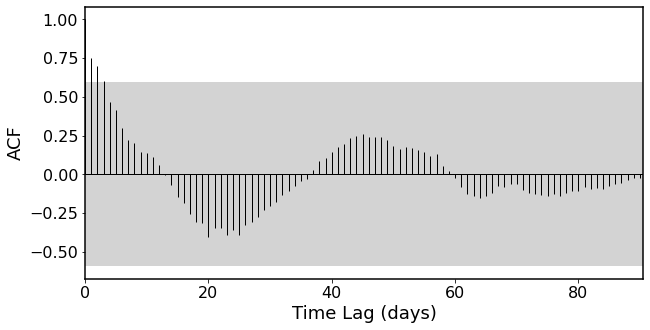

name                                                    Mrk 1044
ra                                                      37.52301
dec                                                    -8.998113
z                                                       0.016451
log_M_BH                                                    6.45
log_M_BH_e                                                 0.125
log_L5100                                              42.672098
log_L5100_e                                              0.09234
band                                                           r
unit                                                         mag
x              [58320.4840856, 58323.48375, 58333.5014583, 58...
y              [14.165398, 14.085882, 14.142594, 14.076721, 1...
yerr           [0.012723781, 0.012735942, 0.01272682, 0.01273...
RM                                                          True
LC_ref                                                       ZTF
L_ref                    

/data/des90.a/data/cburke/conda/myenv/lib/python3.9/site-packages/emcee/moves/red_blue.py:99: RuntimeWarning: invalid value encountered in double_scalars
  lnpdiff = f + nlp - state.log_prob[j]


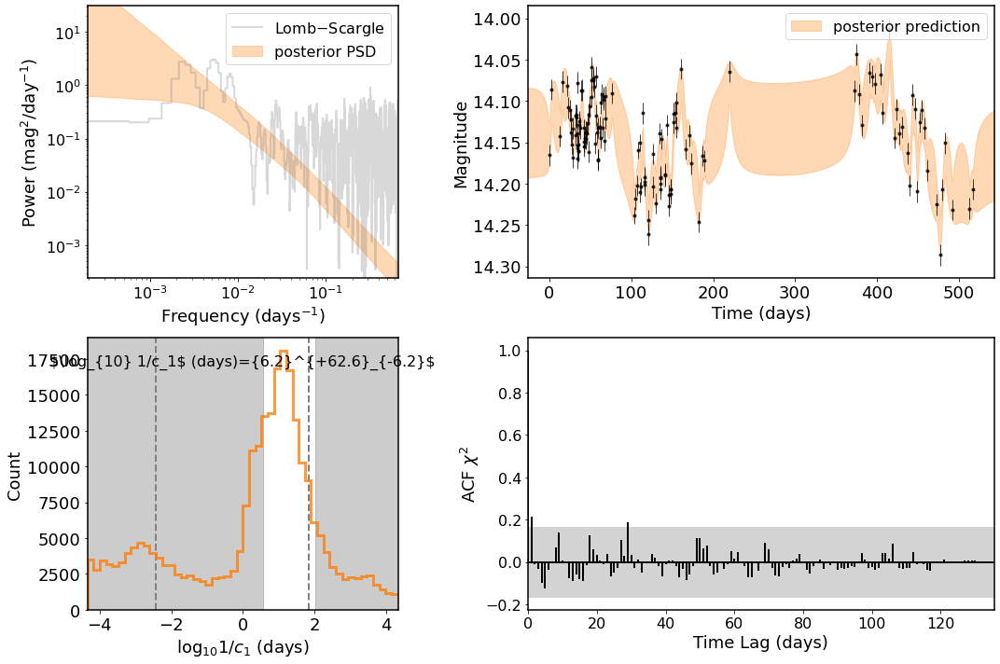

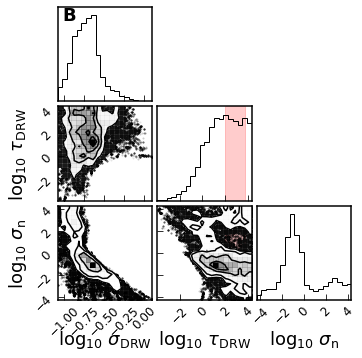

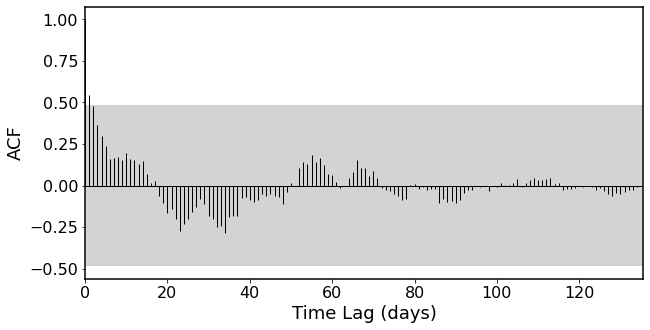

name                                                     Arp 151
ra                                                    171.400644
dec                                                    54.382536
z                                                        0.02109
log_M_BH                                                6.670271
log_M_BH_e                                              0.049735
log_L5100                                                  42.48
log_L5100_e                                                 0.11
band                                                           r
unit                                                         mag
x              [58214.2057523, 58214.2067361, 58215.2330556, ...
y              [15.570584, 15.5631895, 15.511628, 15.511762, ...
yerr           [0.016060997, 0.016055986, 0.01602521, 0.01602...
RM                                                          True
LC_ref                                                       ZTF
L_ref                    

/data/des90.a/data/cburke/conda/myenv/lib/python3.9/site-packages/emcee/moves/red_blue.py:99: RuntimeWarning: invalid value encountered in double_scalars
  lnpdiff = f + nlp - state.log_prob[j]


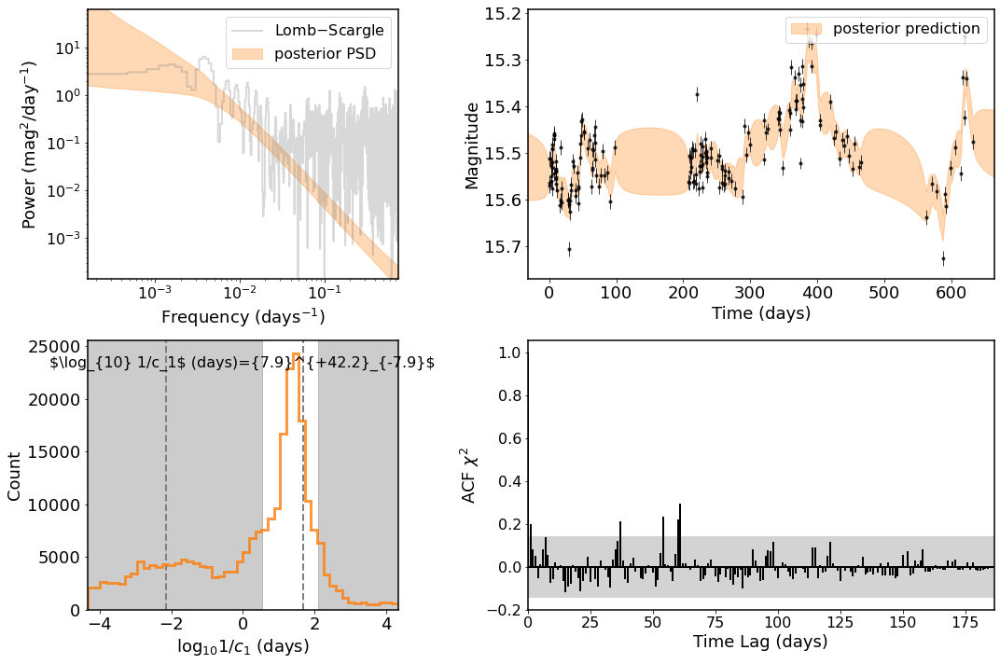

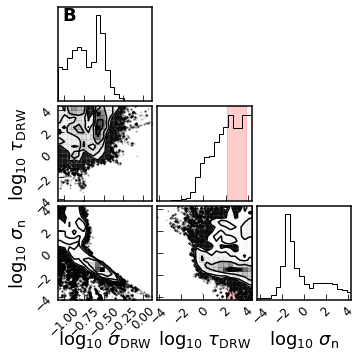

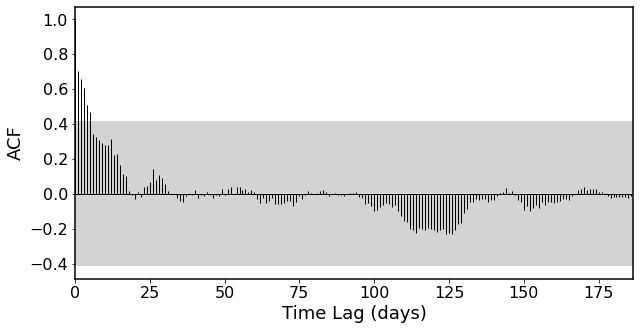

name                                                 PG 2130+099
ra                                                    323.115901
dec                                                    10.138681
z                                                        0.06298
log_M_BH                                                  7.4329
log_M_BH_e                                              0.059355
log_L5100                                                  44.14
log_L5100_e                                                 0.03
band                                                           r
unit                                                         mag
x              [58244.481713, 58247.4735301, 58256.4218981, 5...
y              [14.251194, 14.254432, 14.310618, 14.298958, 1...
yerr           [0.010709429, 0.010708245, 0.010688735, 0.0106...
RM                                                          True
LC_ref                                                       ZTF
L_ref                    

/data/des90.a/data/cburke/conda/myenv/lib/python3.9/site-packages/emcee/moves/red_blue.py:99: RuntimeWarning: invalid value encountered in double_scalars
  lnpdiff = f + nlp - state.log_prob[j]


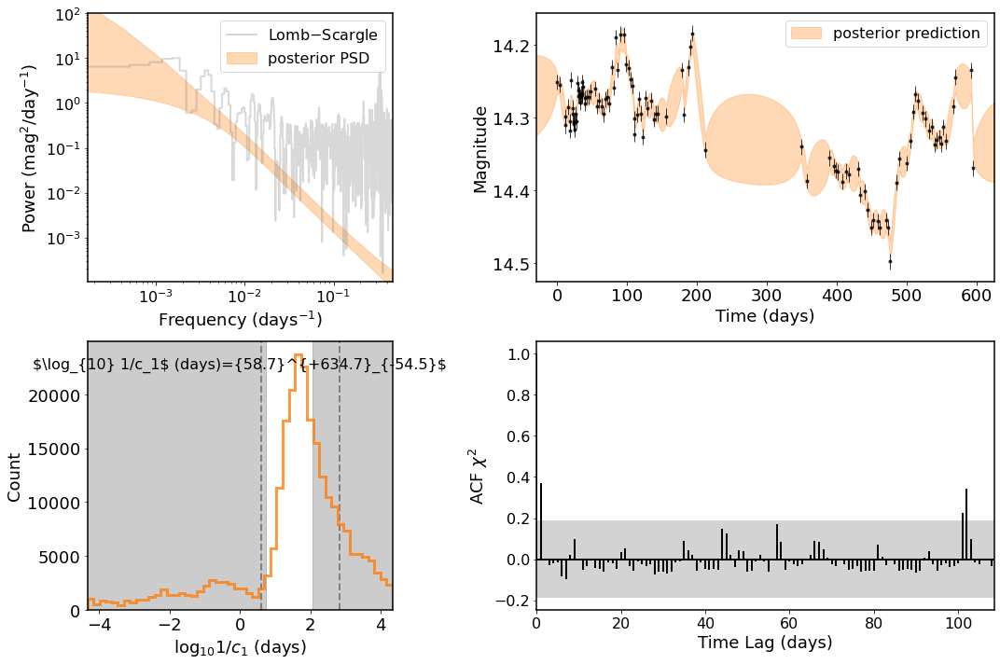

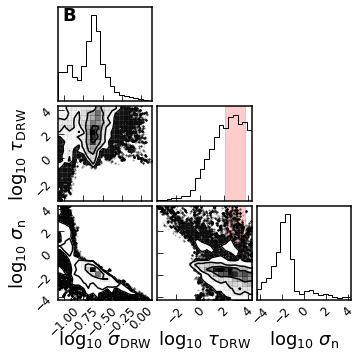

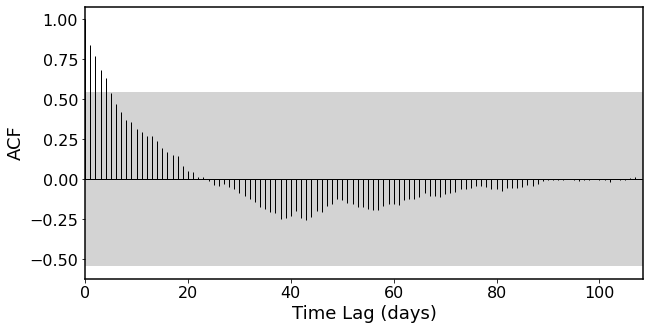

name                                                    NGC 4051
ra                                                    180.790041
dec                                                    44.531304
z                                                        0.00234
log_M_BH                                                6.129727
log_M_BH_e                                               0.13804
log_L5100                                                  41.96
log_L5100_e                                                  0.2
band                                                           r
unit                                                         mag
x              [58215.2349421, 58216.2337153, 58217.2328241, ...
y              [13.436614, 13.477542, 13.495527, 13.485842, 1...
yerr           [0.013454852, 0.013381803, 0.013349924, 0.0133...
RM                                                          True
LC_ref                                                       ZTF
L_ref                    

/data/des90.a/data/cburke/conda/myenv/lib/python3.9/site-packages/emcee/moves/red_blue.py:99: RuntimeWarning: invalid value encountered in double_scalars
  lnpdiff = f + nlp - state.log_prob[j]


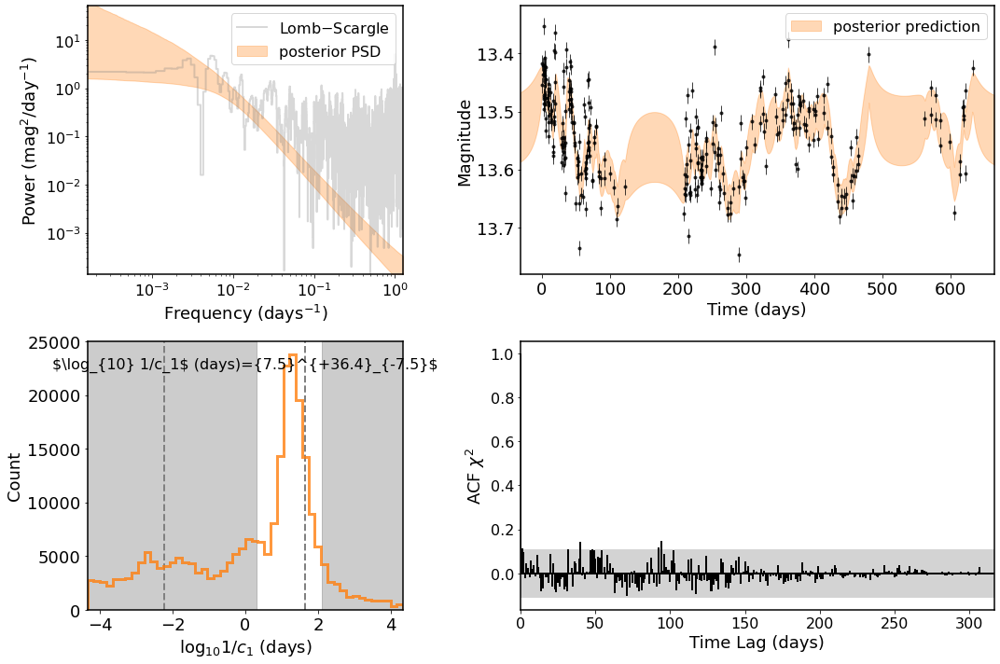

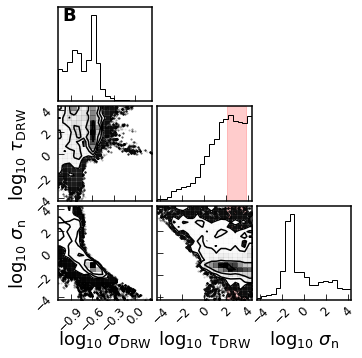

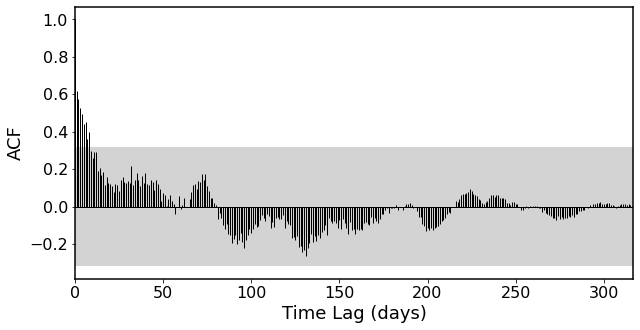

name                                                     Mrk 817
ra                                                    219.092008
dec                                                    58.794277
z                                                        0.03146
log_M_BH                                                7.586162
log_M_BH_e                                              0.067697
log_L5100                                                  43.73
log_L5100_e                                                 0.05
band                                                           r
unit                                                         mag
x              [58198.3704398, 58198.3846528, 58198.4096181, ...
y              [14.096883, 14.112911, 14.073491, 14.13281, 14...
yerr           [0.012245968, 0.012233226, 0.012264815, 0.0122...
RM                                                          True
LC_ref                                                       ZTF
L_ref                    

/data/des90.a/data/cburke/conda/myenv/lib/python3.9/site-packages/emcee/moves/red_blue.py:99: RuntimeWarning: invalid value encountered in double_scalars
  lnpdiff = f + nlp - state.log_prob[j]


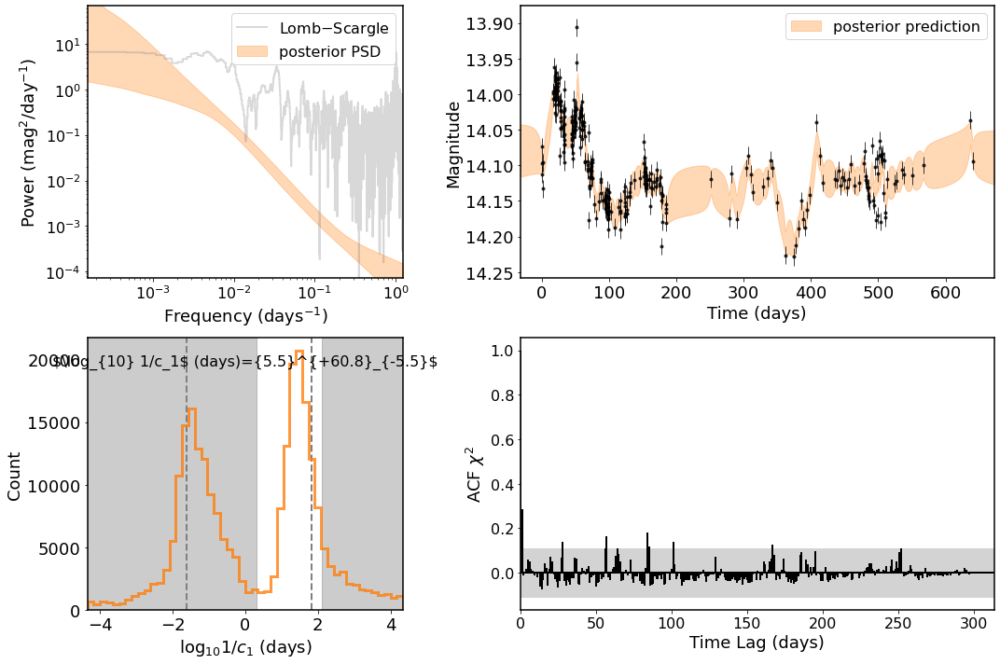

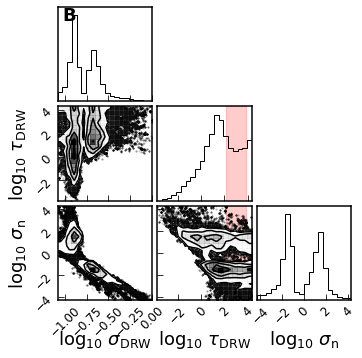

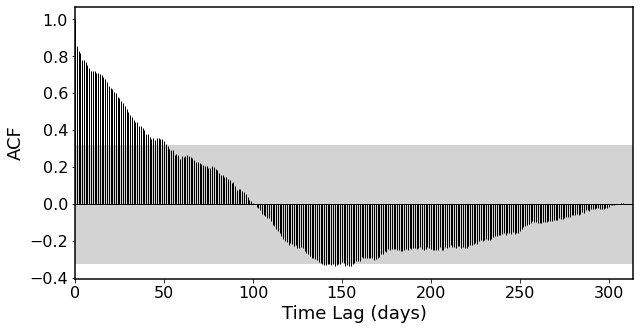

name                                                     Mrk 335
ra                                                      1.581405
dec                                                    20.202949
z                                                        0.02579
log_M_BH                                                7.230111
log_M_BH_e                                              0.042881
log_L5100                                                  43.68
log_L5100_e                                                 0.06
band                                                           r
unit                                                         mag
x              [58268.4470486, 58271.4427546, 58274.4794676, ...
y              [14.217574, 14.2241745, 14.228232, 14.2533865,...
yerr           [0.011500481, 0.011496393, 0.011493892, 0.0114...
RM                                                          True
LC_ref                                                       ZTF
L_ref                    

/data/des90.a/data/cburke/conda/myenv/lib/python3.9/site-packages/emcee/moves/red_blue.py:99: RuntimeWarning: invalid value encountered in double_scalars
  lnpdiff = f + nlp - state.log_prob[j]


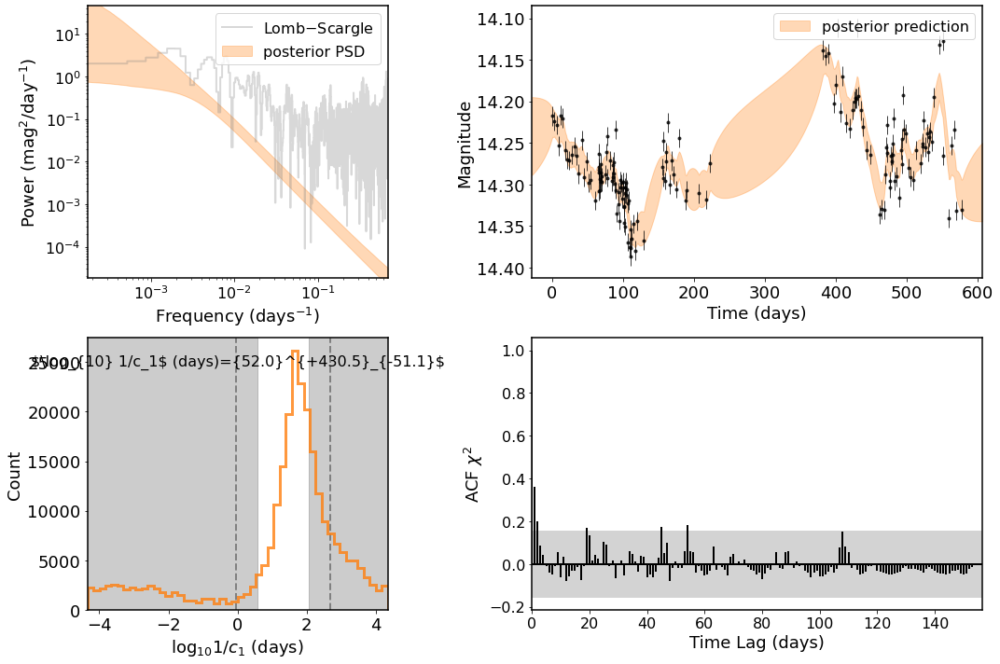

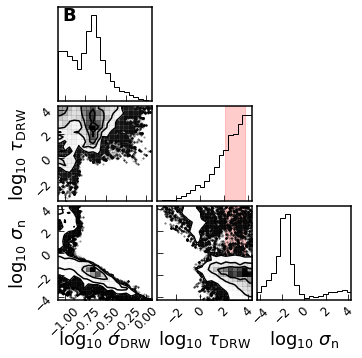

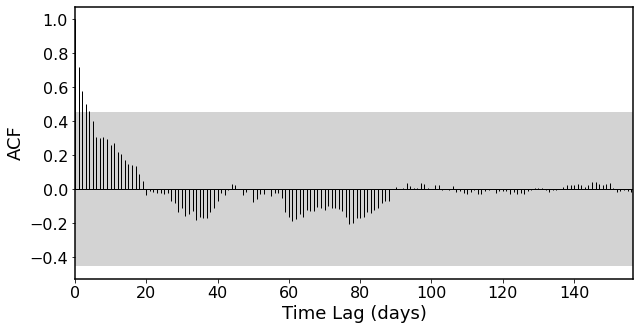

In [36]:
### CARMA(3,2) VALID ONLY ##

# You can also plot the chi^2 residuals, it should be consistent with white noise. e.g.
# the simple DRW model is sufficient to describe the data

# FIND THE MLE SOLUTION CARMA(3,2)
name, ra, dec, mass, mass_err, z, log_L5100, log_L5100err, band, unit, x, y, yerr, rm, LCref, Lref, massref = zip(*out_all)
# Create and save pandas dataframe
df_mle_carma = pd.DataFrame(data={'name':name, 'ra':ra, 'dec':dec, 'z':z, 'log_M_BH':mass, 'log_M_BH_e':mass_err,
                            'log_L5100':log_L5100, 'log_L5100_e':log_L5100err, 'band':band, 'unit':unit, 'x':x, 'y':y,
                            'yerr':yerr, 'RM':rm, 'LC_ref': LCref, 'L_ref': Lref,'M_BH_ref': massref})
# Fit MLE
baseline, cadence, tau_rest, tau_obs, tauerr_rest_sym, tauerr_rest_hi, \
tauerr_rest_lo, sigma_drw, sigma_drw_err_sym, snr, acf, length_good, cadence_good,\
tau_br, tau_br_lo, tau_br_hi = \
zip(*df_mle_carma[mask_valid].apply(clean_and_fit_drw, nburn=500, nsamp=8000, axis=1, nsamp_psd=0, load=False, save=False, carma=True)) # MLE

# Update the MLE data with new posteriors
for i_valid, i in enumerate(df_mle_carma.index[mask_valid]):
    df_mle_carma.at[i, 'tau_obs'] = tau_obs[i_valid]
    df_mle_carma.at[i, 'tau_rest'] = tau_rest[i_valid]
    df_mle_carma.at[i, 'tau_e_rest_sym'] = tauerr_rest_sym[i_valid]
    df_mle_carma.at[i, 'tau_e_rest_lo'] = tauerr_rest_lo[i_valid]
    df_mle_carma.at[i, 'tau_e_rest_hi'] = tauerr_rest_hi[i_valid]
    df_mle_carma.at[i, 'sigma_drw'] = sigma_drw[i_valid]
    df_mle_carma.at[i, 'sigma_drw_e_sym'] = sigma_drw_err_sym[i_valid]
    df_mle_carma.at[i, 'tau_br'] = tau_br[i_valid]
    df_mle_carma.at[i, 'tau_br_lo'] = tau_br_lo[i_valid]
    df_mle_carma.at[i, 'tau_br_hi'] = tau_br_hi[i_valid]

# PICKLE FOR FUTURE USE
df_csv_carma = df_mle_carma[mask_valid].copy()
df_csv_carma.to_pickle('df_carma.pkl')

### Re-fit valid light curves with full MCMC

name                                                         Mrk 335
ra                                                            1.5814
dec                                                          20.2029
z                                                            0.02579
log_M_BH                                                     7.23011
log_M_BH_e                                                  0.042881
log_L5100                                                      43.68
log_L5100_e                                                     0.06
band                                                               r
unit                                                             mag
x                  [58268.4470486, 58271.4427546, 58274.4794676, ...
y                  [14.217574, 14.2241745, 14.228232, 14.2533865,...
yerr               [0.011500481, 0.011496393, 0.011493892, 0.0114...
RM                                                              True
LC_ref                            

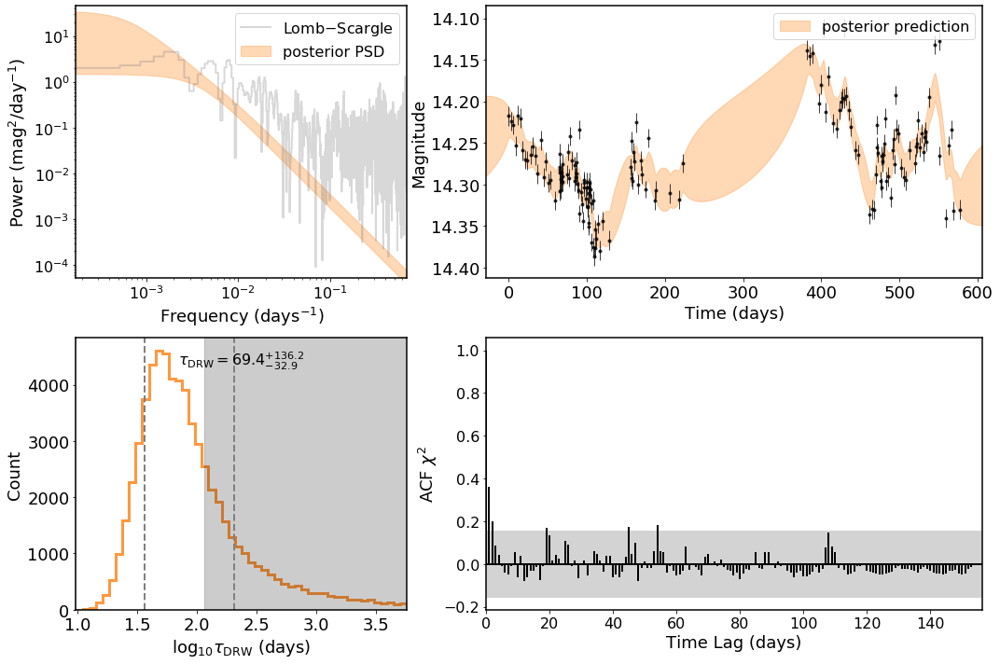

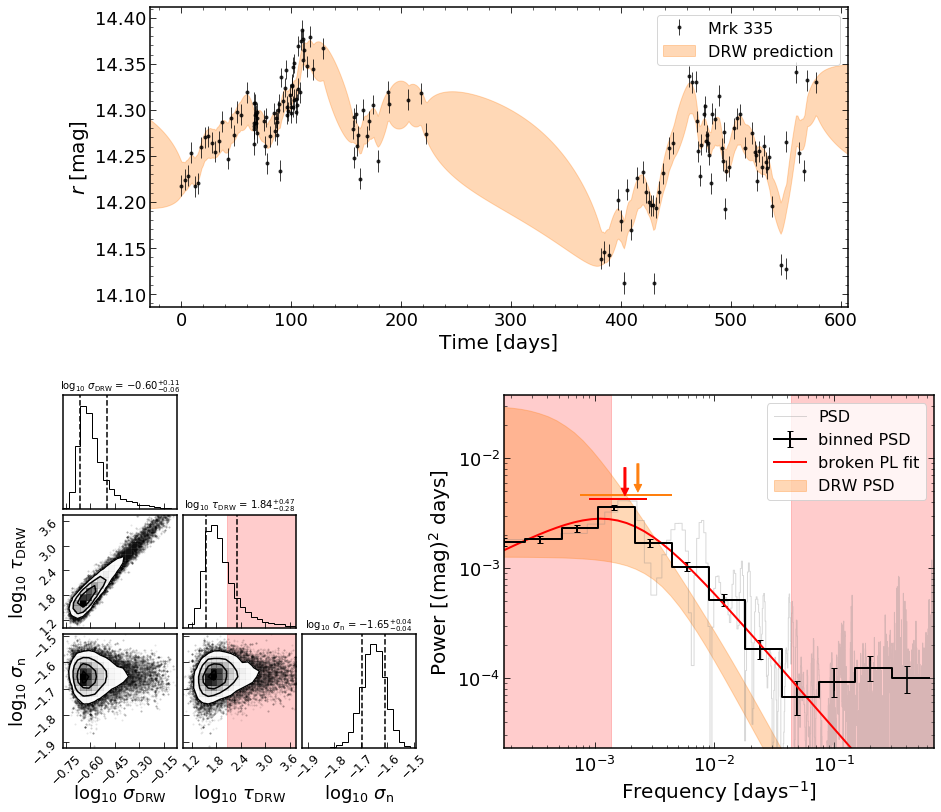

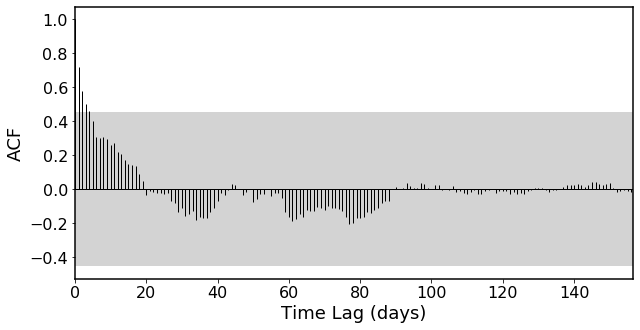

In [24]:
# DEPRICATED, Use figure generation step to get all of these
"""
# RE-FIT THE VALID ONES
baseline, cadence, tau_rest, tau_obs, tauerr_rest_sym, tauerr_rest_hi, \
tauerr_rest_lo, sigma_drw, sigma_drw_err_sym, snr, acf, length_good, cadence_good,\
tau_br, tau_br_lo, tau_br_hi  = \
zip(*df_mle[mask_valid].apply(clean_and_fit_drw, nburn=500, nsamp=2000, axis=1, nsamp_psd=100))

# Keep the MLE solution
df_mle['tau_rest_mle'] = df_mle['tau_rest']

# Update the MLE data with new posteriors
for i_valid, i in enumerate(df_mle.index[mask_valid]):
    df_mle.at[i, 'tau_obs'] = tau_obs[i_valid]
    df_mle.at[i, 'tau_rest'] = tau_rest[i_valid]
    df_mle.at[i, 'tau_e_rest_sym'] = tauerr_rest_sym[i_valid]
    df_mle.at[i, 'tau_e_rest_lo'] = tauerr_rest_lo[i_valid]
    df_mle.at[i, 'tau_e_rest_hi'] = tauerr_rest_hi[i_valid]
    df_mle.at[i, 'sigma_drw'] = sigma_drw[i_valid]
    df_mle.at[i, 'sigma_drw_e_sym'] = sigma_drw_err_sym[i_valid]
    df_mle.at[i, 'tau_br'] = tau_br[i_valid]
    df_mle.at[i, 'tau_br_lo'] = tau_br_lo[i_valid]
    df_mle.at[i, 'tau_br_hi'] = tau_br_hi[i_valid]
    
# Save DF minus light curves
df_csv = df_mle[mask_valid].copy()
df_csv.to_pickle('df_csv.pkl')

df_csv.drop(['x','y','yerr'], axis=1).to_csv('Burke+20.csv')

df_mle.drop(['x','y','yerr'], axis=1).to_csv('Burke+20_all.csv')
"""

In [6]:
df_csv = pd.read_pickle('df_csv.pkl')

In [7]:
df_csv

,name,ra,dec,z,log_M_BH,log_M_BH_e,log_L5100,log_L5100_e,band,unit,...,sigma_drw_e_sym,SNR,ACF_good,length_good,cadence_good,tau_br,tau_br_lo,tau_br_hi,valid,tau_rest_mle
1,NGC 4395,186.453600,33.546860,0.001064,3.959041,0.073923,39.76,0.03,TESS,$e^{-}$ s$^{-1}$,...,1.252096,1.614728,True,True,True,2,3,1,True,2.175117
6,48.2620.2719,74.059140,-67.653003,0.260000,7.790000,0.480000,44.01,0.00,V,mag,...,0.044970,1.965682,True,True,True,347,574,249,True,190.961301
29,Mrk 279,208.264315,69.308170,0.030000,7.540000,0.110000,43.88,0.00,R,$10^{-15}$ erg s$^{-1}$ cm$^{-2} \AA^{-1}$,...,0.188059,1.211954,True,True,True,255,-380,95,True,40.861051
31,NGC 5548,214.498084,25.136833,0.017000,7.820000,0.010000,43.51,0.00,R,$10^{-15}$ erg s$^{-1}$ cm$^{-2} \AA^{-1}$,...,0.347625,3.750813,True,True,True,2338,-554,375,True,232.839398
33,NGC 3783,174.757123,-37.738613,0.009000,7.470000,0.070000,43.26,0.00,R,$10^{-15}$ erg s$^{-1}$ cm$^{-2} \AA^{-1}$,...,0.263281,1.428816,True,True,True,111,-190,43,True,21.797332
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
387,Arp 151,171.400644,54.382536,0.021090,6.670271,0.049735,42.48,0.11,r,mag,...,0.012931,1.583121,True,True,True,53,111,35,True,24.001145
396,PG 2130+099,323.115917,10.138667,0.062980,7.432900,0.059355,44.14,0.03,r,mag,...,0.014153,3.751118,True,True,True,144,260,100,True,38.281117
401,NGC 4051,181.043400,44.544200,0.002340,6.129727,0.138040,41.96,0.20,r,mag,...,0.009069,1.157876,True,True,True,80,975,42,True,16.425641
402,Mrk 817,219.092008,58.794277,0.031460,7.586162,0.067697,43.73,0.05,r,mag,...,0.008777,1.877343,True,True,True,57,-254,25,True,33.765399


### Remove Duplicates

In [8]:
#df_csv.iloc[np.unique(ind_dup)].sort_values('ra')

In [9]:
df_csv = df_csv.reset_index(drop=True)
c = SkyCoord(df_csv.ra, df_csv.dec, unit=u.deg)
ind1, ind2, d2d, d3d = c.search_around_sky(c, 2*u.arcsec)
m = np.zeros_like(ind1, dtype=bool)
m[np.unique(ind1, return_index=True)[1]] = True
ind_dup = ind1[~m]

ind_rm = []
# Drop the ones with the largest tau error
for i in np.unique(ind_dup):
    rai = df_csv.ra.iloc[i]
    deci = df_csv.dec.iloc[i]
    ci = SkyCoord([rai], [deci], unit=u.deg)
    # Find matches
    ind, ind2, d2d, d3d = ci.search_around_sky(c, 2*u.arcsec)
    if len(ind[d2d < 2*u.arcsec]) < 2:
        continue
    tauserr = df_csv.tau_e_rest_hi.iloc[ind[d2d < 2*u.arcsec]].to_numpy()
    ind_rm.append(np.unique(ind[tauserr!=np.min(tauserr)]))
    
ind_rm = np.concatenate(ind_rm).ravel()
print(ind_rm)
df_csv.drop(index=np.unique(ind_rm), inplace=True)
df_csv = df_csv.reset_index(drop=True)

[67 55 66 55 66 55 66 67]


In [10]:
df_csv

,name,ra,dec,z,log_M_BH,log_M_BH_e,log_L5100,log_L5100_e,band,unit,...,sigma_drw_e_sym,SNR,ACF_good,length_good,cadence_good,tau_br,tau_br_lo,tau_br_hi,valid,tau_rest_mle
0,NGC 4395,186.453600,33.546860,0.001064,3.959041,0.073923,39.760000,0.03000,TESS,$e^{-}$ s$^{-1}$,...,1.252096,1.614728,True,True,True,2,3,1,True,2.175117
1,48.2620.2719,74.059140,-67.653003,0.260000,7.790000,0.480000,44.010000,0.00000,V,mag,...,0.044970,1.965682,True,True,True,347,574,249,True,190.961301
2,Mrk 279,208.264315,69.308170,0.030000,7.540000,0.110000,43.880000,0.00000,R,$10^{-15}$ erg s$^{-1}$ cm$^{-2} \AA^{-1}$,...,0.188059,1.211954,True,True,True,255,-380,95,True,40.861051
3,NGC 5548,214.498084,25.136833,0.017000,7.820000,0.010000,43.510000,0.00000,R,$10^{-15}$ erg s$^{-1}$ cm$^{-2} \AA^{-1}$,...,0.347625,3.750813,True,True,True,2338,-554,375,True,232.839398
4,NGC 3783,174.757123,-37.738613,0.009000,7.470000,0.070000,43.260000,0.00000,R,$10^{-15}$ erg s$^{-1}$ cm$^{-2} \AA^{-1}$,...,0.263281,1.428816,True,True,True,111,-190,43,True,21.797332
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
62,Mrk 50,185.850570,2.679015,0.023430,7.421858,0.062424,42.731000,0.00500,r,mag,...,0.040994,3.783987,True,True,True,54,-13,8,True,34.770331
63,Mrk 1044,37.523010,-8.998113,0.016451,6.450000,0.125000,42.672098,0.09234,r,mag,...,0.006726,1.789838,True,True,True,77,99,63,True,11.451600
64,Arp 151,171.400644,54.382536,0.021090,6.670271,0.049735,42.480000,0.11000,r,mag,...,0.012931,1.583121,True,True,True,53,111,35,True,24.001145
65,Mrk 817,219.092008,58.794277,0.031460,7.586162,0.067697,43.730000,0.05000,r,mag,...,0.008777,1.877343,True,True,True,57,-254,25,True,33.765399


In [11]:
len(df_csv[df_csv.baseline > 7*df_csv.tau_rest*(1+df_csv.z)]) # 67

67

### Simulated Light Curves

In [13]:
def simulate_from_psd(S_func, m=2000, dt=1, ymean=0, sigma=0.2, size=1, seed=None, **args):
    """
    Simulate light curve given input times, model PSD, and ymean
    
    S_func: model PSD function S(omega) [note omega = 2 pi f]
    m: number of bins [output will have length 2(m - 1)]
    dt: equal spacing in time
    ymean: data mean
    sigma: data standard deviation
    size: number of samples
    seed: seed for numpy's random number generator (use 'None' to re-seed)
        
    returns:
    x:
    y: simulated light curve samples of shape [size, 2(m - 1)]
    omega: 
    
    Adapted from Timmer, J. & Koenig, M. On Generating Power Law Noise. A&A 300 707 (1995)
    and https://github.com/pabell/pylcsim/blob/master/lcpsd.py
    """
    
    np.random.seed(seed)
    
    n = 2*(m - 1)
    
    # Get FFT frequencies
    f = np.fft.rfftfreq(n=n, d=dt)[1:]
    omega = f*2*np.pi
    
    # Evaluate PSD function
    S = S_func(omega, **args)
    
    # Model PSD factor
    fac = np.sqrt(S/2.0)
        
    y = np.zeros([size, n-2])
    
    for i in range(size):
    
        # Generate the real and imaginary terms
        re = np.random.normal(size=n//2)*fac
        im = np.random.normal(size=n//2)*fac
        
        # Generate randomized PSD
        S_rand = re + 1j*im

        yi = np.fft.irfft(S_rand)
        
        # Renormalize the light curve
        mean = np.mean(yi)
        std = np.std(yi)
        y[i,:] = (yi - mean)/std*sigma + ymean

    # Times
    x = dt*np.arange(0, n-2)
    
    return x, y, f, S

def smoothly_broken_power_law(f, A=1, f_br=1e-3, alpha=0, beta=2):
    return A/((f/f_br)**alpha + (f/f_br)**beta)

def simulate_lc(dfi, alpha=0, beta=2):
    
    # Not considered: excess noise and outliers. Should not matter much.
    tau_input = dfi.tau_obs
    sigma_input = dfi.sigma_drw
    x = dfi.x
    y = dfi.y
    yerr = dfi.yerr
    
    # Clean data
    mask_pos = (y>0)
    x = np.array(x)[mask_pos]
    y = np.array(y)[mask_pos]
    yerr = np.array(yerr)[mask_pos]
    
    # Sort data
    ind = np.argsort(x)
    x = x[ind]; y = y[ind]; yerr = yerr[ind]
    
    # Normalize
    norm = np.median(y)
    y = y/norm
    yerr = yerr/norm
    x = x - np.min(x)
    
    dt = 0.1
    
    t = np.arange(np.min(x), np.max(x), dt) # Use fine sampling dt=0.1
    # CHANGE TO ARANGE, 1 DAY to better sampling!
    
    if alpha == 0 and beta==2: # DRW
        y = simulate_drw(t, tau=tau_input, sigma=sigma_input, ymean=np.median(y))[0] # Simulate
        y = np.interp(x, t, y) # Interp to LC sampling
        y += np.random.normal(0, yerr) # Real SNR
    
    else:
        # Note here f_br does NOT need any factors of 2 pi!
        t, y, omega, psd = simulate_from_psd(smoothly_broken_power_law, m=int(np.max(x)/dt+1), \
                                             A=1, f_br=1/tau_input, alpha=alpha, beta=beta, \
                                             dt=dt, ymean=np.median(y), sigma=sigma_input)
        y = y[0]
        y = np.interp(x, t, y) # Interp to LC sampling
        y += np.random.normal(0, yerr) # Real SNR
    
    return x, y, yerr

name                                                         Mrk 279
ra                                                           208.264
dec                                                          69.3082
z                                                               0.03
log_M_BH                                                        7.54
log_M_BH_e                                                      0.11
log_L5100                                                      43.88
log_L5100_e                                                        0
band                                                               R
unit                      $10^{-15}$ erg s$^{-1}$ cm$^{-2} \AA^{-1}$
x                  [0.0, 0.8980000000010477, 1.8980000000010477, ...
y                  [0.7840001144451456, 0.6623309035171058, 0.749...
yerr               [0.05824959953400321, 0.05956021552351827, 0.0...
RM                                                              True
LC_ref                            

/data/des90.a/data/cburke/conda/myenv/lib/python3.8/site-packages/emcee/moves/red_blue.py:99: RuntimeWarning: invalid value encountered in double_scalars
  lnpdiff = f + nlp - state.log_prob[j]


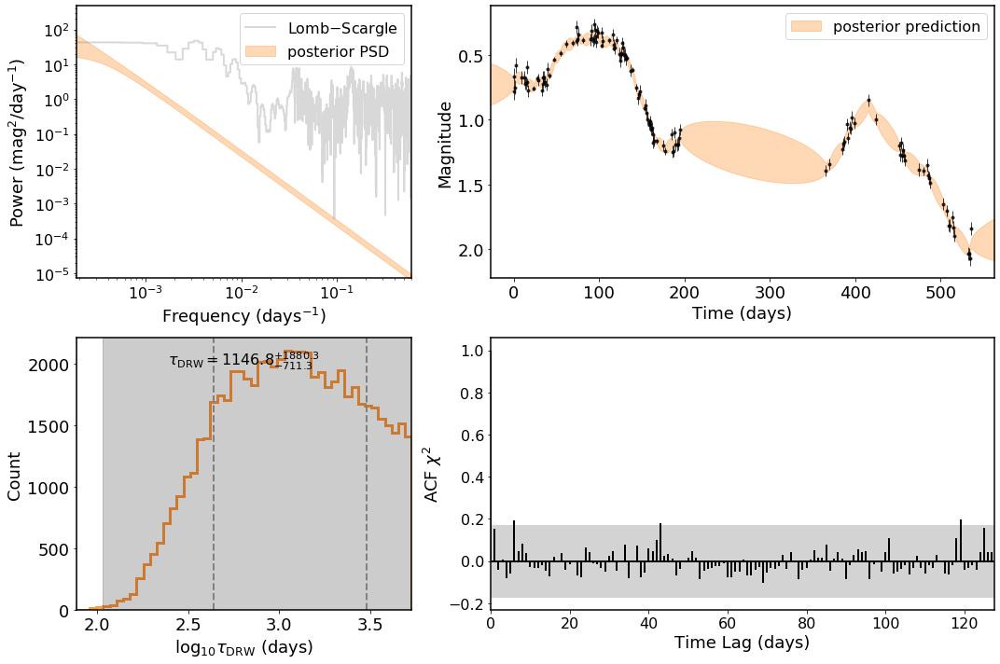

MLE


KeyboardInterrupt: 

Error in callback <function flush_figures at 0x7f49a1407940> (for post_execute):


KeyboardInterrupt: 

In [10]:
df_sim_4 = df_csv.copy()
df_sim_4 = df_sim_4.reset_index(drop=True)

x,y,yerr = zip(*df_sim_4.apply(simulate_lc, axis=1, alpha=0, beta=4))

for i in range(len(df_sim_4)):
    df_sim_4.at[i, 'x'] = x[i]
    df_sim_4.at[i, 'y'] = y[i]
    df_sim_4.at[i, 'yerr'] = yerr[i]
    
# RE-FIT THE VALID ONES
baseline, cadence, tau_rest, tau_obs, tauerr_rest_sym, tauerr_rest_hi, \
tauerr_rest_lo, sigma_drw, sigma_drw_err_sym, snr, acf, length_good, cadence_good,\
tau_br, tau_br_lo, tau_br_hi  = \
zip(*df_sim_4.apply(clean_and_fit_drw, nburn=500, nsamp=2000, axis=1, nsamp_psd=100))
    
df_sim_4.to_pickle('df_sim_4.pkl')

In [22]:
df_sim_drw = df_csv.copy()
df_sim_drw = df_sim_drw.reset_index(drop=True)

x,y,yerr = zip(*df_sim_drw.apply(simulate_lc, axis=1, alpha=0))

for i in range(len(df_sim_drw)):
    df_sim_drw.at[i, 'x'] = x[i]
    df_sim_drw.at[i, 'y'] = y[i]
    df_sim_drw.at[i, 'yerr'] = yerr[i]
    
# RE-FIT THE VALID ONES
baseline, cadence, tau_rest, tau_obs, tauerr_rest_sym, tauerr_rest_hi, \
tauerr_rest_lo, sigma_drw, sigma_drw_err_sym, snr, acf, length_good, cadence_good,\
tau_br, tau_br_lo, tau_br_hi  = \
zip(*df_sim_drw.apply(clean_and_fit_drw, nburn=500, nsamp=2000, axis=1, nsamp_psd=100))

# Update the MLE data with new posteriors
for i in range(len(df_sim_drw)):
    df_sim_drw.at[i, 'tau_obs'] = tau_obs[i]
    df_sim_drw.at[i, 'tau_rest'] = tau_rest[i]
    df_sim_drw.at[i, 'tau_e_rest_sym'] = tauerr_rest_sym[i]
    df_sim_drw.at[i, 'tau_e_rest_lo'] = tauerr_rest_lo[i]
    df_sim_drw.at[i, 'tau_e_rest_hi'] = tauerr_rest_hi[i]
    df_sim_drw.at[i, 'sigma_drw'] = sigma_drw[i]
    df_sim_drw.at[i, 'sigma_drw_e_sym'] = sigma_drw_err_sym[i]
    df_sim_drw.at[i, 'tau_br'] = tau_br[i]
    df_sim_drw.at[i, 'tau_br_lo'] = tau_br_lo[i]
    df_sim_drw.at[i, 'tau_br_hi'] = tau_br_hi[i]
    df_sim_drw.at[i, 'ACF_good'] = acf[i]
    df_sim_drw.at[i, 'SNR'] = snr[i]
    
#df_sim_drw.to_pickle('df_sim_drw.pkl')
df_sim_drw.to_pickle('df_sim_drw_NEW.pkl')

NameError: name 'df_csv' is not defined

name                                                         Mrk 335
ra                                                            1.5814
dec                                                          20.2029
z                                                            0.02579
log_M_BH                                                     7.23011
log_M_BH_e                                                  0.042881
log_L5100                                                      43.68
log_L5100_e                                                     0.06
band                                                               r
unit                                                             mag
x                  [0.0, 2.995706000001519, 6.032419000002847, 8....
y                  [0.9479235768904998, 0.9715681563856352, 0.957...
yerr               [0.00080540945, 0.00080512324, 0.0008049481, 0...
RM                                                              True
LC_ref                            

/data/des90.a/data/cburke/conda/myenv/lib/python3.8/site-packages/emcee/moves/red_blue.py:99: RuntimeWarning: invalid value encountered in double_scalars
  lnpdiff = f + nlp - state.log_prob[j]


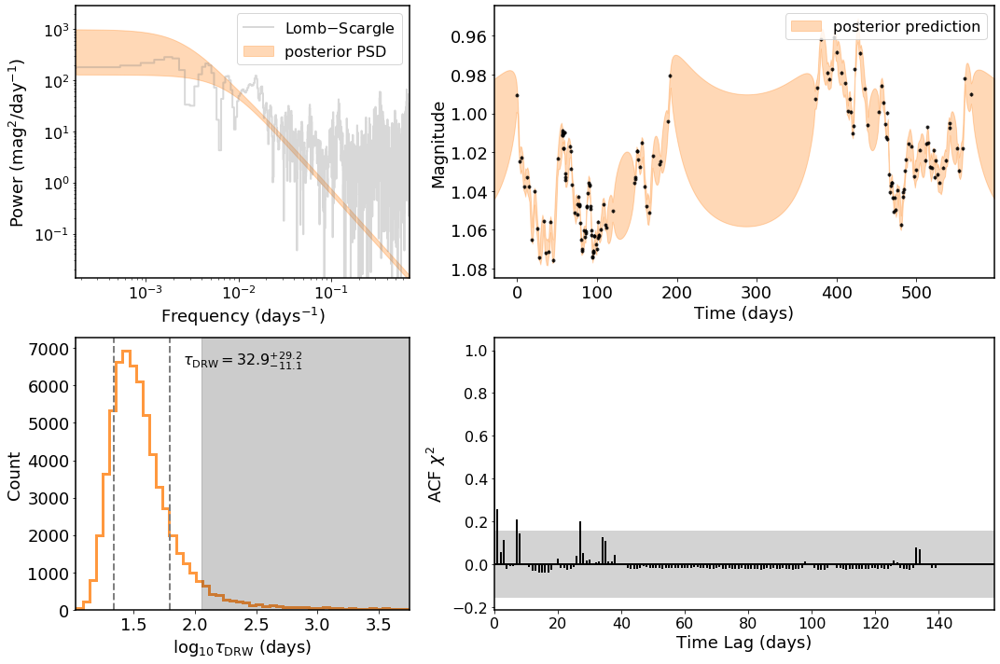

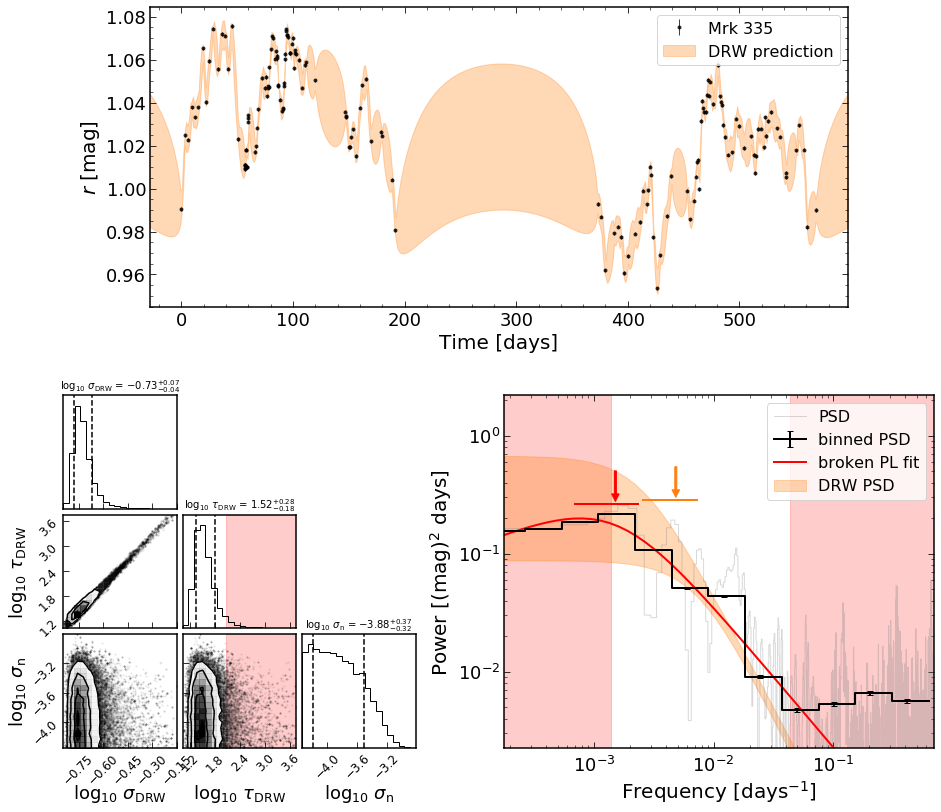

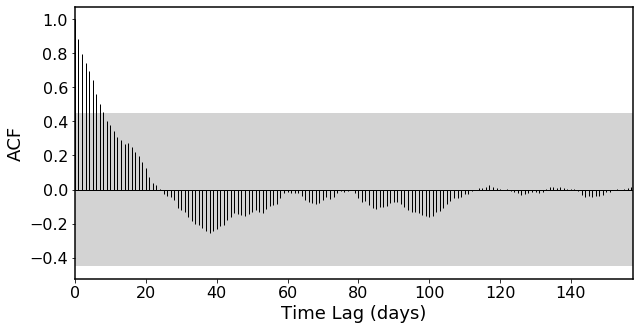

In [43]:
df_sim_12 = df_csv.copy()
df_sim_12 = df_sim_12.reset_index(drop=True)

x,y,yerr = zip(*df_sim_12.apply(simulate_lc, axis=1, alpha=1))

for i in range(len(df_sim_12)):
    df_sim_12.at[i, 'x'] = x[i]
    df_sim_12.at[i, 'y'] = y[i]
    df_sim_12.at[i, 'yerr'] = yerr[i]
    
# RE-FIT THE VALID ONES
baseline, cadence, tau_rest, tau_obs, tauerr_rest_sym, tauerr_rest_hi, \
tauerr_rest_lo, sigma_drw, sigma_drw_err_sym, snr, acf, length_good, cadence_good,\
tau_br, tau_br_lo, tau_br_hi  = \
zip(*df_sim_12.apply(clean_and_fit_drw, nburn=500, nsamp=2000, axis=1, nsamp_psd=100))

# Update the MLE data with new posteriors
for i in range(len(df_sim_12)):
    df_sim_12.at[i, 'tau_obs'] = tau_obs[i]
    df_sim_12.at[i, 'tau_rest'] = tau_rest[i]
    df_sim_12.at[i, 'tau_e_rest_sym'] = tauerr_rest_sym[i]
    df_sim_12.at[i, 'tau_e_rest_lo'] = tauerr_rest_lo[i]
    df_sim_12.at[i, 'tau_e_rest_hi'] = tauerr_rest_hi[i]
    df_sim_12.at[i, 'sigma_drw'] = sigma_drw[i]
    df_sim_12.at[i, 'sigma_drw_e_sym'] = sigma_drw_err_sym[i]
    df_sim_12.at[i, 'tau_br'] = tau_br[i]
    df_sim_12.at[i, 'tau_br_lo'] = tau_br_lo[i]
    df_sim_12.at[i, 'tau_br_hi'] = tau_br_hi[i]
    df_sim_12.at[i, 'ACF_good'] = acf[i]
    df_sim_12.at[i, 'SNR'] = snr[i]
    
df_sim_12.to_pickle('df_sim_12.pkl')

In [140]:
print(df_sim_01.SNR[df_sim_01.SNR>1])

Series([], Name: SNR, dtype: float64)


In [15]:
df_sim_12 = pd.read_pickle('df_sim_12.pkl')
df_sim_drw = pd.read_pickle('df_sim_drw_NEW.pkl')

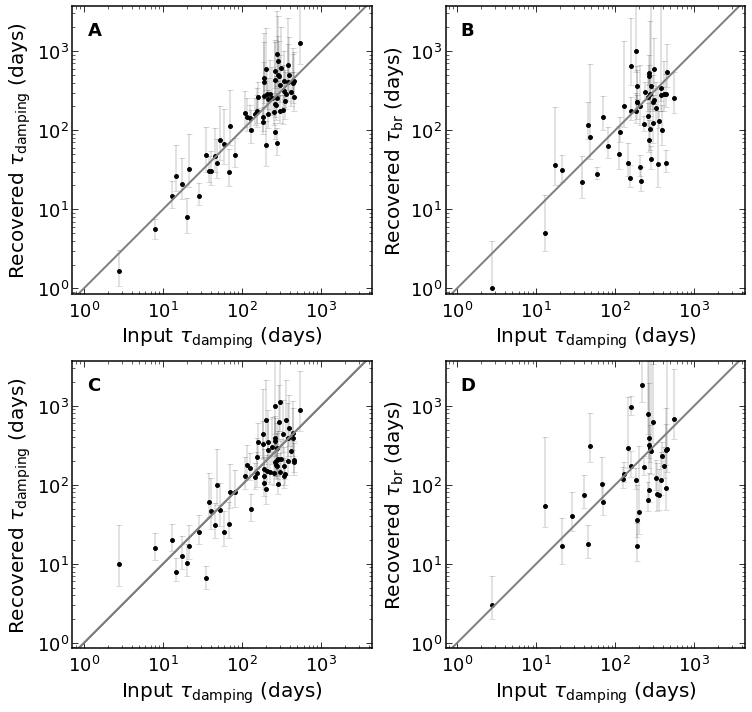

In [16]:
fig,axs = plt.subplots(2,2, figsize=(10.55,10))

# DRW
df_sim = df_sim_drw
ax = axs[0,0]
ax.set_xscale('log')
ax.set_yscale('log')

tau_in = df_csv.tau_rest.to_numpy()
tau = df_sim.tau_rest.to_numpy()
tau_e = np.array([df_sim.tau_e_rest_lo.to_numpy(), df_sim.tau_e_rest_hi.to_numpy()])


# Points
ax.scatter(tau_in, tau,
           marker='o', s=15, zorder=-1, color='k')

# Error bars
m,c,b = ax.errorbar(tau_in, tau, 
                    yerr=tau_e,
                    linestyle='', fmt='', fillstyle='none', ms=5,
                    ecolor='k', capsize=3, zorder=-3)
[i.set_alpha(0.15) for i in b]
[i.set_alpha(0.15) for i in c]

y = np.logspace(-1,5)
ax.plot(y, y, lw=2, color='grey')

ax.tick_params('both',labelsize=18)
ax.set_ylabel(r'Recovered $\tau_{\rm{damping}}$ (days)',fontsize=20)
ax.set_xlabel(r'Input $\tau_{\rm{damping}}$ (days)',fontsize=20)

ax.annotate("A", fontsize=18, weight='bold', xy=(0.05, 0.9), xycoords="axes fraction")

ax.minorticks_on()
ax.tick_params(axis='both', which='both', direction='in')
ax.tick_params(axis='both', which='major', length=6)
ax.tick_params(axis='both', which='minor', length=3)

ax.axis('equal')
ax.set_xlim([10**(0), 10**(3.5)])
ax.set_ylim([10**(0), 10**(3.5)])

ax.tick_params(axis='x', which='major', pad=7)

ax.xaxis.set_ticks_position('both')
ax.yaxis.set_ticks_position('both')
import matplotlib.ticker as ticker
ax.tick_params(axis='x', which='major', pad=7)
ax.xaxis.set_major_locator(ticker.LogLocator(base=10.0, numticks=12))
ax.xaxis.set_minor_locator(ticker.LogLocator(base=10.0, subs=(0.1,0.2,0.3,0.4,0.5,0.6,0.7,0.8,0.9), numticks=12))


ax = axs[0,1]
ax.set_xscale('log')
ax.set_yscale('log')

tau_br_sim = df_sim.tau_br.to_numpy()
tau_hi_br_sim = df_sim.tau_br_hi.to_numpy()
tau_lo_br_sim = df_sim.tau_br_lo.to_numpy()

tau_hi_br_sim = np.amax([df_sim.tau_br_lo.to_numpy(), df_sim.tau_br_hi.to_numpy()], axis=0)
tau_lo_br_sim = np.amin([df_sim.tau_br_lo.to_numpy(), df_sim.tau_br_hi.to_numpy()], axis=0)

log_tau_br_sim = np.log10(tau_br_sim)
tau_e_hi_br_sim = tau_hi_br_sim - tau_br_sim
tau_e_lo_br_sim = tau_br_sim - tau_lo_br_sim

#tau_e_lo_br_sim[tau_e_lo_br_sim<=tau_br_sim] = .9*tau_br_sim[tau_e_lo_br_sim<=tau_br_sim]

# throw these out
mask_good = np.isfinite(tau_e_hi_br_sim) & (tau_e_lo_br_sim < tau_br_sim)


tau_e_br_sim = np.array([tau_e_lo_br_sim, tau_e_hi_br_sim])
log_tau_e_br_sim = 0.434*np.mean(tau_e_br_sim, axis=0)/tau


# Points
ax.scatter(tau_in[mask_good], tau_br_sim[mask_good],
           marker='o', s=15, zorder=-1, color='k')

# Error bars
m,c,b = ax.errorbar(tau_in[mask_good], tau_br_sim[mask_good],
                    yerr=tau_e_br_sim[:,mask_good],
                    linestyle='', fmt='', fillstyle='none', ms=5,
                    ecolor='k', capsize=3, zorder=-3)
[i.set_alpha(0.15) for i in b]
[i.set_alpha(0.15) for i in c]

ax.tick_params('both',labelsize=18)
ax.set_ylabel(r'Recovered $\tau_{\rm{br}}$ (days)',fontsize=20)
ax.set_xlabel(r'Input $\tau_{\rm{damping}}$ (days)',fontsize=20)

ax.annotate("B", fontsize=18, weight='bold', xy=(0.05, 0.9), xycoords="axes fraction")

ax.minorticks_on()
ax.tick_params(axis='both', which='both', direction='in')
ax.tick_params(axis='both', which='major', length=6)
ax.tick_params(axis='both', which='minor', length=3)

ax.axis('equal')
ax.set_xlim([10**(0), 10**(3.5)])
ax.set_ylim([10**(0), 10**(3.5)])

ax.plot(y, y, lw=2, color='grey')

ax.tick_params(axis='x', which='major', pad=7)

ax.xaxis.set_ticks_position('both')
ax.yaxis.set_ticks_position('both')
import matplotlib.ticker as ticker
ax.tick_params(axis='x', which='major', pad=7)
ax.xaxis.set_major_locator(ticker.LogLocator(base=10.0, numticks=12))
ax.xaxis.set_minor_locator(ticker.LogLocator(base=10.0, subs=(0.1,0.2,0.3,0.4,0.5,0.6,0.7,0.8,0.9), numticks=12))
ax.xaxis.set_minor_formatter(ticker.NullFormatter())



# NON-DRW 1 - 2
df_sim = df_sim_12
ax = axs[1,0]
ax.set_xscale('log')
ax.set_yscale('log')

tau_in = df_csv.tau_rest.to_numpy()
tau = df_sim.tau_rest.to_numpy()
tau_e = np.array([df_sim.tau_e_rest_lo.to_numpy(), df_sim.tau_e_rest_hi.to_numpy()])


# Points
ax.scatter(tau_in, tau,
           marker='o', s=15, zorder=-1, color='k')

# Error bars
m,c,b = ax.errorbar(tau_in, tau, 
                    yerr=tau_e,
                    linestyle='', fmt='', fillstyle='none', ms=5,
                    ecolor='k', capsize=3, zorder=-3)
[i.set_alpha(0.15) for i in b]
[i.set_alpha(0.15) for i in c]

ax.plot(y, y, lw=2, color='grey')

ax.tick_params('both',labelsize=18)
ax.set_ylabel(r'Recovered $\tau_{\rm{damping}}$ (days)',fontsize=20)
ax.set_xlabel(r'Input $\tau_{\rm{damping}}$ (days)',fontsize=20)

ax.annotate("C", fontsize=18, weight='bold', xy=(0.05, 0.9), xycoords="axes fraction")

ax.minorticks_on()
ax.tick_params(axis='both', which='both', direction='in')
ax.tick_params(axis='both', which='major', length=6)
ax.tick_params(axis='both', which='minor', length=3)

ax.axis('equal')
ax.set_xlim([10**(0), 10**(3.5)])
ax.set_ylim([10**(0), 10**(3.5)])

ax.plot(y, y, lw=2, color='grey')

ax.tick_params(axis='x', which='major', pad=7)

ax.xaxis.set_ticks_position('both')
ax.yaxis.set_ticks_position('both')
ax.tick_params(axis='x', which='major', pad=7)
ax.xaxis.set_major_locator(ticker.LogLocator(base=10.0, numticks=12))
ax.xaxis.set_minor_locator(ticker.LogLocator(base=10.0, subs=(0.1,0.2,0.3,0.4,0.5,0.6,0.7,0.8,0.9), numticks=12))


ax = axs[1,1]
ax.set_xscale('log')
ax.set_yscale('log')

tau_br_sim = df_sim.tau_br.to_numpy()
tau_hi_br_sim = df_sim.tau_br_hi.to_numpy()
tau_lo_br_sim = df_sim.tau_br_lo.to_numpy()

tau_hi_br_sim = np.amax([df_sim.tau_br_lo.to_numpy(), df_sim.tau_br_hi.to_numpy()], axis=0)
tau_lo_br_sim = np.amin([df_sim.tau_br_lo.to_numpy(), df_sim.tau_br_hi.to_numpy()], axis=0)

log_tau_br_sim = np.log10(tau_br_sim)
tau_e_hi_br_sim = tau_hi_br_sim - tau_br_sim
tau_e_lo_br_sim = tau_br_sim - tau_lo_br_sim

#tau_e_lo_br_sim[tau_e_lo_br_sim<=tau_br_sim] = .9*tau_br_sim[tau_e_lo_br_sim<=tau_br_sim]

# throw these out
mask_good = np.isfinite(tau_e_hi_br_sim) & (tau_e_lo_br_sim < tau_br_sim)


tau_e_br_sim = np.array([tau_e_lo_br_sim, tau_e_hi_br_sim])
log_tau_e_br_sim = 0.434*np.mean(tau_e_br_sim, axis=0)/tau


# Points
ax.scatter(tau_in[mask_good], tau_br_sim[mask_good],
           marker='o', s=15, zorder=-1, color='k')

# Error bars
m,c,b = ax.errorbar(tau_in[mask_good], tau_br_sim[mask_good],
                    yerr=tau_e_br_sim[:,mask_good],
                    linestyle='', fmt='', fillstyle='none', ms=5,
                    ecolor='k', capsize=3, zorder=-3)
[i.set_alpha(0.15) for i in b]
[i.set_alpha(0.15) for i in c]

ax.plot(y, y, lw=2, color='grey')

ax.tick_params('both',labelsize=18)
ax.set_ylabel(r'Recovered $\tau_{\rm{br}}$ (days)',fontsize=20)
ax.set_xlabel(r'Input $\tau_{\rm{damping}}$ (days)',fontsize=20)

ax.annotate("D", fontsize=18, weight='bold', xy=(0.05, 0.9), xycoords="axes fraction")

ax.minorticks_on()
ax.tick_params(axis='both', which='both', direction='in')
ax.tick_params(axis='both', which='major', length=6)
ax.tick_params(axis='both', which='minor', length=3)

ax.axis('equal')
ax.set_xlim([10**(0), 10**(3.5)])
ax.set_ylim([10**(0), 10**(3.5)])

ax.tick_params(axis='x', which='major', pad=7)

ax.xaxis.set_ticks_position('both')
ax.yaxis.set_ticks_position('both')
import matplotlib.ticker as ticker
ax.tick_params(axis='x', which='major', pad=7)
ax.xaxis.set_major_locator(ticker.LogLocator(base=10.0, numticks=12))
ax.xaxis.set_minor_locator(ticker.LogLocator(base=10.0, subs=(0.1,0.2,0.3,0.4,0.5,0.6,0.7,0.8,0.9), numticks=12))
ax.xaxis.set_minor_formatter(ticker.NullFormatter())

#ax.legend(fontsize=16, loc=2, handletextpad=0.0, frameon=False)
fig.tight_layout()
fig.savefig('figures/tauintauout.pdf', dpi=300)

### Linear Regression


In [106]:
# Make sure everything has a redshift (got proper frame)
df_csv[df_csv.z==0]

,name,ra,dec,z,log_M_BH,log_M_BH_e,log_L5100,log_L5100_e,band,x,...,sigma_drw,sigma_drw_e_sym,SNR,ACF_good,length_good,cadence_good,tau_br,tau_br_lo,tau_br_hi,valid


In [1145]:
#df_csv = pd.read_csv('Burke+20.csv', index_col=0)
df_csv = df_csv.reset_index()

### Save to LaTeX

In [38]:
def df_out(df, name):
    
    df_tex = df.copy().drop(columns=['x','y','yerr','tau_obs','unit','length_good','cadence_good','tau_br','tau_br_lo','tau_br_hi','sigma_drw','sigma_drw_e_sym'])
    df_tex.z = np.round(df_tex.z, 4)
    r = []
    for i in range(len(df_tex.ra.to_numpy())):
        r.append('{:0.4f}'.format(np.round(df_tex.ra.to_numpy()[i], 4)))
    df_tex.ra = r
    d = []
    for i in range(len(df_tex.dec.to_numpy())):
        d.append('{:0.4f}'.format(np.round(df_tex.dec.to_numpy()[i], 4)))
    df_tex.dec = d

    m = []
    for i in range(len(df_tex.log_M_BH.to_numpy())):
        m.append('{:0.2f}'.format(np.round(df_tex.log_M_BH.to_numpy()[i], 2)) + ' $\pm$ {:0.2f}'.format(np.round(df_tex.log_M_BH_e.to_numpy()[i], 2)))
    df_tex.log_M_BH = m

    df_tex.log_L5100_e[df_tex.log_L5100_e==0] = df_tex.log_L5100_e[df_tex.log_L5100_e==0]*0.2
    Lfmt = []
    for i in range(len(df_tex.log_L5100.to_numpy())):
        Lfmt.append('{:0.2f}'.format(np.round(df_tex.log_L5100.to_numpy()[i], 2)) + ' $\pm$ {:0.2f}'.format(np.round(df_tex.log_L5100_e.to_numpy()[i], 2)))
    df_tex.log_L5100 = Lfmt

    tau_e = np.array([df_tex.tau_e_rest_lo.to_numpy(), df_tex.tau_e_rest_hi.to_numpy()])
    if 'tau_rest_mle' in df_tex:
        print('df_csv -> mle')
        tau = df_tex.tau_rest_mle.to_numpy()
    else: # Already the MLE solution
        print('df_mle')
        tau = df_tex.tau_rest.to_numpy()
    log_tau = np.log10(tau)
    log_tau_e = 0.434*np.mean(tau_e, axis=0)/tau

    t = []
    for i in range(len(df_tex.tau_rest.to_numpy())):
        t.append('{:0.1f}'.format(np.round(log_tau[i], 2)) + ' $\pm$ {:0.1f}'.format(np.round(log_tau_e[i], 2)))
    df_tex.tau_rest = t

    b = []
    for i in range(len(df_tex.baseline.to_numpy())):
        b.append('{:d}'.format(int(np.round(df_tex.baseline.to_numpy()[i], 0))))
    df_tex.baseline = b

    df_tex.cadence = np.round(df_tex.cadence, 2)
    df_tex.SNR = np.round(df_tex.SNR, 2)
    
    
    columns=['index','log_M_BH_e','log_L5100_e','tau_e_rest_sym','tau_e_rest_lo','tau_e_rest_hi']
    if 'tau_rest_mle' in df_tex:
        columns += ['tau_rest_mle']
    print(columns)
    df_tex = df_tex.drop(columns=columns)

    df_tex.RM[df_tex.RM==True] = 'RM'
    df_tex.RM[df_tex.RM==False] = 'SE'
    
    ref_dict = {'':'','Burke et al. (2020)':'Burke20','Geha et al. (2003)':'Geha03','AGNWatch':'peterson04',
            'ZTF':'ZTF','Yang et al. (2020)':'Yang','Guo et al. (2020)':'Guo','Barth et al. (2011)':'Barth11',
           'Fausnaugh et al. (2017)':'Fausnaugh17','Hu et al. (2020)':'Hu20','Kapsi et al. (1999)':'Kaspi00',
           'Crackett et al. (2020)':'Cackett20','De Rosa et al. (2018)':'De_Rosa18','Shen et al. (2011)':'Shen11',
           'Kelly et al. (2008)':'kelly09','Cho et al. (2020)':'Cho','Le et al. (2020)':'Le20',
            'Bentz et al. (2013)':'Bentz','Shen et al. (2011)':'Shen11','Kapsi 2000':'Kaspi00',
            'RGG (2015)':'RGG','Woo et al. (2019)':'Woo','Bentz database':'Bentz','Du et al. (2015)':'Du14',
               'Giveon et al. (1999)':'Giveon99','Walsh et al. (2009)':'Walsh09','Du et al. (2018)':'Du18', ##
                'Bentz et al. (2014)':'Bentz14','Pie et al. (2014)':'Pei14','Bentz et al. (2016)':'Bentz16', ##
                'Peterson et al. (2014)':'Peterson14','Lu et al. (2016)':'Lu16','Denney et al. (2010)':'Denney10',
               'Pancoast et al. (2019)':'Pancoast19','Du et al. (2019)':'Du19',#'Barth et al. (2018)':'Barth18', (invalid L ref)
               'Bentz et al. (2009)':'Bentz09','Cann (2020)':'Cann20','Williams et al. (2018)':'Williams18'} ## Need to add
    
    df_tex.LC_ref = ['\cite{%s}'%ref_dict[k] for k in df_tex.LC_ref]
    df_tex.L_ref = ['\cite{%s}'%ref_dict[k] for k in df_tex.L_ref]
    df_tex.M_BH_ref = ['\cite{%s}'%ref_dict[k] for k in df_tex.M_BH_ref]
    print(df_tex.columns)
    df_tex.to_latex(buf='%s.txt' % name, index=False, escape=False)
    df_tex.to_csv('%s.csv' % name, index=False)

In [61]:
df_out(df_csv.reset_index(), 'df_csv')
df_out(df_mle[~mask_valid].reset_index(), 'df_mle')

df_csv -> mle
['index', 'log_M_BH_e', 'log_L5100_e', 'tau_e_rest_sym', 'tau_e_rest_lo', 'tau_e_rest_hi', 'tau_rest_mle']
Index(['name', 'ra', 'dec', 'z', 'log_M_BH', 'log_L5100', 'band', 'RM',
       'LC_ref', 'L_ref', 'M_BH_ref', 'baseline', 'cadence', 'tau_rest', 'SNR',
       'ACF_good', 'valid'],
      dtype='object')
df_mle
['index', 'log_M_BH_e', 'log_L5100_e', 'tau_e_rest_sym', 'tau_e_rest_lo', 'tau_e_rest_hi']


<ipython-input-60-4486d2a6d0b9>:19: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_tex.log_L5100_e[df_tex.log_L5100_e==0] = df_tex.log_L5100_e[df_tex.log_L5100_e==0]*0.2
<ipython-input-60-4486d2a6d0b9>:55: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_tex.RM[df_tex.RM==True] = 'RM'


KeyError: 'Williams et al. (2018)'

### Regression Analysis

There are 66 of them. Go back to the scripts above and add these in (ignore bad light curves)

First, let's try using emcee to fit the data using the method described in this [blog post](https://dfm.io/posts/fitting-a-plane/) following Hogg, Bovy & Lang (2010) including instrinsic scatter. 

In [ ]:
#(df_mle[~df_mle.ACF_good & (df_mle.length_good & df_mle.cadence_good & (df_mle.SNR>1))]).apply(clean_and_fit_drw, nburn=50, nsamp=20, axis=1, nsamp_psd=100)

In [40]:
import matplotlib as mpl
#fm = mpl.font_manager
#fm._fmcache

In [337]:
#plt.rc('font',**{'family':'sans-serif','sans-serif':['Helvetica']})
#plt.rc('text', usetex=False)
#plt.rcParams["mathtext.fontset"] = "dejavusans"

In [81]:
from scipy.optimize import minimize
import linmix.linmix as linmix

import emcee
import corner

def fit_line_HBL(x, y, xerr, yerr, nburn=500, nsamp=2000, init=[0.4, -2, -4]):
    """
    Fit line using emcee HBL method 
    """

    # Define the model
    def model(p):
        m, b = p
        return lambda x0: m * x0 + b

    # Define the posterior probability function (assuming flat priors)
    def lnprobfn(p, xhat, yhat, xerr, yerr):
        y = model(p)(xhat)
        return -0.5 * (np.sum(((yhat - y) / yerr) ** 2) +
                       np.sum(((xhat - x) / xerr) ** 2))

    # HBL method:
    X = np.array([x,y]).T
    S = np.array([[xerr**2,0],[0,yerr**2]])
    def lnprobfn(params):
        m, b, log_lambda = params
        v = np.append(-m, 1.0)

        # Enforce the log-uniform prior on lambda. 
        if not -5.0 < log_lambda < 5.0:
            return -np.inf

        # Compute \Sigma^2 and \Delta.
        Sigma2 = np.dot(np.dot(S, v), v) + np.exp(2*log_lambda)
        Delta = np.dot(X, v) - b

        # Compute the log likelihood up to a constant.
        ll = -0.5 * np.sum(Delta**2 / Sigma2 + np.log(Sigma2))
        return ll

    # MLE
    soln = minimize(lnprobfn, init)

    # Set up the sampler
    initial = np.array(soln.x)
    ndim, nwalkers = len(initial), 10

    p0 = initial + 1e-4 * np.random.randn(nwalkers, ndim)
    sampler = emcee.EnsembleSampler(nwalkers, ndim, lnprobfn)

    # Burn in
    print("Burning in.")
    p0, lnprob0, state = sampler.run_mcmc(p0, nburn)
    sampler.reset()

    # Sample
    print("Sampling.")
    sampler.run_mcmc(p0, nsamp)

    # Print results
    samples = sampler.flatchain
    print("m = {0:.2} ± {1:.2}".format(np.mean(samples[:, 0]), np.std(samples[:, 0])))
    print("b = {0:.2} ± {1:.2}".format(np.mean(samples[:, 1]), np.std(samples[:, 1])))
    
    return samples

def fit_line_linmix(x, y, xerr, yerr, nchains=4, seed=None):
    """
    Fit line using LinMix
    """ 
    lm = linmix.LinMix(x, y, xsig=xerr, ysig=yerr, K=2, nchains=nchains, seed=seed)
    lm.run_mcmc(silent=True)

    # Print results
    samples = lm.chain
    print("m = {0:.2} ± {1:.2}".format(np.mean(samples['beta']), np.std(samples['beta'])))
    print("b = {0:.2} ± {1:.2}".format(np.mean(samples['alpha']), np.std(samples['alpha'])))
    print("sigma [dex] = {0:.2} ± {1:.2}".format(np.mean(np.sqrt(samples['sigsqr'])), np.std(np.sqrt(samples['sigsqr']))))
    
    return samples

def draws_CI(x_eval, samples):
    draws = np.empty((len(x_eval), len(samples)))
    for i,s in enumerate(samples):
        draws[:, i] = s[1] + x_eval*s[0]

    # Compute credibility interval
    draws_credint = np.empty((len(x_eval), 3))
    draws_credint[:, 0] = np.percentile(draws, 16, axis=1)
    draws_credint[:, 2] = np.percentile(draws, 84, axis=1)
    draws_credint[:, 1] = np.median(draws, axis=1)
    
    return draws_credint

def draws_CI_linmix(x_eval, samples):
    draws = np.empty((len(x_eval), len(samples)))
    for i,s in enumerate(samples):
        draws[:, i]  = s['alpha'] + x_eval*s['beta']

    # Compute credibility interval
    draws_credint = np.empty((len(x_eval), 3))
    draws_credint[:, 0] = np.percentile(draws, 16, axis=1)
    draws_credint[:, 2] = np.percentile(draws, 84, axis=1)
    draws_credint[:, 1] = np.median(draws, axis=1)
    
    return draws_credint

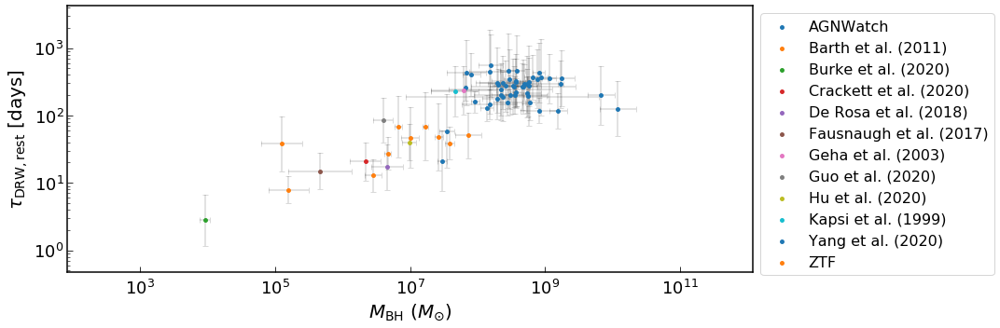

In [10]:
import linmix.linmix as linmix
from matplotlib import cm
from matplotlib.colors import LogNorm

fig,ax = plt.subplots(1,1, figsize=(15,5), sharey=True)
ax.set_xscale('log')
ax.set_yscale('log')

log_M = df_csv.log_M_BH.to_numpy()
log_M_e = df_csv.log_M_BH_e.to_numpy()
tau = df_csv.tau_rest.to_numpy()
log_tau = np.log10(tau)
tau_e = np.array([df_csv.tau_e_rest_lo.to_numpy(), df_csv.tau_e_rest_hi.to_numpy()])
log_L = df_csv.log_L5100.to_numpy()
log_L_e = df_csv.log_L5100_e.to_numpy()

log_tau_e = 0.434*np.mean(tau_e, axis=0)/tau
tau_e_hi = 10**(log_tau + log_tau_e) - 10**log_tau
tau_e_lo = 10**log_tau - 10**(log_tau - log_tau_e)
tau_e = np.array([tau_e_lo, tau_e_hi])
# Take the log, symmeterize them, then 10**

rm = df_csv.RM.to_numpy()
M_e_hi = 10**(log_M + log_M_e) - 10**log_M
M_e_lo = 10**log_M - 10**(log_M - log_M_e)
M_e = np.array([M_e_lo, M_e_hi])

# Scale mass
log_M_scaled = np.log10(10**(log_M)/1e7)
#log_M_e_scaled = np.log10(10**(log_M_e)/1e7)

for ref in np.unique(df_csv.LC_ref):

    # Points
    ax.scatter(10**log_M[ref==df_csv.LC_ref], tau[ref==df_csv.LC_ref],
               label=ref, 
               marker='o', s=15, zorder=3)

# Error bars
m,c,b = ax.errorbar(10**log_M, tau, 
                    xerr=M_e, yerr=tau_e, 
                    linestyle='', fmt='', fillstyle='none', ms=5,
                    ecolor='k', capsize=3, zorder=-1)

[i.set_alpha(0.15) for i in b]
[i.set_alpha(0.15) for i in c]

ax.tick_params('both',labelsize=18)
ax.set_xlabel(r'$M_{\rm{BH}}\ (M_{\odot})$',fontsize=20)
ax.set_ylabel(r'$\tau_{\rm{DRW, rest}}$ [days]',fontsize=20)

ax.minorticks_on()
ax.tick_params(axis='both', which='both', direction='in')
ax.tick_params(axis='both', which='major', length=6)
ax.tick_params(axis='both', which='minor', length=3)

ax.axis('equal')
ax.set_xlim([10**(3.5), 10**(10.5)])
ax.set_ylim([10**(0), 10**(3.3)])

ax.tick_params(axis='x', which='major', pad=7)

ax.legend(fontsize=16, bbox_to_anchor=(1, 1))
fig.tight_layout()

In [219]:
hdul = fits.open("data/lightcurves_qian/2473677_all_filter.fits")
data_qian = hdul[1].data
dbid = data_qian['DBID'][0]

In [223]:
len(glob.glob("data/lightcurves_qian/*.fits"))

192

m = 0.44 ± 0.024
b = 2.3 ± 0.024
sigma [dex] = 0.35 ± 0.015


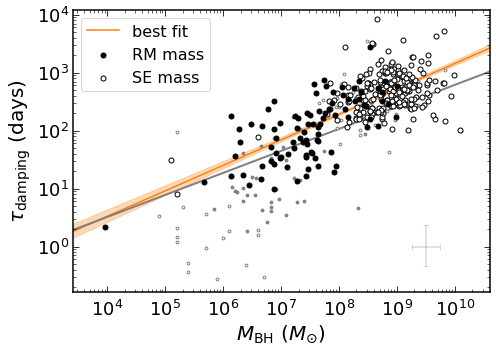

In [85]:
fig,ax = plt.subplots(1,1, figsize=(7,5))
ax.set_xscale('log')
ax.set_yscale('log')

# TODO: Try with MLE and FULL ERRORS

# Should take out duplicates from this plot?
mask_nolen = (df_mle['tau_obs'] > 1*df_mle['cadence']) & (df_mle['ACF_good']) & ~df_mle['log_M_BH'].isna() & (df_mle['SNR']>1)

# Everything
log_M = df_mle.log_M_BH.to_numpy()
tau = df_mle.tau_rest_mle.to_numpy() # Should be MLE
log_tau = np.log10(tau)
rm = df_mle.RM.to_numpy()

# No length requirement
log_M_nolen = df_mle.log_M_BH.to_numpy()[mask_nolen]
log_M_nolen_scaled = np.log10(10**df_mle.log_M_BH.to_numpy()[mask_nolen]/1e8)
log_M_e_nolen = df_mle.log_M_BH_e.to_numpy()[mask_nolen]

tau_nolen = df_mle.tau_rest_mle.to_numpy()[mask_nolen]
log_tau_nolen = np.log10(tau_nolen)
rm_nolen = df_mle.RM.to_numpy()[mask_nolen]
tau_e_nolen = np.array([df_mle.tau_e_rest_lo.to_numpy()[mask_nolen], df_mle.tau_e_rest_hi.to_numpy()[mask_nolen]])
log_tau_e_nolen = 0.434*np.mean(tau_e_nolen, axis=0)/tau_nolen


log_tau_ref = 0.0
tau_ref = 10**log_tau_ref
log_M_ref = 9.5
tau_csv = df_csv.tau_rest_mle.to_numpy()
log_M_e_mean = np.nanmean(df_mle.log_M_BH_e.to_numpy())

# Typical error bar on tau
taus_temp = df_csv.tau_rest.to_numpy()
log_taus_temp = np.log10(taus_temp)
tau_e = np.array([df_csv.tau_e_rest_lo.to_numpy(), df_csv.tau_e_rest_hi.to_numpy()])
#log_tau_e = 0.434*np.mean(tau_e, axis=0)/taus_temp
log_tau_e = 0.434*np.mean(tau_e, axis=0)/taus_temp

tau_e_hi = 10**(log_tau_ref + log_tau_e) - 10**log_tau_ref
tau_e_lo = 10**log_tau_ref - 10**(log_tau_ref - log_tau_e)
tau_e = np.array([[np.nanmean(tau_e_lo), np.nanmean(tau_e_hi)]]).T
tau_e_mean_nolen = tau_e
log_tau_e_mean_nolen = np.mean(0.434*np.mean(tau_e, axis=0)/taus_temp)
log_tau_e_mean_nolen = np.full(np.shape(log_tau_nolen), log_tau_e_mean_nolen)

# asym

M_e_hi = 10**(log_M_ref + log_M_e_mean) - 10**log_M_ref
M_e_lo = 10**log_M_ref - 10**(log_M_ref - log_M_e_mean)
M_e_mean = np.array([[M_e_lo], [M_e_hi]])

# Points
ax.scatter(10**log_M[rm==True], tau[rm==True],
           marker='o', s=8, zorder=-1, color='grey')
ax.scatter(10**log_M[rm==False], tau[rm==False],
           marker='o', s=8, color='w', edgecolor='grey', zorder=-2)

ax.scatter(10**log_M_nolen[rm_nolen==True], tau_nolen[rm_nolen==True],
           label='RM mass', marker='o', s=25, zorder=-1, color='k')
ax.scatter(10**log_M_nolen[rm_nolen==False], tau_nolen[rm_nolen==False],
           label='SE mass', marker='o', s=25, color='w', edgecolor='k', zorder=-2)

# Error bars
m,c,b = ax.errorbar(10**log_M_ref, 10**log_tau_ref, 
                    xerr=M_e_mean, yerr=tau_e,
                    linestyle='', fmt='', fillstyle='none', ms=5,
                    ecolor='k', capsize=3, zorder=-3)
[i.set_alpha(0.15) for i in b]
[i.set_alpha(0.15) for i in c]

samples = fit_line_linmix(log_M_nolen_scaled, log_tau_nolen, log_M_e_nolen, log_tau_e_mean_nolen, nchains=8, seed=50)
x_eval = np.linspace(3,13,50) - 8
draws_credint = draws_CI_linmix(x_eval, samples)

# Plot
ax.fill_between(10**x_eval*1e8, 10**draws_credint[:, 2], 10**draws_credint[:, 0],
                color="#ff7f0e", alpha=0.3, zorder=-5)
ax.plot(10**x_eval*1e8, 10**draws_credint[:, 1], color="#ff7f0e", label='best fit', zorder=-4)

ax.tick_params('both',labelsize=18)
ax.set_xlabel(r'$M_{\rm{BH}}\ (M_{\odot})$',fontsize=20)
ax.set_ylabel(r'$\tau_{\rm{damping}}$ (days)',fontsize=20)

ax.minorticks_on()
ax.tick_params(axis='both', which='both', direction='in')
ax.tick_params(axis='both', which='major', length=6)
ax.tick_params(axis='both', which='minor', length=3)

x_eval = np.linspace(3,12,50)
y_tau = 107*(10**x_eval/1e8)**0.38
ax.plot(10**x_eval, y_tau, color="grey",
        linestyle='solid', zorder=-4, lw=2)

ax.axis('equal')
ax.set_xlim([10**(3.5), 10**(10.5)])
ax.set_ylim([10**(0), 10**(3.3)])

ax.tick_params(axis='x', which='major', pad=7)

ax.xaxis.set_ticks_position('both')
ax.yaxis.set_ticks_position('both')
import matplotlib.ticker as ticker
ax.tick_params(axis='x', which='major', pad=7)
ax.xaxis.set_major_locator(ticker.LogLocator(base=10.0, numticks=12))
ax.xaxis.set_minor_locator(ticker.LogLocator(base=10.0, subs=(0.1,0.2,0.3,0.4,0.5,0.6,0.7,0.8,0.9), numticks=12))
ax.xaxis.set_minor_formatter(ticker.NullFormatter())

ax.legend(fontsize=16, loc=2, frameon=True) # handletextpad=0.0, handlelength=1.0, 
fig.tight_layout()
fig.savefig('figures/taudrwvsmass_all.pdf', dpi=300)

### $\tau_{\rm{br}} - M_{\rm{BH}}$ Relation

m = 0.27 ± 0.068
b = 1.7 ± 0.088
sigma [dex] = 0.36 ± 0.068


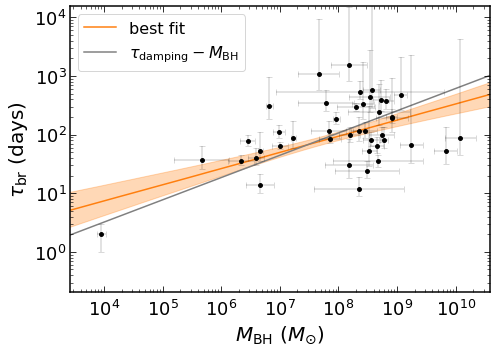

In [25]:
import linmix.linmix as linmix
from matplotlib import cm
from matplotlib.colors import LogNorm

fig,ax = plt.subplots(1,1, figsize=(7,5), sharey=True)
ax.set_xscale('log')
ax.set_yscale('log')

log_M = df_csv.log_M_BH.to_numpy()
log_M_e = df_csv.log_M_BH_e.to_numpy()
tau = df_csv.tau_br.to_numpy()
tau_lo = df_csv.tau_br_lo.to_numpy()
tau_hi = df_csv.tau_br_hi.to_numpy()
log_L = df_csv.log_L5100.to_numpy()
log_L_e = df_csv.log_L5100_e.to_numpy()

log_tau = np.log10(tau)
tau_e_hi = tau_hi - tau
tau_e_lo = tau - tau_lo
# throw tese out
mask_good = np.isfinite(tau_e_hi) & (tau_e_lo < tau)

#tau_e_lo[tau_e_lo>=tau] = tau[tau_e_lo>=tau]*.999

# cap error

tau_e = np.array([tau_e_lo, tau_e_hi])
log_tau_e = 0.434*np.mean(tau_e, axis=0)/tau

# Take the log, symmeterize them, then 10**

rm = df_csv.RM.to_numpy()
M_e_hi = 10**(log_M + log_M_e) - 10**log_M
M_e_lo = 10**log_M - 10**(log_M - log_M_e)
M_e = np.array([M_e_lo, M_e_hi])

# Scale mass
log_M_scaled = np.log10(10**(log_M)/1e7)

# Get colors
vals = np.array([9.26*10**xi/(1.26e38*10**log_M[i]) for i, xi in enumerate(log_L)])

cmap = cm.YlGnBu
colors = cmap(vals)
norm = LogNorm(vmin=vals.min(), vmax=vals.max())

# Points
ax.scatter(10**log_M[mask_good], tau[mask_good],
           color='k',
           marker='o', s=15, zorder=3)

# Error bars
m,c,b = ax.errorbar(10**log_M[mask_good], tau[mask_good], 
                    xerr=M_e[:,mask_good], yerr=tau_e[:,mask_good], 
                    linestyle='', fmt='', fillstyle='none', ms=5,
                    ecolor='k', capsize=3, zorder=-1)

[i.set_alpha(0.15) for i in b]
[i.set_alpha(0.15) for i in c]


samples = fit_line_linmix(log_M_scaled[mask_good], log_tau[mask_good], log_M_e[mask_good], log_tau_e[mask_good], nchains=8, seed=50)
x_eval = np.linspace(3,12,50) - 7
draws_credint = draws_CI_linmix(x_eval, samples)

# Plot
ax.fill_between(10**x_eval*1e7, 10**draws_credint[:, 2], 10**draws_credint[:, 0],
                color="#ff7f0e", alpha=0.3, zorder=-5)
ax.plot(10**x_eval*1e7, 10**draws_credint[:, 1], color="#ff7f0e", label='best fit', zorder=-4)

x_eval = np.linspace(3,12,50)
y_tau = 44.3*(10**x_eval/1e7)**0.38
ax.plot(10**x_eval, y_tau, color="grey",
        linestyle='solid',label=r'$\tau_{\rm{damping}}-M_{\rm{BH}}$', zorder=-4)

ax.tick_params('both',labelsize=18)
ax.set_xlabel(r'$M_{\rm{BH}}\ (M_{\odot})$',fontsize=20)
ax.set_ylabel(r'$\tau_{\rm{br}}$ (days)',fontsize=20)

ax.minorticks_on()
ax.tick_params(axis='both', which='both', direction='in')
ax.tick_params(axis='both', which='major', length=6)
ax.tick_params(axis='both', which='minor', length=3)

ax.axis('equal')
ax.set_xlim([10**(3.5), 10**(10.5)])
ax.set_ylim([10**(0.0), 10**(3.5)])

ax.tick_params(axis='x', which='major', pad=7)

ax.xaxis.set_ticks_position('both')
ax.yaxis.set_ticks_position('both')
import matplotlib.ticker as ticker
ax.tick_params(axis='x', which='major', pad=7)
ax.xaxis.set_major_locator(ticker.LogLocator(base=10.0, numticks=12))
ax.xaxis.set_minor_locator(ticker.LogLocator(base=10.0, subs=(0.1,0.2,0.3,0.4,0.5,0.6,0.7,0.8,0.9), numticks=12))
ax.xaxis.set_minor_formatter(ticker.NullFormatter())

ax.legend(fontsize=16, loc=2)
fig.tight_layout()
fig.savefig('figures/taubrvsmass.pdf', dpi=300)

In [61]:
df_csv.columns

Index(['name', 'ra', 'dec', 'z', 'log_M_BH', 'log_M_BH_e', 'log_L5100',
       'log_L5100_e', 'band', 'unit', 'x', 'y', 'yerr', 'RM', 'LC_ref',
       'L_ref', 'M_BH_ref', 'baseline', 'cadence', 'tau_rest', 'tau_obs',
       'tau_e_rest_sym', 'tau_e_rest_hi', 'tau_e_rest_lo', 'sigma_drw',
       'sigma_drw_e_sym', 'SNR', 'ACF_good', 'length_good', 'cadence_good',
       'tau_br', 'tau_br_lo', 'tau_br_hi', 'valid'],
      dtype='object')

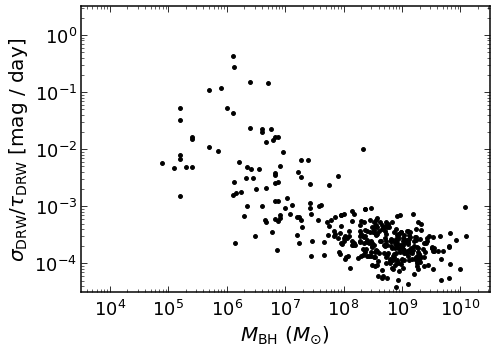

In [105]:
fig,ax = plt.subplots(1,1, figsize=(7,5), sharey=True)
ax.set_xscale('log')
ax.set_yscale('log')

log_M = df_mle.log_M_BH.to_numpy()
log_M_e = df_mle.log_M_BH_e.to_numpy()
sigma = df_mle.sigma_drw.to_numpy()/df_mle.tau_rest.to_numpy()

M_e_hi = 10**(log_M + log_M_e) - 10**log_M
M_e_lo = 10**log_M - 10**(log_M - log_M_e)
M_e = np.array([M_e_lo, M_e_hi])

mask_good = df_mle.unit=='mag'

# Points
ax.scatter(10**log_M[mask_good], sigma[mask_good],
           color='k',
           marker='o', s=15, zorder=3)

"""
log_M = df_csv.log_M_BH.to_numpy()
log_M_e = df_csv.log_M_BH_e.to_numpy()
sigma = df_csv.sigma_drw.to_numpy()

M_e_hi = 10**(log_M + log_M_e) - 10**log_M
M_e_lo = 10**log_M - 10**(log_M - log_M_e)
M_e = np.array([M_e_lo, M_e_hi])

mask_good = df_csv.unit=='mag'

ax.scatter(10**log_M[mask_good], sigma[mask_good],
           color='k',
           marker='o', s=15, zorder=3)
"""
# Error bars
#m,c,b = ax.errorbar(10**log_M[mask_good], sigma[mask_good], 
#                    xerr=M_e[:,mask_good], yerr=tau_e[:,mask_good], 
#                    linestyle='', fmt='', fillstyle='none', ms=5,
#                    ecolor='k', capsize=3, zorder=-1)

[i.set_alpha(0.15) for i in b]
[i.set_alpha(0.15) for i in c]


#samples = fit_line_linmix(log_M_scaled[mask_good], log_tau[mask_good], log_M_e[mask_good], log_tau_e[mask_good], nchains=8, seed=50)
#x_eval = np.linspace(3,12,50) - 7
#draws_credint = draws_CI_linmix(x_eval, samples)

# Plot
#ax.fill_between(10**x_eval*1e7, 10**draws_credint[:, 2], 10**draws_credint[:, 0],
#                color="#ff7f0e", alpha=0.3, zorder=-5)
#ax.plot(10**x_eval*1e7, 10**draws_credint[:, 1], color="#ff7f0e", label='best fit', zorder=-4)

ax.tick_params('both',labelsize=18)
ax.set_xlabel(r'$M_{\rm{BH}}\ (M_{\odot})$',fontsize=20)
ax.set_ylabel(r'$\sigma_{\rm{DRW}} / \tau_{\rm{DRW}}$ [mag / day]',fontsize=20)

ax.minorticks_on()
ax.tick_params(axis='both', which='both', direction='in')
ax.tick_params(axis='both', which='major', length=6)
ax.tick_params(axis='both', which='minor', length=3)

#ax.axis('equal')
ax.set_xlim([10**(3.5), 10**(10.5)])
ax.set_ylim([10**(-4.5), 10**(0.5)])

ax.tick_params(axis='x', which='major', pad=7)

ax.xaxis.set_ticks_position('both')
ax.yaxis.set_ticks_position('both')
import matplotlib.ticker as ticker
ax.tick_params(axis='x', which='major', pad=7)
ax.xaxis.set_major_locator(ticker.LogLocator(base=10.0, numticks=12))
ax.xaxis.set_minor_locator(ticker.LogLocator(base=10.0, subs=(0.1,0.2,0.3,0.4,0.5,0.6,0.7,0.8,0.9), numticks=12))
ax.xaxis.set_minor_formatter(ticker.NullFormatter())

#ax.legend(fontsize=16, loc=2)
fig.tight_layout()
fig.savefig('figures/sigmarvsmass.pdf', dpi=300)

In [89]:
df_mle.columns

Index(['name', 'ra', 'dec', 'z', 'log_M_BH', 'log_M_BH_e', 'log_L5100',
       'log_L5100_e', 'band', 'unit', 'x', 'y', 'yerr', 'RM', 'LC_ref',
       'L_ref', 'M_BH_ref', 'baseline', 'cadence', 'tau_rest', 'tau_obs',
       'tau_e_rest_sym', 'tau_e_rest_hi', 'tau_e_rest_lo', 'sigma_drw',
       'sigma_drw_e_sym', 'SNR', 'ACF_good', 'length_good', 'cadence_good',
       'tau_br', 'tau_br_lo', 'tau_br_hi'],
      dtype='object')

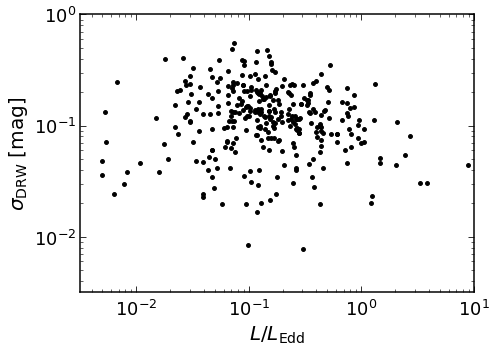

In [100]:
fig,ax = plt.subplots(1,1, figsize=(7,5), sharey=True)
ax.set_xscale('log')
ax.set_yscale('log')

log_M = df_mle.log_M_BH.to_numpy()
log_M_e = df_mle.log_M_BH_e.to_numpy()
sigma = df_mle.sigma_drw.to_numpy()

log_L = df_mle.log_L5100.to_numpy()

M_e_hi = 10**(log_M + log_M_e) - 10**log_M
M_e_lo = 10**log_M - 10**(log_M - log_M_e)
M_e = np.array([M_e_lo, M_e_hi])

mask_good = df_mle.unit=='mag'
mask_L = (log_L > 0) & mask_good


Lratio_plt = np.array([ 9.26 * 10**xi / (1.26e38 * 10**log_M[i])  for i, xi in enumerate(log_L)])

# Points
ax.scatter(Lratio_plt[mask_good], sigma[mask_good],
           color='k',
           marker='o', s=15, zorder=3)

"""
log_M = df_csv.log_M_BH.to_numpy()
log_M_e = df_csv.log_M_BH_e.to_numpy()
sigma = df_csv.sigma_drw.to_numpy()

M_e_hi = 10**(log_M + log_M_e) - 10**log_M
M_e_lo = 10**log_M - 10**(log_M - log_M_e)
M_e = np.array([M_e_lo, M_e_hi])

mask_good = df_csv.unit=='mag'

ax.scatter(10**log_M[mask_good], sigma[mask_good],
           color='k',
           marker='o', s=15, zorder=3)
"""
# Error bars
#m,c,b = ax.errorbar(10**log_M[mask_good], sigma[mask_good], 
#                    xerr=M_e[:,mask_good], yerr=tau_e[:,mask_good], 
#                    linestyle='', fmt='', fillstyle='none', ms=5,
#                    ecolor='k', capsize=3, zorder=-1)

[i.set_alpha(0.15) for i in b]
[i.set_alpha(0.15) for i in c]


#samples = fit_line_linmix(log_M_scaled[mask_good], log_tau[mask_good], log_M_e[mask_good], log_tau_e[mask_good], nchains=8, seed=50)
#x_eval = np.linspace(3,12,50) - 7
#draws_credint = draws_CI_linmix(x_eval, samples)

# Plot
#ax.fill_between(10**x_eval*1e7, 10**draws_credint[:, 2], 10**draws_credint[:, 0],
#                color="#ff7f0e", alpha=0.3, zorder=-5)
#ax.plot(10**x_eval*1e7, 10**draws_credint[:, 1], color="#ff7f0e", label='best fit', zorder=-4)

ax.tick_params('both',labelsize=18)
ax.set_xlabel(r'$L/L_{\rm{Edd}}$',fontsize=20)
ax.set_ylabel(r'$\sigma_{\rm{DRW}}$ [mag]',fontsize=20)

ax.minorticks_on()
ax.tick_params(axis='both', which='both', direction='in')
ax.tick_params(axis='both', which='major', length=6)
ax.tick_params(axis='both', which='minor', length=3)

#ax.axis('equal')
ax.set_xlim([10**(-2.5), 10**(1)])
ax.set_ylim([10**(-2.5), 10**(0.0)])

ax.tick_params(axis='x', which='major', pad=7)

ax.xaxis.set_ticks_position('both')
ax.yaxis.set_ticks_position('both')
import matplotlib.ticker as ticker
ax.tick_params(axis='x', which='major', pad=7)
ax.xaxis.set_major_locator(ticker.LogLocator(base=10.0, numticks=12))
ax.xaxis.set_minor_locator(ticker.LogLocator(base=10.0, subs=(0.1,0.2,0.3,0.4,0.5,0.6,0.7,0.8,0.9), numticks=12))
ax.xaxis.set_minor_formatter(ticker.NullFormatter())

#ax.legend(fontsize=16, loc=2)
fig.tight_layout()
fig.savefig('figures/sigmarvsmass.pdf', dpi=300)

### $\tau_{\rm{DRW}} - M_{\rm{BH}}$ Relation

In [38]:
hdul = fits.open('/data/des80.a/data/cburke/nsa_v0_1_2.fits')
data = hdul[1].data

In [1165]:
#import matplotlib
#matplotlib.font_manager._rebuild()

r= (0.7788767342651781, 1.362964503360085e-14)
m = 0.38 ± 0.048
b = 2.0 ± 0.05
sigma [dex] = 0.094 ± 0.048


<ipython-input-47-885c7c80d76f>:114: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  fig.tight_layout()


tau = 105.61^{+10.96}_{-12.98} (M/1e8Msun)^{ 0.38^{+0.05}_{-0.05} }


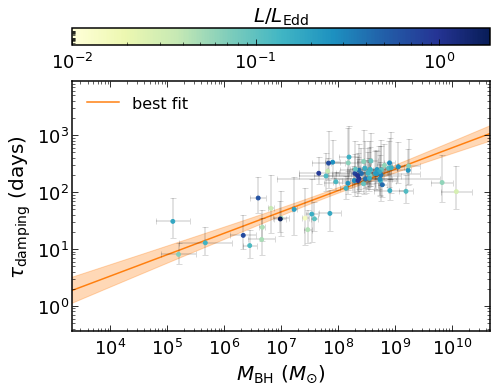

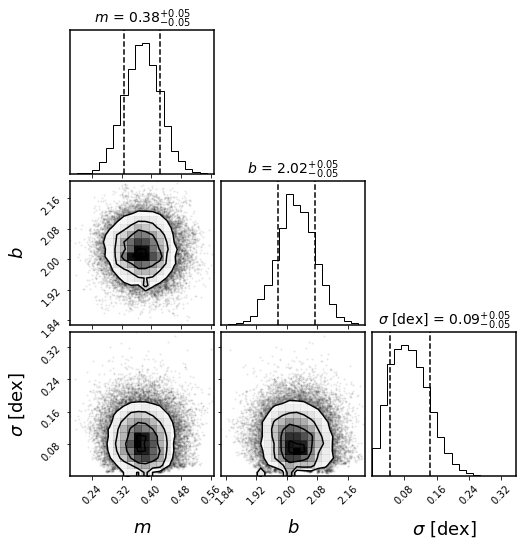

In [47]:
import linmix.linmix as linmix
from matplotlib import cm
from matplotlib.colors import LogNorm
from labellines import labelLine, labelLines

# Use Peterson result
#df_csv.log_M_BH[df_csv.LC_ref=='Burke et al. (2020)'] = np.log10(3.6e5)
#df_csv.log_M_BH_e[df_csv.LC_ref=='Burke et al. (2020)'] = 0.434*1.1e5/3.6e5

# remove NGC 4395 entirely
df_csv = df_csv[df_csv.LC_ref != 'Burke et al. (2020)']

mask_base = df_csv.baseline > 10*df_csv.tau_rest*(1+df_csv.z)

fig,ax = plt.subplots(1,1, figsize=(7,4.5), sharey=True)
ax.set_xscale('log')
ax.set_yscale('log')

log_M = df_csv.log_M_BH.to_numpy()
log_M_e = df_csv.log_M_BH_e.to_numpy()
tau = df_csv.tau_rest_mle.to_numpy()
tau_e = np.array([df_csv.tau_e_rest_lo.to_numpy(), df_csv.tau_e_rest_hi.to_numpy()])
log_L = df_csv.log_L5100.to_numpy()
log_L_e = df_csv.log_L5100_e.to_numpy()

log_tau = np.log10(tau)
log_tau_e = 0.434*np.mean(tau_e, axis=0)/tau
tau_e_hi = 10**(log_tau + log_tau_e) - 10**log_tau
tau_e_lo = 10**log_tau - 10**(log_tau - log_tau_e)
tau_e = np.array([tau_e_lo, tau_e_hi])

tau_e_asym = np.array([df_csv.tau_e_rest_lo.to_numpy(), df_csv.tau_e_rest_hi.to_numpy()])

# Take the log, symmeterize them, then 10**

rm = df_csv.RM.to_numpy()
M_e_hi = 10**(log_M + log_M_e) - 10**log_M
M_e_lo = 10**log_M - 10**(log_M - log_M_e)
M_e = np.array([M_e_lo, M_e_hi])

# Scale mass
M_scaled = 10**log_M / 1e8
log_M_scaled = np.log10(M_scaled)
M_e_hi_scaled = 10**(log_M + log_M_e) / 1e8 - 10**log_M_e / 1e8
M_e_lo_scaled = 10**log_M / 1e8 - 10**(log_M - log_M_e) / 1e8
M_e_scaled = np.array([M_e_lo_scaled, M_e_hi_scaled])

# Get colors
vals = np.array([9.26*10**xi/(1.26e38*10**log_M[i]) for i, xi in enumerate(log_L)])

cmap = cm.YlGnBu
colors = cmap(vals)
norm = LogNorm(vmin=vals.min(), vmax=vals.max())

# Points
sc = ax.scatter(10**log_M, tau,
           c=vals, cmap=cm.YlGnBu,
           norm=LogNorm(vmin=1e-2, vmax=vals.max()),
           marker='o', s=15, zorder=3)

# Error bars
m,c,b = ax.errorbar(10**log_M, tau, 
                    xerr=M_e, yerr=tau_e_asym, 
                    linestyle='', fmt='', fillstyle='none', ms=5,
                    ecolor='k', capsize=3, zorder=-1)

[i.set_alpha(0.15) for i in b]
[i.set_alpha(0.15) for i in c]

from scipy.stats import pearsonr
print('r=', pearsonr(log_M_scaled, log_tau))

samples = fit_line_linmix(log_M_scaled, log_tau, log_M_e, log_tau_e, nchains=16, seed=100)
x_eval = np.linspace(3,12,50) - 8
draws_credint = draws_CI_linmix(x_eval, samples)


# Plot
ax.fill_between(10**x_eval*1e8, 10**draws_credint[:, 2], 10**draws_credint[:, 0],
                color="#ff7f0e", alpha=0.3, zorder=-5)
ax.plot(10**x_eval*1e8, 10**draws_credint[:, 1], color="#ff7f0e", label='best fit', zorder=-4)

ax.tick_params('both',labelsize=18)
ax.set_xlabel(r'$M_{\rm{BH}}\ (M_{\odot})$',fontsize=20)
ax.set_ylabel(r'$\tau_{\rm{damping}}$ (days)',fontsize=20)

ax.minorticks_on()
ax.tick_params(axis='both', which='both', direction='in')
ax.tick_params(axis='both', which='major', length=6)
ax.tick_params(axis='both', which='minor', length=3)

ax.axis('equal')
ax.set_xlim([10**(3.5), 10**(10.5)])
ax.set_ylim([10**(0.0), 10**(3.5)])

cax = fig.add_axes([0.15, 1.08, 0.83, 0.05])
cbar = fig.colorbar(sc, cax=cax, orientation="horizontal")
cax.set_title(r'$L/L_{\rm{Edd}}$', fontsize=20)
cax.minorticks_on()
cax.tick_params(axis='both', which='both', direction='in',labelsize=18)
cax.tick_params(axis='both', which='major', length=6)
cax.tick_params(axis='both', which='minor', length=3)
cax.tick_params(axis='x', which='major', pad=7)
cax.tick_params('y', labelsize=18)
ax.xaxis.set_ticks_position('both')
ax.yaxis.set_ticks_position('both')

import matplotlib.ticker as ticker
ax.tick_params(axis='x', which='major', pad=7)
ax.xaxis.set_major_locator(ticker.LogLocator(base=10.0, numticks=12))
ax.xaxis.set_minor_locator(ticker.LogLocator(base=10.0, subs=(0.1,0.2,0.3,0.4,0.5,0.6,0.7,0.8,0.9), numticks=12))
ax.xaxis.set_minor_formatter(ticker.NullFormatter())
ax.legend(fontsize=16, loc=2, frameon=False)
fig.tight_layout()
fig.savefig('figures/tauvsmass.pdf', dpi=300, bbox_inches='tight')

# Double check fitting with HBL
#samples_hbl = fit_line_HBL(log_M_scaled, log_tau, log_M_e, log_tau_e)
#fig = corner.corner(samples_hbl,
#             labels=["$m$", "$b$", "$\ln\ \sigma$"], quantiles=[0.16,0.84], show_titles=True,
#             label_kwargs=dict(fontsize=18), title_kwargs=dict(fontsize=14));

fig = corner.corner(np.array([samples['beta'], samples['alpha'], np.sqrt(samples['sigsqr'])]).T,
             labels=["$m$", "$b$", "$\sigma$ [dex]"], quantiles=[0.16,0.84], show_titles=True,
             label_kwargs=dict(fontsize=18), title_kwargs=dict(fontsize=14));

# PRINT FITTING 
print('tau = %0.2f^{+%0.2f}_{%0.2f} (M/1e8Msun)^{ %0.2f^{+%0.2f}_{%0.2f} }' %
      (np.median(10**samples['alpha']),
       np.median(10**samples['alpha']) - np.percentile(10**samples['alpha'], 16),
       np.median(10**samples['alpha']) - np.percentile(10**samples['alpha'], 84),
       np.median(samples['beta']),
       np.median(samples['beta']) - np.percentile(samples['beta'], 16),
       np.median(samples['beta']) - np.percentile(samples['beta'], 84) ) )


<ipython-input-13-a939bdf3c3d7>:21: RuntimeWarning: overflow encountered in power
  tau_e_hi = 10**(log_tau + log_tau_e) - 10**log_tau


m = 0.68 ± 0.14
b = 1.9 ± 0.16
sigma [dex] = 0.22 ± 0.12


(1.0, 3162.2776601683795)

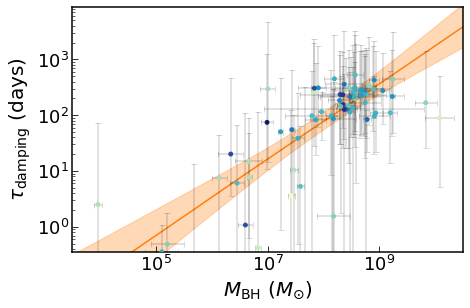

In [13]:
import linmix.linmix as linmix
from matplotlib import cm
from matplotlib.colors import LogNorm
from labellines import labelLine, labelLines

df_carma = pd.read_pickle('df_carma.pkl')

fig,ax = plt.subplots(1,1, figsize=(7,4.5), sharey=True)
ax.set_xscale('log')
ax.set_yscale('log')

log_M = df_carma.log_M_BH.to_numpy()
log_M_e = df_carma.log_M_BH_e.to_numpy()
tau = df_carma.tau_rest.to_numpy()
tau_e = np.array([df_carma.tau_e_rest_lo.to_numpy(), df_carma.tau_e_rest_hi.to_numpy()])
log_L = df_carma.log_L5100.to_numpy()
log_L_e = df_carma.log_L5100_e.to_numpy()

log_tau = np.log10(tau)
log_tau_e = 0.434*np.mean(tau_e, axis=0)/tau
tau_e_hi = 10**(log_tau + log_tau_e) - 10**log_tau
tau_e_lo = 10**log_tau - 10**(log_tau - log_tau_e)
tau_e = np.array([tau_e_lo, tau_e_hi])

tau_e_asym = np.array([df_carma.tau_e_rest_lo.to_numpy(), df_carma.tau_e_rest_hi.to_numpy()])

# Take the log, symmeterize them, then 10**

rm = df_carma.RM.to_numpy()
M_e_hi = 10**(log_M + log_M_e) - 10**log_M
M_e_lo = 10**log_M - 10**(log_M - log_M_e)
M_e = np.array([M_e_lo, M_e_hi])

# Scale mass
M_scaled = 10**log_M / 1e8
log_M_scaled = np.log10(M_scaled)
M_e_hi_scaled = 10**(log_M + log_M_e) / 1e8 - 10**log_M_e / 1e8
M_e_lo_scaled = 10**log_M / 1e8 - 10**(log_M - log_M_e) / 1e8
M_e_scaled = np.array([M_e_lo_scaled, M_e_hi_scaled])

# Get colors
vals = np.array([9.26*10**xi/(1.26e38*10**log_M[i]) for i, xi in enumerate(log_L)])

cmap = cm.YlGnBu
colors = cmap(vals)
norm = LogNorm(vmin=vals.min(), vmax=vals.max())

# Points
sc = ax.scatter(10**log_M, tau,
           c=vals, cmap=cm.YlGnBu,
           norm=LogNorm(vmin=1e-2, vmax=vals.max()),
           marker='o', s=15, zorder=3)

# Error bars
m,c,b = ax.errorbar(10**log_M, tau, 
                    xerr=M_e, yerr=tau_e_asym, 
                    linestyle='', fmt='', fillstyle='none', ms=5,
                    ecolor='k', capsize=3, zorder=-1)

[i.set_alpha(0.15) for i in b]
[i.set_alpha(0.15) for i in c]

samples = fit_line_linmix(log_M_scaled, log_tau, log_M_e, log_tau_e, nchains=16, seed=100)
x_eval = np.linspace(3,12,50) - 8
draws_credint = draws_CI_linmix(x_eval, samples)


# Plot
ax.fill_between(10**x_eval*1e8, 10**draws_credint[:, 2], 10**draws_credint[:, 0],
                color="#ff7f0e", alpha=0.3, zorder=-5)
ax.plot(10**x_eval*1e8, 10**draws_credint[:, 1], color="#ff7f0e", label='best fit', zorder=-4)

ax.tick_params('both',labelsize=18)
ax.set_xlabel(r'$M_{\rm{BH}}\ (M_{\odot})$',fontsize=20)
ax.set_ylabel(r'$\tau_{\rm{damping}}$ (days)',fontsize=20)

ax.minorticks_on()
ax.tick_params(axis='both', which='both', direction='in')
ax.tick_params(axis='both', which='major', length=6)
ax.tick_params(axis='both', which='minor', length=3)

ax.axis('equal')
ax.set_xlim([10**(3.5), 10**(10.5)])
ax.set_ylim([10**(0.0), 10**(3.5)])

(0.0, 3.5)

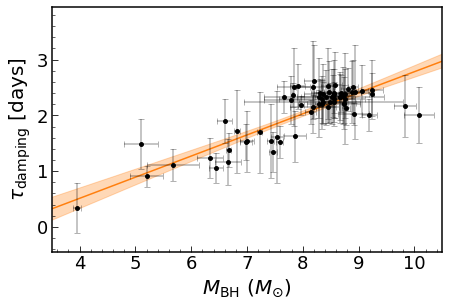

In [30]:
fig,ax = plt.subplots(1,1, figsize=(7,4.5), sharey=True)

# Points
sc = ax.scatter(log_M_scaled+8, log_tau,
           c='k',
           marker='o', s=15, zorder=3)

# Error bars
m,c,b = ax.errorbar(log_M_scaled+8, log_tau, 
                    xerr=log_M_e, yerr=log_tau_e, alpha=0.3,
                    linestyle='', fmt='', fillstyle='none', ms=5,
                    ecolor='k', capsize=3, zorder=-1)

# Plot
ax.fill_between(x_eval + 8, draws_credint[:, 2], draws_credint[:, 0],
                color="#ff7f0e", alpha=0.3, zorder=-5)
ax.plot(x_eval + 8, draws_credint[:, 1], color="#ff7f0e", label='best fit', zorder=-4)

ax.tick_params('both',labelsize=18)
ax.set_xlabel(r'$M_{\rm{BH}}\ (M_{\odot})$',fontsize=20)
ax.set_ylabel(r'$\tau_{\rm{damping}}$ [days]',fontsize=20)

ax.minorticks_on()
ax.tick_params(axis='both', which='both', direction='in')
ax.tick_params(axis='both', which='major', length=6)
ax.tick_params(axis='both', which='minor', length=3)

ax.axis('equal')
ax.set_xlim([(3.5), (10.5)])
ax.set_ylim([(0.0), (3.5)])

In [85]:
Rs = 2*const.G*10**8*u.Msun/const.c**2
t_orb = ((4*np.pi**2)/(const.G*10**8*u.Msun)*(100*Rs)**3 )**(1/2)
t_orb.to(u.day)

<Quantity 101.31194302 d>

In [ ]:
t_orb = ((4*np.pi**2)/(const.G*10**8*u.Msun)*(100*Rs)**3 )**(1/2)
t_orb.to(u.day)

In [131]:
R_WD

<Quantity [0.10036401, 0.09444479, 0.07870059, 0.07184193, 0.08237169,
           0.07870059, 0.09023562, 0.09735942] solRad>

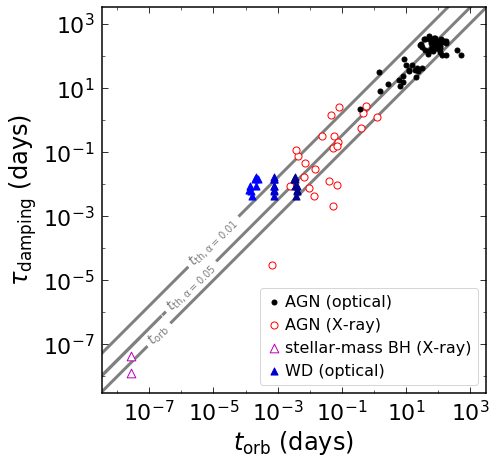

In [33]:
from labellines import labelLine, labelLines

df_scar = pd.read_csv('data/scar.txt', sep='\t', header=None, names=['name','type','log_M','log_R','log_Mdot','log_nu'])
eta = 0.1

# Use microlensing relation to get R for optical AGN and Scargini WD
a = 15.85
b = 0.66

lam_pivot = {'V':5478, 'B':4371, 'R':6504, 'g':4702, 'r':6175, 'TESS': 8500, 'kepler':6000}

Lbol_scar = (10**df_scar.log_Mdot.to_numpy().astype(np.float))*u.Msun/u.yr*eta*const.c**2
Lbol_scar = Lbol_scar.to(u.erg/u.s)
rEdd_scar = Lbol_scar.value/(1.26e38*10**df_scar.log_M.to_numpy().astype(np.float))
bands_scar = ['kepler','kepler','g','g','g','g','g','g']#,'kepler']
#WD radius predicted from microlensing
R_WD_micro = (10**a)*((10**df_scar.log_M.to_numpy().astype(np.float)[(df_scar.type=='WD')])/1e9)**(b)
R_WD_micro = R_WD_micro*u.cm
R_WD_micro = R_WD_micro.to(u.Rsun)
R_WD_scar = 10**df_scar.log_R.to_numpy().astype(np.float)[df_scar.type=='WD']*u.Rsun
#WD radius predicted from alpha-disk model (Eq. 2 of Morgan 2010)
lam_rest = 2500*u.AA
R_WD_alpha = 9.7e15 * (lam_rest/(1*u.um))**(4/3) \
    * (10**df_scar.log_M.to_numpy().astype(np.float)[(df_scar.type=='WD')]*u.Msun/(1e9*u.Msun))**(2/3) \
    * (rEdd_scar[(df_scar.type=='WD')]/eta)**(1/3) * u.cm
R_WD_alpha = R_WD_alpha.to(u.Rsun)

fig,ax = plt.subplots(1,1, figsize=(7,6.55), sharey=True)
ax.set_xscale('log')
ax.set_yscale('log')

log_M = df_csv.log_M_BH.to_numpy()
tau = df_csv.tau_rest_mle.to_numpy()

# Scale by lambda
lam_pivots = np.array([lam_pivot[b] for b in df_csv.band.to_numpy()])
lam_e = lam_pivots/(1 + df_csv.z.to_numpy())
lam_scales = (5000/lam_e)**(0.17) # Scale to 5000

# Optical AGN
R = (10**a)*(10**log_M/1e9)**b
R = R*u.cm
R = R.to(u.Rsun)
t_orb = ((4*np.pi**2)/(const.G*10**log_M*u.Msun)*(R)**3 )**(1/2)
t_orb = t_orb.to(u.day)*lam_scales # Scale to Scarangi 5000
alpha = 0.05
t_th = 1680/100*(alpha/0.01)**(-1)*t_orb

# Scargini
t_orb_scar = ((4*np.pi**2)/(const.G*10**df_scar.log_M.to_numpy().astype(np.float)*u.Msun)*(10**df_scar.log_R.to_numpy().astype(np.float)*u.Rsun)**3 )**(1/2)
t_orb_scar = t_orb_scar.to(u.day)
tau_scar = 1/(10**df_scar.log_nu.to_numpy().astype(np.float)*2*np.pi*u.Hz)
tau_scar = tau_scar.to(u.day) # orbital timescale
mdot_scales = (0.15/rEdd_scar)**(-1.0)
ax.scatter(t_orb, tau, label='AGN (optical)', s=25, color='k', zorder=20)

for t in np.unique(df_scar.type.to_numpy()):
    mask = df_scar.type.to_numpy()==t
    if t =='AGN':
        t = 'AGN (X-ray)'
        ax.scatter(t_orb_scar[mask], tau_scar[mask]*mdot_scales[mask], label=t, s=50, color='r', facecolor='w')
    elif t =='BH':
        t = 'stellar-mass BH (X-ray)'
        ax.scatter(t_orb_scar[mask], tau_scar[mask]*mdot_scales[mask], label=t, s=75, marker='^', color='m', facecolor='w')
    elif t=='YSO':
        continue
    if t == 'WD':
        t = 'WD (optical)'
        alpha = 0.05
        t_orb_scar_WD = ((4*np.pi**2)/(const.G*10**df_scar.log_M.to_numpy().astype(np.float)[mask]*u.Msun)*(R_WD_scar)**3 )**(1/2)
        t_orb_scar_WD = t_orb_scar_WD.to(u.day).value
        ax.scatter(t_orb_scar_WD, tau_scar[mask]*mdot_scales[mask], s=50, c='b', marker='^')
        t_orb_scar_WD = ((4*np.pi**2)/(const.G*10**df_scar.log_M.to_numpy().astype(np.float)[mask]*u.Msun)*(R_WD_micro)**3 )**(1/2)
        t_orb_scar_WD = t_orb_scar_WD.to(u.day).value
        ax.scatter(t_orb_scar_WD, tau_scar[mask]*mdot_scales[mask], s=50, c='darkblue', marker='^')
        t_orb_scar_WD = ((4*np.pi**2)/(const.G*10**df_scar.log_M.to_numpy().astype(np.float)[mask]*u.Msun)*(R_WD_alpha)**3 )**(1/2)
        t_orb_scar_WD = t_orb_scar_WD.to(u.day).value
        ax.scatter(t_orb_scar_WD, tau_scar[mask]*mdot_scales[mask], label=t, s=50, c='mediumblue', marker='^')
        
        
x = np.logspace(-9, 5)
lines1 = []
lines2 = []
lines3 = []
lines1.extend(ax.plot(x*2*np.pi*0.05, x, c='grey', zorder=-7, lw=3, label=r'$t_{\rm{th},\alpha=0.05}$'))
lines2.extend(ax.plot(x*2*np.pi*0.01, x, c='grey', zorder=-6, lw=3, label=r'$t_{\rm{th},\alpha=0.01}$'))
lines3.extend(ax.plot(x, x, c='grey', zorder=-5, lw=3, label=r'$t_{\rm{orb}}$'))

labelLines(lines1, xvals=[2e-6], fontsize=14, drop_label=True, zorder=-6.5)
labelLines(lines2, xvals=[1e-5], fontsize=14, drop_label=True, zorder=-5.5)
labelLines(lines3, xvals=[2e-7], fontsize=14, drop_label=True, zorder=-4.5)

# overplot manually
ax.plot(x[x<1e-6]*2*np.pi*0.05, x[x<1e-6], c='grey', zorder=0, lw=3)

ax.legend(loc=4, fontsize=16, frameon=True, handletextpad=0.2, handlelength=1.0)
ax.axis('equal')
ax.set_xlim(1.1e-8, 0.95e3)
ax.set_ylim(1.1e-8, 0.95e3)

ax.xaxis.set_ticks_position('both')
ax.yaxis.set_ticks_position('both')

ax.tick_params(axis='x', which='major', pad=7)
ax.xaxis.set_major_locator(ticker.LogLocator(base=10.0, numticks=10))
ax.xaxis.set_minor_locator(ticker.LogLocator(base=10.0, numticks=120))
ax.xaxis.set_minor_formatter(ticker.NullFormatter())
ax.tick_params(axis='y', which='major', pad=7)
ax.yaxis.set_major_locator(ticker.LogLocator(base=10.0, numticks=10))
ax.yaxis.set_minor_locator(ticker.LogLocator(base=10.0, numticks=120))
ax.yaxis.set_minor_formatter(ticker.NullFormatter())

ax.tick_params(axis='both', which='both', direction='in')
ax.tick_params(axis='both', which='major', length=6)
ax.tick_params(axis='both', which='minor', length=3)

ax.tick_params('both',labelsize=22)
ax.set_xlabel(r'$t_{\rm{orb}}$ (days)',fontsize=24)
ax.set_ylabel(r'$\tau_{\rm{damping}}$ (days)',fontsize=24)

fig.tight_layout()

fig.savefig('figures/tauorb.pdf', dpi=300)

In [34]:
t = df_scar.type.to_numpy()
log_fbr_scargini = df_scar.log_nu.to_numpy()[t=='WD']
log_mass_scargini = df_scar.log_M.to_numpy()[t=='WD']
log_Mdot_scargini = df_scar.log_Mdot.to_numpy()[t=='WD']
eta = 0.1
Lbol_scargini = (10**log_Mdot_scargini)*u.Msun/u.yr*eta*const.c**2
Lbol_scargini = Lbol_scargini.to(u.erg/u.s)
rEdd_scargini = Lbol_scargini.value/(1.26e38*10**log_mass_scargini)

tau_scargini = 1/(10**log_fbr_scargini*2*np.pi*u.Hz)
tau_scargini = tau_scargini.to(u.day).value # orbital timescale
mass_scargini = 10**log_mass_scargini
bands_scargini = ['kepler','kepler','g','g','g','g','g','g']
# Mdot = Lbol/eta c^2
# eta = 0.1

Mdot_med = np.mean(9.26*10**df_csv.log_L5100.to_numpy()*u.erg/u.s/(eta*const.c**2))
Mdot_med = Mdot_med.to(u.Msun/u.year)

m = 0.38 ± 0.046
b = 1.6 ± 0.065
sigma [dex] = 0.094 ± 0.046


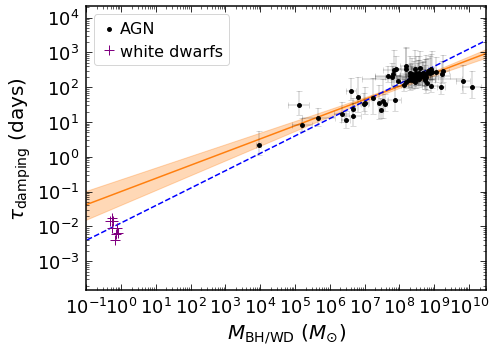

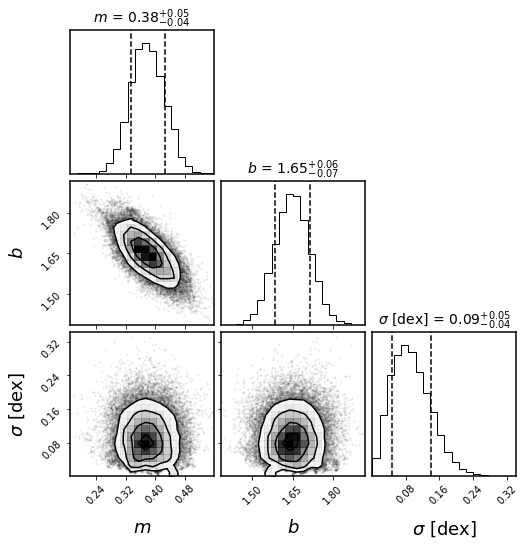

In [36]:
fig,ax = plt.subplots(1,1, figsize=(7,5), sharey=True)
ax.set_xscale('log')
ax.set_yscale('log')

# Change NGC 4395 mass
#df_csv.log_M_BH[df_csv.name=='ngc4395_tess.dat'] = np.log10(3.6e5)
#df_csv.log_M_BH_e[df_csv.name=='ngc4395_tess.dat'] = 0.434*1.1e5/3.6e5

log_M = df_csv.log_M_BH.to_numpy()
log_M_e = df_csv.log_M_BH_e.to_numpy()
tau = df_csv.tau_rest_mle.to_numpy()
tau_e = np.array([df_csv.tau_e_rest_lo.to_numpy(), df_csv.tau_e_rest_hi.to_numpy()])
log_L = df_csv.log_L5100.to_numpy()
log_L_e = df_csv.log_L5100_e.to_numpy()

tau_e_asym = np.array([df_csv.tau_e_rest_lo.to_numpy(), df_csv.tau_e_rest_hi.to_numpy()])

# Scale by lambda
# Get the pivot wavelength of each filter (in AA)
# https://www.astro.ljmu.ac.uk/~ikb/research/mags-fluxes/
lam_pivot = {'V':5478, 'B':4371, 'R':6504, 'g':4702, 'r':6175, 'TESS': 8500, 'kepler':6000}
lam_pivots = np.array([lam_pivot[b] for b in df_csv.band.to_numpy()])
lam_e = lam_pivots/(1+df_csv.z.to_numpy())
lam_scales = (2500/lam_e)**(0.17) # should be lambda ^2

# Scale
rm = df_csv.RM.to_numpy()
M_e_hi = 10**(log_M + log_M_e) - 10**log_M
M_e_lo = 10**log_M - 10**(log_M - log_M_e)
M_e = np.array([M_e_lo, M_e_hi])

# Scale mass
log_M_scaled = np.log10(10**(log_M)/1e7)

# Points
ax.scatter(10**log_M, tau,
           color='k',
           marker='o', s=15, zorder=3, label='AGN')

# Error bars
m,c,b = ax.errorbar(10**log_M, tau, 
                    xerr=M_e, yerr=tau_e_asym, 
                    linestyle='', fmt='', fillstyle='none', ms=5,
                    ecolor='k', capsize=3, zorder=-1)

[i.set_alpha(0.15) for i in b]
[i.set_alpha(0.15) for i in c]

samples = fit_line_linmix(log_M_scaled, log_tau, log_M_e, log_tau_e, nchains=16, seed=50)
x_eval = np.linspace(-2,12,50) - 7
draws_credint = draws_CI_linmix(x_eval, samples)

# Plot
ax.fill_between(10**x_eval*1e7, 10**draws_credint[:, 2], 10**draws_credint[:, 0],
                color="#ff7f0e", alpha=0.3, zorder=-5)
ax.plot(10**x_eval*1e7, 10**draws_credint[:, 1], color="#ff7f0e", zorder=-4)

#ax.scatter(.65, 1/(2*np.pi*86), color="purple", label='MV Lyrae (Scargini 2018)')
#lam_pivots = np.array([lam_pivot[b] for b in bands_scar])
#lam_scales = (2500/5000)**(0.17) # Wein's law 
mdot_scales = (0.15/rEdd_scargini)**(-1.0)
# Scale the timescale to the average L/LEdd of our AGN, which should be L/LEdd~0.15, which is a factor of 3 in timescale from L/LEdd~0.3.

#ax.plot(mass_scargini, tau_scargini*lam_scales*mdot_scales, color="purple", label='white dwarfs', ms=10, mew=1, marker='+', linestyle='none')
ax.plot(mass_scargini, tau_scargini*mdot_scales, color="purple", label='white dwarfs', ms=10, mew=1, marker='+', linestyle='none')

ax.tick_params('both',labelsize=18)
ax.set_xlabel(r'$M_{\rm{BH/WD}}\ (M_{\odot})$',fontsize=20)
ax.set_ylabel(r'$\tau_{\rm{damping}}$ (days)',fontsize=20)

ax.minorticks_on()
ax.tick_params(axis='both', which='both', direction='in')
ax.tick_params(axis='both', which='major', length=6)
ax.tick_params(axis='both', which='minor', length=3)

ax.axis('equal')
ax.set_xlim([10**(-1), 10**(10.5)])
ax.set_ylim([10**(-2), 10**(2.5)])

ax.xaxis.set_ticks_position('both')
ax.yaxis.set_ticks_position('both')

ax.tick_params(axis='x', which='major', pad=7)
ax.xaxis.set_major_locator(ticker.LogLocator(base=10.0, numticks=12))
ax.xaxis.set_minor_locator(ticker.LogLocator(base=10.0, subs=(0.1,0.2,0.3,0.4,0.5,0.6,0.7,0.8,0.9), numticks=12))
ax.xaxis.set_minor_formatter(ticker.NullFormatter())

ax.tick_params(axis='y', which='major', pad=7)
ax.yaxis.set_major_locator(ticker.LogLocator(base=10.0, numticks=12))
ax.yaxis.set_minor_locator(ticker.LogLocator(base=10.0, subs=(0.1,0.2,0.3,0.4,0.5,0.6,0.7,0.8,0.9), numticks=12))
ax.yaxis.set_minor_formatter(ticker.NullFormatter())
handles, labels = ax.get_legend_handles_labels()
order = [1,0] # swap order
leg = ax.legend([handles[idx] for idx in order],[labels[idx] for idx in order], fontsize=16, loc=2, frameon=True, handletextpad=0.2, handlelength=1.0)
y_morg = (10**1.6)*(10**x_eval*1e7/1e7)**0.50
ax.plot(10**x_eval*1e7, y_morg, color="b",
        linestyle='dashed', zorder=-4)

fig.tight_layout()
fig.savefig('figures/wd.pdf', dpi=300)


fig = corner.corner(np.array([samples['beta'], samples['alpha'], np.sqrt(samples['sigsqr'])]).T,
             labels=["$m$", "$b$", "$\sigma$ [dex]"], quantiles=[0.16,0.84], show_titles=True,
             label_kwargs=dict(fontsize=18), title_kwargs=dict(fontsize=14));


### $R_{\rm{2500 A}} - M_{\rm{BH}}$ Relation

m = 0.6 ± 0.05
b = 1.5e+01 ± 0.071
sigma [dex] = 0.077 ± 0.042
r= (0.9624873530276964, 1.5378116501750072e-38)


<ipython-input-22-bf57f02c4dec>:195: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  fig.tight_layout()


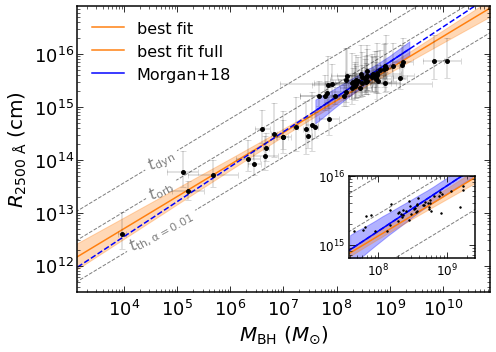

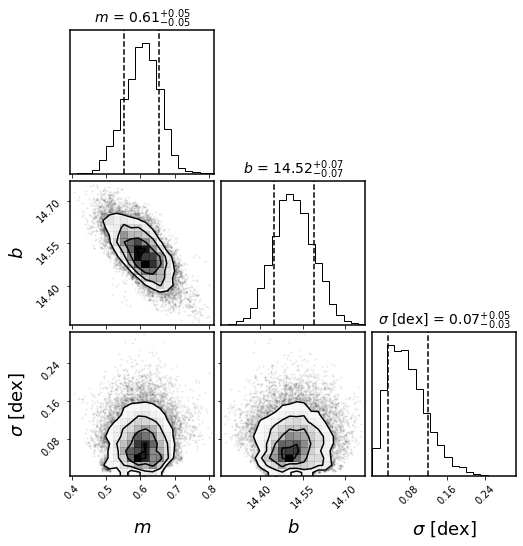

In [22]:
import linmix.linmix as linmix
from matplotlib import cm
from matplotlib.colors import LogNorm
import astropy.constants as const
from labellines import labelLine, labelLines

fig,ax = plt.subplots(1,1, figsize=(7,5), sharey=True)
ax.set_xscale('log')
ax.set_yscale('log')

log_M = df_csv.log_M_BH.to_numpy()
log_M_e = df_csv.log_M_BH_e.to_numpy()
tau = df_csv.tau_rest_mle.to_numpy()
tau_e = np.array([df_csv.tau_e_rest_lo.to_numpy(), df_csv.tau_e_rest_hi.to_numpy()])
log_L = df_csv.log_L5100.to_numpy()
log_L_e = df_csv.log_L5100_e.to_numpy()

M_e_hi = 10**(log_M + log_M_e) - 10**log_M
M_e_lo = 10**log_M - 10**(log_M - log_M_e)
M_e = np.array([M_e_lo, M_e_hi])
# Scale mass
log_M_scaled = np.log10(10**(log_M)/1e7)

tau_e = np.array([df_csv.tau_e_rest_lo.to_numpy(), df_csv.tau_e_rest_hi.to_numpy()])
log_tau = np.log10(tau)
log_tau_e = 0.434*np.mean(tau_e, axis=0)/tau
tau_e_hi = 10**(log_tau + log_tau_e) - 10**log_tau
tau_e_lo = 10**log_tau - 10**(log_tau - log_tau_e)
tau_e = np.array([tau_e_lo, tau_e_hi])

tau_e_asym = np.array([df_csv.tau_e_rest_lo.to_numpy(), df_csv.tau_e_rest_hi.to_numpy()])

# Get the pivot wavelength of each filter (in nm)
lam_pivot = {'V':5478, 'B':4371, 'R':6504, 'g':4702, 'r':6175, 'TESS': 8500, 'kepler':6000}
lam_pivots = np.array([lam_pivot[b] for b in df_csv.band.to_numpy()])
lam_e = lam_pivots/(1+df_csv.z.to_numpy())
lam_scales = (2500/lam_e)**(0.17) # from MacLeod 2010

# Convert timescale to orbital radius using Kepler's law
# User uncertainties to propogate error
tau = (df_csv.tau_rest_mle.to_numpy()*u.day).to(u.s)*lam_scales
alpha = 0.05
tau_s = tau/(1680/100*(alpha/0.01)**(-1)) # Characteristic (orbital) size

# R [tau_damping = tau_th,0.05]
M = ((10**log_M)*u.solMass).to(u.kg)
R = (const.G*M/(4*np.pi**2)*tau_s**2)**(1/3)
Rcm = R.to(u.cm).value
# Re-scale the error
log_Rcm_e = 0.434*np.mean(tau_e*Rcm/df_csv.tau_rest_mle.to_numpy(), axis=0)/Rcm
Rcm_e_lo = df_csv.tau_e_rest_lo.to_numpy()*Rcm/df_csv.tau_rest_mle.to_numpy()
Rcm_e_hi = df_csv.tau_e_rest_hi.to_numpy()*Rcm/df_csv.tau_rest_mle.to_numpy()
Rcm_e = np.array([Rcm_e_lo, Rcm_e_hi])

# Points
ax.scatter(10**log_M, Rcm,
           color='k', 
           marker='o', s=15, zorder=3)

# Error bars
m,c,b = ax.errorbar(10**log_M, Rcm, 
                    xerr=M_e, yerr=Rcm_e, 
                    linestyle='', fmt='', fillstyle='none', ms=5,
                    ecolor='k', capsize=3, zorder=-1)
[i.set_alpha(0.15) for i in b]
[i.set_alpha(0.15) for i in c]

samples = fit_line_linmix(log_M_scaled, np.log10(Rcm), log_M_e, log_Rcm_e, nchains=8, seed=50)
x_eval = np.linspace(3,12,50) - 7
draws_credint = draws_CI_linmix(x_eval, samples)

# Overplot the M
x_eval_morgan = np.linspace(7.60,9.37,20)
x_eval_morgan_all = np.linspace(3,12,50)

def Rcm_morgan(x, nsamp=300):
    a = 15.85 #15.78
    a_e = 0.12 #0.12
    b = 0.66 #0.80
    b_e = 0.15 #0.17

    # Sample:
    draws = np.empty((len(x), nsamp))
    for i in range(nsamp):
        ai = np.random.normal(a, a_e)
        bi = np.random.normal(b, b_e)
        draws[:, i]  = (10**ai)*(x/1e9)**bi

    # Compute credibility interval
    draws_credint = np.empty((len(x), 3))
    draws_credint[:, 0] = np.percentile(draws, 16, axis=1)
    draws_credint[:, 2] = np.percentile(draws, 84, axis=1)
    draws_credint[:, 1] = (10**a)*(x/1e9)**b # Use their relation
    
    return draws_credint


Rcm_morgan_CI = Rcm_morgan(10**x_eval_morgan)
Rcm_morgan_CI_all = Rcm_morgan(10**x_eval_morgan_all, nsamp=1)

# Plot
ax.fill_between(10**x_eval*1e7, 10**draws_credint[:, 2], 10**draws_credint[:, 0],
                color="#ff7f0e", alpha=0.3, zorder=-5)
lines = []
# Best fit (orbital)
ax.plot(10**x_eval*1e7, 10**draws_credint[:, 1], color="#ff7f0e", label='best fit', zorder=-4)

lines.extend(ax.plot(10**x_eval*1e7, 10**draws_credint[:, 1]*20**(2/3), color="grey", zorder=-7, lw=1, linestyle='dashed', label=r'$t_{\rm{dyn}}$'))
lines.extend(ax.plot(10**x_eval*1e7, 10**draws_credint[:, 1]*3**(2/3), color="grey", zorder=-7, lw=1, linestyle='dashed', label=r'$t_{\rm{orb}}$'))
lines.extend(ax.plot(10**x_eval*1e7, 10**draws_credint[:, 1]*5**(-2/3), color="grey", zorder=-7, lw=1, linestyle='dashed', label=r'$t_{\rm{th},\alpha=0.01}$'))


ax.fill_between(10**x_eval_morgan, Rcm_morgan_CI[:, 2], Rcm_morgan_CI[:, 0],
                color="b", alpha=0.3, zorder=-5)
ax.plot(10**x_eval_morgan_all, Rcm_morgan_CI_all[:, 1], color="b",
        linestyle='dashed', zorder=-4)
ax.plot(10**x_eval_morgan, Rcm_morgan_CI[:, 1], color="b",
        linestyle='solid',label='Morgan+18', zorder=-6)

ax.tick_params('both',labelsize=18)
ax.set_xlabel(r'$M_{\rm{BH}}\ (M_{\odot})$',fontsize=20)
ax.set_ylabel(r'$R_{\rm{2500}\ \AA}$ (cm)',fontsize=20)

ax.minorticks_on()
ax.tick_params(axis='both', which='both', direction='in')
ax.tick_params(axis='both', which='major', length=6)
ax.tick_params(axis='both', which='minor', length=3)

ax.axis('equal')
ax.set_xlim([10**(3.5), 10**(10.5)])
ax.set_ylim([10**(11.5), 10**(16.9)])

# INSET
# Manually set the position and relative size of the inset axes within ax1
ax_ins = fig.add_axes([0.7, 0.27, 0.25, 0.23])
ax_ins.set_xscale('log')
ax_ins.set_yscale('log')
# Points
ax_ins.scatter(10**log_M, Rcm,
           color='k', 
           marker='o', s=2, zorder=3)

from scipy.stats import pearsonr
print('r=', pearsonr(log_M_scaled, np.log10(Rcm)))


# Relations
ax_ins.plot(10**x_eval_morgan_all, Rcm_morgan_CI_all[:, 1], color="b",
        linestyle='dashed', zorder=-4)
ax_ins.plot(10**x_eval_morgan, Rcm_morgan_CI[:, 1], color="b",
        linestyle='solid',label='Morgan+18', zorder=-4)
ax_ins.axis('equal')
ax_ins.set_xlim([10**(7.8), 10**(9.2)])
ax_ins.set_ylim([10**(14.8), 10**(16.0)])
# Plot
ax_ins.fill_between(10**x_eval*1e7, 10**draws_credint[:, 2], 10**draws_credint[:, 0],
                color="#ff7f0e", alpha=0.3, zorder=-5)
ax_ins.plot(10**x_eval*1e7, 10**draws_credint[:, 1], color="#ff7f0e", label='best fit', zorder=-4)

ax_ins.fill_between(10**x_eval_morgan, Rcm_morgan_CI[:, 2], Rcm_morgan_CI[:, 0],
                color="b", alpha=0.3, zorder=-6)
ax_ins.plot(10**x_eval*1e7, 10**draws_credint[:, 1]*20**(2/3), color="grey", zorder=-7, lw=1, linestyle='dashed')
ax_ins.plot(10**x_eval*1e7, 10**draws_credint[:, 1]*3**(2/3), color="grey", zorder=-7, lw=1, linestyle='dashed')
ax_ins.plot(10**x_eval*1e7, 10**draws_credint[:, 1]*5**(-2/3), color="grey", zorder=-7, lw=1, linestyle='dashed',)


ax_ins.tick_params('both',labelsize=12)
ax_ins.minorticks_on()
ax_ins.tick_params(axis='both', which='both', direction='in')
ax_ins.tick_params(axis='both', which='major', length=6)
ax_ins.tick_params(axis='both', which='minor', length=3)

ax_ins.xaxis.set_ticks_position('both')
ax_ins.yaxis.set_ticks_position('both')
import matplotlib.ticker as ticker
#ax.tick_params(axis='x', which='major', pad=7)
ax_ins.yaxis.set_major_locator(ticker.LogLocator(base=10.0, numticks=12))
ax_ins.yaxis.set_minor_locator(ticker.LogLocator(base=10.0, subs=(0.1,0.2,0.3,0.4,0.5,0.6,0.7,0.8,0.9), numticks=12))
ax_ins.yaxis.set_minor_formatter(ticker.NullFormatter())

ax.xaxis.set_ticks_position('both')
ax.yaxis.set_ticks_position('both')
ax.tick_params(axis='x', which='major', pad=7)
ax.xaxis.set_major_locator(ticker.LogLocator(base=10.0, numticks=12))
ax.xaxis.set_minor_locator(ticker.LogLocator(base=10.0, subs=(0.1,0.2,0.3,0.4,0.5,0.6,0.7,0.8,0.9), numticks=12))
ax.xaxis.set_minor_formatter(ticker.NullFormatter())

labelLines(lines, xvals=[5e4,5e4,5e4], fontsize=16, drop_label=True, zorder=-6.5)

ax.legend(fontsize=16, loc=2, frameon=False)
fig.tight_layout()
#fig.savefig('figures/radiusvsmass.pdf', dpi=300)

fig = corner.corner(np.array([samples['beta'], samples['alpha'], np.sqrt(samples['sigsqr'])]).T,
                    labels=["$m$", "$b$", "$\sigma$ [dex]"], quantiles=[0.16,0.84], show_titles=True,
                    label_kwargs=dict(fontsize=18), title_kwargs=dict(fontsize=14));


m = 0.66 ± 0.016
b = 1.5e+01 ± 0.028
sigma [dex] = 0.21 ± 0.011


<ipython-input-86-43a247fd0653>:191: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  fig.tight_layout()


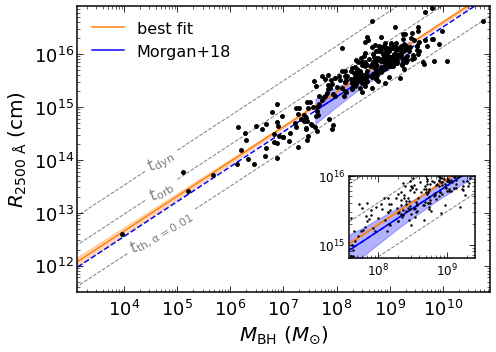

In [86]:
import linmix.linmix as linmix
from matplotlib import cm
from matplotlib.colors import LogNorm
import astropy.constants as const
from labellines import labelLine, labelLines

##### FULL SAMPLE ####

fig,ax = plt.subplots(1,1, figsize=(7,5), sharey=True)
ax.set_xscale('log')
ax.set_yscale('log')

log_M = df_mle.log_M_BH.to_numpy()[mask_nolen]
log_M_e = df_mle.log_M_BH_e.to_numpy()[mask_nolen]
tau = df_mle.tau_rest_mle.to_numpy()[mask_nolen]
log_L = df_mle.log_L5100.to_numpy()[mask_nolen]
log_L_e = df_mle.log_L5100_e.to_numpy()[mask_nolen]

M_e_hi = 10**(log_M + log_M_e) - 10**log_M
M_e_lo = 10**log_M - 10**(log_M - log_M_e)
M_e = np.array([M_e_lo, M_e_hi])
# Scale mass
log_M_scaled = np.log10(10**(log_M)/1e7)

#tau_e = np.array([df_csv.tau_e_rest_lo.to_numpy(), df_csv.tau_e_rest_hi.to_numpy()])
#log_tau = np.log10(df_mle.tau_rest.to_numpy()[mask_nolen])
#log_tau_e = np.mean(0.434*np.mean(tau_e, axis=0)/df_csv.tau_rest_mle.to_numpy()[mask_nolen])
#tau_e_hi = 10**(log_tau + log_tau_e) - 10**log_tau
#tau_e_lo = 10**log_tau - 10**(log_tau - log_tau_e)
#tau_e = np.array([tau_e_lo, tau_e_hi])

#tau_e_asym = np.array([df_mle.tau_e_rest_lo.to_numpy(), df_mle.tau_e_rest_hi.to_numpy()])

# Get the pivot wavelength of each filter (in nm)
lam_pivot = {'V':5478, 'B':4371, 'R':6504, 'g':4702, 'r':6175, 'TESS': 8500, 'kepler':6000, '5100 AA':5100}
lam_pivots = np.array([lam_pivot[b] for b in df_mle.band.to_numpy()[mask_nolen]])
lam_e = lam_pivots/(1+df_mle.z.to_numpy()[mask_nolen])
lam_scales = (2500/lam_e)**(0.17) # from MacLeod 2010

# Convert timescale to orbital radius using Kepler's law
# User uncertainties to propogate error
tau = (df_mle.tau_rest_mle.to_numpy()[mask_nolen]*u.day).to(u.s)*lam_scales
alpha = 0.05
tau_s = tau/(1680/100*(alpha/0.01)**(-1)) # Characteristic (orbital) size

# R [tau_damping = tau_th,0.05]
M = ((10**log_M)*u.solMass).to(u.kg)
R = (const.G*M/(4*np.pi**2)*tau_s**2)**(1/3)
Rcm = R.to(u.cm).value
# Re-scale the error
log_Rcm_e = 0.434*np.mean(tau_e_mean_nolen*Rcm/df_mle.tau_rest_mle.to_numpy()[mask_nolen], axis=0)/Rcm
Rcm_e_lo = df_mle.tau_e_rest_lo.to_numpy()[mask_nolen]*Rcm/df_mle.tau_rest_mle.to_numpy()[mask_nolen]
Rcm_e_hi = df_mle.tau_e_rest_hi.to_numpy()[mask_nolen]*Rcm/df_mle.tau_rest_mle.to_numpy()[mask_nolen]
Rcm_e = np.array([Rcm_e_lo, Rcm_e_hi])

# Points
ax.scatter(10**log_M, Rcm,
           color='k', 
           marker='o', s=15, zorder=3)

# Error bars
m,c,b = ax.errorbar(10**log_M, Rcm, 
                    linestyle='', fmt='', fillstyle='none', ms=5,
                    ecolor='k', capsize=3, zorder=-1)
[i.set_alpha(0.15) for i in b]
[i.set_alpha(0.15) for i in c]

samples = fit_line_linmix(log_M_scaled, np.log10(Rcm), log_M_e, log_Rcm_e, nchains=8, seed=50)
x_eval = np.linspace(3,12,50) - 7
draws_credint = draws_CI_linmix(x_eval, samples)

# Overplot the M
x_eval_morgan = np.linspace(7.60,9.37,20)
x_eval_morgan_all = np.linspace(3,12,50)

def Rcm_morgan(x, nsamp=300):
    a = 15.85 #15.78
    a_e = 0.12 #0.12
    b = 0.66 #0.80
    b_e = 0.15 #0.17

    # Sample:
    draws = np.empty((len(x), nsamp))
    for i in range(nsamp):
        ai = np.random.normal(a, a_e)
        bi = np.random.normal(b, b_e)
        draws[:, i]  = (10**ai)*(x/1e9)**bi

    # Compute credibility interval
    draws_credint = np.empty((len(x), 3))
    draws_credint[:, 0] = np.percentile(draws, 16, axis=1)
    draws_credint[:, 2] = np.percentile(draws, 84, axis=1)
    draws_credint[:, 1] = (10**a)*(x/1e9)**b # Use their relation
    
    return draws_credint


Rcm_morgan_CI = Rcm_morgan(10**x_eval_morgan)
Rcm_morgan_CI_all = Rcm_morgan(10**x_eval_morgan_all, nsamp=1)

# Plot
ax.fill_between(10**x_eval*1e7, 10**draws_credint[:, 2], 10**draws_credint[:, 0],
                color="#ff7f0e", alpha=0.3, zorder=-5)
lines = []
# Best fit (orbital)
ax.plot(10**x_eval*1e7, 10**draws_credint[:, 1], color="#ff7f0e", label='best fit', zorder=-4)

lines.extend(ax.plot(10**x_eval*1e7, 10**draws_credint[:, 1]*20**(2/3), color="grey", zorder=-7, lw=1, linestyle='dashed', label=r'$t_{\rm{dyn}}$'))
lines.extend(ax.plot(10**x_eval*1e7, 10**draws_credint[:, 1]*3**(2/3), color="grey", zorder=-7, lw=1, linestyle='dashed', label=r'$t_{\rm{orb}}$'))
lines.extend(ax.plot(10**x_eval*1e7, 10**draws_credint[:, 1]*5**(-2/3), color="grey", zorder=-7, lw=1, linestyle='dashed', label=r'$t_{\rm{th},\alpha=0.01}$'))


ax.fill_between(10**x_eval_morgan, Rcm_morgan_CI[:, 2], Rcm_morgan_CI[:, 0],
                color="b", alpha=0.3, zorder=-5)
ax.plot(10**x_eval_morgan_all, Rcm_morgan_CI_all[:, 1], color="b",
        linestyle='dashed', zorder=-4)
ax.plot(10**x_eval_morgan, Rcm_morgan_CI[:, 1], color="b",
        linestyle='solid',label='Morgan+18', zorder=-6)

ax.tick_params('both',labelsize=18)
ax.set_xlabel(r'$M_{\rm{BH}}\ (M_{\odot})$',fontsize=20)
ax.set_ylabel(r'$R_{\rm{2500}\ \AA}$ (cm)',fontsize=20)

ax.minorticks_on()
ax.tick_params(axis='both', which='both', direction='in')
ax.tick_params(axis='both', which='major', length=6)
ax.tick_params(axis='both', which='minor', length=3)

ax.axis('equal')
ax.set_xlim([10**(3.5), 10**(10.5)])
ax.set_ylim([10**(11.5), 10**(16.9)])

# INSET
# Manually set the position and relative size of the inset axes within ax1
ax_ins = fig.add_axes([0.7, 0.27, 0.25, 0.23])
ax_ins.set_xscale('log')
ax_ins.set_yscale('log')
# Points
ax_ins.scatter(10**log_M, Rcm,
           color='k', 
           marker='o', s=2, zorder=3)

from scipy.stats import pearsonr
#print('r=', pearsonr(log_M_scaled, np.log10(Rcm)))


# Relations
ax_ins.plot(10**x_eval_morgan_all, Rcm_morgan_CI_all[:, 1], color="b",
        linestyle='dashed', zorder=-4)
ax_ins.plot(10**x_eval_morgan, Rcm_morgan_CI[:, 1], color="b",
        linestyle='solid',label='Morgan+18', zorder=-4)
ax_ins.axis('equal')
ax_ins.set_xlim([10**(7.8), 10**(9.2)])
ax_ins.set_ylim([10**(14.8), 10**(16.0)])
# Plot
ax_ins.fill_between(10**x_eval*1e7, 10**draws_credint[:, 2], 10**draws_credint[:, 0],
                color="#ff7f0e", alpha=0.3, zorder=-5)
ax_ins.plot(10**x_eval*1e7, 10**draws_credint[:, 1], color="#ff7f0e", label='best fit', zorder=-4)

ax_ins.fill_between(10**x_eval_morgan, Rcm_morgan_CI[:, 2], Rcm_morgan_CI[:, 0],
                color="b", alpha=0.3, zorder=-6)
ax_ins.plot(10**x_eval*1e7, 10**draws_credint[:, 1]*20**(2/3), color="grey", zorder=-7, lw=1, linestyle='dashed')
ax_ins.plot(10**x_eval*1e7, 10**draws_credint[:, 1]*3**(2/3), color="grey", zorder=-7, lw=1, linestyle='dashed')
ax_ins.plot(10**x_eval*1e7, 10**draws_credint[:, 1]*5**(-2/3), color="grey", zorder=-7, lw=1, linestyle='dashed',)


ax_ins.tick_params('both',labelsize=12)
ax_ins.minorticks_on()
ax_ins.tick_params(axis='both', which='both', direction='in')
ax_ins.tick_params(axis='both', which='major', length=6)
ax_ins.tick_params(axis='both', which='minor', length=3)

ax_ins.xaxis.set_ticks_position('both')
ax_ins.yaxis.set_ticks_position('both')
import matplotlib.ticker as ticker
#ax.tick_params(axis='x', which='major', pad=7)
ax_ins.yaxis.set_major_locator(ticker.LogLocator(base=10.0, numticks=12))
ax_ins.yaxis.set_minor_locator(ticker.LogLocator(base=10.0, subs=(0.1,0.2,0.3,0.4,0.5,0.6,0.7,0.8,0.9), numticks=12))
ax_ins.yaxis.set_minor_formatter(ticker.NullFormatter())

ax.xaxis.set_ticks_position('both')
ax.yaxis.set_ticks_position('both')
ax.tick_params(axis='x', which='major', pad=7)
ax.xaxis.set_major_locator(ticker.LogLocator(base=10.0, numticks=12))
ax.xaxis.set_minor_locator(ticker.LogLocator(base=10.0, subs=(0.1,0.2,0.3,0.4,0.5,0.6,0.7,0.8,0.9), numticks=12))
ax.xaxis.set_minor_formatter(ticker.NullFormatter())

labelLines(lines, xvals=[5e4,5e4,5e4], fontsize=16, drop_label=True, zorder=-6.5)

ax.legend(fontsize=16, loc=2, frameon=False)
fig.tight_layout()
#fig.savefig('figures/radiusvsmass_FULL.pdf', dpi=300)

In [36]:
R = (const.G*10**-0.3*u.Msun)**(1/3)*(10**-3*u.day/(2*np.pi))**(2/3)
R = R.to(u.cm)

In [37]:
R

<Quantity 2.32555417e+09 cm>

In [38]:
R_ISCO = 6*const.G*10**-0.3*u.Msun/const.c**2
R_ISCO = R_ISCO.to(u.cm)

In [39]:
R_ISCO

<Quantity 444039.37075506 cm>

### $\tau_{\rm{DRW}}-L_{5100}$

M-tau
m = 2.5 ± 0.35
b = 8.0 ± 0.14
sigma [dex] = 0.33 ± 0.12
L-tau
m = 2.8 ± 0.37
b = 4.4e+01 ± 0.15
sigma [dex] = 0.4 ± 0.11
tau-L
m = 0.33 ± 0.038
b = 1.9 ± 0.049
sigma [dex] = 0.11 ± 0.049
R-L
m = 0.53 ± 0.042
b = 1.5e+01 ± 0.056
sigma [dex] = 0.1 ± 0.051


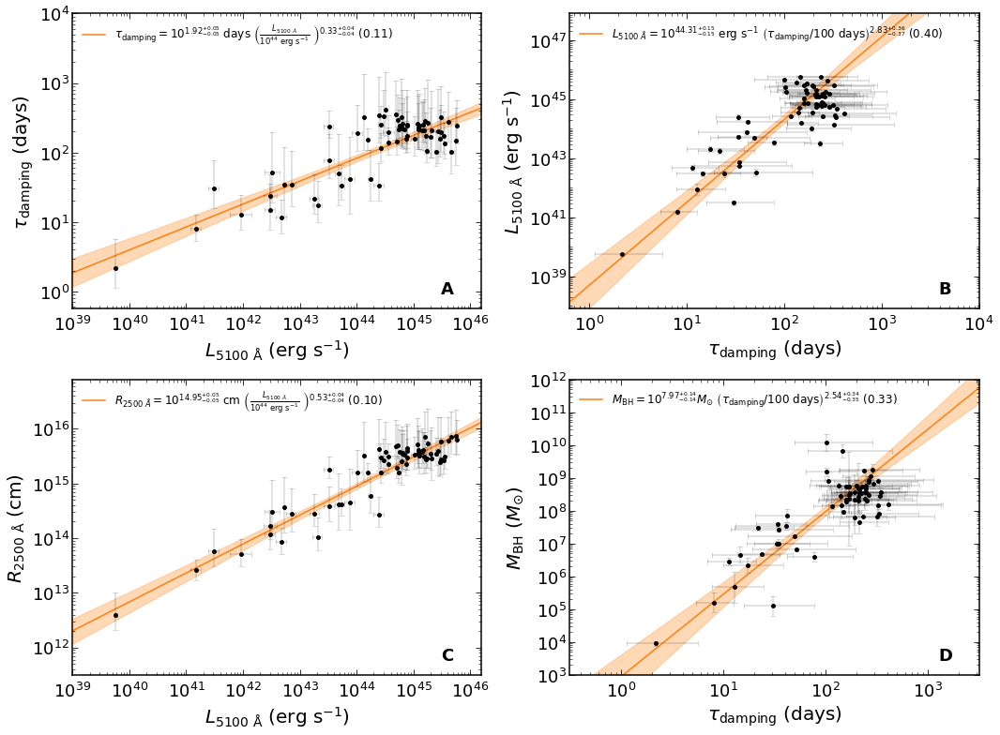

In [43]:
log_M = df_csv.log_M_BH.to_numpy()
log_M_e = df_csv.log_M_BH_e.to_numpy()
log_L = df_csv.log_L5100.to_numpy()
log_L_e = df_csv.log_L5100_e.to_numpy()
tau_unscaled = df_csv.tau_rest_mle.to_numpy()
tau_e = np.array([df_csv.tau_e_rest_lo.to_numpy(), df_csv.tau_e_rest_hi.to_numpy()])

tau_e_unscaled = np.array([df_csv.tau_e_rest_lo.to_numpy(), df_csv.tau_e_rest_hi.to_numpy()])
log_tau_unscaled = np.log10(tau_unscaled)
log_tau_e_unscaled = 0.434*np.mean(tau_e_unscaled, axis=0)/tau_unscaled

tau = tau_unscaled / 100
log_tau = np.log10(tau)
tau_e_hi = 10**(log_tau_unscaled + log_tau_e_unscaled) / 100 - 10**log_tau_unscaled / 100
tau_e_lo = 10**log_tau_unscaled / 100 - 10**(log_tau_unscaled - log_tau_e_unscaled) / 100
tau_e = np.array([tau_e_lo, tau_e_hi])
log_tau_e = 0.434*np.mean(tau_e, axis=0)/tau

tau_e_hi_unscaled = 10**(log_tau_unscaled + log_tau_e) - 10**log_tau_unscaled
tau_e_lo_unscaled = 10**log_tau_unscaled - 10**(log_tau_unscaled - log_tau_e)
#tau_e_unscaled = np.array([tau_e_lo_unscaled, tau_e_hi_unscaled])
log_tau_e_unscaled = 0.434*np.mean(tau_e_unscaled, axis=0)/tau_unscaled

L_unscaled = 10**log_L
L_e_hi_unscaled = 10**(log_L + log_L_e) - 10**log_L
L_e_lo_unscaled = 10**log_L - 10**(log_L - log_L_e)
L_e_hi_unscaled[L_e_hi_unscaled==0] = 0.2*L_unscaled[L_e_hi_unscaled==0]
L_e_lo_unscaled[L_e_lo_unscaled==0] = 0.2*L_unscaled[L_e_lo_unscaled==0]
L_e_unscaled = np.array([L_e_lo_unscaled, L_e_hi_unscaled])
log_L_unscaled = np.log10(L_unscaled)
log_L_e_unscaled = 0.434*np.mean(L_e_unscaled, axis=0)/L_unscaled

L = 10**log_L / 1e44
L_e_hi = 10**(log_L + log_L_e) /1e44 - 10**log_L/ 1e44
L_e_lo = 10**log_L/ 1e44 - 10**(log_L - log_L_e)/ 1e44

# If L_e is 0 assume 20%
L_e_hi[L_e_hi==0] = 0.2*L[L_e_hi==0]
L_e_lo[L_e_lo==0] = 0.2*L[L_e_lo==0]
L_e = np.array([L_e_lo, L_e_hi])
log_L = np.log10(L)
log_L_e = 0.434*np.mean(L_e, axis=0)/L

fig,axs = plt.subplots(2,2, figsize=(15,11)) # gridspec_kw={'width_ratios': [1.2, 1]})

# M - tau
print('M-tau')
ax = axs[1,1]
ax.set_xscale('log')
ax.set_yscale('log')

# Points
ax.scatter(tau_unscaled, 10**log_M,
           color='k', 
           marker='o', s=15, zorder=3)

# Error bars
m,c,b = ax.errorbar(tau_unscaled, 10**log_M, 
                    xerr=tau_e_unscaled, yerr=M_e,
                    linestyle='', fmt='', fillstyle='none', ms=5,
                    ecolor='k', capsize=3, zorder=-1)

[i.set_alpha(0.15) for i in b]
[i.set_alpha(0.15) for i in c]

x_eval = np.linspace(-5,5,50)
samples_Mtau = fit_line_linmix(log_tau, log_M, log_tau_e, log_M_e, nchains=8, seed=50)
draws_credint = draws_CI_linmix(x_eval, samples_Mtau)

# Plot
alpha = np.mean(samples_Mtau['alpha'])
beta = np.mean(samples_Mtau['beta'])
sigma = np.mean(np.sqrt(samples_Mtau['sigsqr']))
fmt = (alpha, np.percentile(samples_Mtau['alpha'], 84) - alpha, alpha - np.percentile(samples_Mtau['alpha'], 16),
       beta , np.percentile(samples_Mtau['beta'], 84) - beta, beta - np.percentile(samples_Mtau['beta'], 16),
       sigma)
s = r'$M_{\rm{BH}} = 10^{%0.2f^{+%0.2f}_{-%0.2f}} M_{\odot}\ \left(\tau_{\rm{damping}} / 100\ \rm{days} \right)^{%0.2f^{+%0.2f}_{-%0.2f}}\ (%0.2f)$' % fmt

ax.fill_between(10**x_eval*100, 10**draws_credint[:, 2], 10**draws_credint[:, 0],
                color="#ff7f0e", alpha=0.3, zorder=-5)
ax.plot(10**x_eval*100, 10**draws_credint[:, 1], color="#ff7f0e", label=s, zorder=-4)

ax.tick_params('both',labelsize=18)
ax.set_ylabel(r'$M_{\rm{BH}}\ (M_{\odot})$',fontsize=20)
ax.set_xlabel(r'$\tau_{\rm{damping}}$ (days)',fontsize=20)

ax.annotate("D", fontsize=18, weight='bold', xy=(0.9, 0.05), xycoords="axes fraction")

ax.minorticks_on()
ax.tick_params(axis='both', which='both', direction='in')
ax.tick_params(axis='both', which='major', length=6)
ax.tick_params(axis='both', which='minor', length=3)

#ax.axis('equal')
ax.set_xlim([10**(-0.5), 10**(3.5)])
ax.set_ylim([10**(3.0), 10**(12.0)])

ax.xaxis.set_ticks_position('both')
ax.yaxis.set_ticks_position('both')

ax.tick_params(axis='x', which='major', pad=7)
ax.xaxis.set_major_locator(ticker.LogLocator(base=10.0, numticks=10))
ax.xaxis.set_minor_locator(ticker.LogLocator(base=10.0, subs=(0.1,0.2,0.3,0.4,0.5,0.6,0.7,0.8,0.9), numticks=12))
ax.xaxis.set_minor_formatter(ticker.NullFormatter())
ax.yaxis.set_major_locator(ticker.LogLocator(base=10.0, numticks=10))
ax.yaxis.set_minor_locator(ticker.LogLocator(base=10.0, subs=(0.1,0.2,0.3,0.4,0.5,0.6,0.7,0.8,0.9), numticks=12))
ax.yaxis.set_minor_formatter(ticker.NullFormatter())
ax.legend(fontsize=12, loc=2, frameon=False)

# L - TAU
print('L-tau')
ax = axs[0,1]
ax.set_xscale('log')
ax.set_yscale('log')

# Points
ax.scatter(tau_unscaled, L_unscaled,
           color='k', 
           marker='o', s=15, zorder=3)

# Error bars
m,c,b = ax.errorbar(tau_unscaled, L_unscaled, 
                    xerr=tau_e_unscaled, yerr=L_e_unscaled,
                    linestyle='', fmt='', fillstyle='none', ms=5,
                    ecolor='k', capsize=3, zorder=-1)

[i.set_alpha(0.15) for i in b]
[i.set_alpha(0.15) for i in c]

x_eval = np.linspace(-5,5,50)
samples_Ltau = fit_line_linmix(log_tau, log_L_unscaled, log_tau_e, log_L_e_unscaled, nchains=8, seed=50)
draws_credint = draws_CI_linmix(x_eval, samples_Ltau)

# Plot
alpha = np.mean(samples_Ltau['alpha'])
beta = np.mean(samples_Ltau['beta'])
sigma = np.mean(np.sqrt(samples_Ltau['sigsqr']))
fmt = (alpha, np.percentile(samples_Ltau['alpha'], 84) - alpha, alpha - np.percentile(samples_Ltau['alpha'], 16),
       beta , np.percentile(samples_Ltau['beta'], 84) - beta, beta - np.percentile(samples_Ltau['beta'], 16),
       sigma)
s = r'$L_{5100\ \AA} = 10^{%0.2f^{+%0.2f}_{-%0.2f}}\ {\rm{erg\ s}^{-1}}\ \left(\tau_{\rm{damping}} / 100\ \rm{days} \right)^{%0.2f^{+%0.2f}_{-%0.2f}}\ (%0.2f)$' % fmt

ax.fill_between(10**x_eval*100, 10**draws_credint[:, 2], 10**draws_credint[:, 0],
                color="#ff7f0e", alpha=0.3, zorder=-5)
ax.plot(10**x_eval*100, 10**draws_credint[:, 1], color="#ff7f0e", label=s, zorder=-4)

ax.tick_params('both',labelsize=18)
ax.set_ylabel(r'$L_{\rm{5100}\ \AA}$ (erg s$^{-1}$)',fontsize=20)
ax.set_xlabel(r'$\tau_{\rm{damping}}$ (days)',fontsize=20)

ax.annotate("B", fontsize=18, weight='bold', xy=(0.9, 0.05), xycoords="axes fraction")

ax.minorticks_on()
ax.tick_params(axis='both', which='both', direction='in')
ax.tick_params(axis='both', which='major', length=6)
ax.tick_params(axis='both', which='minor', length=3)

#ax.axis('equal')
ax.set_ylim([10**(37.9), 10**(47.9)])
ax.set_xlim([10**(-0.2), 10**(4.0)])

ax.xaxis.set_ticks_position('both')
ax.yaxis.set_ticks_position('both')

ax.tick_params(axis='x', which='major', pad=7)
ax.xaxis.set_major_locator(ticker.LogLocator(base=10.0, numticks=10))
ax.xaxis.set_minor_locator(ticker.LogLocator(base=10.0, subs=(0.1,0.2,0.3,0.4,0.5,0.6,0.7,0.8,0.9), numticks=12))
ax.xaxis.set_minor_formatter(ticker.NullFormatter())
ax.yaxis.set_major_locator(ticker.LogLocator(base=10.0, numticks=10))
ax.yaxis.set_minor_locator(ticker.LogLocator(base=10.0, subs=(0.1,0.2,0.3,0.4,0.5,0.6,0.7,0.8,0.9), numticks=12))
ax.yaxis.set_minor_formatter(ticker.NullFormatter())
ax.legend(fontsize=12, loc=2, frameon=False)

# TAU - L
print('tau-L')
ax = axs[0,0]
ax.set_xscale('log')
ax.set_yscale('log')

# Points
ax.scatter(L_unscaled, tau_unscaled,
           color='k', 
           marker='o', s=15, zorder=3)

# Error bars
m,c,b = ax.errorbar(L_unscaled, tau_unscaled, 
                    xerr=L_e_unscaled, yerr=tau_e_unscaled,
                    linestyle='', fmt='', fillstyle='none', ms=5,
                    ecolor='k', capsize=3, zorder=-1)

[i.set_alpha(0.15) for i in b]
[i.set_alpha(0.15) for i in c]

x_eval = np.linspace(-5,5,50)
samples_tauL = fit_line_linmix(log_L, log_tau_unscaled, log_L_e, log_tau_e_unscaled, nchains=8, seed=50)
draws_credint = draws_CI_linmix(x_eval, samples_tauL)


# Plot
alpha = np.mean(samples_tauL['alpha'])
beta = np.mean(samples_tauL['beta'])
sigma = np.mean(np.sqrt(samples_tauL['sigsqr']))
fmt = (alpha, np.percentile(samples_tauL['alpha'], 84) - alpha, alpha - np.percentile(samples_tauL['alpha'], 16),
       beta, np.percentile(samples_tauL['beta'], 84) - beta, beta - np.percentile(samples_tauL['beta'], 16),
       sigma)
s = r'$\tau_{\rm{damping}} = 10^{%0.2f^{+%0.2f}_{-%0.2f}}\ {\rm{days}}\ \left(\frac{L_{5100\ \AA}}{10^{44}\ {\rm erg\ s}^{-1}}\ \right)^{%0.2f^{+%0.2f}_{-%0.2f}}\ (%0.2f)$' % fmt

ax.fill_between(10**x_eval*1e44, 10**draws_credint[:, 2], 10**draws_credint[:, 0],
                color="#ff7f0e", alpha=0.3, zorder=-5)
ax.plot(10**x_eval*1e44, 10**draws_credint[:, 1], color="#ff7f0e", label=s, zorder=-4)


ax.tick_params('both',labelsize=18)
ax.set_xlabel(r'$L_{\rm{5100}\ \AA}$ (erg s$^{-1}$)',fontsize=20)
ax.set_ylabel(r'$\tau_{\rm{damping}}$ (days)',fontsize=20)

ax.annotate("A", fontsize=18, weight='bold', xy=(0.9, 0.05), xycoords="axes fraction")

ax.minorticks_on()
ax.tick_params(axis='both', which='both', direction='in')
ax.tick_params(axis='both', which='major', length=6)
ax.tick_params(axis='both', which='minor', length=3)

#ax.axis('equal')
ax.set_xlim([10**(39.0), 10**(46.2)])
ax.set_ylim([10**(-0.25), 10**(4.0)])
ax.xaxis.set_ticks_position('both')
ax.yaxis.set_ticks_position('both')

ax.tick_params(axis='x', which='major', pad=7)
ax.xaxis.set_major_locator(ticker.LogLocator(base=10.0, numticks=12))
ax.xaxis.set_minor_locator(ticker.LogLocator(base=10.0, subs=(0.1,0.2,0.3,0.4,0.5,0.6,0.7,0.8,0.9), numticks=12))
ax.xaxis.set_minor_formatter(ticker.NullFormatter())
ax.yaxis.set_major_locator(ticker.LogLocator(base=10.0, numticks=12))
ax.yaxis.set_minor_locator(ticker.LogLocator(base=10.0, subs=(0.1,0.2,0.3,0.4,0.5,0.6,0.7,0.8,0.9), numticks=12))
ax.yaxis.set_minor_formatter(ticker.NullFormatter())
ax.legend(fontsize=12, loc=2, frameon=False)

# R - L
print('R-L')
ax = axs[1,0]
ax.set_xscale('log')
ax.set_yscale('log')

# Points
ax.scatter(L_unscaled, Rcm,
           color='k', 
           marker='o', s=15, zorder=3)

# Error bars
m,c,b = ax.errorbar(L_unscaled, Rcm, 
                    xerr=L_e_unscaled, yerr=Rcm_e,
                    linestyle='', fmt='', fillstyle='none', ms=5,
                    ecolor='k', capsize=3, zorder=-1)

[i.set_alpha(0.15) for i in b]
[i.set_alpha(0.15) for i in c]

x_eval = np.linspace(-5,5,50)

samples_RL = fit_line_linmix(log_L, np.log10(Rcm), log_L_e, log_Rcm_e, nchains=8, seed=50)

draws_credint = draws_CI_linmix(x_eval, samples_RL)


# Plot
alpha = np.mean(samples_RL['alpha'])
beta = np.mean(samples_RL['beta'])
sigma = np.mean(np.sqrt(samples_RL['sigsqr']))
fmt = (alpha, np.percentile(samples_RL['alpha'], 84) - alpha, alpha - np.percentile(samples_RL['alpha'], 16),
       beta , np.percentile(samples_RL['beta'], 84) - beta, beta - np.percentile(samples_RL['beta'], 16),
       sigma)
s = r'$R_{2500\ \AA} = 10^{%0.2f^{+%0.2f}_{-%0.2f}}\ {\rm{cm}}\ \left(\frac{L_{5100\ \AA}}{10^{44}\ {\rm erg\ s}^{-1}}\ \right)^{%0.2f^{+%0.2f}_{-%0.2f}}\ (%0.2f)$' % fmt

ax.fill_between(10**x_eval*1e44, 10**draws_credint[:, 2], 10**draws_credint[:, 0],
                color="#ff7f0e", alpha=0.3, zorder=-5)
ax.plot(10**x_eval*1e44, 10**draws_credint[:, 1], color="#ff7f0e", label=s, zorder=-4)


log_y_bentz = -21.3 + 0.519*(x_eval + 42)
#ax.plot(10**x_eval*1e42, 10**log_y_bentz*2.59e15/100, color="grey",
#        linestyle='solid',label='Bentz+08', zorder=-4)

ax.tick_params('both',labelsize=18)
ax.set_xlabel(r'$L_{\rm{5100}\ \AA}$ (erg s$^{-1}$)',fontsize=20)
ax.set_ylabel(r'$R_{\rm{2500}\ \AA}$ (cm)',fontsize=20)

ax.annotate("C", fontsize=18, weight='bold', xy=(0.9, 0.05), xycoords="axes fraction")

ax.minorticks_on()
ax.tick_params(axis='both', which='both', direction='in')
ax.tick_params(axis='both', which='major', length=6)
ax.tick_params(axis='both', which='minor', length=3)

#ax.axis('equal')
ax.set_xlim([10**(39.0), 10**(46.2)])
ax.set_ylim([10**(11.5), 10**(16.9)])
ax.xaxis.set_ticks_position('both')
ax.yaxis.set_ticks_position('both')

ax.tick_params(axis='x', which='major', pad=7)
ax.xaxis.set_major_locator(ticker.LogLocator(base=10.0, numticks=12))
ax.xaxis.set_minor_locator(ticker.LogLocator(base=10.0, subs=(0.1,0.2,0.3,0.4,0.5,0.6,0.7,0.8,0.9), numticks=12))
ax.xaxis.set_minor_formatter(ticker.NullFormatter())
ax.yaxis.set_major_locator(ticker.LogLocator(base=10.0, numticks=10))
ax.yaxis.set_minor_locator(ticker.LogLocator(base=10.0, subs=(0.1,0.2,0.3,0.4,0.5,0.6,0.7,0.8,0.9), numticks=12))
ax.yaxis.set_minor_formatter(ticker.NullFormatter())
ax.legend(fontsize=12, loc=2, frameon=False)

fig.tight_layout()
fig.savefig('figures/regressions.pdf', dpi=300)

#fig = corner.corner(np.array([samples['beta'], samples['alpha'], np.sqrt(samples['sigsqr'])]).T,
#                    labels=["$m$", "$b$", "$\sigma$ [dex]"], quantiles=[0.16,0.84], show_titles=True,
#                    label_kwargs=dict(fontsize=18), title_kwargs=dict(fontsize=14));


### $\chi - L/L_{\rm{Edd}}$ 

(array([ 1.,  0.,  0.,  0.,  1.,  0.,  0.,  1.,  2.,  1.,  1.,  4.,  6.,
         8., 10.,  8.,  5.,  5.,  1.,  2.,  2.,  1.,  2.,  1.,  1.]),
 array([-0.88246766, -0.81958852, -0.75670939, -0.69383025, -0.63095112,
        -0.56807198, -0.50519285, -0.44231371, -0.37943458, -0.31655545,
        -0.25367631, -0.19079718, -0.12791804, -0.06503891, -0.00215977,
         0.06071936,  0.1235985 ,  0.18647763,  0.24935676,  0.3122359 ,
         0.37511503,  0.43799417,  0.5008733 ,  0.56375244,  0.62663157,
         0.68951071]),
 <a list of 25 Patch objects>)

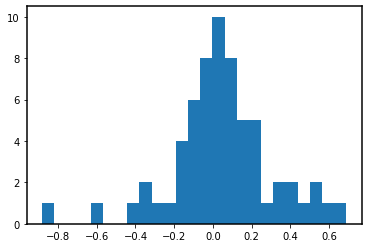

In [976]:
res = np.log10(tau) - np.log10(y_tauM)
plt.hist(res, bins=25)

No handles with labels found to put in legend.


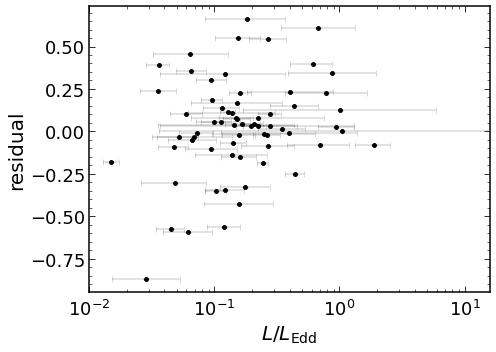

In [50]:
fig,ax = plt.subplots(1,1, figsize=(7,5), sharey=True)
ax.set_xscale('log')
#ax.set_yscale('log')

tau = df_csv.tau_rest.to_numpy()
tau_e = np.array([df_csv.tau_e_rest_lo.to_numpy(), df_csv.tau_e_rest_hi.to_numpy()])
log_M = df_csv.log_M_BH.to_numpy()
log_M_e = df_csv.log_M_BH_e.to_numpy()
log_L = df_csv.log_L5100
log_L_e = df_csv.log_L5100_e

L = 10**log_L
L_e_hi = 10**(log_L + log_L_e) - 10**log_L
L_e_lo = 10**log_L - 10**(log_L - log_L_e)
L_e_hi[L_e_hi==0] = 0.2*L[L_e_hi==0]
L_e_lo[L_e_lo==0] = 0.2*L[L_e_lo==0]
L_e = np.array([L_e_lo, L_e_hi])
log_L = np.log10(L)
log_L_e = 0.434*np.mean(L_e, axis=0)/L

# If L_e is 0 assume 20%
L_e_hi[L_e_hi==0] = 0.2*L[L_e_hi==0]
L_e_lo[L_e_lo==0] = 0.2*L[L_e_lo==0]
L_e = np.array([L_e_lo, L_e_hi])
log_L = np.log10(L)
log_L_e = 0.434*np.mean(L_e, axis=0)/L

y_tauM = 48.7*(10**log_M/1e7)**0.42
res = np.log10(tau) - np.log10(y_tauM)

rEdd = np.array([9.26*10**xi/(1.26e38*10**log_M[i]) for i, xi in enumerate(log_L)])

dfL_lo = np.array([9.26*L_e[0,i]/(9.26*10**xi) for i, xi in enumerate(log_L)])
dfL_hi = np.array([9.26*L_e[1,i]/(9.26*10**xi) for i, xi in enumerate(log_L)])

dfM_lo = np.array([1.26e38*M_e_lo[i]/(1.26e38*10**xi) for i, xi in enumerate(log_M)])
dfM_hi = np.array([1.26e38*M_e_hi[i]/(1.26e38*10**xi) for i, xi in enumerate(log_M)])

rEdd_e_lo = rEdd*np.sqrt(dfL_lo**2 + dfM_lo**2)
rEdd_e_hi = rEdd*np.sqrt(dfL_hi**2 + dfM_hi**2)
rEdd_e = np.array([rEdd_e_lo,rEdd_e_hi])
#dfM = np.array([9.26*10**xi/(1.26e38*10**log_L[i]) for i, xi in enumerate(log_L_e)])


# Points
ax.scatter(rEdd, res,
           color='k', 
           marker='o', s=15, zorder=3)

# Error bars
m,c,b = ax.errorbar(rEdd, res, 
                    xerr=rEdd_e, yerr=0,
                    linestyle='', fmt='', fillstyle='none', ms=5,
                    ecolor='k', capsize=3, zorder=-1)

[i.set_alpha(0.15) for i in b]
[i.set_alpha(0.15) for i in c]

x_eval = np.linspace(39,46,50)

#samples_res = fit_line_linmix(log_L, np.log10(Rcm), log_L_e, log_Rcm_e, nchains=8, seed=50)

#draws_credint = draws_CI_linmix(x_eval, samples_res)


# Plot
#ax.fill_between(10**x_eval, 10**draws_credint[:, 2], 10**draws_credint[:, 0],
#                color="#ff7f0e", alpha=0.3, zorder=-5)
#ax.plot(10**x_eval, 10**draws_credint[:, 1], color="#ff7f0e", label='MAP fit', zorder=-4)

#ax.plot(10**x_eval, 10**log_y_bentz*2.59e15/100, color="grey",
#        linestyle='solid',label='Betnz', zorder=-4)

ax.tick_params('both',labelsize=18)
ax.set_xlabel(r'$L/L_{\rm{Edd}}$',fontsize=20)
ax.set_ylabel(r'residual',fontsize=20)

ax.minorticks_on()
ax.tick_params(axis='both', which='both', direction='in')
ax.tick_params(axis='both', which='major', length=6)
ax.tick_params(axis='both', which='minor', length=3)

#ax.axis('equal')
#ax.set_ylim([10**(0.8), 10**(-0.5)])
ax.set_xlim([10**(-2.0), 10**(1.2)])

ax.xaxis.set_ticks_position('both')
ax.yaxis.set_ticks_position('both')

ax.tick_params(axis='x', which='major', pad=7)
ax.xaxis.set_major_locator(ticker.LogLocator(base=10.0, numticks=8))
ax.xaxis.set_minor_locator(ticker.LogLocator(base=10.0, subs=(0.1,0.2,0.3,0.4,0.5,0.6,0.7,0.8,0.9), numticks=12))
ax.xaxis.set_minor_formatter(ticker.NullFormatter())

ax.legend(fontsize=16, loc=2, frameon=False)
fig.tight_layout()
fig.savefig('figures/resdvsedd.pdf', dpi=300)

[ 1.12016573 -0.85595248  0.32900289]
-0.855952479808312 0.32900288688476736
-0.8144013950191444 0.4151671655313449


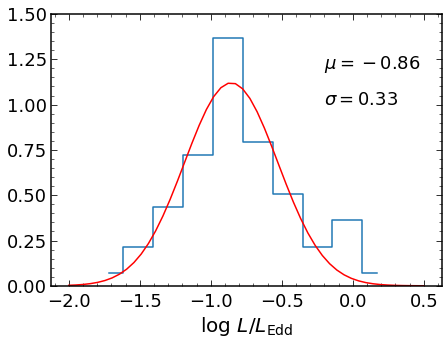

In [98]:
import scipy.stats as st
from scipy.optimize import leastsq

fig,ax = plt.subplots(1,1, figsize=(7,5), sharey=True)

h, bin_edges = np.histogram(np.log10(rEdd), density=True, bins=10)
bincentres = [(bin_edges[i]+bin_edges[i+1])/2. for i in range(len(bin_edges)-1)]
ax.step(bincentres, h, where='mid')

# Fit normal
x=np.linspace(-2,0.5,50)
#pdf_fitted = st.norm.pdf(x, loc=p[0], scale=p[1]) # fitted distribution
init = [1, 0.8, 0.3]
def fitfunc(p, x):
    return p[0]*np.exp(-0.5*((x-p[1])/p[2])**2)
def errfunc(p, x, y):
    return (y - fitfunc(p, x))
out = leastsq(errfunc, init, args=(bincentres, h))
p = out[0]
ax.plot(x, fitfunc(p, x), 'r-')

print(p[1], p[2])
print(np.median(np.log10(rEdd)), np.std(np.log10(rEdd)))

ax.tick_params('both',labelsize=18)
ax.set_xlabel(r'$\log\ L/L_{\rm{Edd}}$',fontsize=20)
#ax.set_ylabel(r'N',fontsize=20)

ax.text(-.2, 1.2, r'$\mu=%.2f$' % p[1], fontsize=18)
ax.text(-.2, 1, r'$\sigma=%.2f$' % p[2], fontsize=18)

ax.set_ylim(0, 1.5)

ax.minorticks_on()
ax.tick_params(axis='both', which='both', direction='in')
ax.tick_params(axis='both', which='major', length=6)
ax.tick_params(axis='both', which='minor', length=3)

ax.xaxis.set_ticks_position('both')
ax.yaxis.set_ticks_position('both')

ax.tick_params(axis='x', which='major', pad=7)

### Misc.

### X-ray data

In [44]:
# Read the X-ray data and plot from https://www.aanda.org/articles/aa/full_html/2012/08/aa19008-12/T4.html
name, mass, masserr, log_nu_br, log_nu_br_e_hi, log_nu_br_e_lo, z = np.loadtxt("data/xraynu.txt", unpack=True, dtype=str)
# Use xraynu-nnolit for removal of duplicates from the literature
name = name.astype(np.str)
coord_xray = []
for i, namei in enumerate(name):
    if "Circinus" in namei:
        namei = "Circinus Galaxy"
    coord_xray.append(SkyCoord.from_name(namei))
coord_xray = concatenate(coord_xray)
log_M_br = mass.astype(np.float)
log_M_br_e = masserr.astype(np.float)

z = z.astype(np.float)

In [45]:
log_nu_br = log_nu_br.astype(np.float)
log_nu_br_e_lo = log_nu_br_e_lo.astype(np.float)
log_nu_br_e_hi = log_nu_br_e_hi.astype(np.float)

nu_br = 10**log_nu_br*86400 # Hz to 1/days
nu_br_hi = 10**(log_nu_br + log_nu_br_e_hi)*86400
nu_br_lo = 10**(log_nu_br - log_nu_br_e_lo)*86400

# convert nu [day-1] to tau = 1/(2pi nu)
tau_br = 1/(nu_br*2*np.pi)/ (1+z)
tau_br_hi = 1/(nu_br_lo*2*np.pi)/ (1+z)
tau_br_lo = 1/(nu_br_hi*2*np.pi)/ (1+z)

tau_br_e_lo = tau_br - tau_br_lo
tau_br_e_hi = tau_br_hi - tau_br
tau_br_e = np.array([tau_br_e_lo, tau_br_e_hi])

log_tau_br_e = 0.434*np.mean(tau_br_e, axis=0)/tau_br

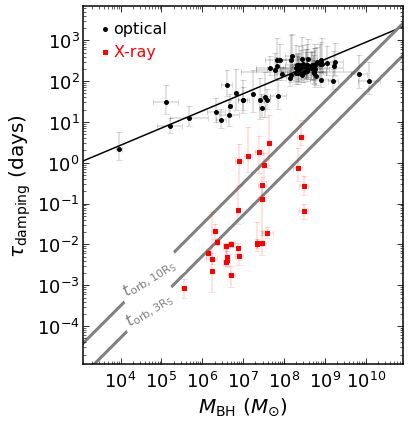

In [47]:
from labellines import labelLine, labelLines
fig,ax = plt.subplots(1,1, figsize=(5.8,6), sharey=True)
ax.set_xscale('log')
ax.set_yscale('log')

log_M = df_csv.log_M_BH.to_numpy()
log_M_e = df_csv.log_M_BH_e.to_numpy()
tau = df_csv.tau_rest_mle.to_numpy()
tau_e = np.array([df_csv.tau_e_rest_lo.to_numpy(), df_csv.tau_e_rest_hi.to_numpy()])

M_br_e_hi = 10**(log_M_br + log_M_br_e) - 10**log_M_br
M_br_e_lo = 10**log_M_br - 10**(log_M_br - log_M_br_e)
M_br_e = np.array([M_br_e_lo, M_br_e_hi])

# Points
ax.scatter(10**log_M_br, tau_br,
           color='r', label='X-ray',
           marker='s', s=15, zorder=3)

# Error bars
m,c,b = ax.errorbar(10**log_M_br, tau_br, 
                    xerr=M_br_e, yerr=tau_br_e,
                    linestyle='', fmt='', fillstyle='none', ms=5,
                    ecolor='r', capsize=3, zorder=-1)

[i.set_alpha(0.15) for i in b]
[i.set_alpha(0.15) for i in c]

x_eval = np.linspace(3,12,50)

# Points
ax.scatter(10**log_M, tau,
           color='k', label='optical',
           marker='o', s=15, zorder=3)

#ax.scatter(10**df_scar.log_M.to_numpy().astype(np.float)[df_scar.type.to_numpy()=='AGN'], tau_scar[df_scar.type.to_numpy()=='AGN'],
#           color='r', label='optical',
#           marker='o', s=30, zorder=3)

# Error bars
m,c,b = ax.errorbar(10**log_M, tau, 
                    xerr=M_e, yerr=tau_e, 
                    linestyle='', fmt='', fillstyle='none', ms=5,
                    ecolor='k', capsize=3, zorder=-1)

[i.set_alpha(0.15) for i in b]
[i.set_alpha(0.15) for i in c]

y_burke = 10**1.69*(10**x_eval/1e7)**0.42

ax.plot(10**x_eval, y_burke, color="k",
        linestyle='solid', zorder=-4)

log_y_GMV = -4.0 + x_eval*1.09
log_y_scargini = -3.07 + x_eval*0.043 + x_eval*0.95
log_y_mchardy = -2.32 + x_eval*2.10 - x_eval*0.98

# normalize to 1e8
ynorm = -4.0 + np.log10(1e7)*1.09
log_y_scargini *= ynorm/(-3.07 + np.log10(1e7)*0.043 + np.log10(1e7)*0.95)
log_y_mchardy *= ynorm/(-2.32 + np.log10(1e7)*2.10 - np.log10(1e7)*0.98)

#ax.plot(10**x_eval, 10**log_y_GMV/86400/(2*np.pi), color="r",
#        linestyle='solid', zorder=-4)
#ax.plot(10**x_eval, 10**log_y_scargini/86400/(2*np.pi), color="r",
#        linestyle='dashed', zorder=-4)
#ax.plot(10**x_eval, 10**log_y_mchardy/86400/(2*np.pi), color="r",
#        linestyle='dotted', zorder=-4)

# orbital timescale
y_orb = 100*(10**x_eval/1e8)*(3/100)**(3/2) # days
lines = []
lines.extend(ax.plot(10**x_eval, y_orb, color="grey",
        linestyle='solid', label=r'$t_{\rm{orb},3R_S}$', zorder=-4, lw=3))
y_orb = 100*(10**x_eval/1e8)*(10/100)**(3/2) # days
lines.extend(ax.plot(10**x_eval, y_orb, color="grey",
        linestyle='solid', label=r'$t_{\rm{orb},10R_S}$', zorder=-4, lw=3))

ax.tick_params('both',labelsize=18)
ax.set_xlabel(r'$M_{\rm{BH}}\ (M_{\odot})$',fontsize=20)
ax.set_ylabel(r'$\tau_{\mathrm{damping}}$ (days)',fontsize=20)

ax.minorticks_on()
ax.tick_params(axis='both', which='both', direction='in')
ax.tick_params(axis='both', which='major', length=6)
ax.tick_params(axis='both', which='minor', length=3)

ax.axis('equal')
ax.set_ylim([10**(-4.5), 10**(3.4)])
ax.set_xlim([10**(4.5), 10**(9.5)])

ax.xaxis.set_ticks_position('both')
ax.yaxis.set_ticks_position('both')

ax.tick_params(axis='x', which='major', pad=7)
ax.xaxis.set_major_locator(ticker.LogLocator(base=10.0, numticks=10))
ax.xaxis.set_minor_locator(ticker.LogLocator(base=10.0, subs=(0.1,0.2,0.3,0.4,0.5,0.6,0.7,0.8,0.9), numticks=12))
ax.xaxis.set_minor_formatter(ticker.NullFormatter())

#mask = df_scar.type.to_numpy()=='AGN'
#ax.scatter(10**df_scar.log_M.to_numpy()[mask], tau_scar[mask]*mdot_scales[mask], c='m')
#ax.scatter(10**df_scar.log_M.to_numpy()[mask], tau_scar[mask]*1, c='b', s=50)

labelLines(lines, xvals=[5e4,5e4], fontsize=16, drop_label=True)

handles, labels = ax.get_legend_handles_labels()
order = [1,0] # swap order
leg = ax.legend([handles[idx] for idx in order],[labels[idx] for idx in order], fontsize=16, loc=2, frameon=False, handletextpad=0.0, handlelength=1.0)
text = leg.get_texts()
text[1].set_color("red")
text[0].set_color("black")

fig.tight_layout()
fig.savefig('figures/xray.pdf', dpi=300)

In [ ]:
#### Find matches with optical sample and plot x-ray vs optical tau:
ra = df_csv.ra
dec = df_csv.dec
coord_optical = SkyCoord(ra, dec, unit=u.deg)
idx, d2d, d3d = coord_optical.match_to_catalog_sky(coord_xray)
sep_constraint = d2d < 1*u.arcmin
mask_optical = sep_constraint
mask_xray = idx[sep_constraint]
# 
#print(len(y), len(yerr))
#print(len(y[mask_optical]), len(log_tau_br[mask_xray]))
#print(len(log_tau_br_err[mask_xray]), len(yerr[mask_optical]))
fig,ax = plt.subplots(1,1, figsize=(6,5), sharey=True)
# Errors added in quadrature
m,c,b = ax.errorbar(log_tau[mask_optical], log_tau_br[mask_xray], xerr=log_tau_e[mask_optical], yerr=log_tau_br_err[mask_xray],
                    linestyle='', marker='.', ms=5, c='k', capsize=3)
xlim = ax.get_xlim()
ylim = ax.get_ylim()

ax.set_xlim(xlim)
ax.set_ylim(ylim)

ax.tick_params('both', labelsize=16)
ax.set_xlabel(r'$\log_{10}\ \tau_{\rm{DRW, rest}}$ (days)',fontsize=18)
ax.set_ylabel(r'$\log_{10}\ \tau_{\rm{br, rest}}$ (days)',fontsize=18)
[i.set_alpha(0.3) for i in b]
[i.set_alpha(0.3) for i in c]

fig.tight_layout()

In [91]:
df_csv_ordered.columns

Index(['index', 'name', 'ra', 'dec', 'z', 'log_M_BH', 'log_M_BH_e',
       'log_L5100', 'log_L5100_e', 'band', 'unit', 'x', 'y', 'yerr', 'RM',
       'LC_ref', 'L_ref', 'M_BH_ref', 'baseline', 'cadence', 'tau_rest',
       'tau_obs', 'tau_e_rest_sym', 'tau_e_rest_hi', 'tau_e_rest_lo',
       'sigma_drw', 'sigma_drw_e_sym', 'SNR', 'ACF_good', 'length_good',
       'cadence_good', 'tau_br', 'tau_br_lo', 'tau_br_hi', 'valid',
       'tau_rest_mle'],
      dtype='object')

In [100]:
df_lc = df_mle.drop(['name', 'ra', 'dec', 'z', 'log_M_BH', 'log_M_BH_e',\
       'log_L5100', 'log_L5100_e','RM',\
       'LC_ref', 'L_ref', 'M_BH_ref', 'baseline', 'cadence', 'tau_rest',\
       'tau_obs', 'tau_e_rest_sym', 'tau_e_rest_hi', 'tau_e_rest_lo',\
       'sigma_drw', 'sigma_drw_e_sym', 'SNR', 'ACF_good', 'length_good',\
       'cadence_good', 'tau_br', 'tau_br_lo', 'tau_br_hi', 'valid',\
       'tau_rest_mle'], axis=1)

In [101]:
df_lc

,band,unit,x,y,yerr
0,V,mag,"[200.84, 201.66, 202.68, 206.63, 208.64, 209.6...","[-99.0, 17.679, 17.639, -99.0, -99.0, -99.0, -...","[-99.0, 0.036, 0.024, -99.0, -99.0, -99.0, -99..."
1,TESS,$e^{-}$ s$^{-1}$,"[1899.327623455907, 1899.348457374554, 1899.36...","[1590.7554931640625, 1591.3857421875, 1594.143...","[2.868915319442749, 2.806187391281128, 2.73403..."
2,V,mag,"[200.83, 208.77, 218.77, 219.82, 220.77, 231.6...","[18.002, 18.005, 18.066, 18.036, 18.071, 18.07...","[0.028, 0.019, 0.016, 0.016, 0.027, 0.016, 0.0..."
3,V,mag,"[200.83, 208.77, 218.77, 219.82, 220.77, 231.6...","[18.899, 18.872, 18.789, 18.804, 18.761, 18.76...","[0.071, 0.049, 0.036, 0.033, 0.056, 0.031, 0.0..."
4,V,mag,"[294.71, 296.72, 304.66, 305.75, 306.64, 308.6...","[19.225, 19.377, 18.642, 19.412, 19.274, 19.33...","[0.055, 0.143, 0.036, 0.135, 0.048, 0.05, 0.09..."
...,...,...,...,...,...
409,V,mag,"[5646.6401, 5648.6619, 5649.6621, 5650.6633, 5...","[15.706, 15.681, 15.69, 15.726, 15.643, 15.642...","[0.03, 0.025, 0.03, 0.112, 0.028, 0.023, 0.017..."
410,V,mag,"[5584.0414, 5588.0413, 5589.0694, 5590.0344, 5...","[15.411, 15.378, 15.367, 15.352, 15.368, 15.33...","[0.027, 0.016, 0.025, 0.011, 0.011, 0.014, 0.0..."
411,V,mag,"[5650.7133, 5652.6687, 5653.4814, 5654.462, 56...","[13.973, 13.933, 13.864, 13.92, 14.016, 14.091...","[0.004, 0.004, 0.005, 0.003, 0.005, 0.003, 0.0..."
412,V,mag,"[5626.6287, 5633.6472, 5643.6443, 5647.5718, 5...","[15.462, 15.448, 15.447, 15.494, 15.508, 15.53...","[0.004, 0.002, 0.01, 0.005, 0.004, 0.006, 0.00..."


In [107]:
df_lc.to_csv('data_s2.csv') # Save light curves